Code to analyse the boundary search done in the HMS O2 computing cluster.

Done with commit 7a65b8897c15eb65ffe2239dcde61b4250bdb481 of utilsdu.py. 

The 2D score is defined as follows:

Given the response to TF $r(x)$, evaluated between $x_0$ and $x_1$, let $f(x)=log_2(r(x)/r(0))$. $x_0$ should be small enough such that $f(x_0)=0$. Then define $y_1$ and $y_c$ as follows:


$$y_1 \equiv f(x_1)$$

$$ y_c \equiv   \left\{
\begin{array}{ll}
      y_1 & \text{if $f(x)$ is monotonically increasing}\\
        f(x_0) & \text{if $f(x)$ is monotonically decreasing}\\
        f(x_c) & \text{if $f(x)$ has a single critical point at } x=x_c\\
        0 & \text{if $f(x)$ has more than one critical point}\\
\end{array} 
\right.  $$

Therefore, a given response corresponds to a point in a 2D space defined by ($y_c, y_1$), as follows:

- on the positive y-axis: more than one critical point
- diagonal of the positive quadrant: monotonically increasing.
- below the diagonal of the positive quadrant: bell-shaped ending at $f(x)>0$.
- quadrant where $y_c>0, y_1<0$: bell-shaped ending at $f(x)<0$.
- on the negative y-axis:monotonically decreasing
- quadrant where $y_c<0, y_1<0$: u-shaped, ending at $f(x)<0$.
- quadrant where $y_c<0, y_1>0$: u-shaped, ending at $f(x)>0$.


In [1]:
import sys,os
path_to_eigen="/Users/rosamartinezcorral/Documents/eigenlibrary/eigen-eigen-323c052e1731/" #for backward compatibility, no longer required
path_to_polynomials="\"/Users/rosamartinezcorral/Dropbox (HMS)/work2/shared_fromothers/polynomials_multiprecision/polynomials/include/polynomial/\""
path_to_utilsGRF="\"/Users/rosamartinezcorral/Dropbox (HMS)/work2/shared/utilsGRF\"" #GeneRegulatoryFunctions repo
path_to_utilsGRF_="/Users/rosamartinezcorral/Dropbox (HMS)/work2/shared/utilsGRF" #GeneRegulatoryFunctions repo
sys.path.append(path_to_utilsGRF_)

import AnalyseBoundarysearch
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import BoundaryFinder as BF
import alphashape
import time

In [2]:
#note that only 221 jobs were run, so the last two (5_1234,2r,4f) and (5_1234,1r,3f) were not run. And the other two for 5_1234 didn't finish.
allcases=[["3_1",["1f","2f"],"p_p"],#0
        ["3_1",["1f","2f"],"p_m"], #1
       ["3_1",["1f","2f"],"m_p"], #2
       ["3_1",["1r","2f"],"p_p"], #3
       ["3_1",["1r","2f"],"m_m"], #4
       ["3_1",["1r","3f"],"p_p"], #5
       ["3_1",["1r","3f"],"m_m"],
       ["3_2",["1f","2f"],"p_m"],
       ["3_2",["1f","2f"],"m_p"],
       ["3_2",["1f","2r"],"p_p"],
       ["3_2",["1f","2r"],"m_m"],
       ["3_2",["1f","3f"],"m_p"],
       ["3_2",["1f","3f"],"p_m"],
       ["3_12",["1f","2f"],"p_m"],
       ["3_12",["1f","2f"],"m_p"],
       ["3_12",["1f","3f"],"p_m"],
       ["3_12",["1f","3f"],"m_p"],
       ["5_1234",["1f","2f"],"p_m"],
       ["5_1234",["2f","4f"],"m_p"],
       ["5_1234",["2r","4f"],"p_p"],
       ["5_1234",["1r","3f"],"m_m"]]

cases_control=[["3_1",["1f","2f"],"p_p"],["3_1",["1r","2f"],"p_p"], ["3_1",["1r","2f"],"m_m"]] 
#these are not expected to produce non-monotonic input-output. 
#The first one because it acts positively on two forward transitions, 
#and the other because the TF acts from the same state. 


In [3]:
datafolder='/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality'
subfolder="2022_05_12_scan_up_down_3st_5st_newscoring"
subfolder2="2022_05_12_scan_up_down_3st_5st_newscoring_scratch"
folder1=os.path.join(datafolder,subfolder)
folder2=os.path.join(datafolder,subfolder2)
jid="53238359"
njobs=221
fcd=0.01
fcu=100



model=3_1_t=1f,2f_d=p_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_10', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_11', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_4', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_5', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_3', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_2', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05

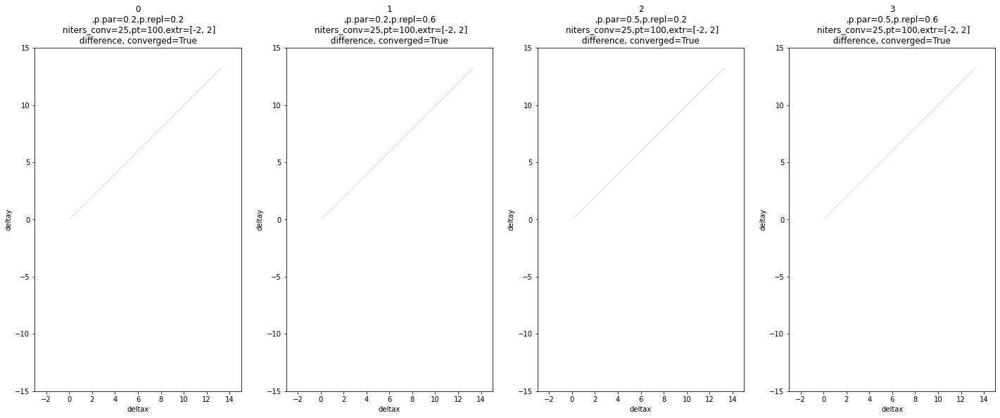

jid is 5
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_5_last.npy
jid is 6
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_6_last.npy
jid is 7
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_7_last.npy
jid is 8
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_8_last.npy


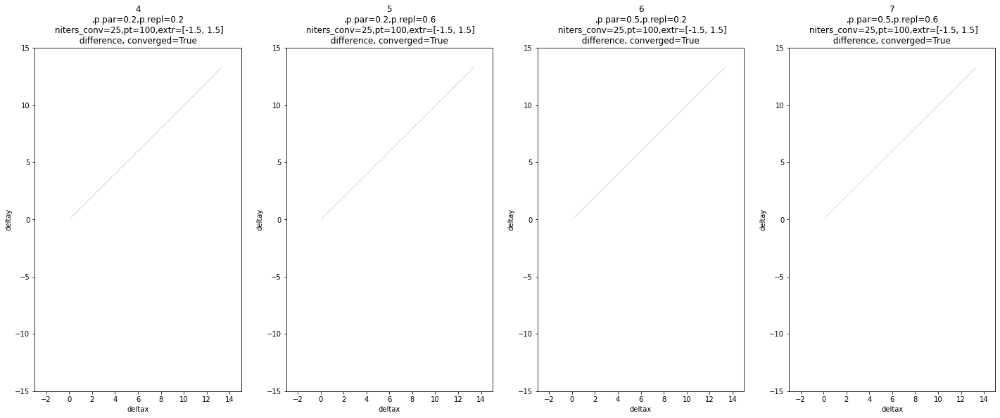

jid is 9
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_9_last.npy
jid is 10
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_10_last.npy
jid is 11
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_p_11_last.npy


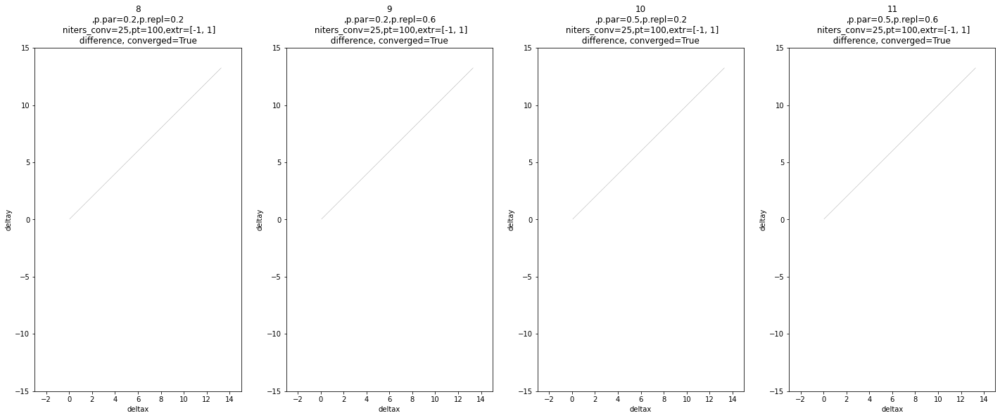

(1201, 721)
model=3_1_t=1f,2f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_15', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_14', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_21', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_20', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_12', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_13', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

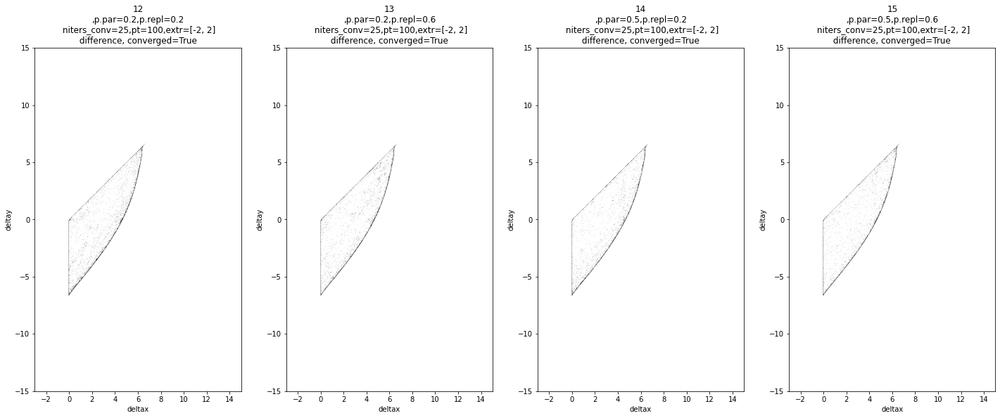

jid is 18
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_18_last.npy
jid is 19
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_19_last.npy
jid is 20
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_20_last.npy
jid is 21
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_21_last.npy


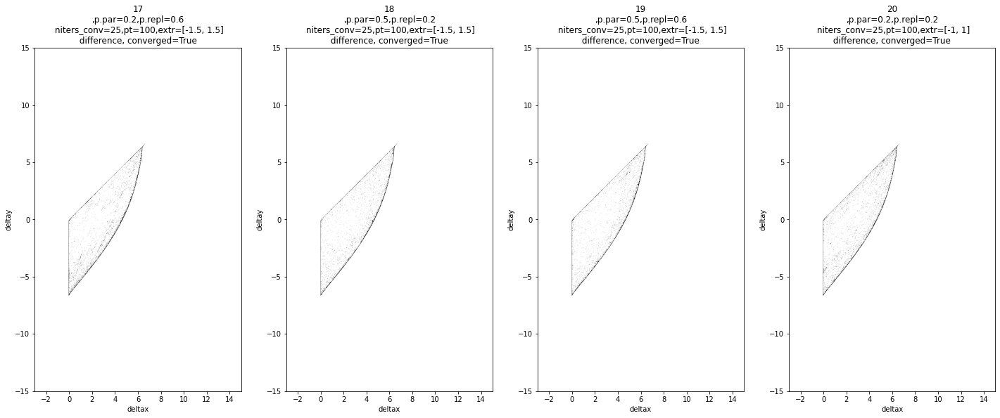

jid is 22
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_22_last.npy
jid is 23
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=p_m_23_last.npy


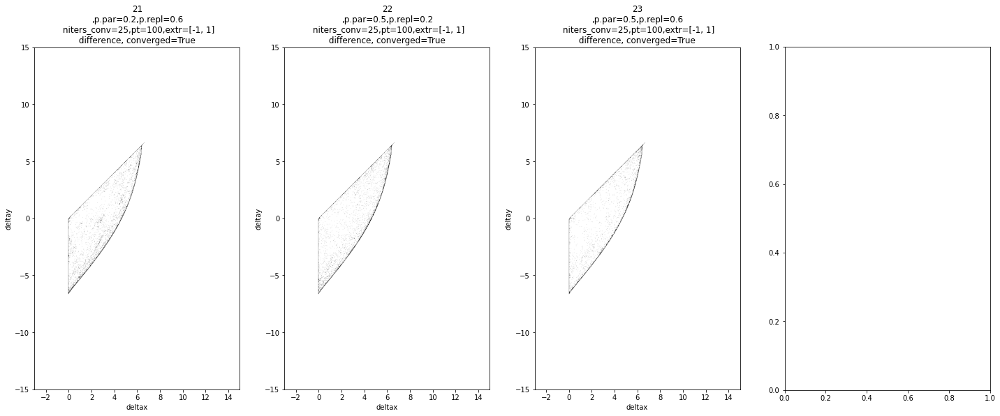

(1201, 721)
model=3_1_t=1f,2f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_26', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_27', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_31', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_30', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_32', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_33', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

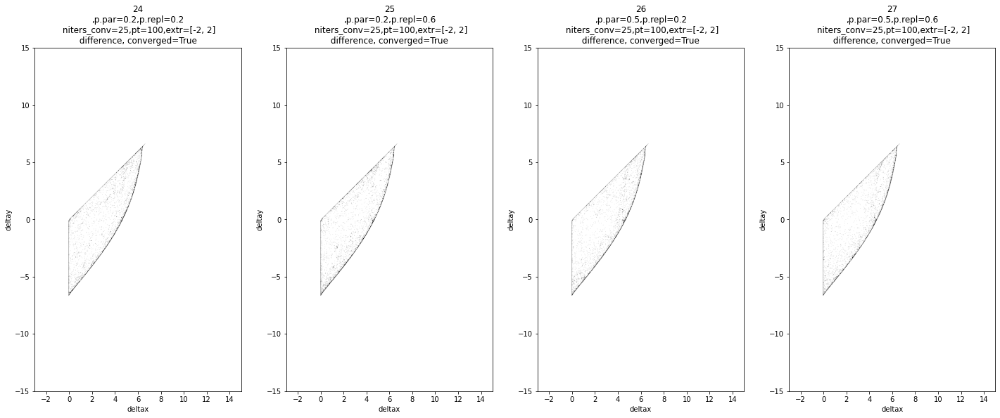

jid is 29
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_29_last.npy
jid is 30
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_30_last.npy
jid is 31
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_31_last.npy
jid is 32
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_32_last.npy


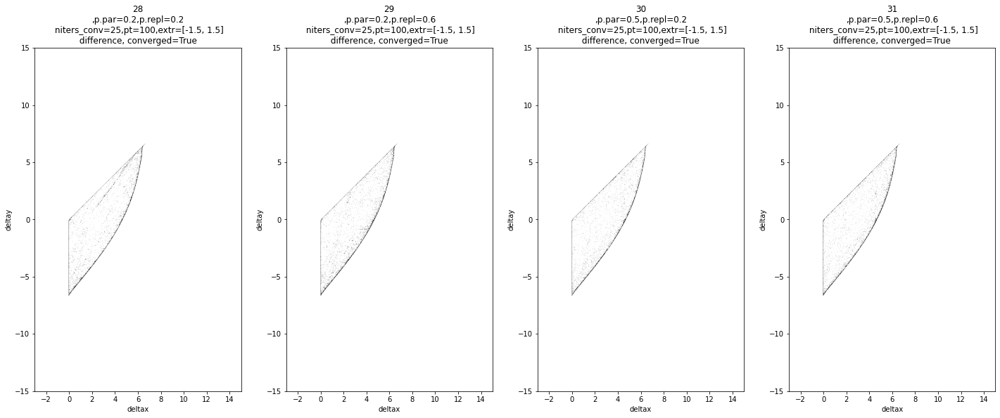

jid is 33
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_33_last.npy
jid is 34
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_34_last.npy
jid is 35
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1f,2f_d=m_p_35_last.npy


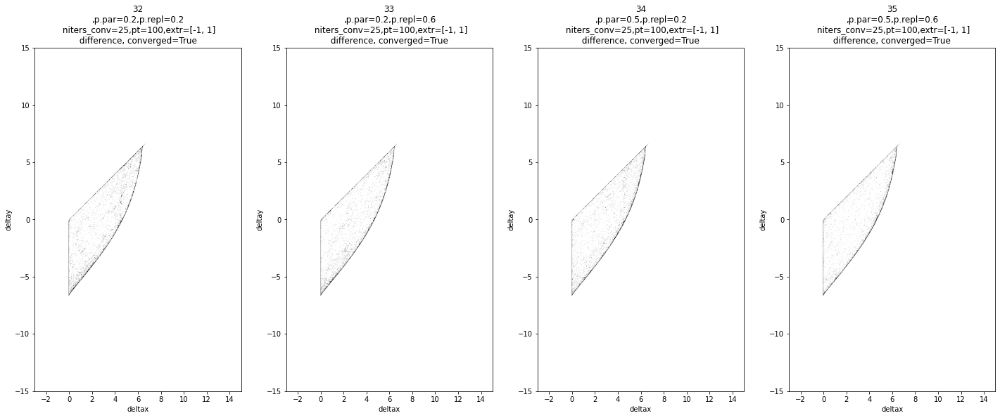

(1201, 721)
model=3_1_t=1r,2f_d=p_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_45', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_44', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_38', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_39', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_42', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_43', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

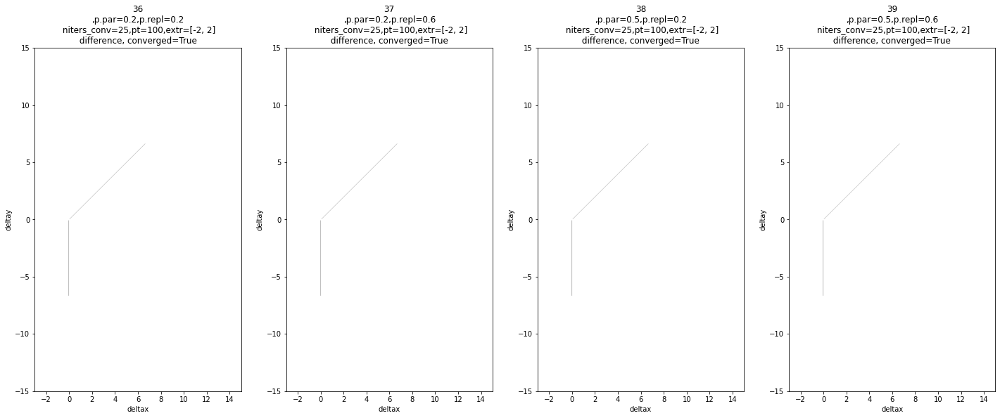

jid is 41
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_41_last.npy
jid is 42
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_42_last.npy
jid is 43
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_43_last.npy
jid is 44
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_44_last.npy


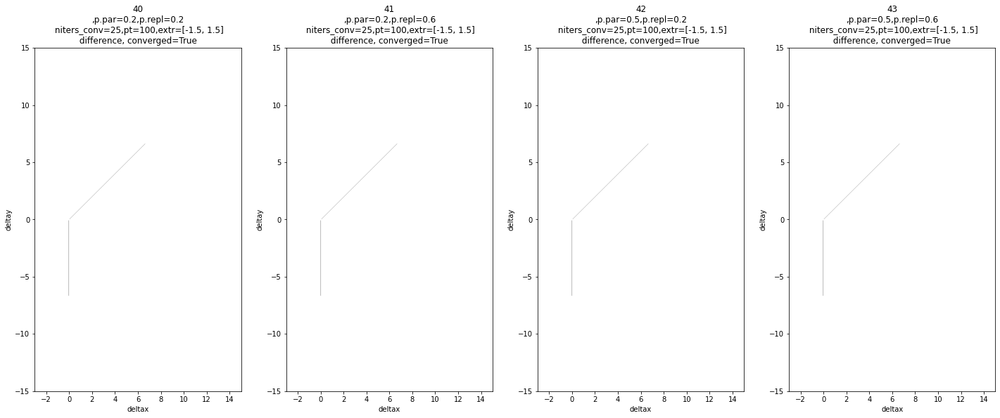

jid is 45
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_45_last.npy
jid is 46
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_46_last.npy
jid is 47
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=p_p_47_last.npy


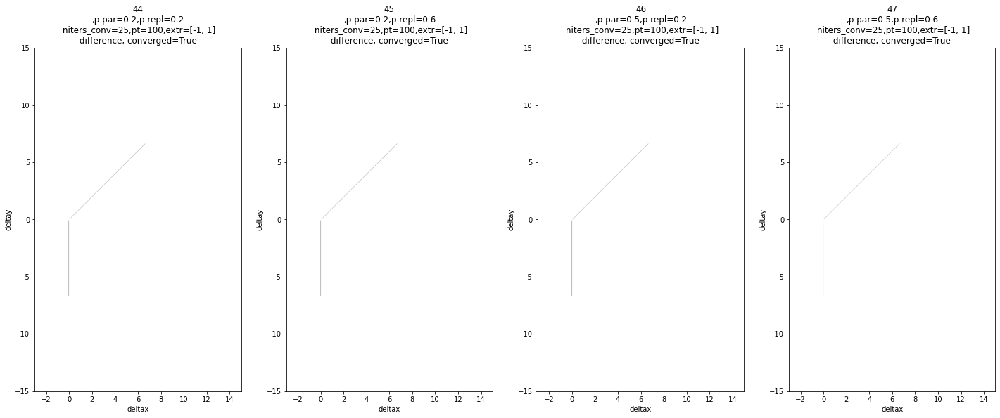

(1201, 721)
model=3_1_t=1r,2f_d=m_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_48', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_49', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_55', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_54', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_58', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_59', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

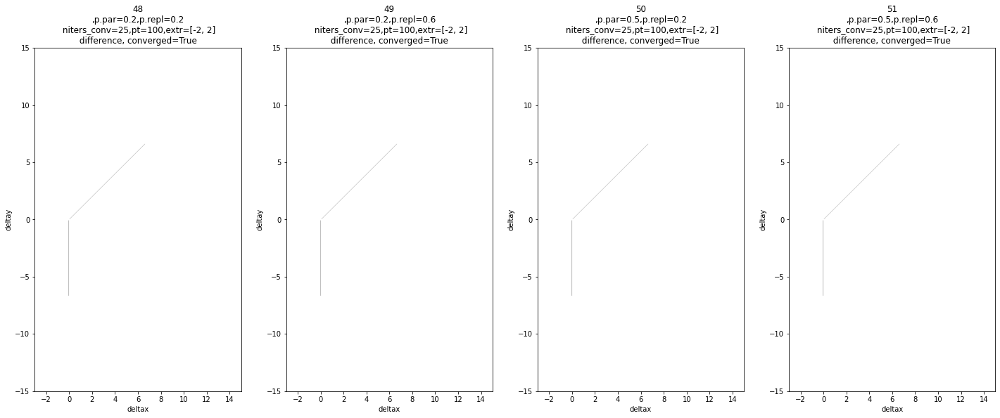

jid is 53
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_53_last.npy
jid is 54
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_54_last.npy
jid is 55
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_55_last.npy
jid is 56
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_56_last.npy


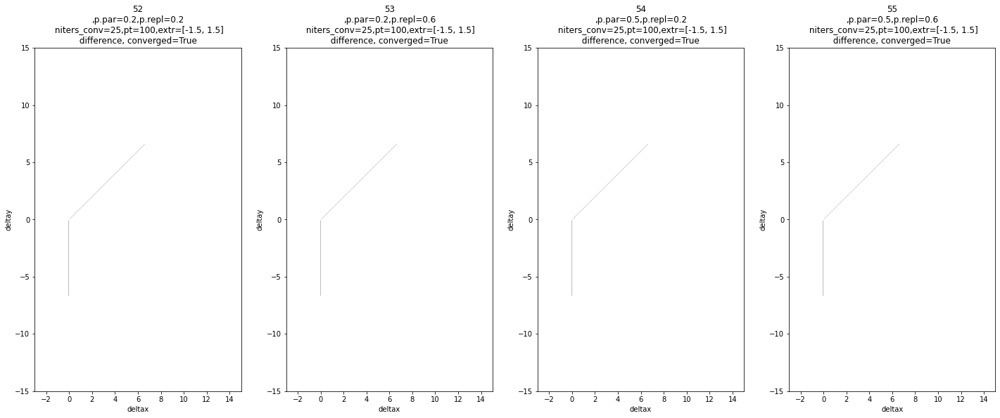

jid is 57
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_57_last.npy
jid is 58
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_58_last.npy
jid is 59
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,2f_d=m_m_59_last.npy


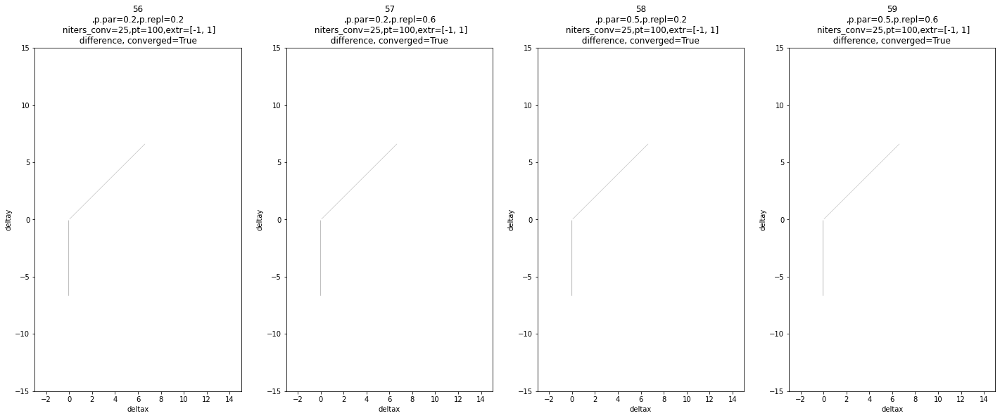

(1201, 721)
model=3_1_t=1r,3f_d=p_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_62', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_63', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_68', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_69', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_65', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_64', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

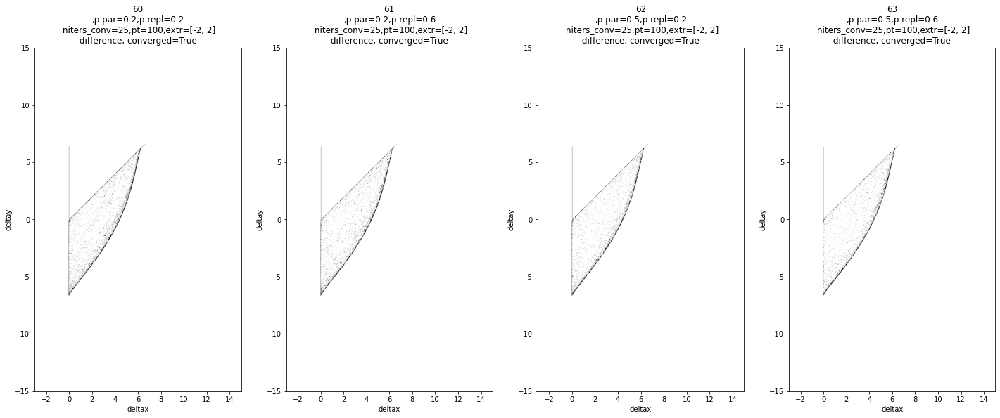

jid is 65
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_65_last.npy
jid is 66
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_66_last.npy
jid is 67
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_67_last.npy
jid is 68
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_68_last.npy


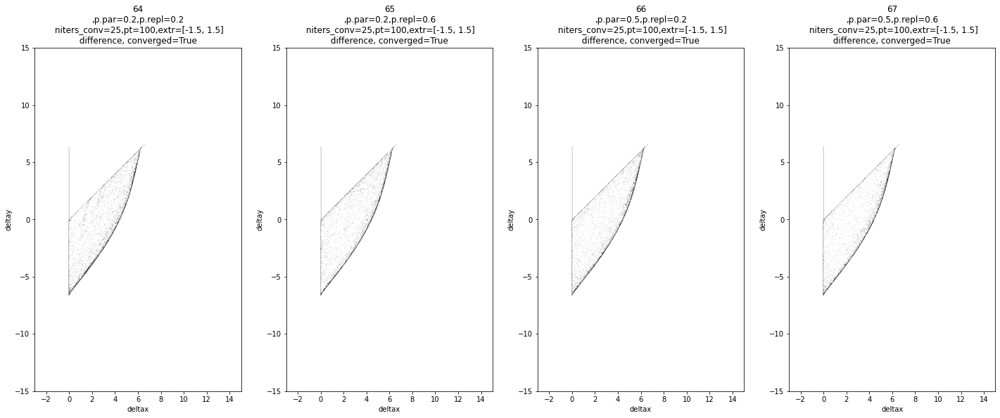

jid is 69
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_69_last.npy
jid is 70
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_70_last.npy
jid is 71
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=p_p_71_last.npy


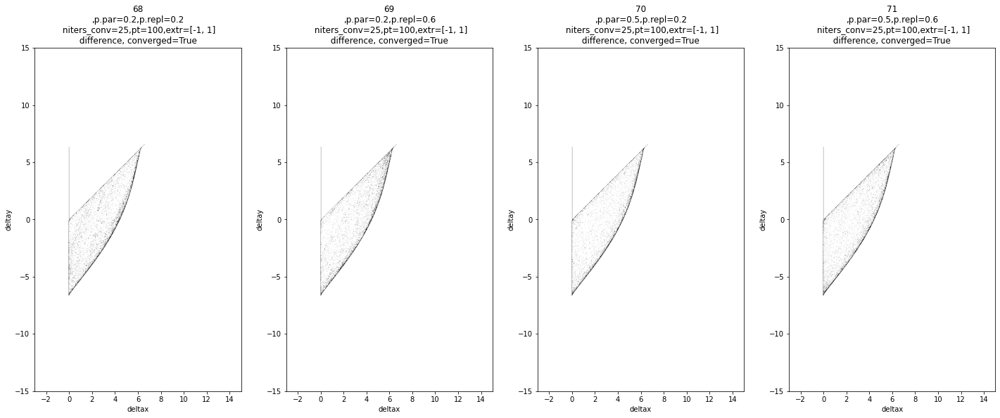

(1201, 721)
model=3_1_t=1r,3f_d=m_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_80', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_81', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_78', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_79', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_72', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_73', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

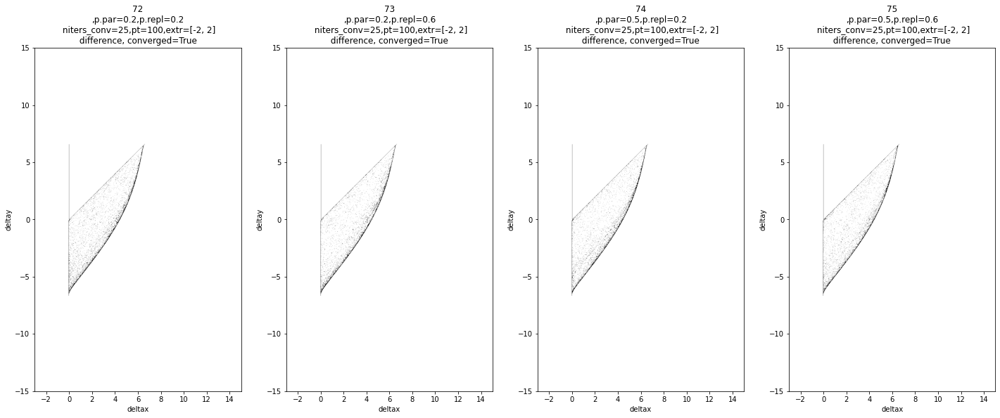

jid is 77
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_77_last.npy
jid is 78
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_78_last.npy
jid is 79
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_79_last.npy
jid is 80
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_80_last.npy


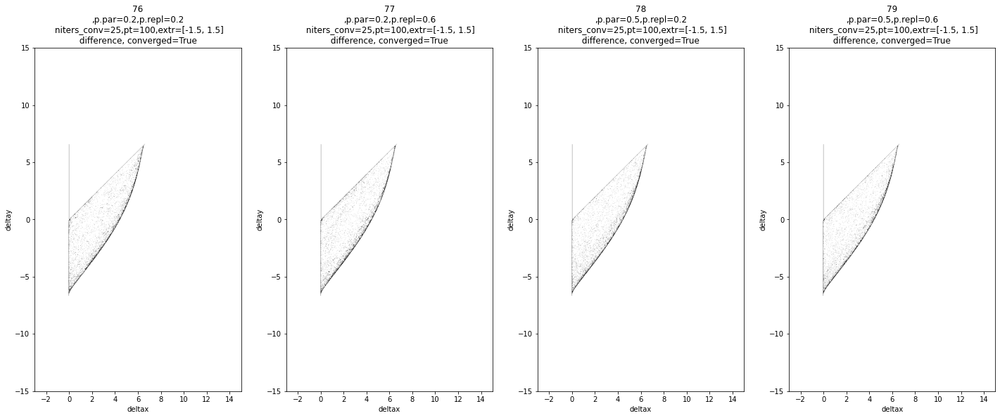

jid is 81
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_81_last.npy
jid is 82
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_82_last.npy
jid is 83
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_1_t=1r,3f_d=m_m_83_last.npy


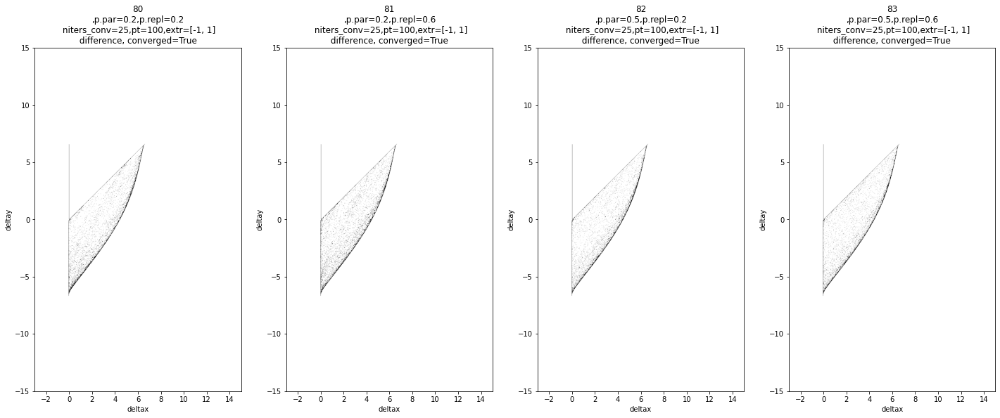

(1201, 721)
model=3_2_t=1f,2f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_84', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_92', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_93', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_95', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_94', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_88', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic

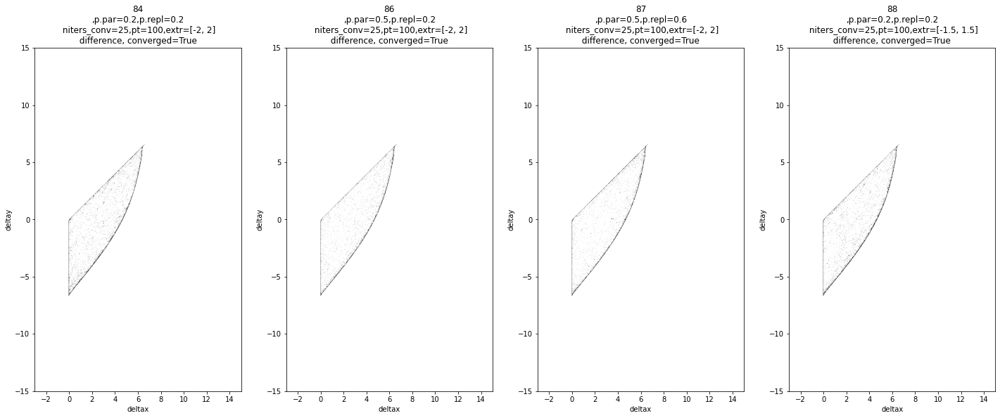

jid is 90
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_90_last.npy
jid is 91
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_91_last.npy
jid is 92
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_92_last.npy
jid is 93
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_93_last.npy


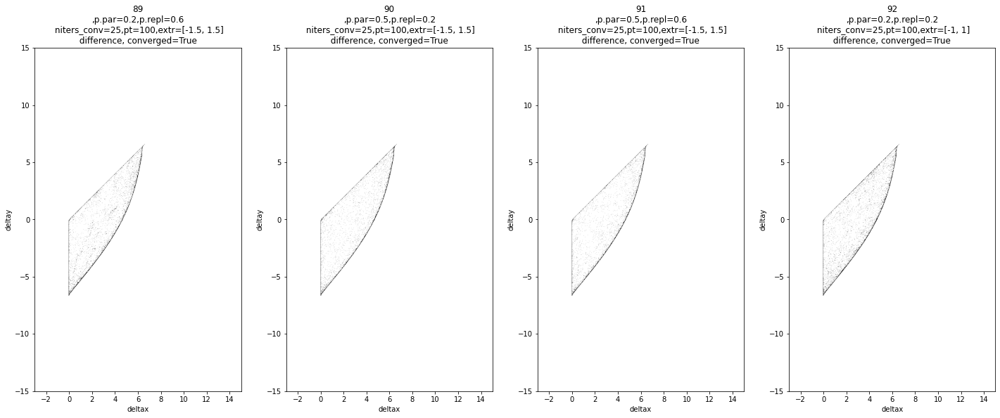

jid is 94
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_94_last.npy
jid is 95
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=p_m_95_last.npy


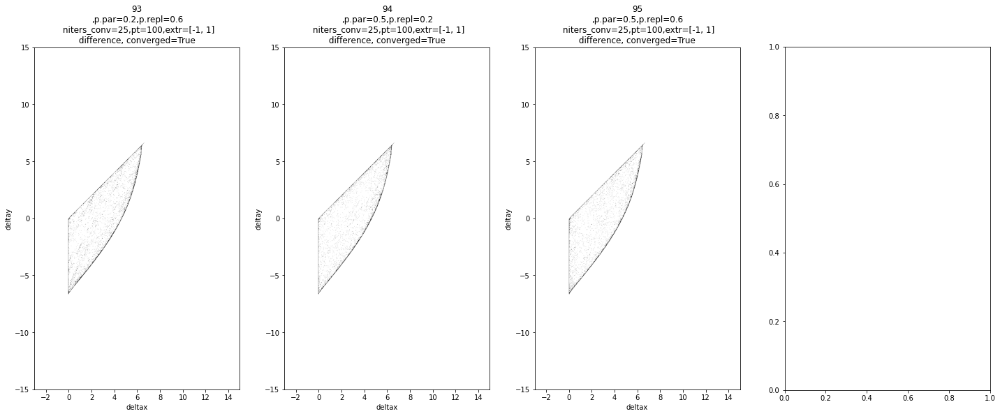

(1201, 721)
model=3_2_t=1f,2f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_107', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_106', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_98', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_99', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_100', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_101', '/Users/rosamartinezcorral/Dropbox (HMS)/data/m

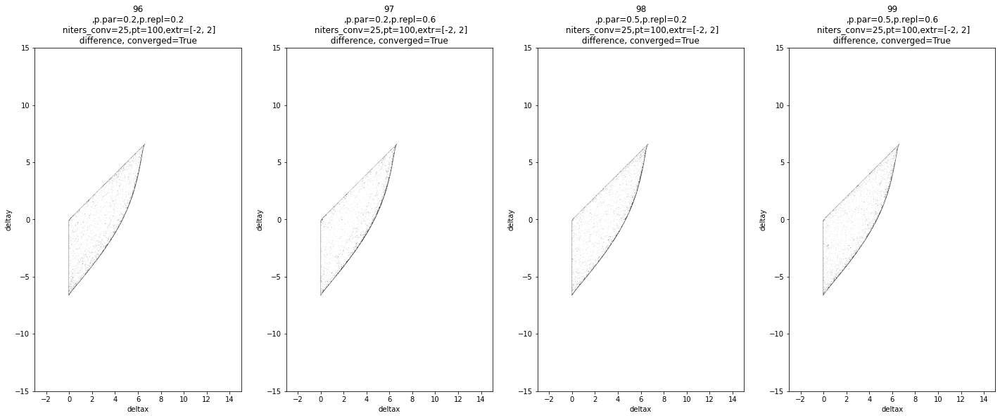

jid is 101
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_101_last.npy
jid is 102
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_102_last.npy
jid is 103
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_103_last.npy
jid is 104
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_104_last.npy


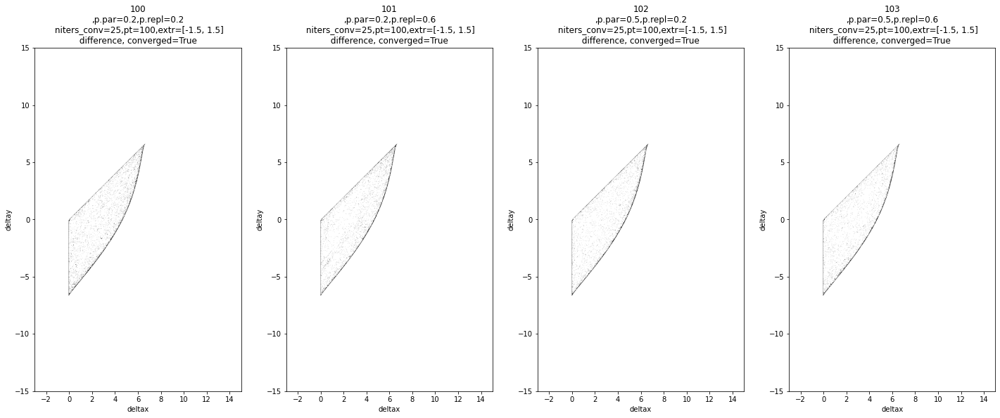

jid is 105
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_105_last.npy
jid is 106
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_106_last.npy
jid is 107
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2f_d=m_p_107_last.npy


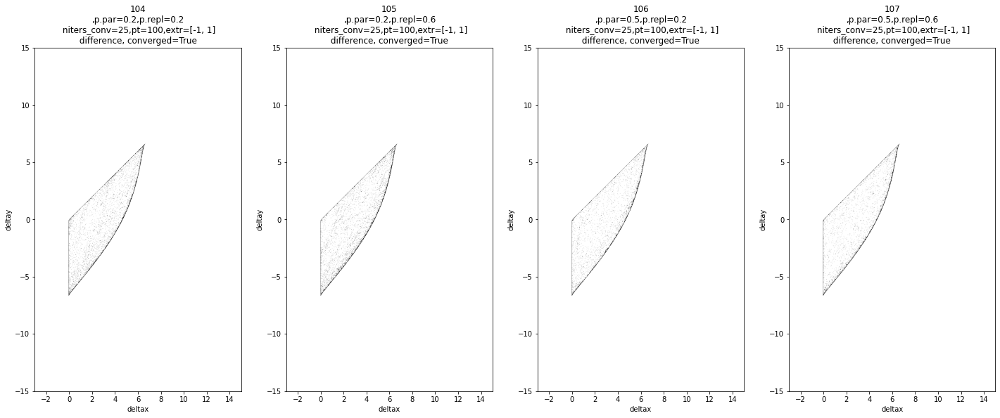

(1201, 721)
model=3_2_t=1f,2r_d=p_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_109', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_108', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_114', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_115', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_119', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_118', '/Users/rosamartinezcorral/Dropbox (HMS)/data

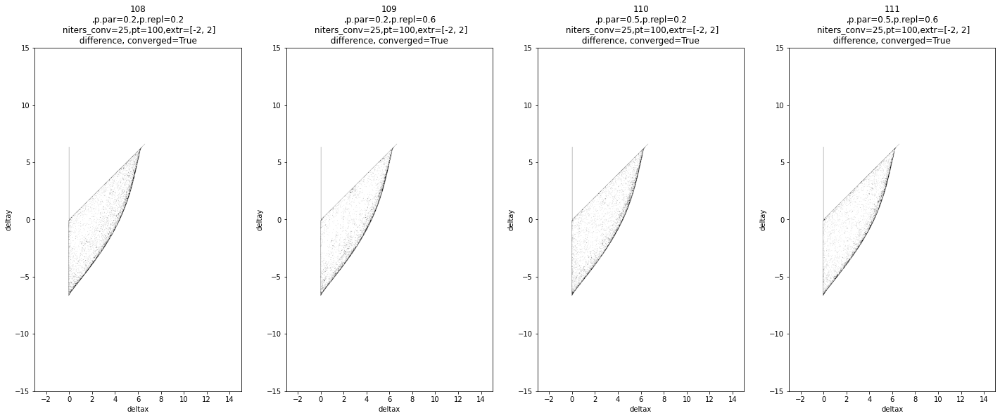

jid is 113
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_113_last.npy
jid is 114
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_114_last.npy
jid is 115
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_115_last.npy
jid is 116
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_116_last.npy


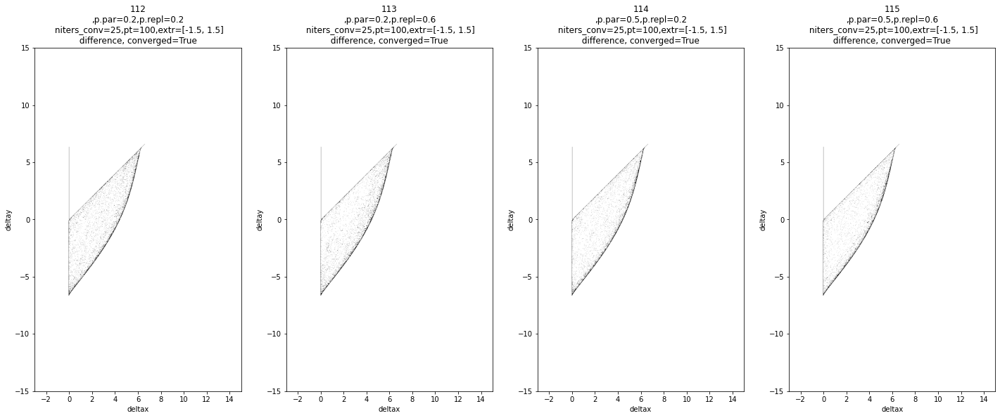

jid is 118
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_118_last.npy
jid is 119
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=p_p_119_last.npy


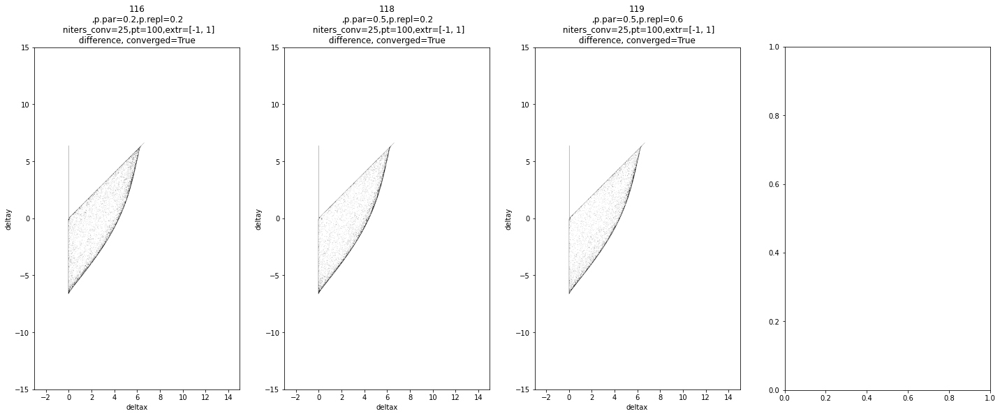

(1201, 721)
model=3_2_t=1f,2r_d=m_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_121', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_120', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_131', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_130', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_126', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_127', '/Users/rosamartinezcorral/Dropbox (HMS)/data

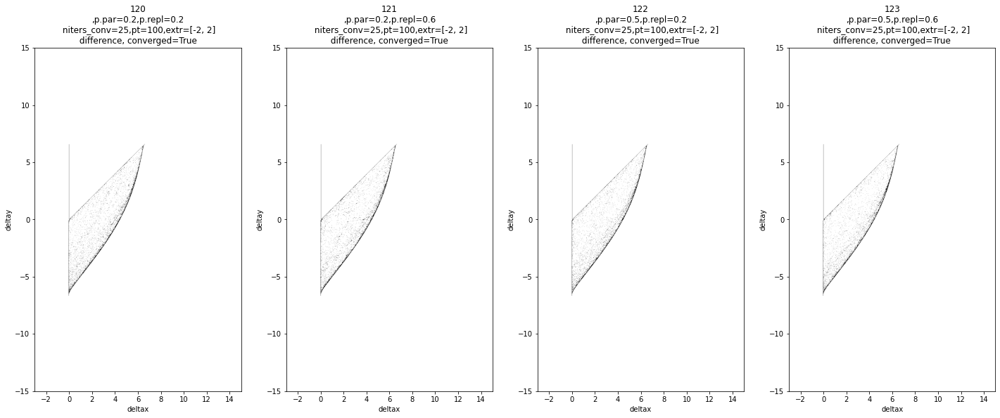

jid is 125
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_125_last.npy
jid is 126
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_126_last.npy
jid is 127
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_127_last.npy
jid is 129
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_129_last.npy


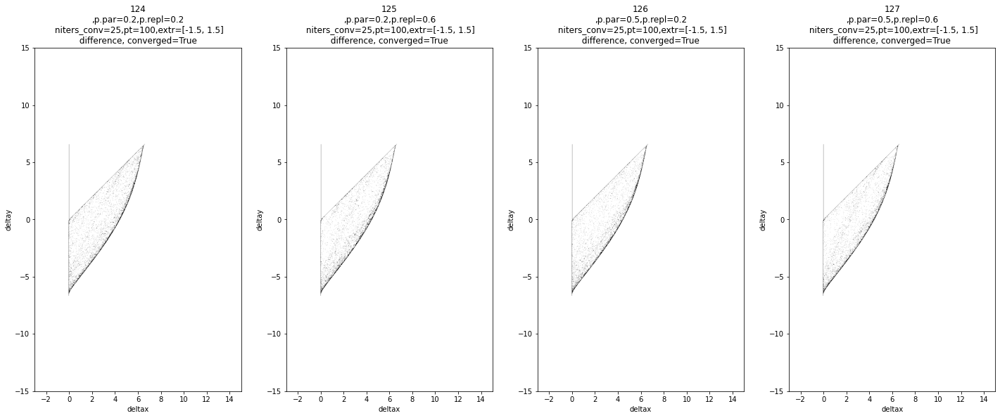

jid is 130
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_130_last.npy
jid is 131
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,2r_d=m_m_131_last.npy


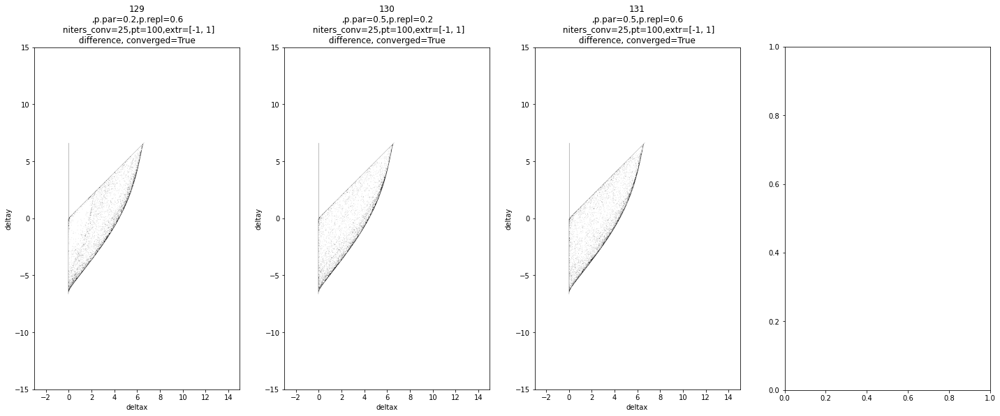

(1201, 721)
model=3_2_t=1f,3f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_132', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_133', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_138', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_139', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_142', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_143', '/Users/rosamartinezcorral/Dropbox (HMS)/data

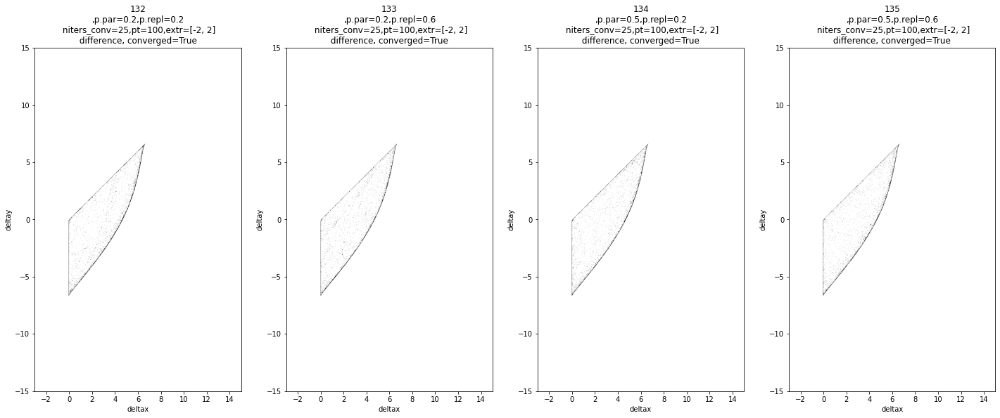

jid is 137
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_137_last.npy
jid is 138
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_138_last.npy
jid is 139
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_139_last.npy
jid is 140
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_140_last.npy


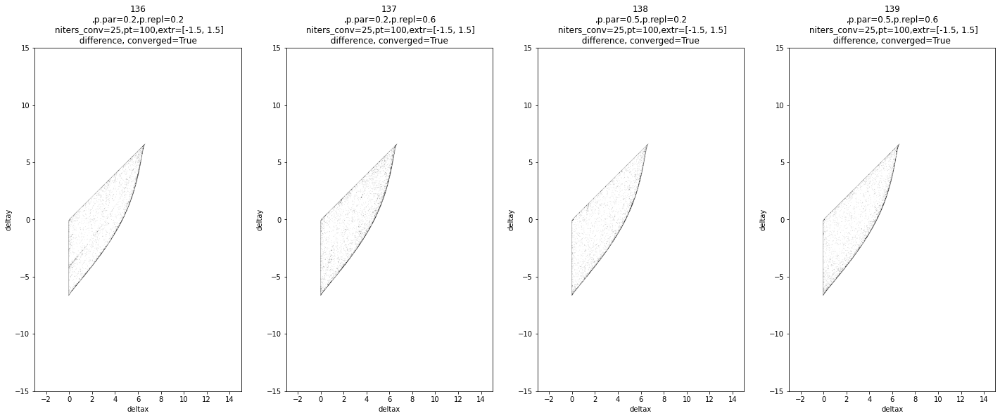

jid is 141
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_141_last.npy
jid is 142
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_142_last.npy
jid is 143
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=m_p_143_last.npy


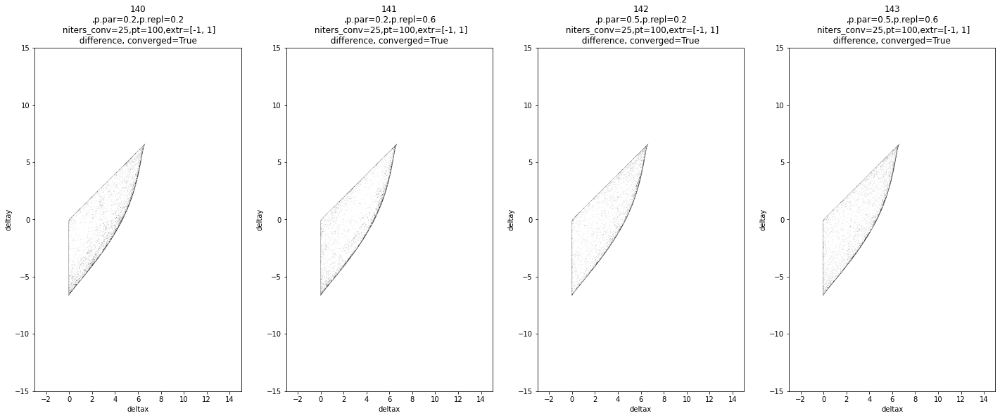

(1201, 721)
model=3_2_t=1f,3f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_144', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_145', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_153', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_152', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_154', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_149', '/Users/rosamartinezcorral/Dropbox (HMS)/data

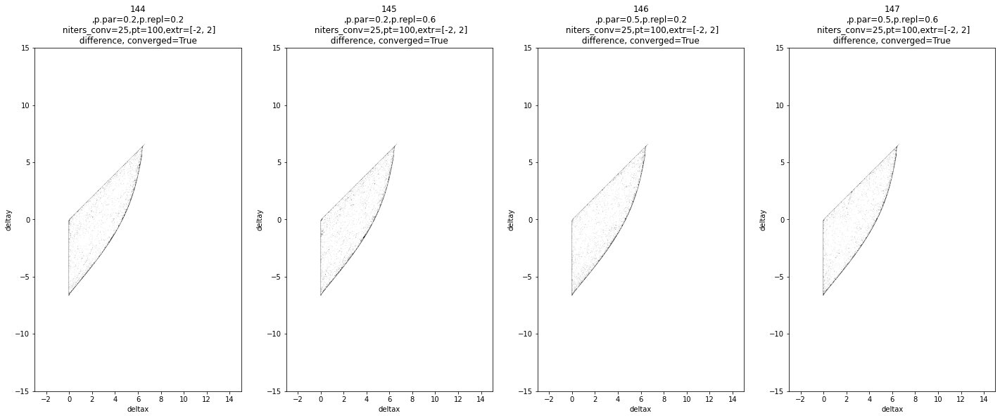

jid is 149
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_149_last.npy
jid is 150
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_150_last.npy
jid is 151
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_151_last.npy
jid is 152
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_152_last.npy


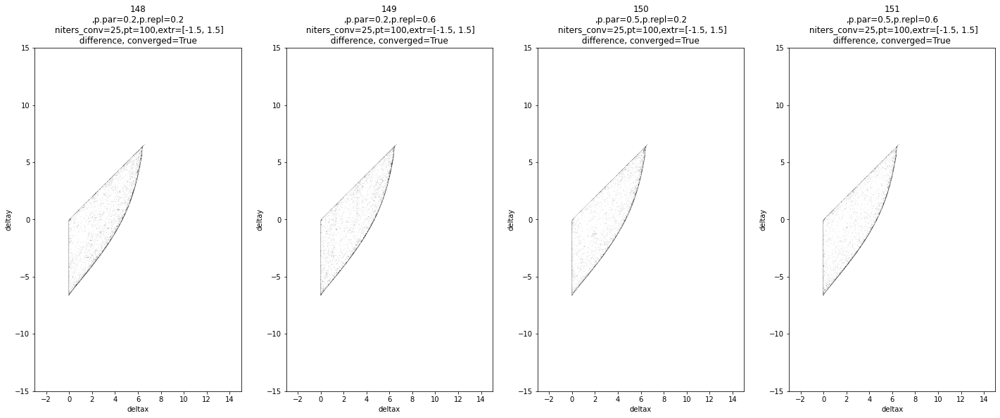

jid is 153
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_153_last.npy
jid is 154
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_2_t=1f,3f_d=p_m_154_last.npy


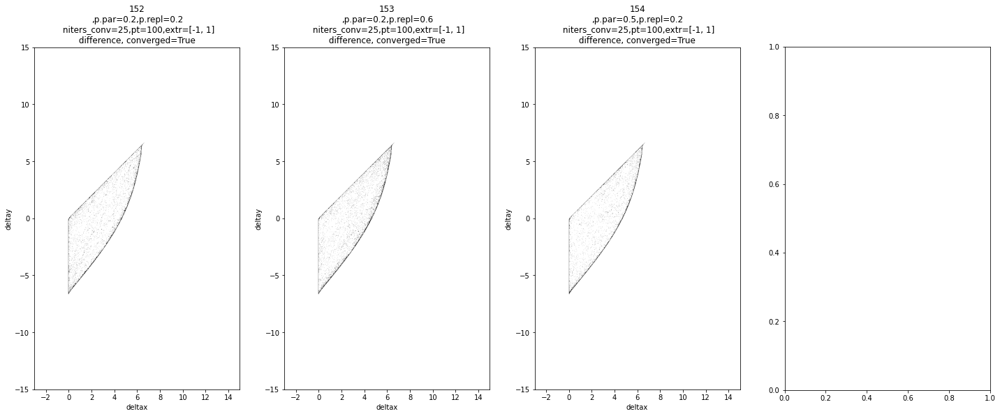

(1201, 721)
model=3_12_t=1f,2f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_166', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_167', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_158', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_159', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_165', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_164', '/Users/rosamartinezcorral/Dropbox (HM

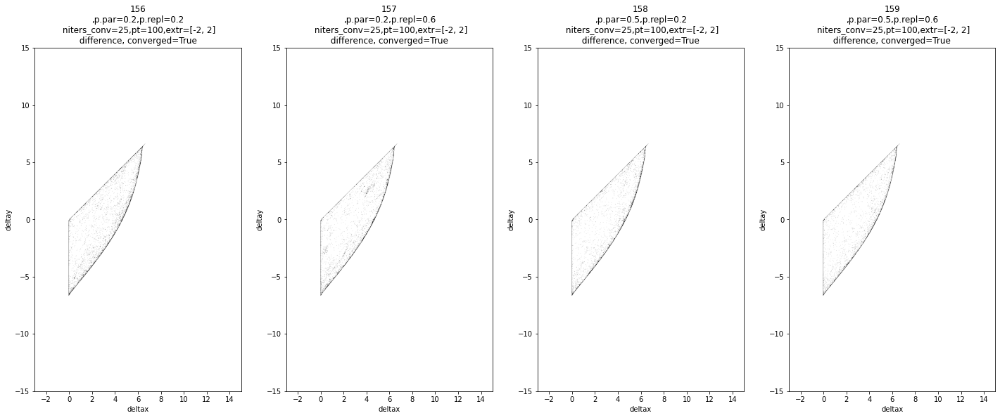

jid is 165
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_165_last.npy
jid is 166
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_166_last.npy
jid is 167
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=p_m_167_last.npy


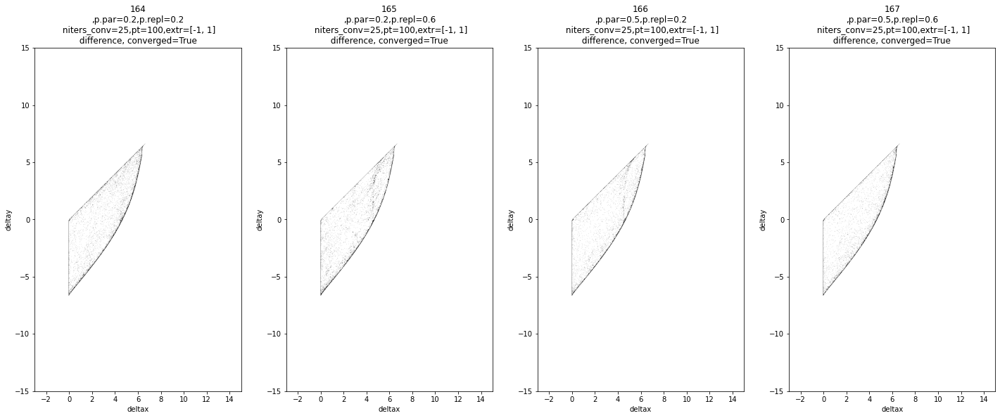

(1201, 721)
model=3_12_t=1f,2f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_170', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_171', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_177', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_176', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_173', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_172', '/Users/rosamartinezcorral/Dropbox (HM

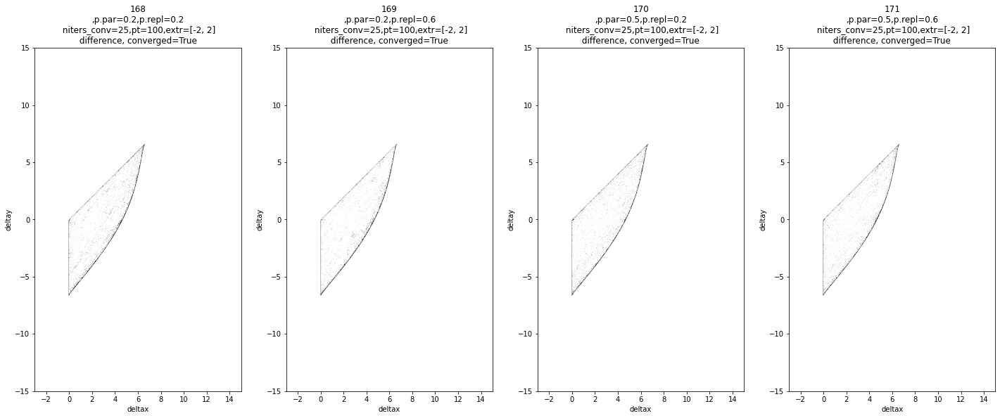

jid is 173
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_173_last.npy
jid is 174
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_174_last.npy
jid is 175
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_175_last.npy
jid is 176
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_176_last.npy


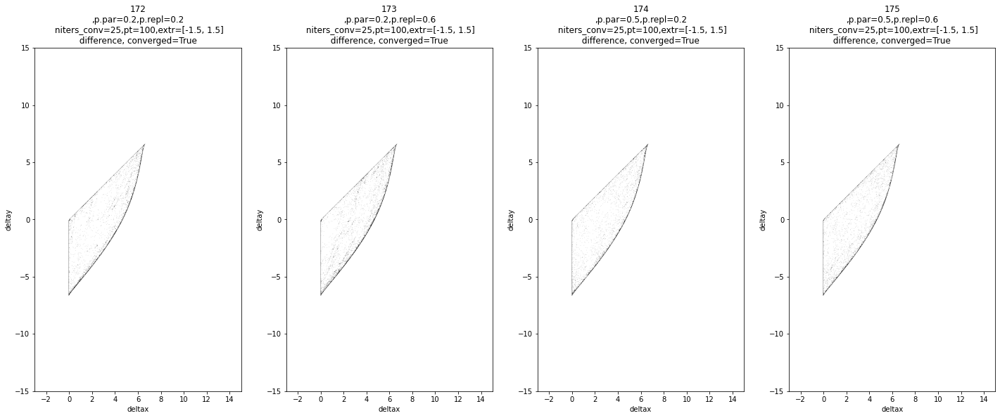

jid is 177
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_177_last.npy
jid is 178
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_178_last.npy
jid is 179
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,2f_d=m_p_179_last.npy


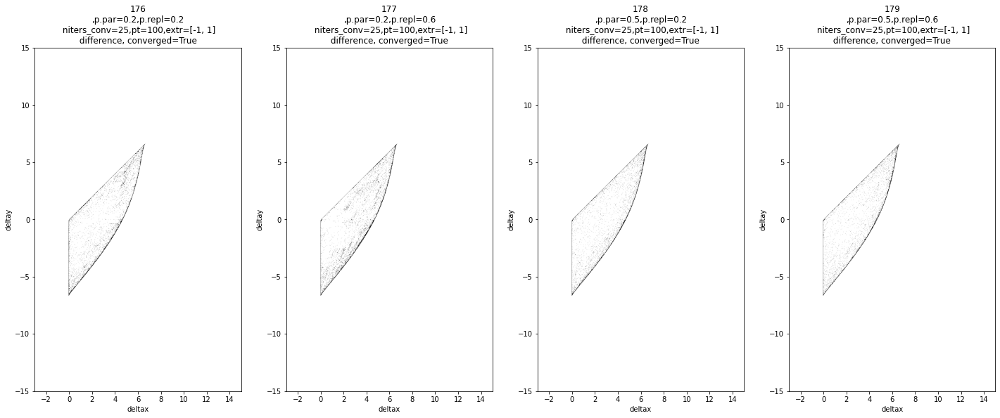

(1201, 721)
model=3_12_t=1f,3f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_182', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_183', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_188', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_185', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_184', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_181', '/Users/rosamartinezcorral/Dropbox (HM

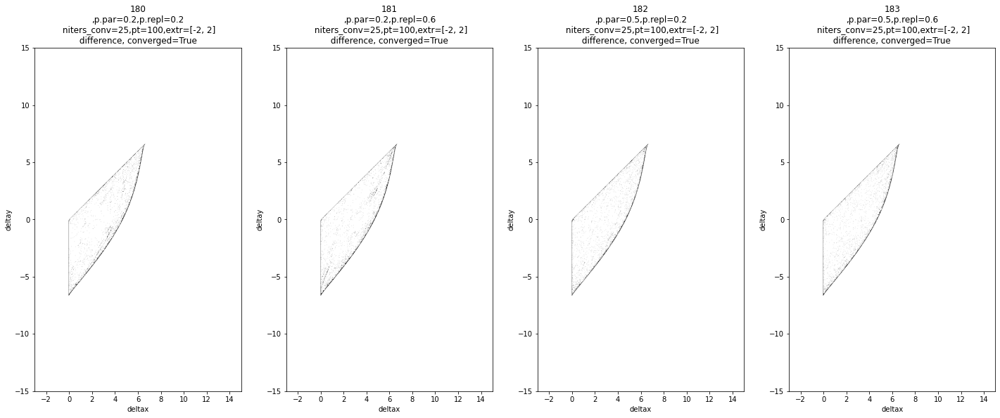

jid is 185
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_185_last.npy
jid is 187
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_187_last.npy
jid is 188
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_188_last.npy
jid is 191
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=p_m_191_last.npy


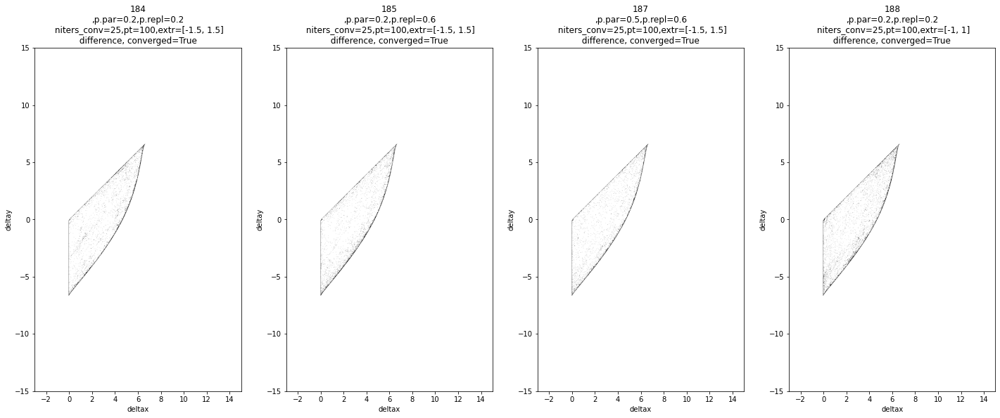

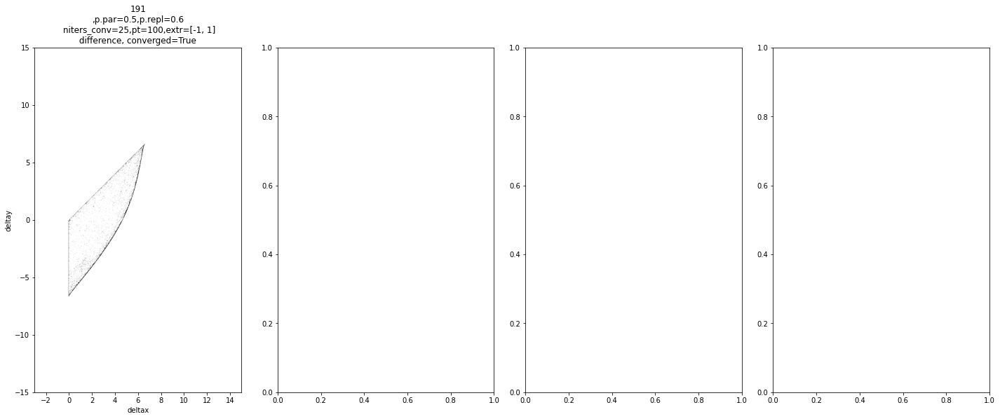

(1201, 721)
model=3_12_t=1f,3f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_202', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_203', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_194', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_195', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_199', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_198', '/Users/rosamartinezcorral/Dropbox (HM

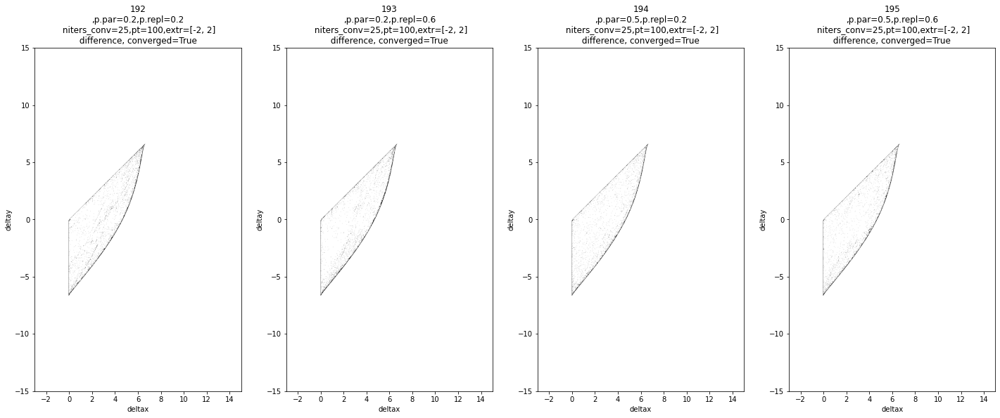

jid is 197
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_197_last.npy
jid is 198
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_198_last.npy
jid is 199
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_199_last.npy
jid is 200
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_200_last.npy


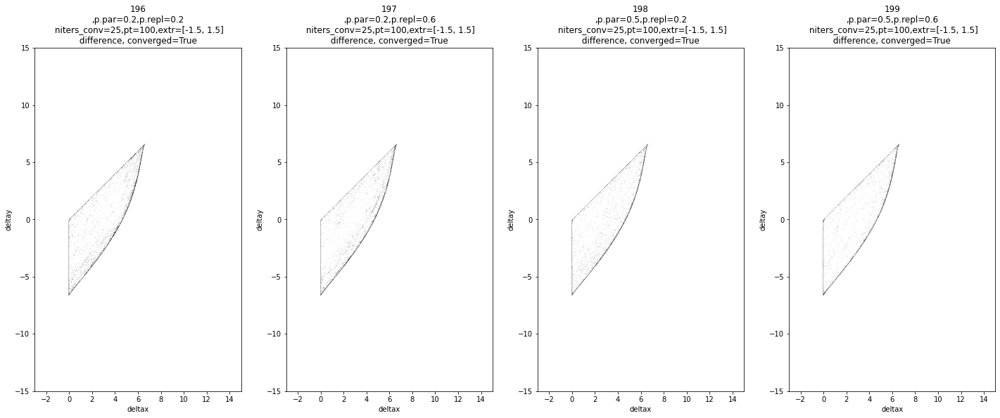

jid is 201
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_201_last.npy
jid is 202
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_202_last.npy
jid is 203
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring/final_results/mat_model=3_12_t=1f,3f_d=m_p_203_last.npy


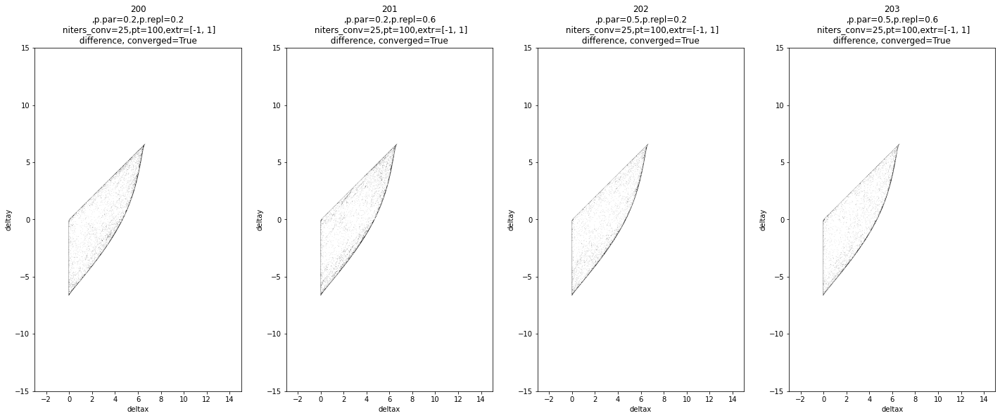

(1201, 721)
model=5_1234_t=1f,2f_d=p_m
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_207', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_209', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_208', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_206', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_215', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_212', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/

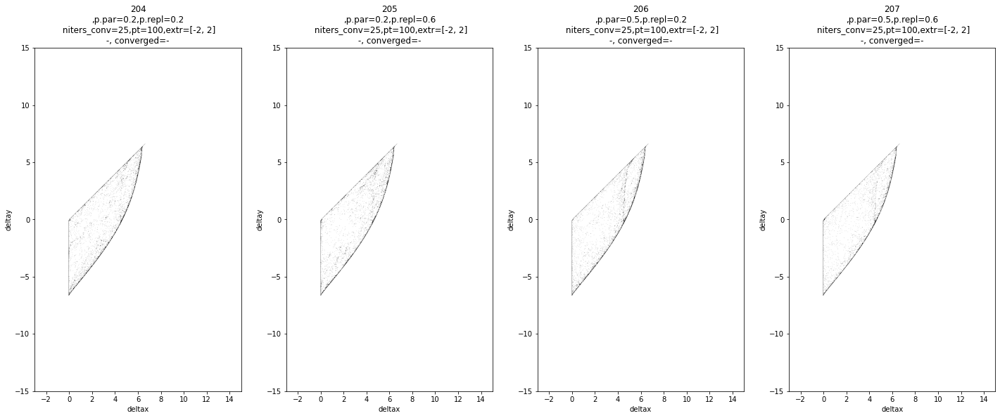

jid is 209
209 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_209
jid is 210
210 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_210
jid is 211
211 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_211
jid is 212
212 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_212


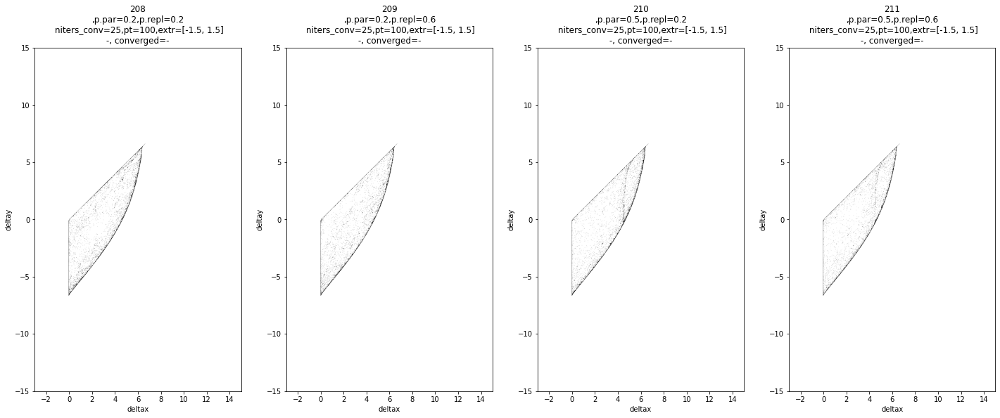

jid is 213
213 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_213
jid is 214
214 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_214
jid is 215
215 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=1f,2f_d=p_m_out_215


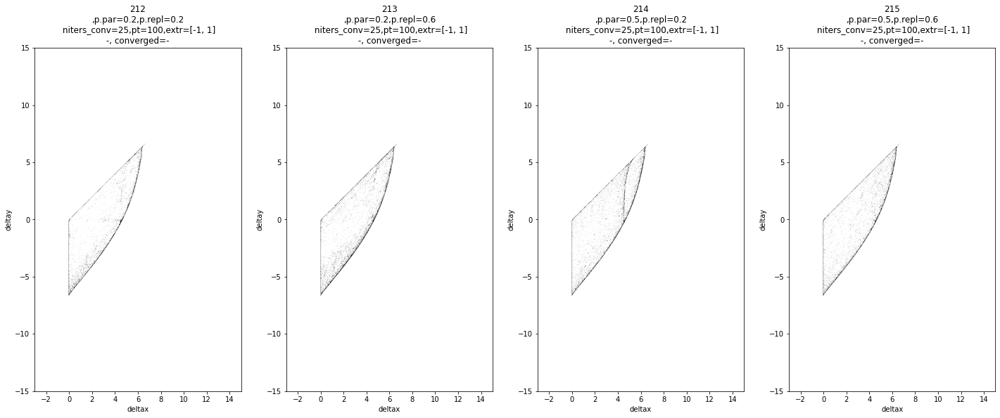

(1201, 721)
model=5_1234_t=2f,4f_d=m_p
folders are
['/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_219', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_217', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_216', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_218', '/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_220']
Processing [216 217 218 219 220]
jid is 216
216 unfinished
/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-duality/2022_05_12_scan_up_down_3st_5st_newscoring_scratch/model=5_1234_t=2f,4f_d=m_p_out_216
jid 

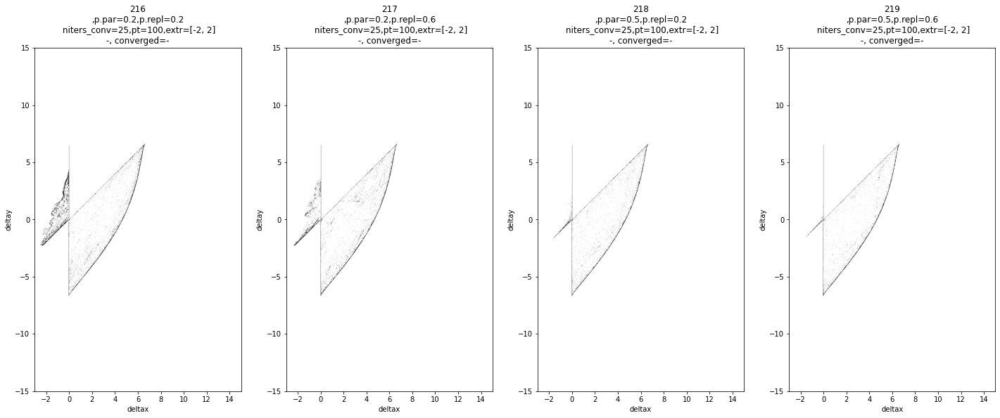

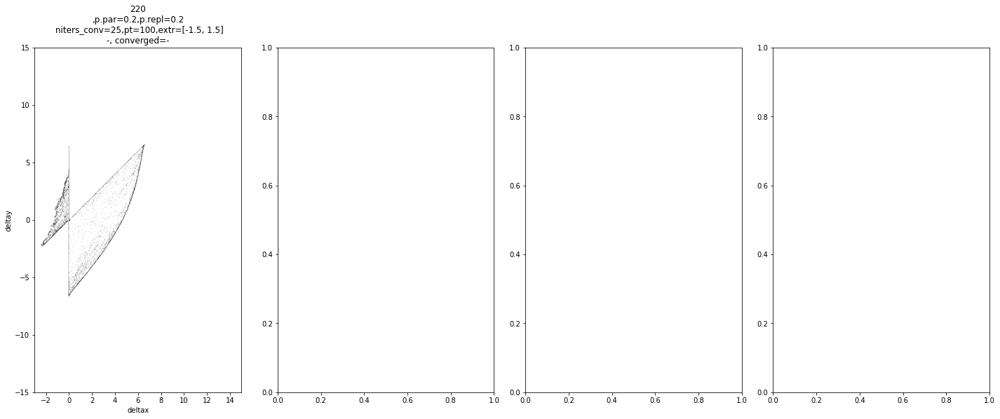

(1201, 721)
model=5_1234_t=2r,4f_d=p_p
folders are
[]
Processing []


<Figure size 432x288 with 0 Axes>

model=5_1234_t=1r,3f_d=m_m
folders are
[]
Processing []


<Figure size 432x288 with 0 Axes>

In [5]:
allouts=dict()

init=0
for c_,case in enumerate(allcases):
    
    fldr=folder1
    #fldr=os.path.join(folder,case)
    model,transitions,direction=case
    name="model=%s_t=%s_d=%s"%(model,",".join(transitions),direction)
    basename=name
    print(basename)
    out=AnalyseBoundarysearch.plot_boundaries_search(fldr=fldr,getallpoints=True,printtocheck=False,final=True,unfinishedfolder=folder2,septime=" ",jid_num=jid,basename=basename,xlabel='deltax',ylabel='deltay')
    allouts[name]=out
    


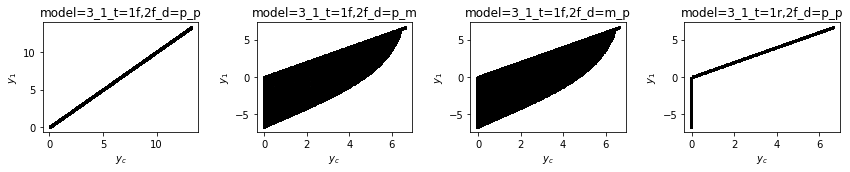

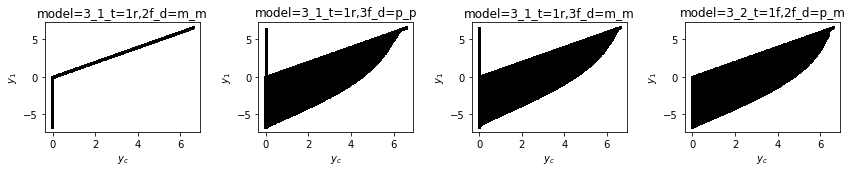

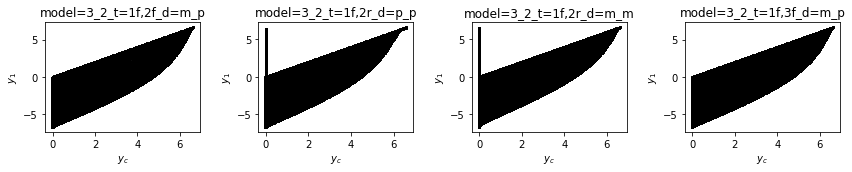

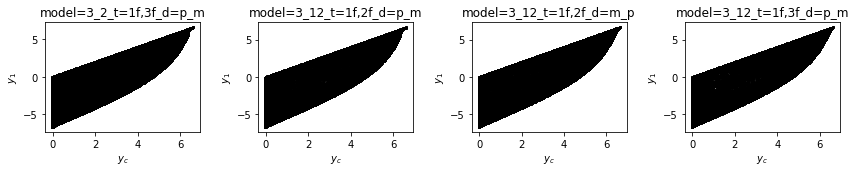

None for model model=5_1234_t=2r,4f_d=p_p


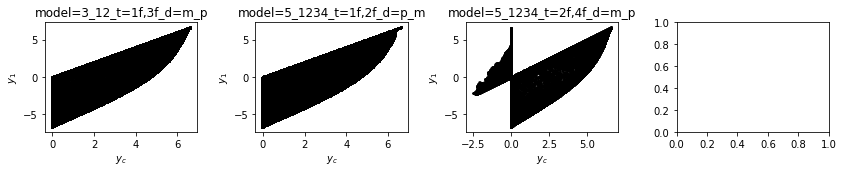

None for model model=5_1234_t=1r,3f_d=m_m


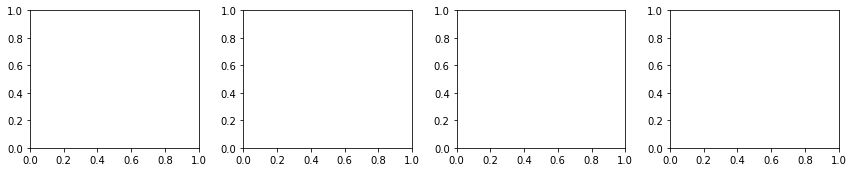

In [6]:
for m,model in enumerate(allouts.keys()):
    if m%4==0:
        if m>0:
            plt.tight_layout()
            plt.show()
        fig,axes=plt.subplots(1,4,figsize=(12,2.5))
    df=allouts[model][1]
    if df is None:
        print("None for model", model)
    else:
        x=df["col"].values
        y=df["row"].values

        ax=axes[m%4]
        ax.scatter(x,y,color="k",s=2)
        ax.set_title(model)
        ax.set_xlabel("$y_c$")
        ax.set_ylabel("$y_1$")
plt.tight_layout()
plt.show()

saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1f,2f_d=p_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1f,2f_d=p_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1f,2f_d=m_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1r,2f_d=p_p.csv


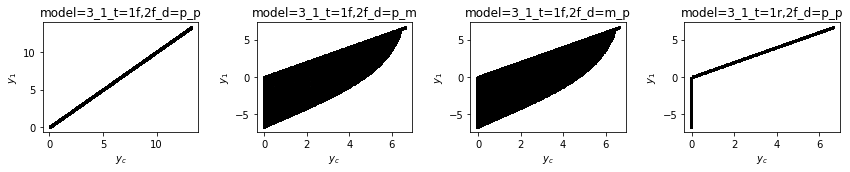

saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1r,2f_d=m_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1r,3f_d=p_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_1_t=1r,3f_d=m_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,2f_d=p_m.csv


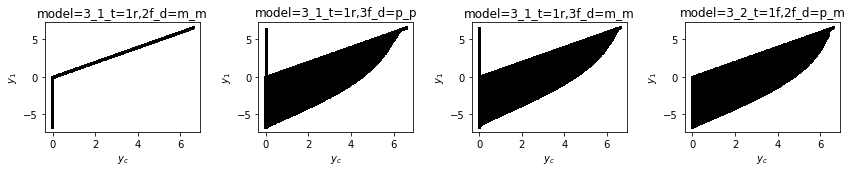

saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,2f_d=m_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,2r_d=p_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,2r_d=m_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,3f_d=m_p.csv


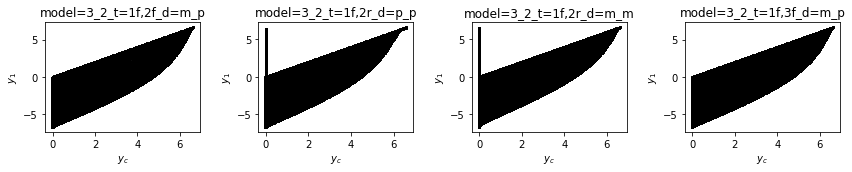

saving data to file ./clustersearch/dfs_polcyclemodels/model=3_2_t=1f,3f_d=p_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_12_t=1f,2f_d=p_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_12_t=1f,2f_d=m_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=3_12_t=1f,3f_d=p_m.csv


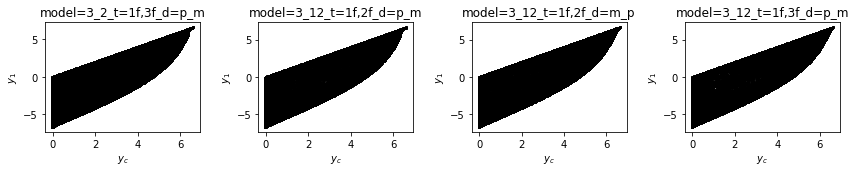

saving data to file ./clustersearch/dfs_polcyclemodels/model=3_12_t=1f,3f_d=m_p.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=5_1234_t=1f,2f_d=p_m.csv
saving data to file ./clustersearch/dfs_polcyclemodels/model=5_1234_t=2f,4f_d=m_p.csv
None for model model=5_1234_t=2r,4f_d=p_p


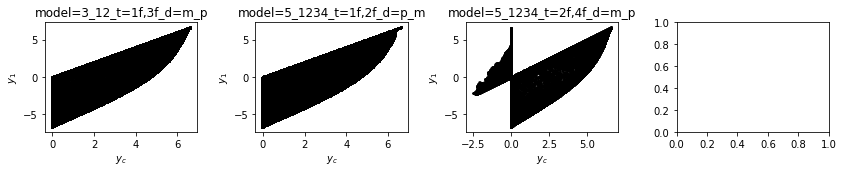

None for model model=5_1234_t=1r,3f_d=m_m


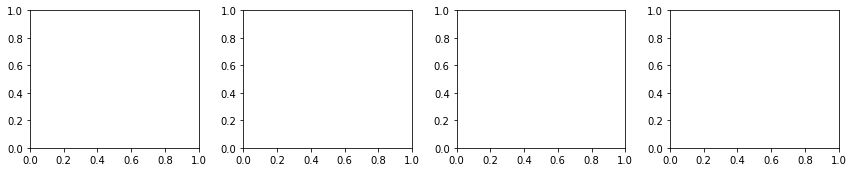

In [9]:
#now for each model, select one grid cell only, and save that dataframe
foldersave="./clustersearch/dfs_polcyclemodels"
if not os.path.isdir(foldersave):
    os.mkdir(foldersave)

#the grid used for the boundary search
stepx=0.025
x_ar=np.arange(-3,15+stepx,stepx)
stepy=0.025
y_ar=np.arange(-15,15+stepy,stepy)

for m,model in enumerate(allouts.keys()):
    fname=os.path.join(foldersave,model+".csv")
    if m%4==0:
        if m>0:
            plt.tight_layout()
            plt.show()
        fig,axes=plt.subplots(1,4,figsize=(12,2.5))
    df=allouts[model][1]
    if df is None:
        print("None for model", model)
    else:
        np.random.seed(1)
        x=df["col"].values
        y=df["row"].values
        #now select 1 for each cell:
        cut_x=pd.cut(x,x_ar,labels=np.arange(len(x_ar)-1))
        x_l=cut_x.to_list()
        cut_y=pd.cut(y,y_ar,labels=np.arange(len(y_ar)-1))
        y_l=cut_y.to_list()
        cells=np.array(list(zip(x_l,y_l)))
        
        allrows_chosen=[]
        for cellid in np.unique(cells,axis=1):
            #print("cellid",cellid)
            idxs=np.where((cells==cellid).all(axis=1))[0]
            choice=np.random.choice(idxs,replace=False,size=1)
            allrows_chosen.extend(list(choice))
        subdf=df.iloc[allrows_chosen]
        print("saving data to file", fname)
        subdf.to_csv(fname,index=False)
        x_=subdf["col"]
        y_=subdf["row"]

        ax=axes[m%4]
        ax.scatter(x_,y_,color="k",s=2)
        ax.set_title(model)
        ax.set_xlabel("$y_c$")
        ax.set_ylabel("$y_1$")
plt.tight_layout()
plt.show()

In [15]:
allouts[list(allouts.keys())[0]][1]["parameters"][0]

array([8.48956503e+03, 1.00000000e+00, 9.19469345e+02, 2.19117029e+02,
       1.00000000e+00, 1.00000000e+04, 1.00000100e+00, 3.34076255e+01])

What comes below has not been executed again when moving this to the paper repository.

In [6]:
sys.path.append("/Users/rosamartinezcorral/Dropbox (HMS)/work2/ownutils/scriptsdu")
sys.path.append("./bin")
import re
from utilsdu import return_fullpars_polcycle,get_score_up_down_v2, score
import bPcycle_1bs_3states_rev1_TFA_prec50 as state3_rev1
import bPcycle_1bs_3states_rev2_TFA_prec50 as state3_rev2
import bPcycle_1bs_3states_rev1u2_TFA_prec50 as state3_rev12
import bPcycle_1bs_5states_rev1_TFA_prec50 as state5_rev1
import bPcycle_1bs_5states_rev1u2u3u4_TFA_prec50 as state5_rev1234

In [7]:
mypat=re.compile("model=([0-9]_[0-9]+)_t=(.*)_d=(.*)")
model="model=5_1234_t=1f,2f_d=p_m"
mypat.findall(model)

[('5_1234', '1f,2f', 'p_m')]

In [8]:
allouts.keys()

dict_keys(['model=3_1_t=1f,2f_d=p_p', 'model=3_1_t=1f,2f_d=p_m', 'model=3_1_t=1f,2f_d=m_p', 'model=3_1_t=1r,2f_d=p_p', 'model=3_1_t=1r,2f_d=m_m', 'model=3_1_t=1r,3f_d=p_p', 'model=3_1_t=1r,3f_d=m_m', 'model=3_2_t=1f,2f_d=p_m', 'model=3_2_t=1f,2f_d=m_p', 'model=3_2_t=1f,2r_d=p_p', 'model=3_2_t=1f,2r_d=m_m', 'model=3_2_t=1f,3f_d=m_p', 'model=3_2_t=1f,3f_d=p_m', 'model=3_12_t=1f,2f_d=p_m', 'model=3_12_t=1f,2f_d=m_p', 'model=3_12_t=1f,3f_d=p_m', 'model=3_12_t=1f,3f_d=m_p', 'model=5_1234_t=1f,2f_d=p_m', 'model=5_1234_t=2f,4f_d=m_p', 'model=5_1234_t=2r,4f_d=p_p', 'model=5_1234_t=1r,3f_d=m_m'])

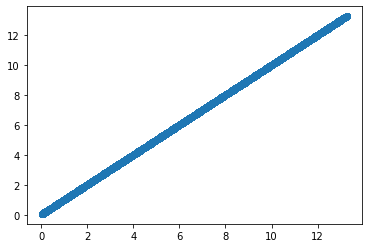

In [9]:
df=allouts["model=3_1_t=1f,2f_d=p_p"][1]
plt.scatter(df["col"],df["row"])

In [10]:
np.all(np.abs(df["col"]-df["row"])<0.025) #bins are 0.025 apart

True

In [11]:
from functools import partial

model=3_1_t=1f,2f_d=p_p
[2588 2934 5852 3339 4760  573  219  147 4228 1697]
diag q1 y_c: 11.849999999999948 y_1: 11.850000000000382 ; [11.861649763867742, 11.861649763867742]
diag q1 y_c: 7.274999999999963 y_1: 7.275000000000318 ; [7.291242098297623, 7.291242098297623]
diag q1 y_c: 0.8749999999999862 y_1: 0.8750000000002256 ; [0.8954079327021356, 0.8954079327021356]
diag q1 y_c: 4.174999999999974 y_1: 4.175000000000274 ; [4.189382501626926, 4.189382501626926]
diag q1 y_c: 13.249999999999943 y_1: 13.250000000000401 ; [13.25913160236085, 13.25913160236085]
diag q1 y_c: 1.1499999999999853 y_1: 1.1500000000002295 ; [1.1555232892275173, 1.1555232892275173]
diag q1 y_c: 5.52499999999997 y_1: 5.52500000000029 ; [5.530151763352351, 5.530151763352351]
diag q1 y_c: 3.7249999999999766 y_1: 3.7250000000002643 ; [3.725159716894185, 3.725159716894185]
diag q1 y_c: 13.174999999999944 y_1: 13.175000000000402 ; [13.17794290531534, 13.17794290531534]
diag q1 y_c: 2.7999999999999794 y_1: 2.80000000000025

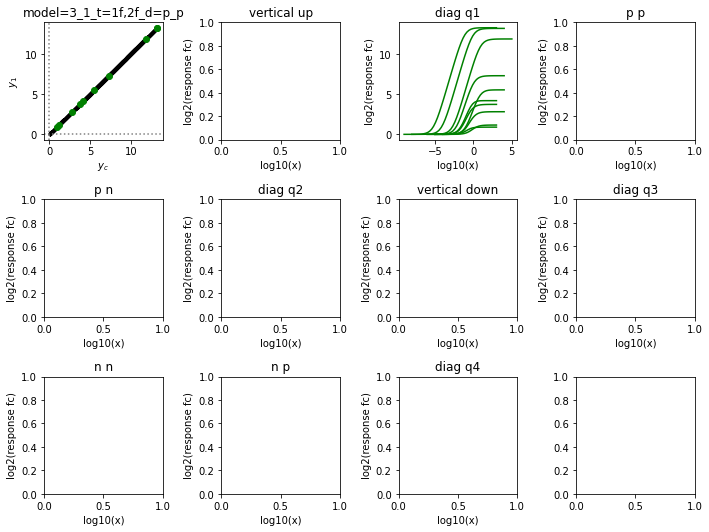

model=3_1_t=1f,2f_d=p_m
[13813 10970 19444 30013 42632 11871 27144 30791 14385 23068]
diag q1 y_c: 0.5999999999999872 y_1: 0.5750000000002213 ; [0.6098853284500332, 0.5838584849916598]
diag q1 y_c: 2.5749999999999797 y_1: 2.5750000000002515 ; [2.5900843068074217, 2.5786454707762987]
diag q1 y_c: 5.249999999999972 y_1: 5.250000000000288 ; [5.267553609202352, 5.267553609202352]
diag q1 y_c: 0.5749999999999873 y_1: 0.5750000000002213 ; [0.5898675499224695, 0.5891211913734591]
diag q1 y_c: 0.949999999999986 y_1: 0.9250000000002263 ; [0.951327737331489, 0.9450257089240671]
diag q1 y_c: 6.249999999999968 y_1: 6.2250000000003 ; [6.25959093285152, 6.243388808666158]
diag q1 y_c: 4.674999999999972 y_1: 4.675000000000281 ; [4.6833858709829705, 4.6833858709829705]
diag q1 y_c: 2.47499999999998 y_1: 2.47500000000025 ; [2.4920407925938424, 2.4920407925938424]
diag q1 y_c: 2.4499999999999806 y_1: 2.450000000000248 ; [2.4608053873815496, 2.4608053873815496]
diag q1 y_c: 4.099999999999975 y_1: 4.10000

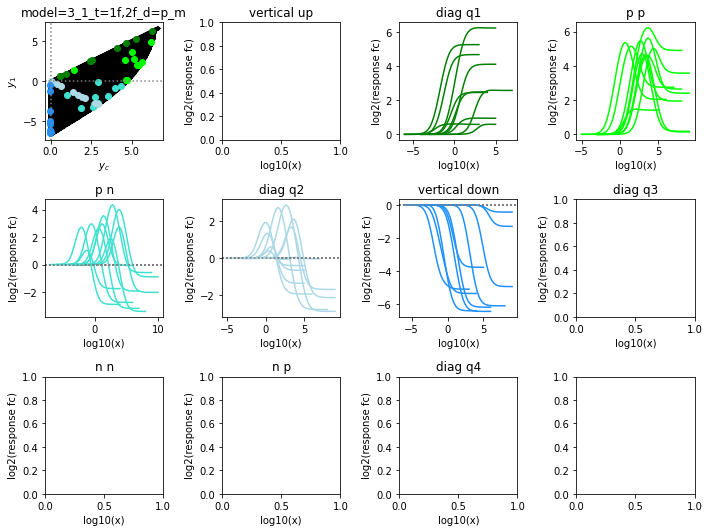

model=3_1_t=1f,2f_d=m_p
[31694 10650 48810  9932 35968 14772 10808 19522 15477 18845]
diag q1 y_c: 6.424999999999967 y_1: 6.425000000000303 ; [6.44819029101671, 6.439305841273873]
diag q1 y_c: 2.0749999999999815 y_1: 2.0750000000002444 ; [2.0790480004504373, 2.0790480004504373]
diag q1 y_c: 5.1749999999999705 y_1: 5.1750000000002885 ; [5.182021092336879, 5.178320144630562]
diag q1 y_c: 0.07499999999998908 y_1: 0.07500000000021423 ; [0.09186460299623773, 0.07866292938635248]
diag q1 y_c: 4.624999999999973 y_1: 4.6000000000002785 ; [4.633215318320811, 4.603313132987255]
diag q1 y_c: 3.149999999999978 y_1: 3.125000000000256 ; [3.1686075693686324, 3.149803777974157]
diag q1 y_c: 2.524999999999981 y_1: 2.5250000000002473 ; [2.5464951337712245, 2.5464951337712245]
diag q1 y_c: 6.424999999999967 y_1: 6.400000000000304 ; [6.427551416093308, 6.419493838705709]
diag q1 y_c: 5.774999999999968 y_1: 5.750000000000295 ; [5.779678693037515, 5.754936427628542]
diag q1 y_c: 3.924999999999976 y_1: 3.925

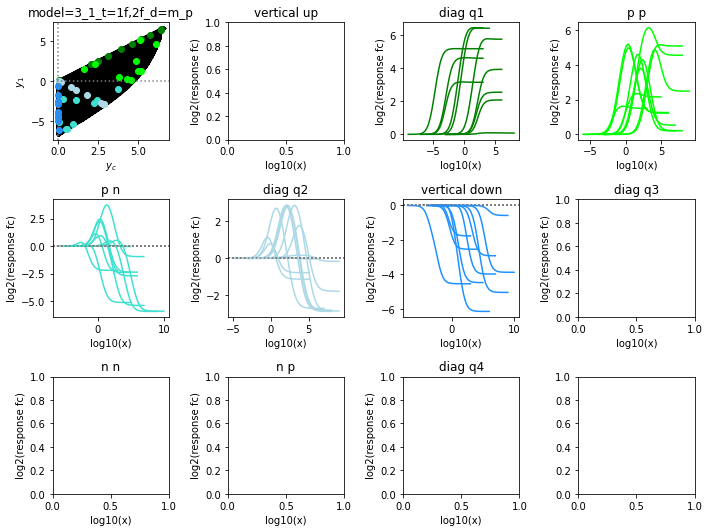

model=3_1_t=1r,2f_d=p_p
reverse
[5125 3459 3496 6195 4657 5657 3680 4698 1428  868]
diag q1 y_c: 2.774999999999979 y_1: 2.7750000000002544 ; [2.7816447490711593, 2.7816447490711593]
diag q1 y_c: 0.7249999999999868 y_1: 0.7250000000002235 ; [0.7330194561531834, 0.7330194561531834]
diag q1 y_c: 1.6499999999999835 y_1: 1.6500000000002366 ; [1.6662314515525847, 1.6662314515525847]
diag q1 y_c: 3.1249999999999787 y_1: 3.125000000000256 ; [3.1357703942760997, 3.1357703942760997]
diag q1 y_c: 4.274999999999974 y_1: 4.275000000000276 ; [4.276353413123199, 4.276353413123199]
diag q1 y_c: 2.8749999999999787 y_1: 2.875000000000256 ; [2.882348280246881, 2.882348280246881]
diag q1 y_c: 6.249999999999968 y_1: 6.250000000000302 ; [6.256266237456172, 6.256266237456172]
diag q1 y_c: 5.2999999999999705 y_1: 5.3000000000002885 ; [5.308400667484358, 5.308400667484358]
diag q1 y_c: 2.7499999999999796 y_1: 2.7500000000002522 ; [2.7645018042636074, 2.7645018042636074]
diag q1 y_c: 1.9499999999999824 y_1: 1.9

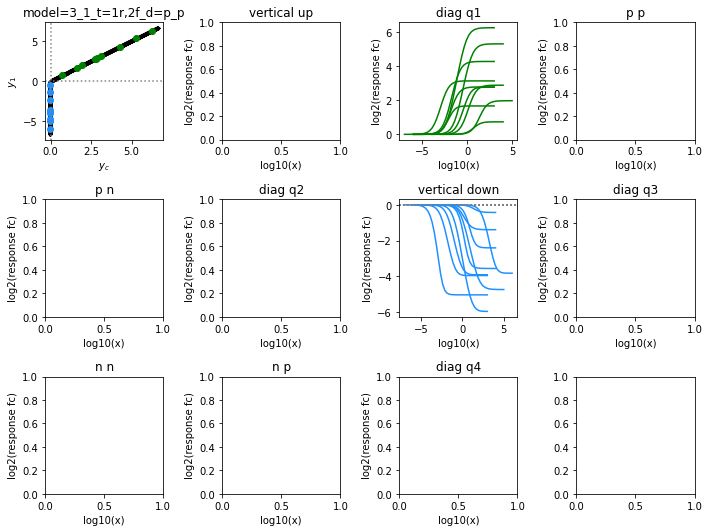

model=3_1_t=1r,2f_d=m_m
reverse
[3050 2949 2935 3453 3628  846 4211 4661 4527 5756]
diag q1 y_c: 3.824999999999976 y_1: 3.8250000000002657 ; [3.8416982211986546, 3.8416982211986546]
diag q1 y_c: 1.2999999999999847 y_1: 1.3000000000002316 ; [1.3216486875104718, 1.3216486875104718]
diag q1 y_c: 0.949999999999986 y_1: 0.9500000000002267 ; [0.9640544158092407, 0.9640544158092407]
diag q1 y_c: 0.7249999999999868 y_1: 0.7250000000002235 ; [0.740448136014668, 0.740448136014668]
diag q1 y_c: 5.099999999999971 y_1: 5.100000000000286 ; [5.1137718126437175, 5.1137718126437175]
diag q1 y_c: 1.4249999999999847 y_1: 1.4250000000002316 ; [1.4327406170600065, 1.4327406170600065]
diag q1 y_c: 6.499999999999966 y_1: 6.5000000000003055 ; [6.50218535442236, 6.50218535442236]
diag q1 y_c: 4.574999999999973 y_1: 4.57500000000028 ; [4.599662479505365, 4.599662479505365]
diag q1 y_c: 1.2249999999999854 y_1: 1.2250000000002288 ; [1.2418839066230738, 1.2418839066230738]
diag q1 y_c: 5.5999999999999694 y_1: 5.60

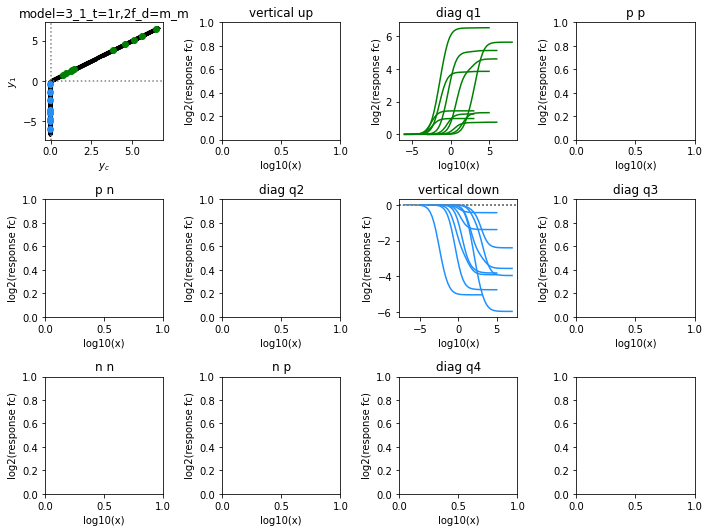

model=3_1_t=1r,3f_d=p_p
reverse
[ 3057 37316 41761 55281 19954 11221 27095 38015 59959 41730]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.200000000000216 ; [0, 0.20507805061356074]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.3500000000002608 ; [0, 3.3576555265071364]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.1500000000002437 ; [0, 2.1564513343873934]
vertical up y_c: -1.0658141036401503e-14 y_1: 4.625000000000277 ; [0, 4.644400474268987]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.6750000000002387 ; [0, 1.6789512606948018]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.3000000000002885 ; [0, 5.311745155604819]
vertical up y_c: -1.0658141036401503e-14 y_1: 4.625000000000277 ; [0, 4.646943769095855]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.100000000000286 ; [0, 5.121100044465446]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.5250000000002473 ; [0, 2.532957823948707]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.0750000000002444 ; [0, 2.0768236231993105]
[ 31

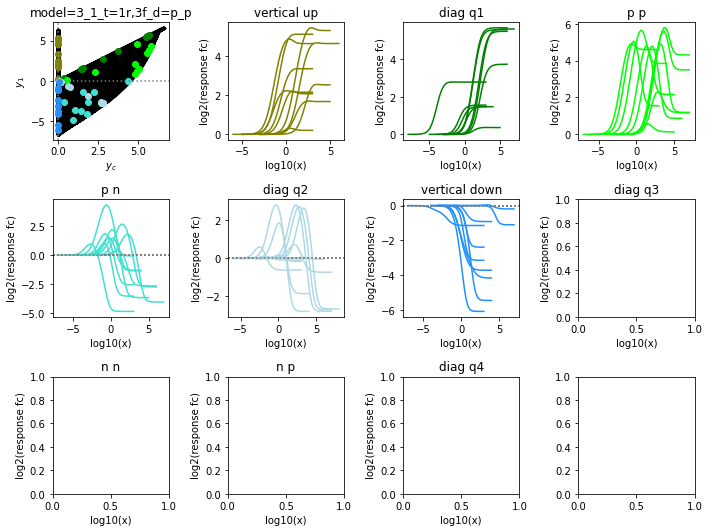

model=3_1_t=1r,3f_d=m_m
reverse
[13919 54322 48386 26085  3131 42515 47630  4876 42245 14738]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.3250000000002178 ; [0, 0.3448869987222019]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.9000000000002544 ; [0, 2.9147628584937935]
vertical up y_c: -1.0658141036401503e-14 y_1: 4.4750000000002785 ; [0, 4.475163240332903]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.87500000000027 ; [0, 3.8904790276256382]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.12500000000021494 ; [0, 0.13292527633904516]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.9000000000002686 ; [0, 3.913822164706121]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.675000000000253 ; [0, 2.6800585444953353]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.450000000000262 ; [0, 3.47376516215049]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.2000000000002586 ; [0, 3.202252416236802]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.9500000000002409 ; [0, 1.962037448837508]
[376

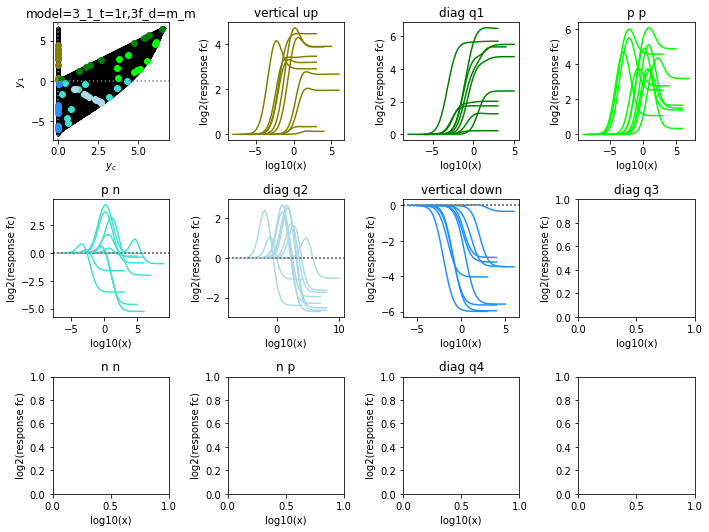

model=3_2_t=1f,2f_d=p_m
[14419 45392 45959 23867 19145 11305 26707 40719 14898 44554]
diag q1 y_c: 1.9499999999999824 y_1: 1.9500000000002409 ; [1.9604558611193583, 1.9604558611193583]
diag q1 y_c: 3.674999999999976 y_1: 3.650000000000265 ; [3.69909802278681, 3.6724922578325527]
diag q1 y_c: 5.39999999999997 y_1: 5.40000000000029 ; [5.420933805302402, 5.413597343713433]
diag q1 y_c: 5.64999999999997 y_1: 5.6500000000002935 ; [5.654261193461219, 5.65257416079768]
diag q1 y_c: 2.9999999999999787 y_1: 2.975000000000257 ; [3.00567884611876, 2.988914869070616]
diag q1 y_c: 5.749999999999968 y_1: 5.750000000000295 ; [5.77100316288354, 5.77100316288354]
diag q1 y_c: 2.299999999999981 y_1: 2.300000000000246 ; [2.3182512024914557, 2.306940425065766]
diag q1 y_c: 2.72499999999998 y_1: 2.72500000000025 ; [2.743676973360456, 2.7432798887766587]
diag q1 y_c: 3.3499999999999774 y_1: 3.3500000000002608 ; [3.3504144215978715, 3.3504144215978715]
diag q1 y_c: 1.5249999999999844 y_1: 1.5000000000002345 

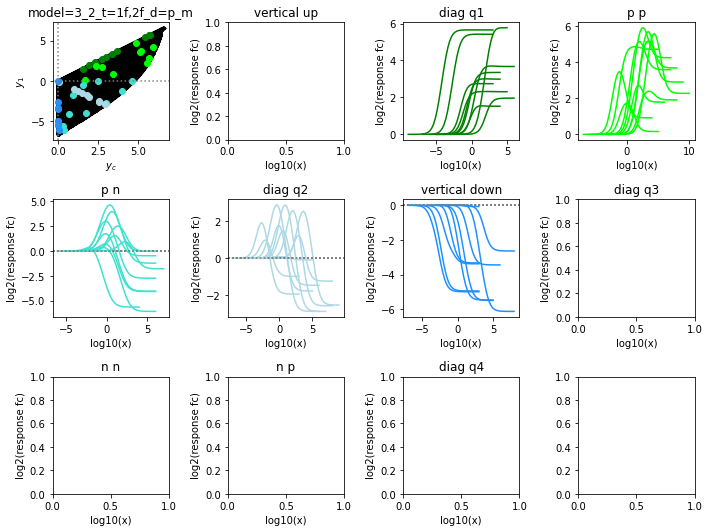

model=3_2_t=1f,2f_d=m_p
[30931 34789 45947  7090 36237 24219 45487  3312 23643 14105]
diag q1 y_c: 1.9999999999999822 y_1: 2.0000000000002416 ; [2.01909354039904, 2.01909354039904]
diag q1 y_c: 0.3249999999999882 y_1: 0.3250000000002178 ; [0.3404105964401112, 0.3404105964401112]
diag q1 y_c: 4.624999999999973 y_1: 4.625000000000277 ; [4.646382907427347, 4.646382907427347]
diag q1 y_c: 4.224999999999975 y_1: 4.225000000000271 ; [4.24693579102791, 4.236497425421534]
diag q1 y_c: 3.674999999999976 y_1: 3.650000000000265 ; [3.67631248648444, 3.6526595169390683]
diag q1 y_c: 6.174999999999967 y_1: 6.150000000000301 ; [6.175898972771499, 6.173849034748381]
diag q1 y_c: 3.024999999999979 y_1: 3.0250000000002544 ; [3.0454640344517063, 3.0454640344517063]
diag q1 y_c: 3.799999999999976 y_1: 3.800000000000267 ; [3.8125912656005996, 3.8125912656005996]
diag q1 y_c: 4.274999999999974 y_1: 4.275000000000276 ; [4.293811637932729, 4.293811637932729]
diag q1 y_c: 2.3249999999999815 y_1: 2.300000000000

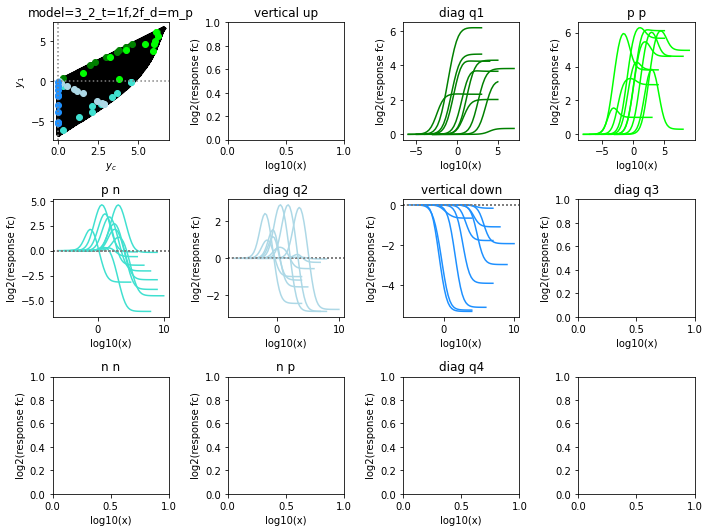

model=3_2_t=1f,2r_d=p_p
reverse
[54494  3635 26451  3144 32043 25759 15532 13873 59832 54255]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.925000000000296 ; [0, 5.926126361303893]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.6750000000002387 ; [0, 1.6855964560202183]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.4250000000002885 ; [0, 5.447361683205788]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.7500000000002238 ; [0, 0.768455076866061]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.350000000000289 ; [0, 5.352004086337728]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.7750000000002686 ; [0, 3.7877921359526243]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.225000000000286 ; [0, 5.234420874937307]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.400000000000233 ; [0, 1.4089255094492346]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.375000000000291 ; [0, 5.390660222922764]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.150000000000286 ; [0, 5.170508572296734]
[42288 40

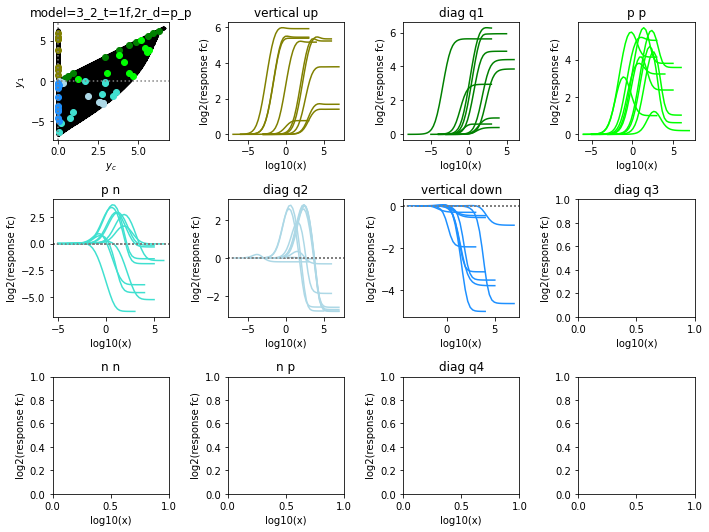

model=3_2_t=1f,2r_d=m_m
reverse
[48343 31079 37078 21069 46385 15480 25466 19788 53461 35395]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.6500000000002935 ; [0, 5.66991102771502]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.2000000000002444 ; [0, 2.208579448777078]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.7500000000002665 ; [0, 3.7518636929223796]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.675000000000296 ; [0, 5.697991867723989]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.1500000000002295 ; [0, 1.1722976618562255]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.800000000000267 ; [0, 3.80969556104486]
vertical up y_c: -1.0658141036401503e-14 y_1: 2.300000000000246 ; [0, 2.320135895826985]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.8500000000002395 ; [0, 1.8699399525025762]
vertical up y_c: -1.0658141036401503e-14 y_1: 4.57500000000028 ; [0, 4.593512849778482]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.17500000000021565 ; [0, 0.17590497084277412]
[46530 

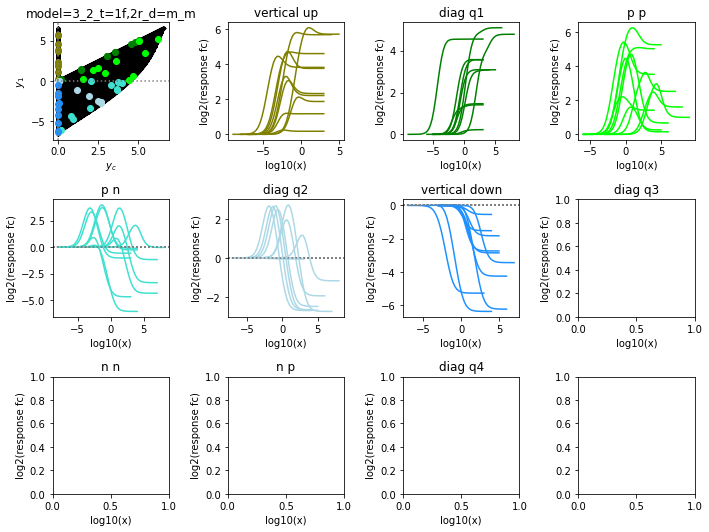

model=3_2_t=1f,3f_d=m_p
[18436 35801 21351 47079  3298 40361 21533  7335 30626 10942]
diag q1 y_c: 4.949999999999972 y_1: 4.9500000000002835 ; [4.97497872522582, 4.97497872522582]
diag q1 y_c: 5.37499999999997 y_1: 5.375000000000291 ; [5.397735651799193, 5.397735651799193]
diag q1 y_c: 0.8999999999999861 y_1: 0.8750000000002256 ; [0.9106635246771855, 0.8902225269056349]
diag q1 y_c: 0.22499999999998854 y_1: 0.22500000000021636 ; [0.2355411189809539, 0.2355411189809539]
diag q1 y_c: 4.224999999999975 y_1: 4.225000000000271 ; [4.245571166353199, 4.245571166353199]
diag q1 y_c: 6.474999999999966 y_1: 6.475000000000307 ; [6.493963517864213, 6.492254368313676]
diag q1 y_c: 1.374999999999984 y_1: 1.3500000000002323 ; [1.3765351185900065, 1.3686089471128904]
diag q1 y_c: 5.37499999999997 y_1: 5.375000000000291 ; [5.398581922124021, 5.393089462178868]
diag q1 y_c: 4.924999999999972 y_1: 4.925000000000281 ; [4.93429651411148, 4.93429651411148]
diag q1 y_c: 4.724999999999973 y_1: 4.7250000000002

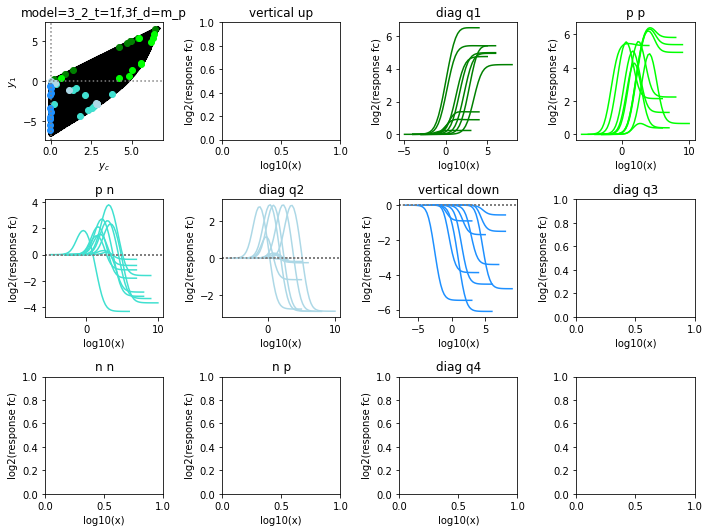

model=3_2_t=1f,3f_d=p_m
[22282 13217 34682 41140 41141 18657 40580 29610 13411  9965]
diag q1 y_c: 1.8749999999999822 y_1: 1.8750000000002416 ; [1.8751038481236435, 1.8751038481236435]
diag q1 y_c: 0.5499999999999874 y_1: 0.5250000000002206 ; [0.5500611039382707, 0.5360763771969254]
diag q1 y_c: 2.049999999999982 y_1: 2.02500000000024 ; [2.0505782483178567, 2.0301014025948643]
diag q1 y_c: 5.52499999999997 y_1: 5.52500000000029 ; [5.549299172503722, 5.544743237326853]
diag q1 y_c: 5.549999999999969 y_1: 5.52500000000029 ; [5.574603151819982, 5.529187976788659]
diag q1 y_c: 3.824999999999976 y_1: 3.8250000000002657 ; [3.825036784199667, 3.825036784199667]
diag q1 y_c: 4.124999999999975 y_1: 4.12500000000027 ; [4.145949337381661, 4.1269019550152155]
diag q1 y_c: 0.3999999999999879 y_1: 0.3750000000002185 ; [0.4084093439318544, 0.3902833939250704]
diag q1 y_c: 1.074999999999985 y_1: 1.0750000000002302 ; [1.0888238659521179, 1.0888238659521179]
diag q1 y_c: 1.3499999999999845 y_1: 1.350000

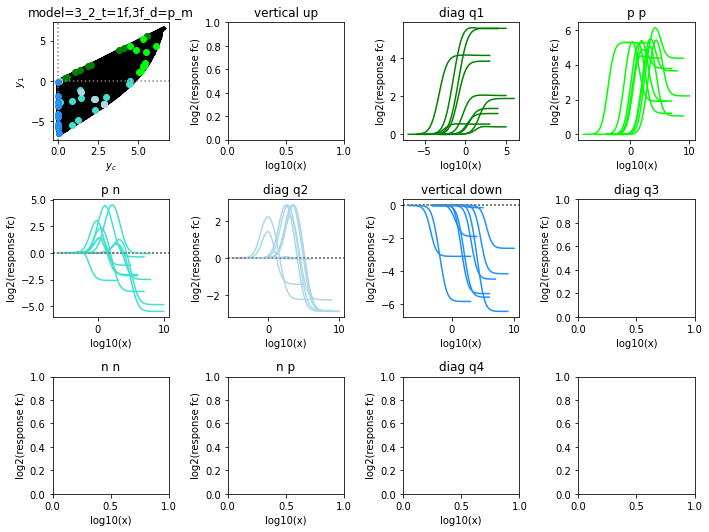

model=3_12_t=1f,2f_d=p_m
[32525  2757 14887  2430 18738 14531 10205  7715 33817 32301]
diag q1 y_c: 1.499999999999984 y_1: 1.5000000000002345 ; [1.5146884762090562, 1.5146884762090562]
diag q1 y_c: 1.2749999999999844 y_1: 1.250000000000231 ; [1.278199894233329, 1.2676322401212081]
diag q1 y_c: 3.674999999999976 y_1: 3.650000000000265 ; [3.6898930743811102, 3.659297880014547]
diag q1 y_c: 0.5999999999999872 y_1: 0.5750000000002213 ; [0.6130178635396004, 0.5817143833992096]
diag q1 y_c: 1.7749999999999826 y_1: 1.7750000000002402 ; [1.7955768628108886, 1.7955768628108886]
diag q1 y_c: 2.4499999999999806 y_1: 2.450000000000248 ; [2.471051602972191, 2.471051602972191]
diag q1 y_c: 0.19999999999998863 y_1: 0.200000000000216 ; [0.2130023193258775, 0.20286980416287959]
diag q1 y_c: 3.7749999999999755 y_1: 3.7750000000002686 ; [3.7800333124850263, 3.7800333124850263]
diag q1 y_c: 5.799999999999969 y_1: 5.800000000000296 ; [5.8143154052065755, 5.814073594471947]
diag q1 y_c: 0.9249999999999861 y

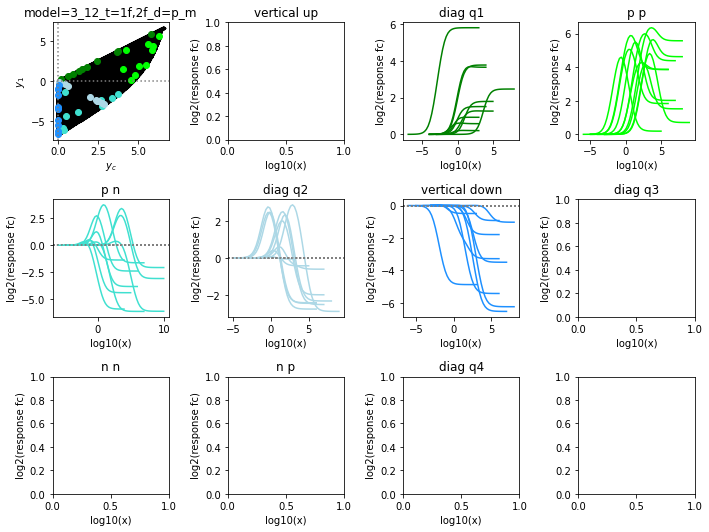

model=3_12_t=1f,2f_d=m_p
[30475 49240 44804 29471 35712 25360 25206 22603 29312 13812]
diag q1 y_c: 4.799999999999972 y_1: 4.800000000000281 ; [4.807262320316119, 4.807262320316119]
diag q1 y_c: 4.049999999999975 y_1: 4.050000000000271 ; [4.064392265103729, 4.064392265103729]
diag q1 y_c: 3.5499999999999767 y_1: 3.5500000000002636 ; [3.552010274949066, 3.552010274949066]
diag q1 y_c: 1.5999999999999837 y_1: 1.5750000000002373 ; [1.604788522433866, 1.5988501464787308]
diag q1 y_c: 6.274999999999967 y_1: 6.250000000000302 ; [6.275554829617414, 6.268840593314607]
diag q1 y_c: 0.8249999999999864 y_1: 0.8250000000002249 ; [0.825148706128188, 0.825148706128188]
diag q1 y_c: 0.3249999999999882 y_1: 0.3000000000002174 ; [0.3334144025664259, 0.3159855915817635]
diag q1 y_c: 3.999999999999975 y_1: 4.00000000000027 ; [4.005045769560007, 4.005045769560007]
diag q1 y_c: 1.1499999999999853 y_1: 1.1250000000002274 ; [1.1580470877287448, 1.1443188777952027]
diag q1 y_c: 1.374999999999984 y_1: 1.350000

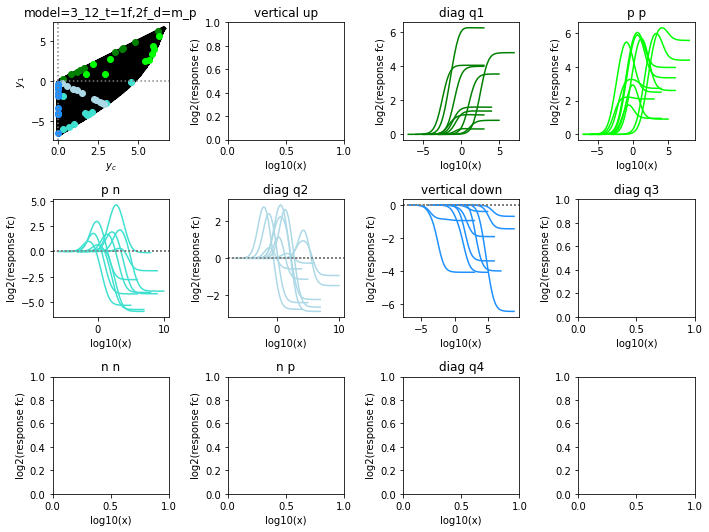

model=3_12_t=1f,3f_d=p_m
[11003 25756  3646 13572  3580 16767  2642 14119 29666 34723]
diag q1 y_c: 5.949999999999967 y_1: 5.950000000000298 ; [5.958993748781827, 5.958993748781827]
diag q1 y_c: 2.4999999999999805 y_1: 2.5000000000002487 ; [2.5240887854030696, 2.5240887854030696]
diag q1 y_c: 6.174999999999967 y_1: 6.175000000000303 ; [6.186462502185111, 6.186462502185111]
diag q1 y_c: 2.274999999999981 y_1: 2.250000000000245 ; [2.285284844846579, 2.2704442345014764]
diag q1 y_c: 5.824999999999969 y_1: 5.825000000000294 ; [5.834637923963013, 5.834637923963013]
diag q1 y_c: 0.5499999999999874 y_1: 0.550000000000221 ; [0.5593353140527532, 0.5593353140527532]
diag q1 y_c: 2.64999999999998 y_1: 2.650000000000251 ; [2.670469253408915, 2.668484870195679]
diag q1 y_c: 4.099999999999975 y_1: 4.100000000000271 ; [4.120319871346969, 4.120319871346969]
diag q1 y_c: 0.5749999999999873 y_1: 0.550000000000221 ; [0.5773875441315957, 0.5687514920635655]
diag q1 y_c: 1.9749999999999819 y_1: 1.975000000

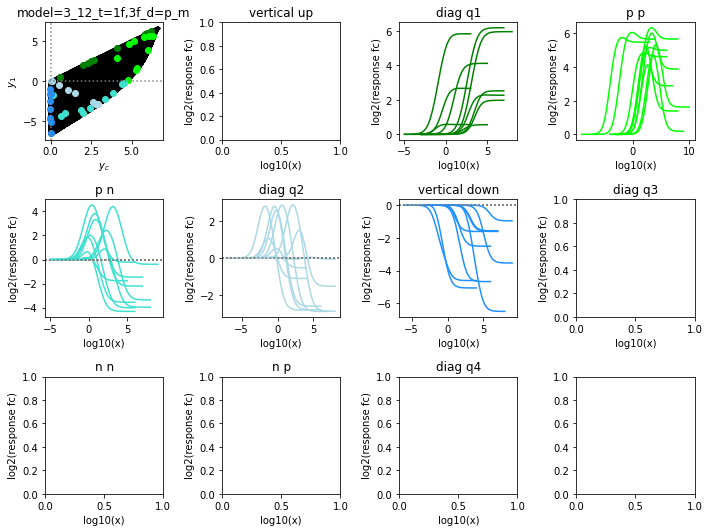

model=3_12_t=1f,3f_d=m_p
[40221 13792 30139 29934 13995 29209 10732  2090 48155  7262]
diag q1 y_c: 6.174999999999967 y_1: 6.150000000000301 ; [6.181210339972359, 6.155239555263632]
diag q1 y_c: 2.4499999999999806 y_1: 2.450000000000248 ; [2.473677222958996, 2.473677222958996]
diag q1 y_c: 5.14999999999997 y_1: 5.150000000000286 ; [5.163034662459803, 5.163034662459803]
diag q1 y_c: 4.374999999999973 y_1: 4.375000000000277 ; [4.385602468374496, 4.385602468374496]
diag q1 y_c: 3.199999999999978 y_1: 3.2000000000002586 ; [3.214608656871523, 3.214608656871523]
diag q1 y_c: 1.8499999999999828 y_1: 1.8500000000002395 ; [1.8717664856924494, 1.870470495699068]
diag q1 y_c: 4.074999999999974 y_1: 4.075000000000273 ; [4.088510254606005, 4.088510254606005]
diag q1 y_c: 0.44999999999998774 y_1: 0.45000000000021956 ; [0.46758988944408497, 0.463867985469415]
diag q1 y_c: 4.574999999999973 y_1: 4.57500000000028 ; [4.584041926208572, 4.584041926208572]
diag q1 y_c: 4.599999999999973 y_1: 4.60000000000

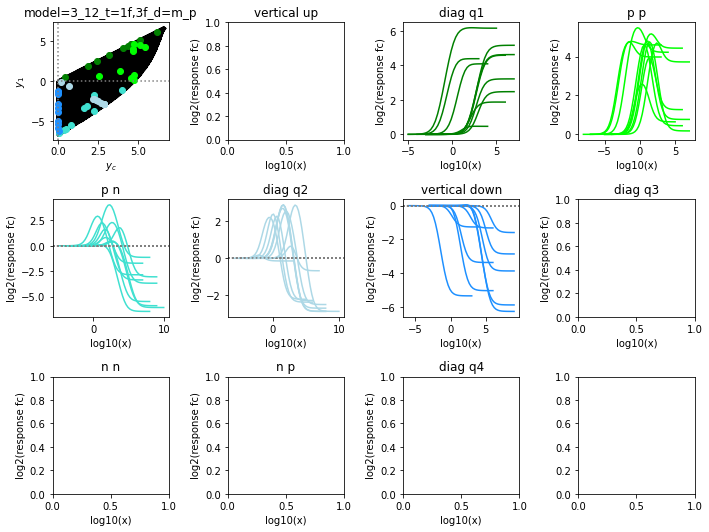

model=5_1234_t=1f,2f_d=p_m
[ 4416  7611 40388 38726 11889 25283 35662 55212  4522 45853]
diag q1 y_c: 5.549999999999969 y_1: 5.550000000000292 ; [5.565782802973484, 5.565782802973484]
diag q1 y_c: 2.5499999999999803 y_1: 2.5500000000002494 ; [2.550068347199194, 2.550068347199194]
diag q1 y_c: 6.5749999999999655 y_1: 6.575000000000308 ; [6.577189529123509, 6.577189529123509]
diag q1 y_c: 0.374999999999988 y_1: 0.3750000000002185 ; [0.380447508099579, 0.380447508099579]
diag q1 y_c: 2.099999999999982 y_1: 2.100000000000243 ; [2.105920355455926, 2.105920355455926]
diag q1 y_c: 1.1749999999999847 y_1: 1.1500000000002295 ; [1.1939908184361894, 1.1556640806693825]
diag q1 y_c: 4.124999999999975 y_1: 4.12500000000027 ; [4.145953339398877, 4.145953339398877]
diag q1 y_c: 3.8999999999999755 y_1: 3.87500000000027 ; [3.9221423837512064, 3.8956758620287113]
diag q1 y_c: 6.049999999999969 y_1: 6.025000000000297 ; [6.06591446078623, 6.04297108319067]
diag q1 y_c: 5.749999999999968 y_1: 5.72500000000

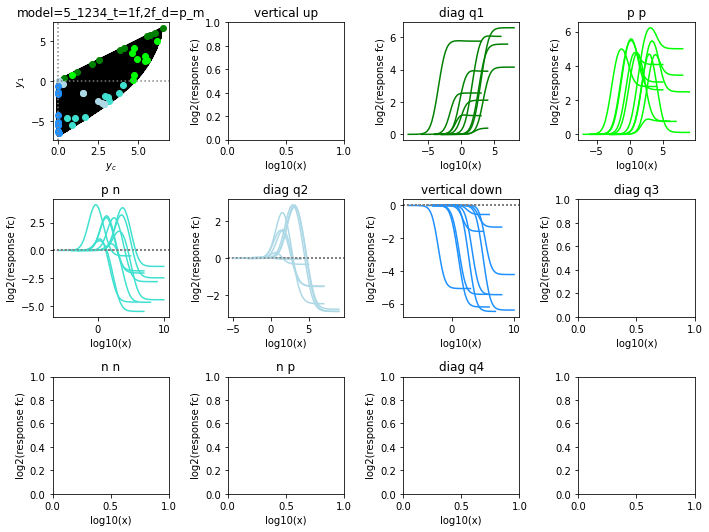

model=5_1234_t=2f,4f_d=m_p
[ 6109 10776  4949 15269 16359 20655 10998  7013  6753 20267]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.7500000000002665 ; [0, 3.7721098851678407]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.475000000000236 ; [0, 1.4803849246497722]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.9500000000002409 ; [0, 1.9570961934081443]
vertical up y_c: -1.0658141036401503e-14 y_1: 0.27500000000021707 ; [0, 0.29661278446886397]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.17500000000026 ; [0, 3.1867930763324797]
vertical up y_c: -1.0658141036401503e-14 y_1: 4.425000000000274 ; [0, 4.449791815151721]
vertical up y_c: -1.0658141036401503e-14 y_1: 1.750000000000238 ; [0, 1.7596081723467665]
vertical up y_c: -1.0658141036401503e-14 y_1: 6.400000000000304 ; [0, 6.406503468232536]
vertical up y_c: -1.0658141036401503e-14 y_1: 5.475000000000293 ; [0, 5.486629635511101]
vertical up y_c: -1.0658141036401503e-14 y_1: 3.150000000000258 ; [0, 3.1714555112807297]
[20445 170

n n y_c: -0.3500000000000094 y_1: -0.2499999999997904 ; [-0.3369913288548958, -0.23020178854274467]
n n y_c: -0.2750000000000097 y_1: -0.19999999999978968 ; [-0.2580600265751934, -0.18876275310380564]
[ 4642 25274 25526 15785  4827 11301  4073 27632  3560  4315]
n p y_c: -0.17500000000001004 y_1: 1.525000000000233 ; [-0.15351322912713522, 1.544398588711455]
n p y_c: -1.025000000000007 y_1: 0.5000000000002203 ; [-1.0061073608313067, 0.5000157817988361]
n p y_c: -0.5250000000000088 y_1: 0.7750000000002242 ; [-0.5100424312443516, 0.7890738858887496]
n p y_c: -0.22500000000000986 y_1: 1.5750000000002373 ; [-0.21207208569549585, 1.5788405781840613]
n p y_c: -0.05000000000001048 y_1: 1.7750000000002402 ; [-0.029485919945827527, 1.7951938175931332]
n p y_c: -0.1000000000000103 y_1: 2.175000000000246 ; [-0.0823848879760254, 2.18502279700998]
n p y_c: -0.42500000000000915 y_1: 0.8250000000002249 ; [-0.41174679031038725, 0.8455189098338692]
n p y_c: -0.15000000000001013 y_1: 3.5500000000002636 ;

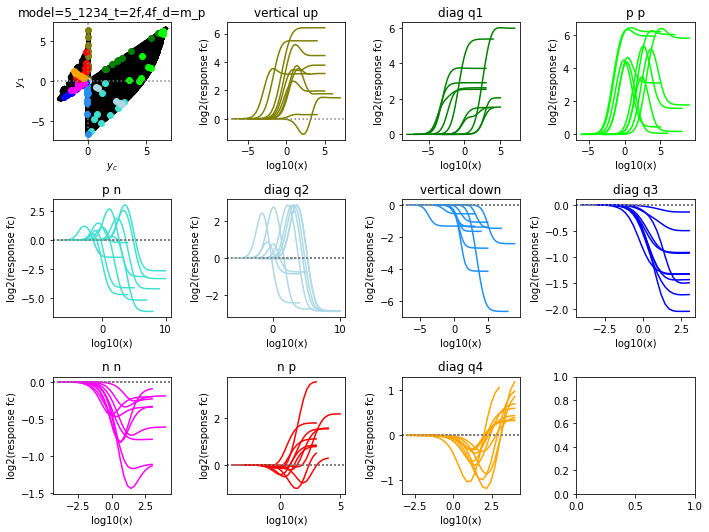

model=5_1234_t=2r,4f_d=p_p
None for model model=5_1234_t=2r,4f_d=p_p


<Figure size 432x288 with 0 Axes>

model=5_1234_t=1r,3f_d=m_m
None for model model=5_1234_t=1r,3f_d=m_m


<Figure size 432x288 with 0 Axes>

In [12]:
#now plot a few functions per model around these coordinates:
colors=["olive","green","lime","turquoise","lightblue","dodgerblue","blue","magenta","red","orange"]
kwargs=dict(tol=1e-5,check_out0=False,out0_tol=0.001,fc_tol=0.070389327891398)#used in the run

for i_ in [1]:
    #if i_==0: look only at the vertical up, in detail, otherwise look at all
    for c_,case in enumerate(allouts.keys()):

        print(case)
        df=allouts[case][1]

        if df is None:
            print("None for model", case)
            parset1=[]
            parset2=[]
            parset3=[]
            parset4=[]
        else:
            x=df["col"].values
            y=df["row"].values
            model,transitions,direction=mypat.findall(case)[0]
            if "r" in transitions:
                print("reverse")
            transitions=transitions.split(",")
            return_fullpars=partial(return_fullpars_polcycle,model=model,transitions=transitions)

            if model=="3_1":
                ccode=state3_rev1
            elif model=="3_2":
                ccode=state3_rev2
            elif model=="3_12":
                ccode=state3_rev12
            elif model=="5_1":
                ccode=state5_rev1
            elif model=="5_1234":
                ccode=state5_rev1234
            else:
                print("model not understood")
                raise(ValueError)
            ssfunc=ccode.interfacess

            x_0=np.where((x>(0-0.03))&(x<(0+0.03)))[0]
            x_positive=np.where(x>0.03)[0]
            x_negative=np.where(x<-0.03)[0]
            y_positive=np.where(y>0.03)[0]
            y_negative=np.where(y<-0.03)[0]
            all_positive=np.intersect1d(x_positive,y_positive)
            all_negative=np.intersect1d(x_negative,y_negative)
            xp_yn=np.intersect1d(x_positive,y_negative)
            xn_yp=np.intersect1d(x_negative,y_positive)
            diagonal=np.where(np.abs(x-y)<0.025)[0] #y=x 
            inverse_diagonal=np.where(np.abs(x-(-y))<0.025)[0] #y=-x

            idxs_up=np.intersect1d(x_0,y_positive) #vertical up
            idxs_down=np.intersect1d(x_0,y_negative)#vertical down
            idxs_diag_q1=np.intersect1d(diagonal,y_positive) 
            idxs_diag_q1=np.intersect1d(idxs_diag_q1,x_positive) #diagonal up-right, x positive
            idxs_diag_q2=np.intersect1d(inverse_diagonal,y_negative) 
            idxs_diag_q3=np.intersect1d(diagonal,y_negative)
            idxs_diag_q4=np.intersect1d(inverse_diagonal,y_positive)
            
            idxs_p_p=np.setdiff1d(all_positive,idxs_diag_q1)
            idxs_p_n=np.setdiff1d(xp_yn,idxs_diag_q2)
            idxs_n_n=np.setdiff1d(all_negative,idxs_diag_q3)
            idxs_n_p=np.setdiff1d(xn_yp,idxs_diag_q4)

            #clockwise
            if i_==0:
                idxs_groups=[idxs_up]
                names=["vertical up"]
            else:
                idxs_groups=[idxs_up,idxs_diag_q1,idxs_p_p,idxs_p_n,idxs_diag_q2,idxs_down,idxs_diag_q3,idxs_n_n,idxs_n_p,idxs_diag_q4]
                names=["vertical up","diag q1", "p p", "p n", "diag q2", "vertical down", "diag q3", "n n", "n p", "diag q4"]
            
            ncol=4
            nrow=int(np.ceil(len(idxs_groups)/ncol))
            fig,axes=plt.subplots(nrow,ncol,figsize=(10,2.5*nrow))
            if i_==0:
                ax0=axes[0]
            else:
                ax0=axes[0][0]
            ax0.scatter(x,y,color="k",s=5)
            ax0.set_title(case)
            ax0.set_xlabel("$y_c$")
            ax0.set_ylabel("$y_1$")
            ax0.axhline(y=0,linestyle=":",color="gray")
            ax0.axvline(x=0,linestyle=":",color="gray")

            for g in range(len(idxs_groups)):
                group=idxs_groups[g]
                name=names[g]
                #
                if i_==0:
                    axg=axes[g+1]
                else:
                    axg=axes[(g+1)//4][(g+1)%4]
                axg.set_title(name)
                axg.set_xlabel("log10(x)")
                axg.set_ylabel("log2(response fc)")
                if len(group)>0:
                    np.random.seed(1)
                    choice=np.random.choice(group,replace=False,size=10)
                    print(choice)
                    for idx in choice:
                        df_row=df.iloc[idx]
                        col=df_row["col"]
                        row=df_row["row"]
                        
                        parset=df_row["parameters"]

                        ax0.scatter(col,row,color=colors[g])

                        score_,f,Amin,Amax,n=score(parset,return_fullpars=return_fullpars, ssfunc=ssfunc,scoref=get_score_up_down_v2,n=None,Amin=None,Amax=None,log2out=True,returnout=True,**kwargs)
                        
                        print(name,"y_c:",col,"y_1:",row,";", score_)
                            
                        Avals=np.logspace(np.log10(Amin),np.log10(Amax),n)
                        axg.plot(np.log10(Avals),f,color=colors[g])
                        if np.any(f<0):
                            axg.axhline(y=0,color="gray",linestyle=":")
        plt.tight_layout()
        plt.show()


The vertical up should correspond to multiple peaks. Try to look into detail:

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 22 23 24 25 26]
down idxs: [14 15 16 17 18 19 20 21]
[0.00022481 0.00040799 0.00073985 0.00133971 0.00241966 0.00434987
 0.00775521 0.01362651 0.02335366 0.03842409 0.05939197 0.08417153
 0.10721501 0.12175425 0.07392146 0.0739552  0.07403389 0.07409895
 0.07414206]
[0.12414836 0.11623356 0.10355133 0.0914573  0.08268491 0.07751897
 0.07504289 0.07412755]


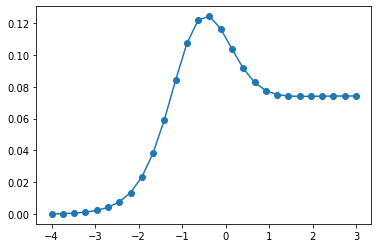

increasing tolerance
up_down


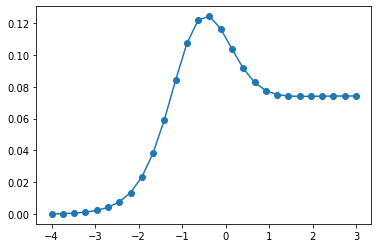

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 27 28 29
 30 31 32 33 34]
down idxs: [21 22 23 24 25 26]
[2.14663133e-04 3.88013843e-04 7.01284277e-04 1.26725356e-03
 2.28924903e-03 4.13304473e-03 7.45404939e-03 1.34182793e-02
 2.40734715e-02 4.29324190e-02 7.57692709e-02 1.31357976e-01
 2.21173746e-01 3.56044288e-01 5.38109885e-01 7.51532724e-01
 9.62559543e-01 1.13489870e+00 1.24878295e+00 1.30719936e+00
 1.32758306e+00 1.31204667e+00 1.31234958e+00 1.31296214e+00
 1.31365201e+00 1.31424986e+00 1.31468753e+00 1.31497417e+00
 1.31514918e+00]
[1.32899735 1.32424237 1.31918409 1.31553307 1.31334899 1.31229414]


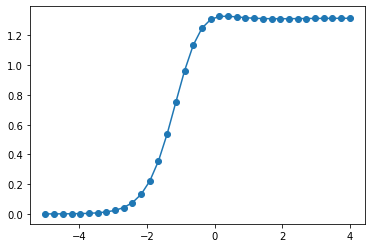

increasing tolerance
up_down


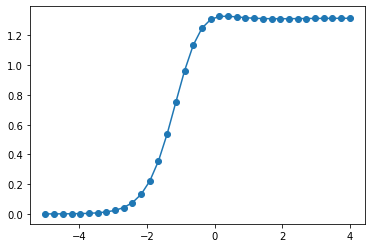

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 25 26 27 28
 29 30 31 32 33 34 35 36 37 38]
down idxs: [20 21 22 23 24]
[9.90431726e-04 1.78679729e-03 3.22253665e-03 5.80884256e-03
 1.04608320e-02 1.88060879e-02 3.37056429e-02 6.00839538e-02
 1.06102782e-01 1.84402378e-01 3.12291382e-01 5.08466304e-01
 7.83869606e-01 1.12909263e+00 1.50839653e+00 1.86937658e+00
 2.16428697e+00 2.36864129e+00 2.48572465e+00 2.53775418e+00
 2.53610911e+00 2.53696553e+00 2.53919758e+00 2.54228983e+00
 2.54554878e+00 2.54836113e+00 2.55044220e+00 2.55182144e+00
 2.55267144e+00 2.55317227e+00 2.55345962e+00 2.55362199e+00
 2.55371295e+00 2.55376366e+00]
[2.55210087 2.55037149 2.5446693  2.53980609 2.53696502]


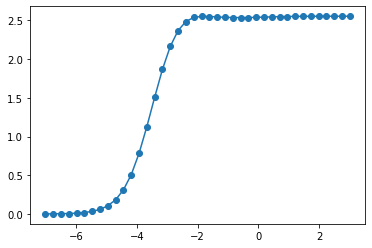

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 26 27 28 29 30
 31]
down idxs: [20 21 22 23]
[1.78679729e-03 3.22253665e-03 5.80884256e-03 1.04608320e-02
 1.88060879e-02 3.37056429e-02 6.00839538e-02 1.06102782e-01
 1.84402378e-01 3.12291382e-01 5.08466304e-01 7.83869606e-01
 1.12909263e+00 1.50839653e+00 1.86937658e+00 2.16428697e+00
 2.36864129e+00 2.48572465e+00 2.53775418e+00 2.53696553e+00
 2.53919758e+00 2.54228983e+00 2.54554878e+00 2.54836113e+00
 2.55044220e+00]
[2.55210087 2.55037149 2.5446693  2.53980609]


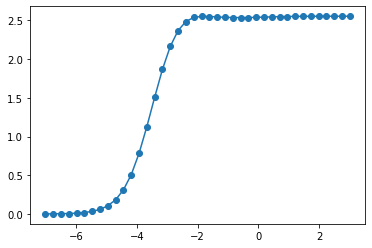

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 31 32 33
 34 35 36 37 38]
down idxs: [21 22 23 24 25 26 27 28 29 30]
[7.62959905e-04 1.37662044e-03 2.48340832e-03 4.47858102e-03
 8.07193791e-03 1.45330650e-02 2.61166140e-02 4.67755270e-02
 8.32831982e-02 1.46783792e-01 2.54350628e-01 4.29084375e-01
 6.96045597e-01 1.07234824e+00 1.55549386e+00 2.11876557e+00
 2.71638678e+00 3.29171880e+00 3.78403722e+00 4.13837117e+00
 4.32351952e+00 3.81548312e+00 3.81684671e+00 3.81873847e+00
 3.82041299e+00 3.82162436e+00 3.82240652e+00 3.82287930e+00
 3.82315442e+00]
[4.350215   4.26970375 4.14714495 4.03137085 3.94373919 3.88561779
 3.85027763 3.83029146 3.8200766  3.81595796]


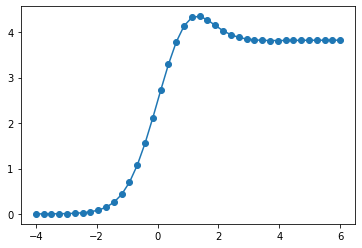

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 31 32 33 34]
down idxs: [21 22 23 24 25 26 27 28 29]
[1.37662044e-03 2.48340832e-03 4.47858102e-03 8.07193791e-03
 1.45330650e-02 2.61166140e-02 4.67755270e-02 8.32831982e-02
 1.46783792e-01 2.54350628e-01 4.29084375e-01 6.96045597e-01
 1.07234824e+00 1.55549386e+00 2.11876557e+00 2.71638678e+00
 3.29171880e+00 3.78403722e+00 4.13837117e+00 4.32351952e+00
 3.81548312e+00 3.81684671e+00 3.81873847e+00 3.82041299e+00]
[4.350215   4.26970375 4.14714495 4.03137085 3.94373919 3.88561779
 3.85027763 3.83029146 3.8200766 ]


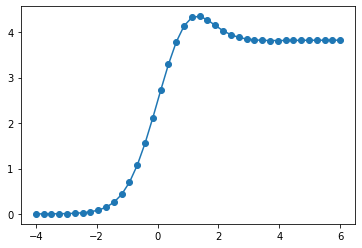

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 33
 34 35 36 37 38 39 40 41 42]
down idxs: [23 24 25 26 27 28 29 30 31 32]
[6.97768783e-04 1.25729987e-03 2.26514905e-03 4.07971428e-03
 7.34409078e-03 1.32081828e-02 2.37151955e-02 4.24548516e-02
 7.56083019e-02 1.33446374e-01 2.32003326e-01 3.93750413e-01
 6.44812433e-01 1.00657688e+00 1.48437526e+00 2.06171628e+00
 2.70471802e+00 3.37074446e+00 4.01359930e+00 4.58526659e+00
 5.03983615e+00 5.34378520e+00 5.48929415e+00 5.05813732e+00
 5.05930253e+00 5.06107017e+00 5.06273573e+00 5.06399702e+00
 5.06483715e+00 5.06535519e+00 5.06566043e+00 5.06583563e+00
 5.06593470e+00]
[5.50098347 5.42845743 5.32590194 5.23153102 5.16105838 5.11463575
 5.08645188 5.07043442 5.06211623 5.05862941]


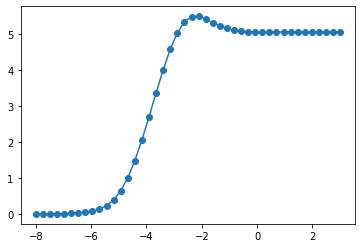

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 33 34
 35 36]
down idxs: [23 24 25 26 27 28 29 30 31]
[1.25729987e-03 2.26514905e-03 4.07971428e-03 7.34409078e-03
 1.32081828e-02 2.37151955e-02 4.24548516e-02 7.56083019e-02
 1.33446374e-01 2.32003326e-01 3.93750413e-01 6.44812433e-01
 1.00657688e+00 1.48437526e+00 2.06171628e+00 2.70471802e+00
 3.37074446e+00 4.01359930e+00 4.58526659e+00 5.03983615e+00
 5.34378520e+00 5.48929415e+00 5.05813732e+00 5.05930253e+00
 5.06107017e+00 5.06273573e+00]
[5.50098347 5.42845743 5.32590194 5.23153102 5.16105838 5.11463575
 5.08645188 5.07043442 5.06211623]


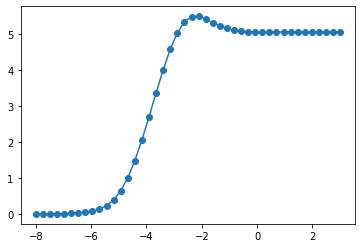

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 30 31 32 33 34 35 36 37 38 39 40 41 42]
down idxs: [28 29]
[8.30984196e-04 1.49728298e-03 2.69732091e-03 4.85750305e-03
 8.74232719e-03 1.57167631e-02 2.81997570e-02 5.04211666e-02
 8.96036278e-02 1.57573094e-01 2.72326084e-01 4.58002668e-01
 7.40588105e-01 1.13810054e+00 1.65002691e+00 2.25472213e+00
 2.91633376e+00 3.59345984e+00 4.24376785e+00 4.82668096e+00
 5.30916027e+00 5.67475125e+00 5.92847244e+00 6.09141353e+00
 6.18947833e+00 6.24487055e+00 6.27328554e+00 6.28486599e+00
 6.28095729e+00 6.28163570e+00 6.28640750e+00 6.29391352e+00
 6.30188433e+00 6.30857632e+00 6.31337600e+00 6.31648120e+00
 6.31836514e+00 6.31946513e+00 6.32009328e+00 6.32044747e+00
 6.32064577e+00]
[6.28647003 6.28360463]


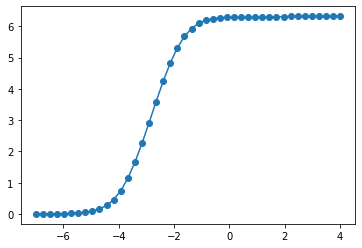

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 31 32 33 34 35 36 37 38]
down idxs: [28 29]
[1.49728298e-03 2.69732091e-03 4.85750305e-03 8.74232719e-03
 1.57167631e-02 2.81997570e-02 5.04211666e-02 8.96036278e-02
 1.57573094e-01 2.72326084e-01 4.58002668e-01 7.40588105e-01
 1.13810054e+00 1.65002691e+00 2.25472213e+00 2.91633376e+00
 3.59345984e+00 4.24376785e+00 4.82668096e+00 5.30916027e+00
 5.67475125e+00 5.92847244e+00 6.09141353e+00 6.18947833e+00
 6.24487055e+00 6.27328554e+00 6.28486599e+00 6.28163570e+00
 6.28640750e+00 6.29391352e+00 6.30188433e+00 6.30857632e+00
 6.31337600e+00 6.31648120e+00 6.31836514e+00]
[6.28647003 6.28360463]


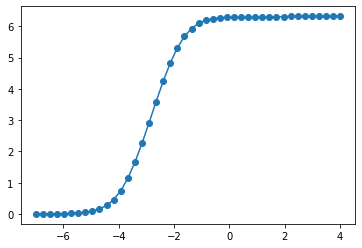

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 28 29 30 31 32 33 34]
down idxs: [17 18 19 20 21 22 23 24 25 26 27]
[6.14376850e-04 1.11029433e-03 2.00599008e-03 3.62256477e-03
 6.53637595e-03 1.17760187e-02 2.11581715e-02 3.78315441e-02
 6.70702506e-02 1.17174059e-01 1.99767597e-01 3.27721692e-01
 5.08363595e-01 7.32818672e-01 9.70145183e-01 1.17657975e+00
 1.31567904e+00 1.00182522e+00 1.00206236e+00 1.00240646e+00
 1.00268243e+00 1.00286595e+00 1.00297786e+00 1.00304312e+00]
[1.37269122 1.3559807  1.29086665 1.208865   1.1346937  1.07941337
 1.04318962 1.02160635 1.00988421 1.00430021 1.00221164]


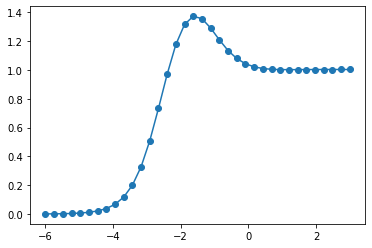

increasing tolerance
up_down


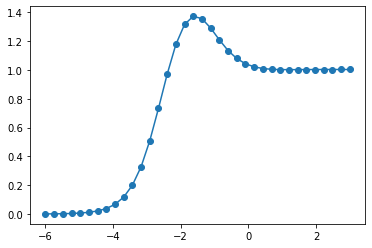

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 30 31
 32 33 34 35 36 37 38]
down idxs: [22 23 24 25 26 27 28 29]
[1.45621585e-04 2.62792085e-04 4.74219837e-04 8.55682616e-04
 1.54377347e-03 2.78446919e-03 5.01995061e-03 9.04260108e-03
 1.62643098e-02 2.91751773e-02 5.20867195e-02 9.22211251e-02
 1.60978146e-01 2.74516151e-01 4.51520941e-01 7.05449023e-01
 1.03199615e+00 1.40035645e+00 1.75892254e+00 2.05504004e+00
 2.25603429e+00 2.35859446e+00 2.25332534e+00 2.25474273e+00
 2.25691672e+00 2.25904986e+00 2.26072469e+00 2.26186942e+00
 2.26258684e+00 2.26301348e+00 2.26325954e+00]
[2.38407268 2.36530022 2.33177129 2.30088079 2.2785696  2.26461431
 2.25696558 2.25368394]


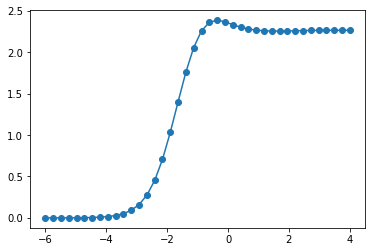

increasing tolerance
multipeak, setting yc=0
up idxs: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 30 31 32 33 34]
down idxs: [22 23 24 25 26 27 28]
[1.54377347e-03 2.78446919e-03 5.01995061e-03 9.04260108e-03
 1.62643098e-02 2.91751773e-02 5.20867195e-02 9.22211251e-02
 1.60978146e-01 2.74516151e-01 4.51520941e-01 7.05449023e-01
 1.03199615e+00 1.40035645e+00 1.75892254e+00 2.05504004e+00
 2.25603429e+00 2.35859446e+00 2.25332534e+00 2.25474273e+00
 2.25691672e+00 2.25904986e+00 2.26072469e+00]
[2.38407268 2.36530022 2.33177129 2.30088079 2.2785696  2.26461431
 2.25696558]


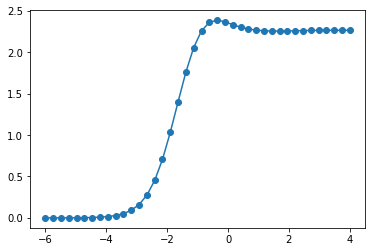

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 39
 40 41 42 43]
down idxs: [23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
[2.02928419e-04 3.65288615e-04 6.57519584e-04 1.18343385e-03
 2.12966966e-03 3.83142183e-03 6.88955520e-03 1.23775346e-02
 2.22015376e-02 3.97098267e-02 7.06708393e-02 1.24686930e-01
 2.16806584e-01 3.68261837e-01 6.03970889e-01 9.44437889e-01
 1.39398091e+00 1.93332729e+00 2.52217658e+00 3.10724848e+00
 3.62935318e+00 4.03087557e+00 4.26919555e+00 3.52434662e+00
 3.52437533e+00 3.52441121e+00 3.52443904e+00 3.52445734e+00]
[4.33444826 4.25864103 4.10378594 3.93375643 3.79004377 3.68651268
 3.61923216 3.5782557  3.5542658  3.54055292 3.5328396  3.52856902
 3.52626611 3.52509165 3.52455952 3.52437295]


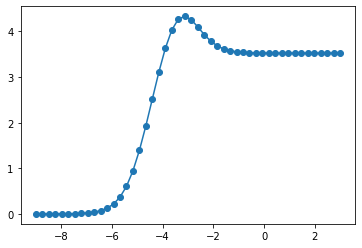

increasing tolerance
up_down


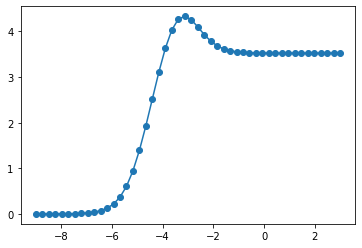

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 31 32
 33 34 35 36 37 38]
down idxs: [22 23 24 25 26 27 28 29 30]
[9.01850600e-04 1.62716467e-03 2.93519744e-03 5.29272109e-03
 9.53729861e-03 1.71649145e-02 3.08255197e-02 5.51440217e-02
 9.79816219e-02 1.72091159e-01 2.96542559e-01 4.96099791e-01
 7.95773690e-01 1.21001748e+00 1.73256003e+00 2.33526031e+00
 2.97551808e+00 3.60402198e+00 4.16910246e+00 4.62190185e+00
 4.92726221e+00 5.07759852e+00 4.75365147e+00 4.75541461e+00
 4.75802066e+00 4.76046808e+00 4.76232095e+00 4.76355492e+00
 4.76431541e+00 4.76476309e+00]
[5.09919876 5.04237181 4.95893359 4.88293974 4.82716718 4.79117271
 4.7700193  4.75886072 4.75419853]


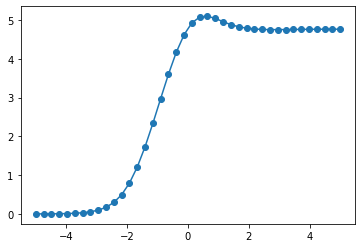

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 31 32 33
 34 35]
down idxs: [22 23 24 25 26 27 28 29]
[1.62716467e-03 2.93519744e-03 5.29272109e-03 9.53729861e-03
 1.71649145e-02 3.08255197e-02 5.51440217e-02 9.79816219e-02
 1.72091159e-01 2.96542559e-01 4.96099791e-01 7.95773690e-01
 1.21001748e+00 1.73256003e+00 2.33526031e+00 2.97551808e+00
 3.60402198e+00 4.16910246e+00 4.62190185e+00 4.92726221e+00
 5.07759852e+00 4.75365147e+00 4.75541461e+00 4.75802066e+00
 4.76046808e+00 4.76232095e+00]
[5.09919876 5.04237181 4.95893359 4.88293974 4.82716718 4.79117271
 4.7700193  4.75886072]


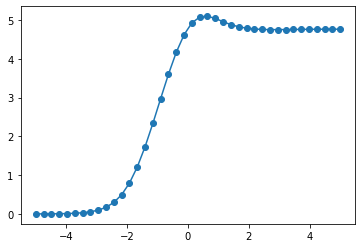

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 38 39 40 41 42]
down idxs: [28 29 30 31 32 33 34 35 36 37]
[1.35281160e-04 2.43800496e-04 4.39357925e-04 7.91732051e-04
 1.42657478e-03 2.56999700e-03 4.62838937e-03 8.33055731e-03
 1.49783577e-02 2.68808442e-02 4.80818255e-02 8.55048476e-02
 1.50540004e-01 2.60664405e-01 4.39661003e-01 7.13810524e-01
 1.10251266e+00 1.60750760e+00 2.20946695e+00 2.87444530e+00
 3.56271706e+00 4.23335558e+00 4.84569541e+00 5.36292010e+00
 5.76015695e+00 6.03184208e+00 6.19048113e+00 6.25804765e+00
 6.00825333e+00 6.00851494e+00 6.00925245e+00 6.01006241e+00
 6.01072707e+00]
[6.25910228 6.21923244 6.1634247  6.1107534  6.07038256 6.04324065
 6.02648465 6.01676602 6.01150357 6.00901428]


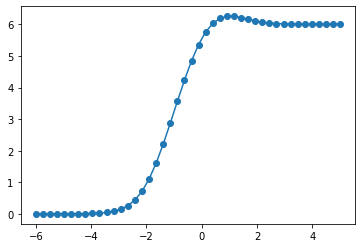

increasing tolerance
up_down


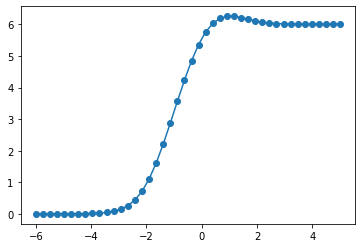

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 28 29 30]
down idxs: [18 19 20 21 22 23 24 25 26 27]
[2.03108168e-04 3.67899777e-04 6.66317248e-04 1.20653789e-03
 2.18391166e-03 3.95029358e-03 7.13645378e-03 1.28635612e-02
 2.30937668e-02 4.11651976e-02 7.24688333e-02 1.24899289e-01
 2.07953539e-01 3.28496703e-01 4.82441209e-01 6.47670450e-01
 7.88874880e-01 8.75816413e-01 7.05189866e-01 7.05288874e-01
 7.05482134e-01]
[0.90013517 0.87698729 0.83246804 0.78813919 0.7540996  0.73155898
 0.71803387 0.71059819 0.70696322 0.7055236 ]


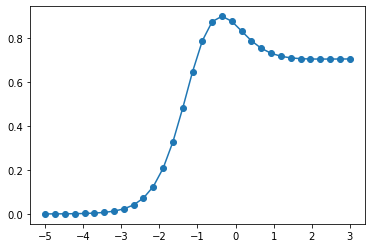

increasing tolerance
up_down


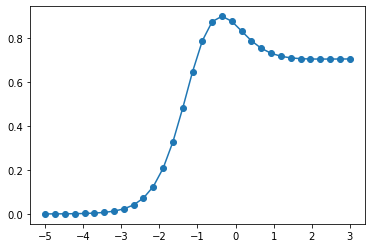

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 27 28 29 30 31
 32 33 34]
down idxs: [19 20 21 22 23 24 25 26]
[4.24734903e-04 7.67693067e-04 1.38738887e-03 2.50669841e-03
 4.52702992e-03 8.16916116e-03 1.47203170e-02 2.64568717e-02
 4.73337881e-02 8.40065825e-02 1.47048807e-01 2.51586592e-01
 4.15337997e-01 6.51287921e-01 9.55306074e-01 1.29699745e+00
 1.62521234e+00 1.88840633e+00 2.05595761e+00 1.94073978e+00
 1.94183120e+00 1.94434370e+00 1.94693960e+00 1.94898337e+00
 1.95037041e+00 1.95123319e+00 1.95174326e+00]
[2.12693427 2.12489584 2.08438228 2.03546925 1.99485149 1.96714211
 1.9508574  1.94297924]


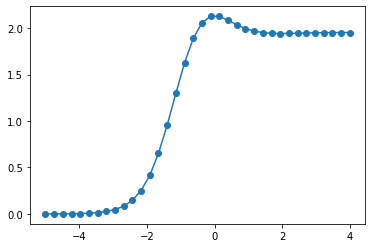

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 27 28 29 30 31]
down idxs: [19 20 21 22 23 24 25 26]
[1.38738887e-03 2.50669841e-03 4.52702992e-03 8.16916116e-03
 1.47203170e-02 2.64568717e-02 4.73337881e-02 8.40065825e-02
 1.47048807e-01 2.51586592e-01 4.15337997e-01 6.51287921e-01
 9.55306074e-01 1.29699745e+00 1.62521234e+00 1.88840633e+00
 2.05595761e+00 1.94073978e+00 1.94183120e+00 1.94434370e+00
 1.94693960e+00 1.94898337e+00]
[2.12693427 2.12489584 2.08438228 2.03546925 1.99485149 1.96714211
 1.9508574  1.94297924]


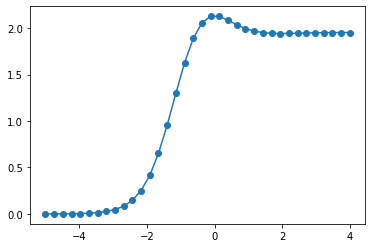

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 28 29 30 31 32 33 34 35 36 37 38]
down idxs: [25 26 27]
[1.26211057e-04 2.27766216e-04 4.11023299e-04 7.41680618e-04
 1.33819485e-03 2.41398795e-03 4.35305986e-03 7.84463960e-03
 1.41203751e-02 2.53638632e-02 4.53917596e-02 8.07073226e-02
 1.41899180e-01 2.44867974e-01 4.10257555e-01 6.58289501e-01
 9.97637941e-01 1.41342993e+00 1.86471720e+00 2.29599528e+00
 2.65668109e+00 2.91811309e+00 3.07931113e+00 3.16035334e+00
 3.19004935e+00 3.18724178e+00 3.18953291e+00 3.19338933e+00
 3.19743053e+00 3.20075357e+00 3.20309611e+00 3.20459304e+00
 3.20549372e+00 3.20601670e+00 3.20631421e+00 3.20648150e+00]
[3.19454815 3.19102423 3.18771445]


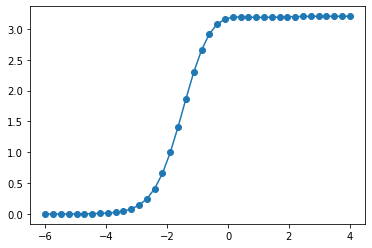

increasing tolerance
multipeak, setting yc=0
up idxs: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 28 29 30
 31 32 33]
down idxs: [25 26]
[1.33819485e-03 2.41398795e-03 4.35305986e-03 7.84463960e-03
 1.41203751e-02 2.53638632e-02 4.53917596e-02 8.07073226e-02
 1.41899180e-01 2.44867974e-01 4.10257555e-01 6.58289501e-01
 9.97637941e-01 1.41342993e+00 1.86471720e+00 2.29599528e+00
 2.65668109e+00 2.91811309e+00 3.07931113e+00 3.16035334e+00
 3.19004935e+00 3.18724178e+00 3.18953291e+00 3.19338933e+00
 3.19743053e+00 3.20075357e+00 3.20309611e+00]
[3.19454815 3.19102423]


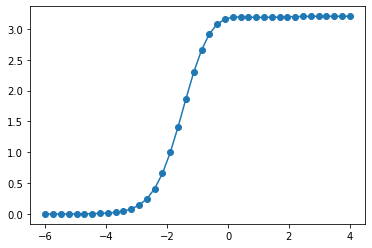

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 33 34]
down idxs: [24 25 26 27 28 29 30 31 32]
[6.04247646e-04 1.09214078e-03 1.97368736e-03 3.56584678e-03
 6.43930164e-03 1.16182259e-02 2.09299096e-02 3.76003370e-02
 6.72181930e-02 1.19144686e-01 2.08154176e-01 3.55253741e-01
 5.85275611e-01 9.18667391e-01 1.35920590e+00 1.88605481e+00
 2.45688943e+00 3.01875800e+00 3.52048689e+00 3.92492607e+00
 4.21806144e+00 4.40844146e+00 4.51690080e+00 4.56564677e+00
 4.46018866e+00 4.46035289e+00]
[4.57368516 4.55746014 4.53145078 4.50624025 4.48688524 4.47404928
 4.46642013 4.46238578 4.46063349]


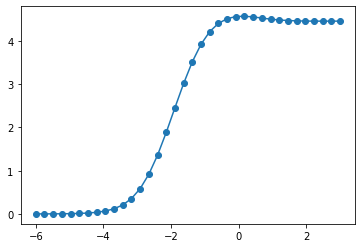

increasing tolerance
up_down


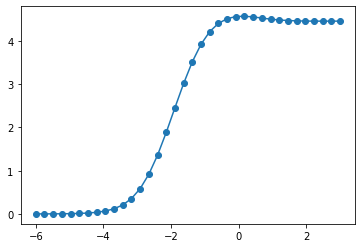

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 31 32 33 34 35 36 37 38]
down idxs: [25 26 27 28 29 30]
[5.12674130e-04 9.25098164e-04 1.66910208e-03 3.01082436e-03
 5.42901677e-03 9.78265892e-03 1.76057339e-02 3.16146994e-02
 5.65480572e-02 1.00452755e-01 1.76362806e-01 3.03720067e-01
 5.07679294e-01 8.13540602e-01 1.23597493e+00 1.76930291e+00
 2.38711333e+00 3.05034203e+00 3.71537422e+00 4.33824389e+00
 4.87849467e+00 5.30673032e+00 5.61282821e+00 5.80639319e+00
 5.90768287e+00 5.69300459e+00 5.69448434e+00 5.70030711e+00
 5.70599451e+00 5.71015210e+00 5.71282164e+00 5.71442464e+00
 5.71535304e+00]
[5.9375831  5.91456249 5.85815655 5.79153213 5.73639544 5.70408665]


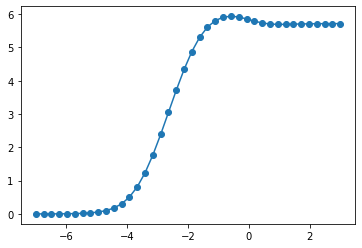

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 31
 32 33 34 35 36]
down idxs: [25 26 27 28 29 30]
[1.66910208e-03 3.01082436e-03 5.42901677e-03 9.78265892e-03
 1.76057339e-02 3.16146994e-02 5.65480572e-02 1.00452755e-01
 1.76362806e-01 3.03720067e-01 5.07679294e-01 8.13540602e-01
 1.23597493e+00 1.76930291e+00 2.38711333e+00 3.05034203e+00
 3.71537422e+00 4.33824389e+00 4.87849467e+00 5.30673032e+00
 5.61282821e+00 5.80639319e+00 5.90768287e+00 5.69300459e+00
 5.69448434e+00 5.70030711e+00 5.70599451e+00 5.71015210e+00
 5.71282164e+00]
[5.9375831  5.91456249 5.85815655 5.79153213 5.73639544 5.70408665]


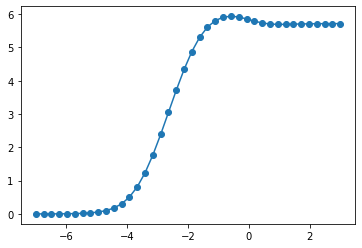

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 26 27 28
 29 30]
down idxs: [21 22 23 24 25]
[3.62940661e-05 6.57468414e-05 1.19095040e-04 2.15712517e-04
 3.90651794e-04 7.07265798e-04 1.27983923e-03 2.31382477e-03
 4.17626629e-03 7.51547935e-03 1.34531148e-02 2.38574252e-02
 4.16280517e-02 7.06915487e-02 1.14996452e-01 1.75718343e-01
 2.47587158e-01 3.18511967e-01 3.75436600e-01 4.11560298e-01
 4.28231753e-01 4.19936026e-01 4.20171375e-01 4.20830003e-01
 4.21568601e-01 4.22183719e-01]
[0.43180034 0.4292508  0.42535924 0.42227764 0.42052074]


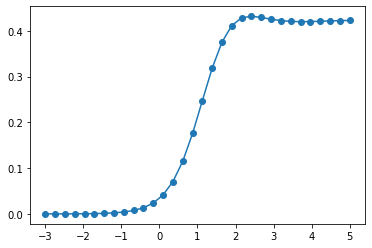

increasing tolerance
up_down


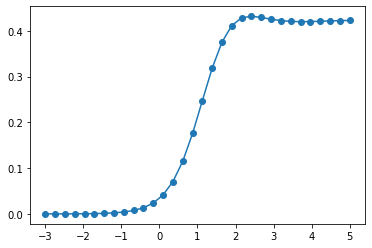

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 33 34]
down idxs: [20 21 22 23 24 25 26 27 28 29 30 31]
[2.45566962e-04 4.43879842e-04 8.02273889e-04 1.44980897e-03
 2.61923275e-03 4.72946647e-03 8.53187083e-03 1.53654981e-02
 2.75894466e-02 4.92742880e-02 8.71840014e-02 1.51812757e-01
 2.57487160e-01 4.19279902e-01 6.44238264e-01 9.18891706e-01
 1.20376985e+00 1.44657981e+00 1.60981847e+00 1.69047418e+00
 1.67154665e+00 1.67157192e+00]
[1.71367091 1.70975022 1.69859827 1.68857538 1.68159215 1.67723616
 1.67466699 1.67319775 1.67237448 1.67192324 1.67168648 1.67157568]


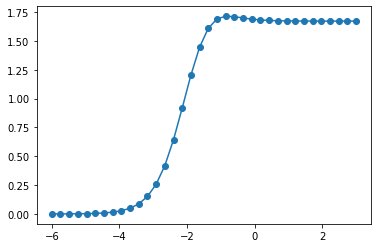

increasing tolerance
up_down


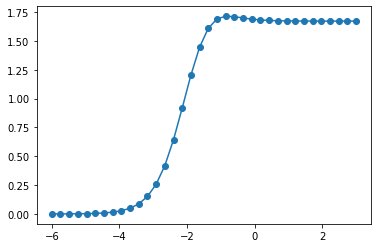

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 30 31 32 33 34 35 36 37 38]
down idxs: [24 25 26 27 28 29]
[5.68344421e-04 1.02408766e-03 1.84498054e-03 3.32291215e-03
 5.98158735e-03 1.07572671e-02 1.93129931e-02 3.45686791e-02
 6.15454018e-02 1.08561661e-01 1.88510948e-01 3.19117119e-01
 5.19780114e-01 8.02644903e-01 1.16020056e+00 1.55916030e+00
 1.94938364e+00 2.28417742e+00 2.53813655e+00 2.71088191e+00
 2.81768819e+00 2.87773384e+00 2.90760434e+00 2.91982230e+00
 2.91982108e+00 2.91987474e+00 2.92000339e+00 2.92014511e+00
 2.92026310e+00 2.92034661e+00 2.92040007e+00 2.92043228e+00
 2.92045101e+00]
[2.92314096 2.92292863 2.92184414 2.92087414 2.92024141 2.91991687]


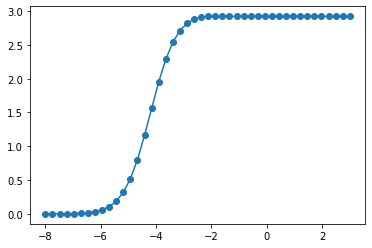

increasing tolerance
up_down


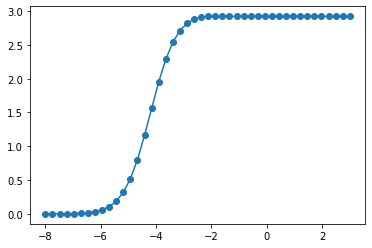

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 34 35 36 37 38 39 40 41 42]
down idxs: [25 26 27 28 29 30 31 32 33]
[2.44107496e-04 4.39909122e-04 7.92718647e-04 1.42833081e-03
 2.57309025e-03 4.63373232e-03 8.33943670e-03 1.49919431e-02
 2.68975823e-02 4.80874335e-02 8.54385386e-02 1.50190256e-01
 2.59376580e-01 4.35615296e-01 7.02526148e-01 1.07436536e+00
 1.54445828e+00 2.08150113e+00 2.63671397e+00 3.15629955e+00
 3.59458454e+00 3.92549293e+00 4.14678180e+00 4.27355149e+00
 4.32740997e+00 4.16851161e+00 4.16867922e+00 4.16902662e+00
 4.16933313e+00 4.16954734e+00 4.16968180e+00 4.16976161e+00
 4.16980757e+00 4.16983360e+00]
[4.33018906 4.30299907 4.2650353  4.22990631 4.20360056 4.1864452
 4.17641502 4.17123162 4.16905202]


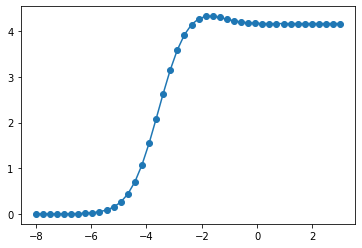

increasing tolerance
up_down


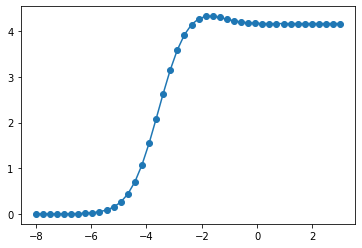

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 37 38 39 40 41 42 43 44 45]
down idxs: [24 25 26 27 28 29 30 31 32 33 34 35 36]
[5.05984451e-04 9.10739169e-04 1.63908335e-03 2.94929668e-03
 5.30487129e-03 9.53547231e-03 1.71195375e-02 3.06703714e-02
 5.47410201e-02 9.70630923e-02 1.70186021e-01 2.92941348e-01
 4.90018965e-01 7.86977789e-01 1.20002615e+00 1.72617857e+00
 2.34213504e+00 3.01191811e+00 3.69497765e+00 4.34969694e+00
 4.93482028e+00 5.41391304e+00 5.76366113e+00 5.97950001e+00
 5.40704627e+00 5.40722172e+00 5.40753718e+00 5.40780697e+00
 5.40799283e+00 5.40810866e+00 5.40817718e+00 5.40821658e+00
 5.40823889e+00]
[6.07262452 6.06309547 5.97767869 5.85072231 5.71852941 5.6073268
 5.52682696 5.47433736 5.44247868 5.42417549 5.41427498 5.40942522
 5.40748438]


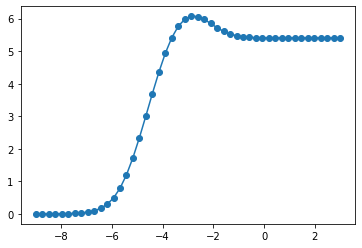

increasing tolerance
up_down


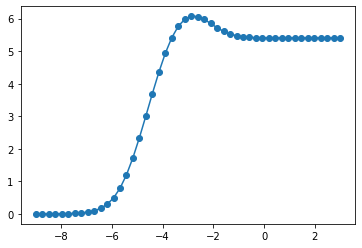

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 22 23 24 25 26 27 28]
down idxs: [15 16 17 18 19 20]
[0.00016269 0.00029392 0.00053071 0.00095738 0.00172413 0.0030955
 0.00552747 0.00977543 0.01700057 0.02873972 0.04641472 0.06999917
 0.09625115 0.11870351 0.13131475 0.10831554 0.10848732 0.10865576
 0.1087768  0.10885344 0.10889902 0.10892524]
[0.1329467  0.12753935 0.12025041 0.11429616 0.11061172 0.10885882]


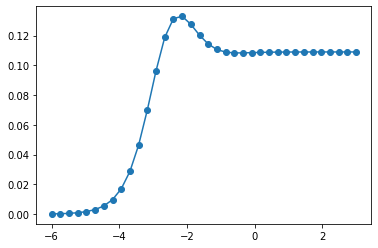

increasing tolerance
up_down


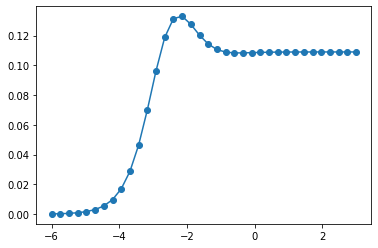

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 25 26 27 28
 29 30 31 32 33 34]
down idxs: [20 21 22 23 24]
[4.12548061e-04 7.45616393e-04 1.34733023e-03 2.43379536e-03
 4.39365481e-03 7.92291079e-03 1.42585639e-02 2.55690995e-02
 4.55623358e-02 8.02970092e-02 1.38879719e-01 2.32972021e-01
 3.73035052e-01 5.59971939e-01 7.76425611e-01 9.88445153e-01
 1.16146751e+00 1.27740202e+00 1.33867941e+00 1.36078951e+00
 1.34292353e+00 1.34422310e+00 1.34624178e+00 1.34832588e+00
 1.35004195e+00 1.35125704e+00 1.35203616e+00 1.35250576e+00
 1.35277853e+00 1.35293362e+00]
[1.36196618 1.35582566 1.34939206 1.34503393 1.3430072 ]


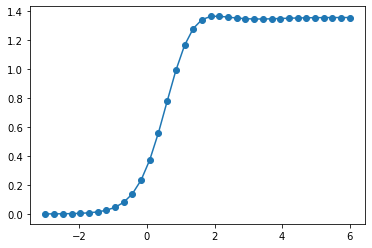

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 25 26 27 28 29]
down idxs: [20 21 22 23]
[1.34733023e-03 2.43379536e-03 4.39365481e-03 7.92291079e-03
 1.42585639e-02 2.55690995e-02 4.55623358e-02 8.02970092e-02
 1.38879719e-01 2.32972021e-01 3.73035052e-01 5.59971939e-01
 7.76425611e-01 9.88445153e-01 1.16146751e+00 1.27740202e+00
 1.33867941e+00 1.36078951e+00 1.34292353e+00 1.34422310e+00
 1.34624178e+00 1.34832588e+00 1.35004195e+00]
[1.36196618 1.35582566 1.34939206 1.34503393]


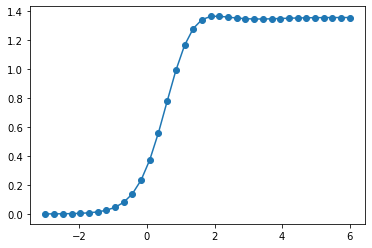

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 36 37 38
 39 40]
down idxs: [21 22 23 24 25 26 27 28 29 30 31 32 33 34]
[2.81069937e-04 5.06510648e-04 9.12705926e-04 1.64443123e-03
 2.96208233e-03 5.33325614e-03 9.59518631e-03 1.72391222e-02
 3.08963825e-02 5.51324146e-02 9.76337877e-02 1.70668098e-01
 2.92041094e-01 4.83519407e-01 7.63886543e-01 1.13656016e+00
 1.57857716e+00 2.04005074e+00 2.45566726e+00 2.76419015e+00
 2.93178620e+00 2.62045948e+00 2.62049021e+00 2.62052587e+00
 2.62055386e+00 2.62057253e+00]
[2.96813962 2.9192814  2.83912752 2.76422335 2.70855949 2.67206231
 2.64979675 2.63676673 2.62932335 2.62513524 2.62280928 2.62154324
 2.62088432 2.62057637]


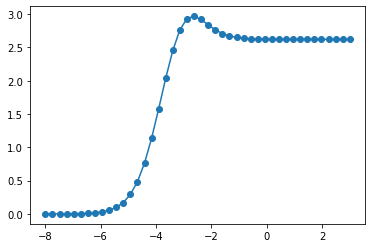

increasing tolerance
up_down


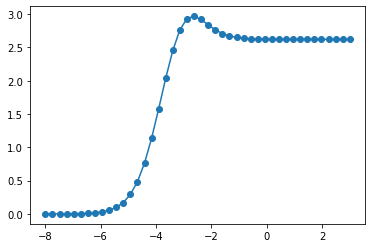

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 33 34]
down idxs: [21 22 23 24 25 26 27 28 29 30 31]
[6.45014784e-04 1.16581518e-03 2.10679803e-03 3.80623347e-03
 6.87306188e-03 1.23997544e-02 2.23342945e-02 4.01120870e-02
 7.16734077e-02 1.26935706e-01 2.21463817e-01 3.77186745e-01
 6.19659383e-01 9.69475691e-01 1.43017569e+00 1.98125973e+00
 2.58175304e+00 3.17924218e+00 3.71783882e+00 4.14588617e+00
 4.42628778e+00 3.85432164e+00 3.85437277e+00]
[4.54653889 4.52322649 4.39966651 4.23463418 4.08170792 3.97084344
 3.90551544 3.87362912 3.86053247 3.85595293 3.85461088]


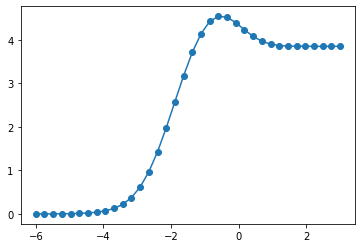

increasing tolerance
up_down


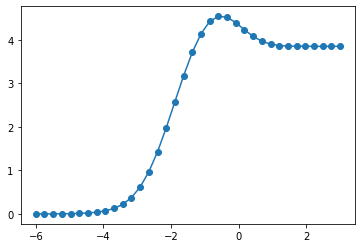

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 30
 31 32 33 34 35 36 37 38]
down idxs: [23 24 25 26 27 28 29]
[5.98543451e-04 1.08001836e-03 1.94852713e-03 3.51457940e-03
 6.33643505e-03 1.14147252e-02 2.05331817e-02 3.68403423e-02
 6.57968199e-02 1.16581486e-01 2.03797380e-01 3.48558960e-01
 5.76740580e-01 9.11792879e-01 1.36329270e+00 1.91898158e+00
 2.54701189e+00 3.20454173e+00 3.84436430e+00 4.41801413e+00
 4.88032793e+00 5.19918824e+00 5.36681002e+00 5.07341788e+00
 5.07838280e+00 5.08706323e+00 5.09573015e+00 5.10252611e+00
 5.10715023e+00 5.11003697e+00 5.11174919e+00 5.11273506e+00]
[5.40451833 5.35644542 5.27295898 5.19211823 5.13182609 5.09479231
 5.07710966]


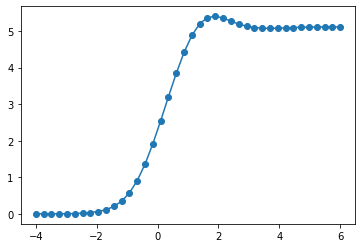

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 30 31 32
 33 34 35 36]
down idxs: [23 24 25 26 27 28 29]
[1.94852713e-03 3.51457940e-03 6.33643505e-03 1.14147252e-02
 2.05331817e-02 3.68403423e-02 6.57968199e-02 1.16581486e-01
 2.03797380e-01 3.48558960e-01 5.76740580e-01 9.11792879e-01
 1.36329270e+00 1.91898158e+00 2.54701189e+00 3.20454173e+00
 3.84436430e+00 4.41801413e+00 4.88032793e+00 5.19918824e+00
 5.36681002e+00 5.07341788e+00 5.07838280e+00 5.08706323e+00
 5.09573015e+00 5.10252611e+00 5.10715023e+00 5.11003697e+00]
[5.40451833 5.35644542 5.27295898 5.19211823 5.13182609 5.09479231
 5.07710966]


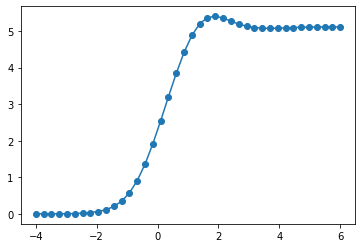

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 38 39 40 41 42]
down idxs: [29 30 31 32 33 34 35 36 37]
[2.15590157e-04 3.88522613e-04 7.00135912e-04 1.26156608e-03
 2.27283802e-03 4.09357235e-03 7.36906858e-03 1.32532059e-02
 2.37963604e-02 4.26012012e-02 7.58722793e-02 1.33922787e-01
 2.32863820e-01 3.95306091e-01 6.47626837e-01 1.01166668e+00
 1.49355946e+00 2.07820961e+00 2.73410336e+00 3.42245776e+00
 4.10291337e+00 4.73533137e+00 5.28265260e+00 5.71840416e+00
 6.03523711e+00 6.24581003e+00 6.37389152e+00 6.44343203e+00
 6.47270279e+00 6.34922728e+00 6.34974941e+00 6.35059976e+00
 6.35138895e+00 6.35197355e+00]
[6.47414556 6.45724811 6.43112874 6.40426469 6.38223147 6.36679638
 6.35722295 6.35198617 6.34968525]


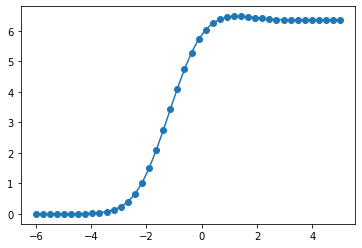

increasing tolerance
up_down


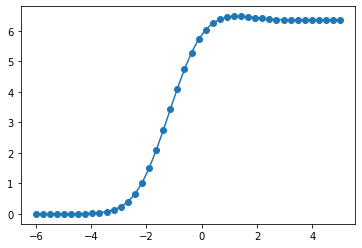

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 30]
down idxs: [19 20 21 22 23 24 25 26 27 28 29]
[2.22980111e-04 4.03903386e-04 7.31552912e-04 1.32475608e-03
 2.39819674e-03 4.33888537e-03 7.84169838e-03 1.41452627e-02
 2.54285695e-02 4.54342625e-02 8.03159263e-02 1.39405618e-01
 2.34813296e-01 3.77621127e-01 5.68819551e-01 7.88684787e-01
 9.96448771e-01 1.14818526e+00 1.22157093e+00 1.05080854e+00]
[1.22626342 1.19223471 1.14874276 1.11206013 1.0864657  1.07038771
 1.06090853 1.05557953 1.05275064 1.05139914 1.05088956]


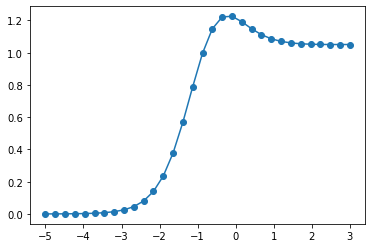

increasing tolerance
up_down


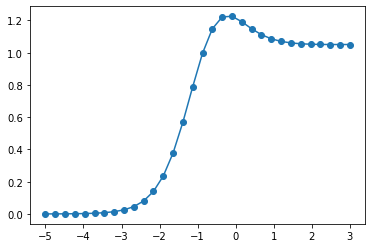

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 26 27 28 29 30
 31 32 33 34]
down idxs: [19 20 21 22 23 24 25]
[8.03411722e-04 1.45193637e-03 2.62330846e-03 4.73758326e-03
 8.54897743e-03 1.54042938e-02 2.76848318e-02 4.95265617e-02
 8.78860879e-02 1.53807288e-01 2.63078150e-01 4.34209775e-01
 6.80960100e-01 9.99857975e-01 1.36114249e+00 1.71427422e+00
 2.00800464e+00 2.21146549e+00 2.32260187e+00 2.29448385e+00
 2.29478965e+00 2.29640789e+00 2.29860333e+00 2.30072682e+00
 2.30240289e+00 2.30355690e+00 2.30428389e+00 2.30471742e+00]
[2.36212021 2.35999071 2.34209827 2.32347887 2.30959078 2.30087535
 2.29622268]


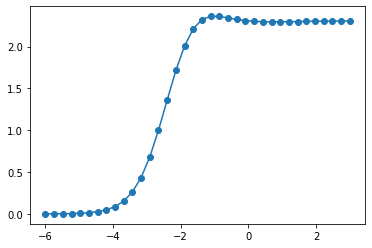

increasing tolerance
multipeak, setting yc=0
up idxs: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 27 28 29 30 31]
down idxs: [19 20 21 22 23 24 25]
[1.45193637e-03 2.62330846e-03 4.73758326e-03 8.54897743e-03
 1.54042938e-02 2.76848318e-02 4.95265617e-02 8.78860879e-02
 1.53807288e-01 2.63078150e-01 4.34209775e-01 6.80960100e-01
 9.99857975e-01 1.36114249e+00 1.71427422e+00 2.00800464e+00
 2.21146549e+00 2.32260187e+00 2.29478965e+00 2.29640789e+00
 2.29860333e+00 2.30072682e+00 2.30240289e+00]
[2.36212021 2.35999071 2.34209827 2.32347887 2.30959078 2.30087535
 2.29622268]


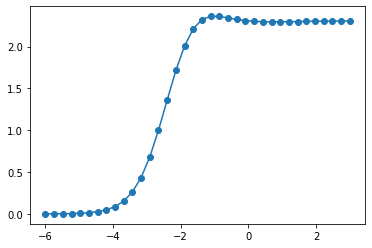

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 32 33
 34 35 36 37 38]
down idxs: [22 23 24 25 26 27 28 29 30 31]
[2.77684879e-04 5.01102750e-04 9.04216906e-04 1.63142329e-03
 2.94284436e-03 5.30639591e-03 9.56157023e-03 1.72074017e-02
 3.08979751e-02 5.52614023e-02 9.81519352e-02 1.72274210e-01
 2.96522114e-01 4.95159705e-01 7.92035801e-01 1.19936593e+00
 1.70717922e+00 2.28173074e+00 2.87239047e+00 3.41962343e+00
 3.86227204e+00 4.14986953e+00 3.56657856e+00 3.56745558e+00
 3.56898261e+00 3.57030308e+00 3.57122108e+00 3.57179602e+00
 3.57213675e+00]
[4.26194606 4.22220175 4.09035977 3.93299324 3.79586364 3.69627345
 3.63236997 3.59531793 3.5762705  3.56836284]


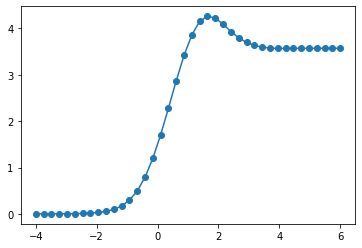

increasing tolerance
multipeak, setting yc=0
up idxs: [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 33 34]
down idxs: [22 23 24 25 26 27 28 29 30 31]
[1.63142329e-03 2.94284436e-03 5.30639591e-03 9.56157023e-03
 1.72074017e-02 3.08979751e-02 5.52614023e-02 9.81519352e-02
 1.72274210e-01 2.96522114e-01 4.95159705e-01 7.92035801e-01
 1.19936593e+00 1.70717922e+00 2.28173074e+00 2.87239047e+00
 3.41962343e+00 3.86227204e+00 4.14986953e+00 3.56745558e+00
 3.56898261e+00]
[4.26194606 4.22220175 4.09035977 3.93299324 3.79586364 3.69627345
 3.63236997 3.59531793 3.5762705  3.56836284]


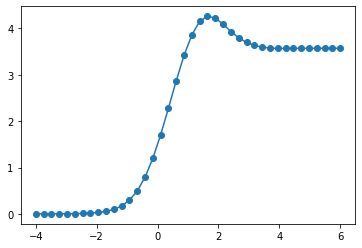

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 33 34 35 36 37 38 39 40 41 42]
down idxs: [25 26 27 28 29 30 31 32]
[1.46683020e-04 2.64347622e-04 4.76382969e-04 8.58441040e-04
 1.54673834e-03 2.78635878e-03 5.01767036e-03 9.03001526e-03
 1.62321125e-02 2.91185014e-02 5.20451544e-02 9.24315658e-02
 1.62372293e-01 2.80127949e-01 4.69844477e-01 7.56780382e-01
 1.15703629e+00 1.66696821e+00 2.26086443e+00 2.89773748e+00
 3.52944665e+00 4.10552341e+00 4.57797184e+00 4.91064799e+00
 5.09127059e+00 4.78938170e+00 4.79356737e+00 4.79920816e+00
 4.80425452e+00 4.80795470e+00 4.81036967e+00 4.81184048e+00
 4.81270082e+00 4.81319256e+00 4.81346997e+00]
[5.13795184 5.09390844 5.01044643 4.92722899 4.86336458 4.82200708
 4.79925962 4.78993321]


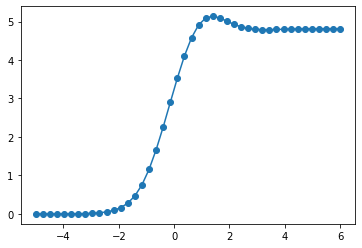

increasing tolerance
multipeak, setting yc=0
up idxs: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 33 34 35
 36 37 38]
down idxs: [25 26 27 28 29 30 31]
[1.54673834e-03 2.78635878e-03 5.01767036e-03 9.03001526e-03
 1.62321125e-02 2.91185014e-02 5.20451544e-02 9.24315658e-02
 1.62372293e-01 2.80127949e-01 4.69844477e-01 7.56780382e-01
 1.15703629e+00 1.66696821e+00 2.26086443e+00 2.89773748e+00
 3.52944665e+00 4.10552341e+00 4.57797184e+00 4.91064799e+00
 5.09127059e+00 4.78938170e+00 4.79356737e+00 4.79920816e+00
 4.80425452e+00 4.80795470e+00 4.81036967e+00]
[5.13795184 5.09390844 5.01044643 4.92722899 4.86336458 4.82200708
 4.79925962]


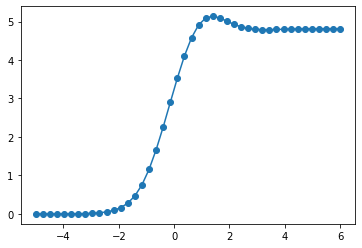

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 33 34 35 36 37 38 39 40 41 42 43 44 45 46]
down idxs: [27 28 29 30 31 32]
[2.63786583e-04 4.74831308e-04 8.54673010e-04 1.53820369e-03
 2.76785645e-03 4.97876962e-03 8.95012268e-03 1.60712486e-02
 2.88006699e-02 5.14302260e-02 9.12734745e-02 1.60274152e-01
 2.76545320e-01 4.64269098e-01 7.49303326e-01 1.14937368e+00
 1.66373099e+00 2.27085052e+00 2.93543565e+00 3.61682543e+00
 4.27299306e+00 4.86208063e+00 5.34681903e+00 5.70365838e+00
 5.93099449e+00 6.04909650e+00 6.09155284e+00 6.04244967e+00
 6.04262228e+00 6.04415178e+00 6.04667921e+00 6.04967153e+00
 6.05251763e+00 6.05479399e+00 6.05639048e+00 6.05741257e+00
 6.05802970e+00 6.05838933e+00 6.05859459e+00 6.05871037e+00
 6.05877522e+00]
[6.09318363 6.07991642 6.06549676 6.05464305 6.04775614 6.04397679]


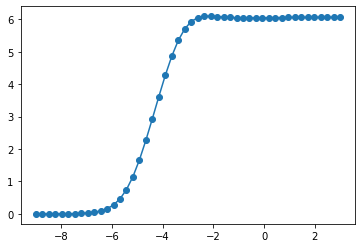

increasing tolerance
multipeak, setting yc=0
up idxs: [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
 34 35 36 37 38 39 40]
down idxs: [27 28 29 30 31 32]
[1.53820369e-03 2.76785645e-03 4.97876962e-03 8.95012268e-03
 1.60712486e-02 2.88006699e-02 5.14302260e-02 9.12734745e-02
 1.60274152e-01 2.76545320e-01 4.64269098e-01 7.49303326e-01
 1.14937368e+00 1.66373099e+00 2.27085052e+00 2.93543565e+00
 3.61682543e+00 4.27299306e+00 4.86208063e+00 5.34681903e+00
 5.70365838e+00 5.93099449e+00 6.04909650e+00 6.09155284e+00
 6.04262228e+00 6.04415178e+00 6.04667921e+00 6.04967153e+00
 6.05251763e+00 6.05479399e+00 6.05639048e+00]
[6.09318363 6.07991642 6.06549676 6.05464305 6.04775614 6.04397679]


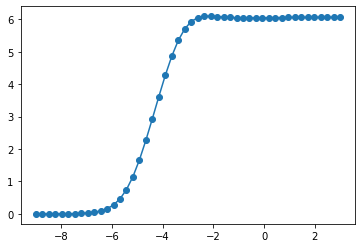

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 24 25 26]
down idxs: [18 19 20 21 22]
[1.79817935e-04 3.26608934e-04 5.93158433e-04 1.07700623e-03
 1.95475827e-03 3.54531518e-03 6.42169846e-03 1.16043777e-02
 2.08812298e-02 3.72922681e-02 6.57277501e-02 1.13266344e-01
 1.88148816e-01 2.95535276e-01 4.29697903e-01 5.68631464e-01
 6.81577106e-01 7.48314638e-01 7.49532710e-01 7.49748778e-01
 7.49950434e-01]
[0.77149193 0.76953496 0.76056515 0.7536977  0.75047531]


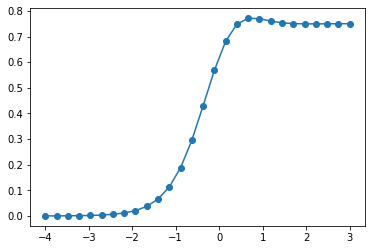

increasing tolerance
up_down


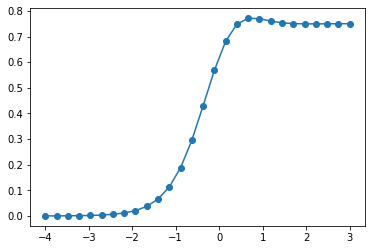

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 35 36
 37 38 39 40]
down idxs: [22 23 24 25 26 27 28 29 30 31 32 33]
[1.29891341e-04 2.34086137e-04 4.21848375e-04 7.60169404e-04
 1.36967122e-03 2.46737820e-03 4.44323575e-03 7.99618799e-03
 1.43735603e-02 2.57838639e-02 4.60826708e-02 8.18331668e-02
 1.43716466e-01 2.47781829e-01 4.14930379e-01 6.65837798e-01
 1.00983740e+00 1.43239821e+00 1.89074812e+00 2.32186677e+00
 2.65891709e+00 2.85156857e+00 2.01316915e+00 2.01327645e+00
 2.01337388e+00 2.01344069e+00 2.01348189e+00 2.01350607e+00]
[2.88485446 2.78654403 2.61498472 2.43200642 2.27861731 2.16863115
 2.09781194 2.05570152 2.03243575 2.02070413 2.01551845 2.01363798]


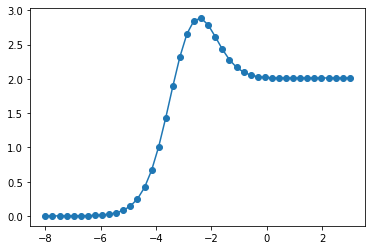

increasing tolerance
up_down


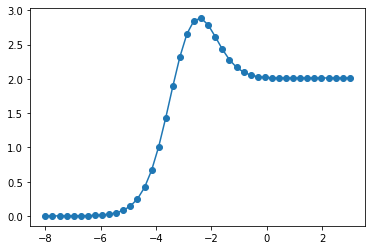

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 32 33 34]
down idxs: [20 21 22 23 24 25 26 27 28 29 30 31]
[6.56506182e-04 1.18657876e-03 2.14430048e-03 3.87392055e-03
 6.99507056e-03 1.26191685e-02 2.27272298e-02 4.08105239e-02
 7.28984937e-02 1.29035193e-01 2.24921406e-01 3.82516297e-01
 6.27040468e-01 9.78044522e-01 1.43711253e+00 1.98086202e+00
 2.56425488e+00 3.12890121e+00 3.61071119e+00 3.95015762e+00
 3.25998168e+00 3.26035107e+00 3.26099678e+00]
[4.11064103 4.0983506  3.9643653  3.78053032 3.60647591 3.47197826
 3.38083997 3.32426813 3.29132551 3.27332216 3.26440346 3.26079063]


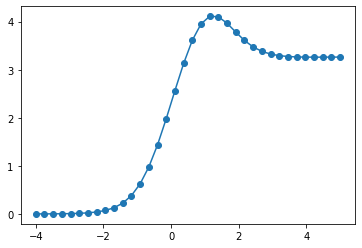

increasing tolerance
up_down


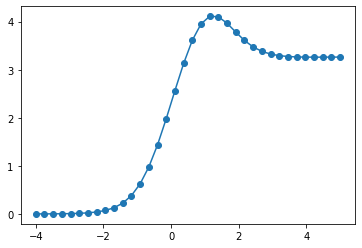

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 34 35
 36 37 38 39 40 41 42]
down idxs: [22 23 24 25 26 27 28 29 30 31 32 33]
[6.57062445e-04 1.18396460e-03 2.13307029e-03 3.84196573e-03
 6.91654755e-03 1.24406728e-02 2.23416792e-02 4.00104010e-02
 7.12998639e-02 1.25977728e-01 2.19407216e-01 3.73395704e-01
 6.13856839e-01 9.62927118e-01 1.42753464e+00 1.99258865e+00
 2.62433550e+00 3.27875910e+00 3.90706476e+00 4.45770275e+00
 4.88078388e+00 5.13981800e+00 4.50357626e+00 4.50397467e+00
 4.50466119e+00 4.50528059e+00 4.50572646e+00 4.50601242e+00
 4.50618447e+00 4.50628435e+00 4.50634119e+00]
[5.22757586 5.17444167 5.03897283 4.88307822 4.74855937 4.65065487
 4.58677681 4.54794661 4.52548705 4.51311455 4.50682427 4.50416708]


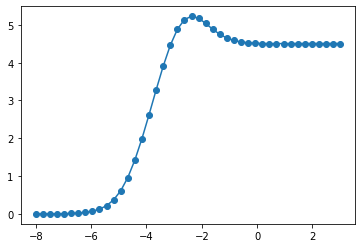

increasing tolerance
up_down


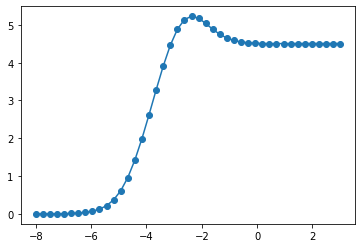

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 38 39 40 41 42 43 44 45 46 47 48]
down idxs: [27 28 29 30 31 32 33 34 35 36 37]
[1.26767110e-04 2.27978008e-04 4.09983963e-04 7.37256139e-04
 1.32565246e-03 2.38324474e-03 4.28329222e-03 7.69402704e-03
 1.38074146e-02 2.47358140e-02 4.41792995e-02 7.84860679e-02
 1.38156354e-01 2.39483500e-01 4.05114381e-01 6.61079288e-01
 1.02832514e+00 1.51173158e+00 2.09503182e+00 2.74577988e+00
 3.42417762e+00 4.08838370e+00 4.69628481e+00 5.20869888e+00
 5.59708083e+00 5.85176434e+00 5.98350378e+00 5.76325137e+00
 5.76366828e+00 5.76441548e+00 5.76519177e+00 5.76582366e+00
 5.76626645e+00 5.76654877e+00 5.76671867e+00 5.76681750e+00
 5.76687386e+00 5.76690565e+00]
[6.01823728 5.99039997 5.93512207 5.87888436 5.83460519 5.80444029
 5.78561824 5.77451871 5.76827209 5.76499026 5.76354048]


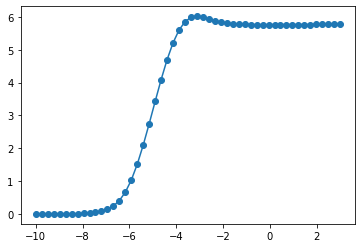

increasing tolerance
up_down


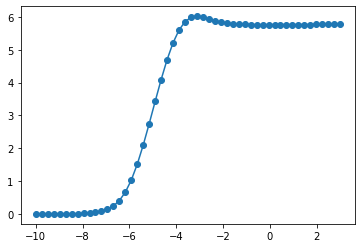

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 21 22 23 24 25 26
 27 28 29 30]
down idxs: [18 19 20]
[2.92138796e-04 5.27919865e-04 9.53705671e-04 1.72195450e-03
 3.10597416e-03 5.59239559e-03 1.00370368e-02 1.79114245e-02
 3.16427397e-02 5.49329367e-02 9.26125316e-02 1.49023728e-01
 2.23926181e-01 3.07664574e-01 3.82382653e-01 4.33163544e-01
 4.58270004e-01 4.66334164e-01 4.64047692e-01 4.64269931e-01
 4.64744229e-01 4.65220571e-01 4.65587194e-01 4.65831965e-01
 4.65982605e-01 4.66071086e-01 4.66121699e-01 4.66150224e-01]
[0.46687408 0.46549986 0.46440055]


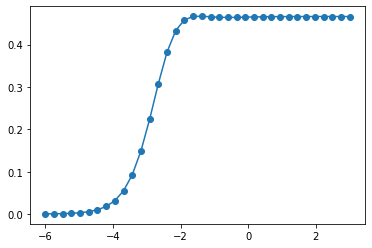

increasing tolerance
up_down


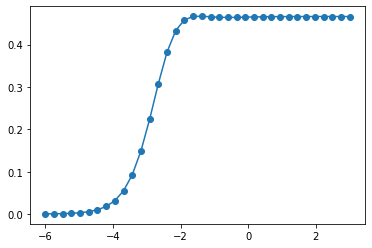

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 30 31 32 33
 34 35 36 37]
down idxs: [20 21 22 23 24 25 26 27 28 29]
[2.44663846e-04 4.41511117e-04 7.96677567e-04 1.43736742e-03
 2.59270140e-03 4.67472544e-03 8.42236000e-03 1.51539646e-02
 2.72002003e-02 4.86137799e-02 8.62357673e-02 1.51015452e-01
 2.58874683e-01 4.29181091e-01 6.77926228e-01 1.00508882e+00
 1.38291286e+00 1.75601289e+00 2.05729078e+00 2.23377540e+00
 1.70877016e+00 1.70908615e+00 1.70943514e+00 1.70968904e+00
 1.70984970e+00 1.70994511e+00 1.70999998e+00 1.71003101e+00]
[2.27056742 2.19752955 2.07097206 1.94313226 1.84286236 1.77643702
 1.7381755  1.71917225 1.71137979 1.7090256 ]


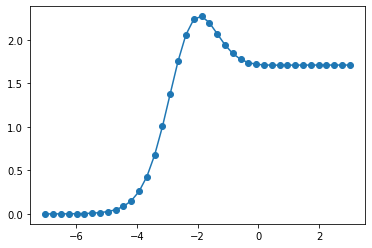

increasing tolerance
up_down


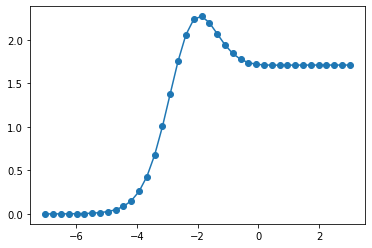

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 29 30
 31 32 33 34]
down idxs: [22 23 24 25 26 27 28]
[2.85259374e-04 5.15633867e-04 9.31986363e-04 1.68429191e-03
 3.04310004e-03 5.49564307e-03 9.91668655e-03 1.78680854e-02
 3.21107570e-02 5.74383980e-02 1.01910773e-01 1.78323356e-01
 3.05012950e-01 5.03766329e-01 7.91994640e-01 1.16983282e+00
 1.61021136e+00 2.06130887e+00 2.46181431e+00 2.76223119e+00
 2.94342981e+00 3.02163345e+00 2.96460748e+00 2.96550341e+00
 2.96680643e+00 2.96800714e+00 2.96890154e+00 2.96949001e+00]
[3.0346477  3.01960826 2.9994914  2.98344912 2.97306612 2.96733668
 2.9648999 ]


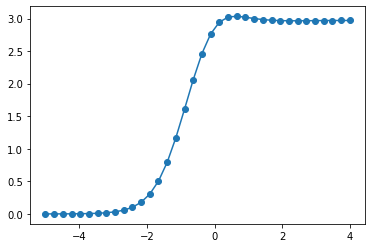

increasing tolerance
multipeak, setting yc=0
up idxs: [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 30 31]
down idxs: [22 23 24 25 26 27]
[1.68429191e-03 3.04310004e-03 5.49564307e-03 9.91668655e-03
 1.78680854e-02 3.21107570e-02 5.74383980e-02 1.01910773e-01
 1.78323356e-01 3.05012950e-01 5.03766329e-01 7.91994640e-01
 1.16983282e+00 1.61021136e+00 2.06130887e+00 2.46181431e+00
 2.76223119e+00 2.94342981e+00 3.02163345e+00 2.96550341e+00
 2.96680643e+00]
[3.0346477  3.01960826 2.9994914  2.98344912 2.97306612 2.96733668]


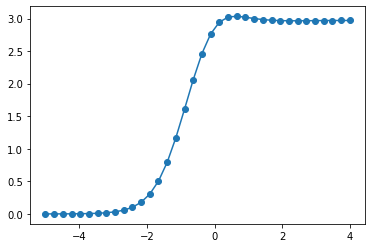

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 34]
down idxs: [23 24 25 26 27 28 29 30 31 32 33]
[4.72171048e-04 8.53459412e-04 1.54247627e-03 2.78719657e-03
 5.03454879e-03 9.08807765e-03 1.63861625e-02 2.94832748e-02
 5.28520509e-02 9.41277520e-02 1.65773256e-01 2.86597990e-01
 4.81385967e-01 7.75819195e-01 1.18583918e+00 1.70710705e+00
 2.31329529e+00 2.96341663e+00 3.60978317e+00 4.20190797e+00
 4.68975862e+00 5.03138495e+00 5.20401959e+00 4.20912004e+00]
[5.21236346 5.09024529 4.89391224 4.68447871 4.5064148  4.37754687
 4.2951754  4.24797124 4.22397306 4.21353349 4.20991355]


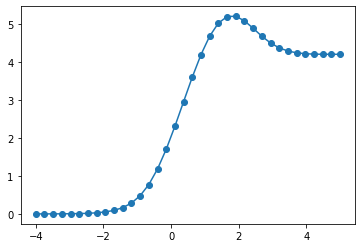

increasing tolerance
up_down


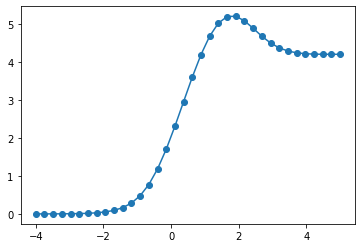

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 34 35 36 37 38 39 40 41 42]
down idxs: [26 27 28 29 30 31 32 33]
[1.42753306e-04 2.57266006e-04 4.63622408e-04 8.35450687e-04
 1.50532780e-03 2.71180378e-03 4.88355330e-03 8.78910980e-03
 1.58005406e-02 2.83490269e-02 5.06847429e-02 9.00617206e-02
 1.58347680e-01 2.73576430e-01 4.59873440e-01 7.43067310e-01
 1.14078057e+00 1.65182681e+00 2.25358603e+00 2.90873942e+00
 3.57345546e+00 4.20131505e+00 4.74542722e+00 5.16484430e+00
 5.43727997e+00 5.57069629e+00 5.45235920e+00 5.45394516e+00
 5.45701741e+00 5.46065854e+00 5.46401918e+00 5.46661902e+00
 5.46839359e+00 5.46950813e+00 5.47017269e+00]
[5.60180228 5.57862565 5.53969445 5.5051235  5.48068139 5.46546974
 5.45697618 5.45306894]


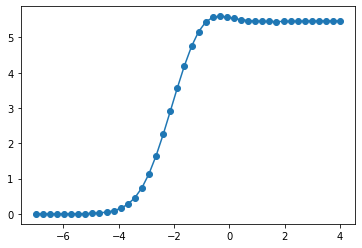

increasing tolerance
multipeak, setting yc=0
up idxs: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 34 35
 36 37 38 39 40]
down idxs: [26 27 28 29 30 31 32]
[1.50532780e-03 2.71180378e-03 4.88355330e-03 8.78910980e-03
 1.58005406e-02 2.83490269e-02 5.06847429e-02 9.00617206e-02
 1.58347680e-01 2.73576430e-01 4.59873440e-01 7.43067310e-01
 1.14078057e+00 1.65182681e+00 2.25358603e+00 2.90873942e+00
 3.57345546e+00 4.20131505e+00 4.74542722e+00 5.16484430e+00
 5.43727997e+00 5.57069629e+00 5.45235920e+00 5.45394516e+00
 5.45701741e+00 5.46065854e+00 5.46401918e+00 5.46661902e+00
 5.46839359e+00]
[5.60180228 5.57862565 5.53969445 5.5051235  5.48068139 5.46546974
 5.45697618]


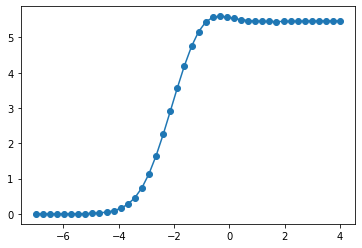

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 19 20 21 22]
down idxs: [14 15 16 17 18]
[0.00034995 0.00063738 0.00115982 0.00210701 0.00381628 0.00687499
 0.01226676 0.02152181 0.03669589 0.05974892 0.09082229 0.12598873
 0.15733353 0.1775356  0.17340238 0.17353151 0.17397831 0.17442252]
[0.18505888 0.18405729 0.17998222 0.17628505 0.17413175]


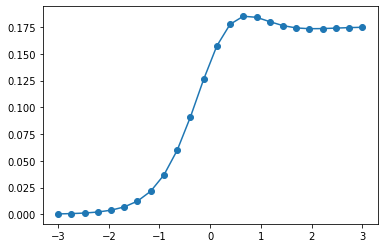

increasing tolerance
up_down


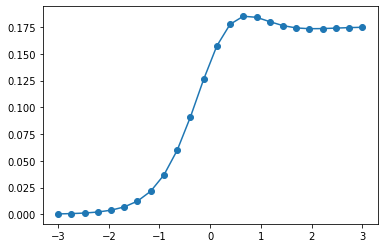

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 31 32 33 34]
down idxs: [20 21 22 23 24 25 26 27 28 29 30]
[1.75719849e-04 3.17636810e-04 5.74135368e-04 1.03764748e-03
 1.87498919e-03 3.38681386e-03 6.11366778e-03 1.10231189e-02
 1.98333314e-02 3.55516909e-02 6.33069413e-02 1.11443415e-01
 1.92420766e-01 3.22065163e-01 5.14546152e-01 7.71637408e-01
 1.07147000e+00 1.36871216e+00 1.61143763e+00 1.76328524e+00
 1.40732846e+00 1.40772038e+00 1.40821022e+00 1.40859680e+00]
[1.81533635 1.78486565 1.70615155 1.61579278 1.53851305 1.48300119
 1.44742651 1.42644639 1.41505409 1.4096012  1.40759404]


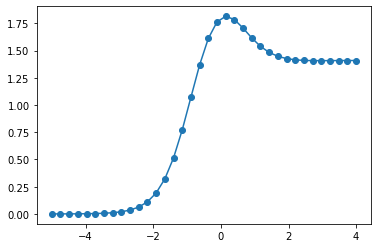

increasing tolerance
up_down


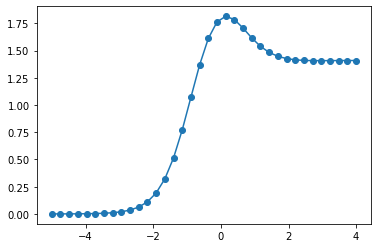

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 34]
down idxs: [21 22 23 24 25 26 27 28 29 30 31 32 33]
[2.38891115e-04 4.31828166e-04 7.80541829e-04 1.41070065e-03
 2.54911546e-03 4.60460550e-03 8.31231138e-03 1.49885293e-02
 2.69720603e-02 4.83613977e-02 8.61630681e-02 1.51839121e-01
 2.62738760e-01 4.41759036e-01 7.12377933e-01 1.08767689e+00
 1.55823859e+00 2.08801892e+00 2.62046373e+00 3.08911847e+00
 3.43051692e+00 2.66445438e+00]
[3.6020803  3.60087361 3.46865365 3.27376055 3.08003454 2.92457727
 2.81623841 2.74759928 2.70692194 2.68415936 2.67231402 2.66685462
 2.66485276]


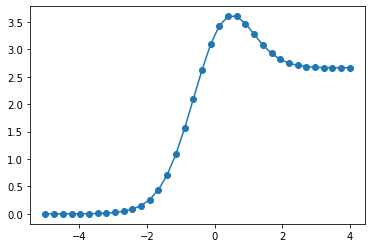

increasing tolerance
up_down


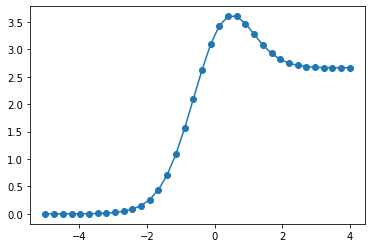

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 39 40 41 42]
down idxs: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
[2.16918362e-04 3.90915656e-04 7.04446465e-04 1.26932729e-03
 2.28680141e-03 4.11865932e-03 7.41402742e-03 1.33334130e-02
 2.39382813e-02 4.28486050e-02 7.62919534e-02 1.34599359e-01
 2.33851367e-01 3.96460723e-01 6.48197219e-01 1.00954196e+00
 1.48419296e+00 2.05322947e+00 2.67934692e+00 3.31511743e+00
 3.90821492e+00 4.40457614e+00 4.75547576e+00 4.93103200e+00
 3.92478695e+00 3.92481820e+00 3.92486306e+00 3.92489817e+00]
[4.93412378 4.8043368  4.60559974 4.40134827 4.23239224 4.1115497
 4.03322044 3.98559264 3.9577811  3.94197956 3.93322463 3.92855023
 3.92622096 3.92520042 3.92484919]


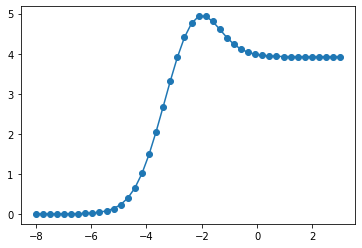

increasing tolerance
up_down


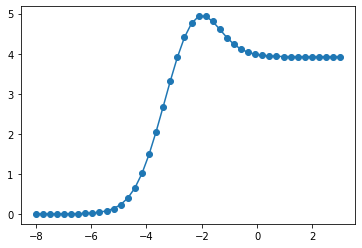

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 30
 31 32 33 34 35 36 37 38]
down idxs: [23 24 25 26 27 28 29]
[5.47370023e-04 9.87695076e-04 1.78200857e-03 3.21438255e-03
 5.79571161e-03 1.04422662e-02 1.87891203e-02 3.37278748e-02
 6.02904900e-02 1.06986038e-01 1.87494477e-01 3.21957487e-01
 5.35848679e-01 8.53699551e-01 1.28794249e+00 1.82981641e+00
 2.45004505e+00 3.10706674e+00 3.75428020e+00 4.34339022e+00
 4.82827053e+00 5.17390613e+00 5.36811787e+00 5.11732445e+00
 5.12068909e+00 5.12862192e+00 5.13732267e+00 5.14454297e+00
 5.14963841e+00 5.15289247e+00 5.15484893e+00 5.15598434e+00]
[5.42795725 5.39497891 5.31949239 5.24148616 5.18115802 5.14273933
 5.12307951]


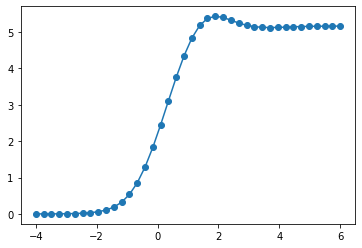

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 30 31 32
 33 34 35 36 37]
down idxs: [23 24 25 26 27 28 29]
[1.78200857e-03 3.21438255e-03 5.79571161e-03 1.04422662e-02
 1.87891203e-02 3.37278748e-02 6.02904900e-02 1.06986038e-01
 1.87494477e-01 3.21957487e-01 5.35848679e-01 8.53699551e-01
 1.28794249e+00 1.82981641e+00 2.45004505e+00 3.10706674e+00
 3.75428020e+00 4.34339022e+00 4.82827053e+00 5.17390613e+00
 5.36811787e+00 5.11732445e+00 5.12068909e+00 5.12862192e+00
 5.13732267e+00 5.14454297e+00 5.14963841e+00 5.15289247e+00
 5.15484893e+00]
[5.42795725 5.39497891 5.31949239 5.24148616 5.18115802 5.14273933
 5.12307951]


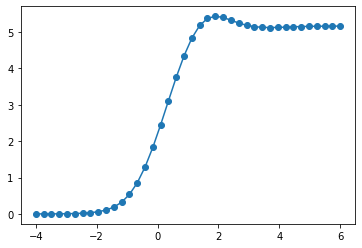

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 36 37 38 39 40 41 42]
down idxs: [28 29 30 31 32 33 34 35]
[3.98562851e-04 7.18226856e-04 1.29415732e-03 2.33153300e-03
 4.19921755e-03 7.55902195e-03 1.35941118e-02 2.44061439e-02
 4.36855073e-02 7.77805338e-02 1.37222101e-01 2.38403692e-01
 4.04194010e-01 6.60992448e-01 1.03019595e+00 1.51708037e+00
 2.10570702e+00 2.76411346e+00 3.45344262e+00 4.13341238e+00
 4.76400990e+00 5.30845204e+00 5.74083149e+00 6.05456667e+00
 6.26297824e+00 6.39021130e+00 6.46040199e+00 6.49196304e+00
 6.40203239e+00 6.40205011e+00 6.40286438e+00 6.40389117e+00
 6.40478385e+00 6.40542759e+00 6.40584355e+00]
[6.49739675 6.48592738 6.46589824 6.44473836 6.42725591 6.41502234
 6.40751743 6.40355663]


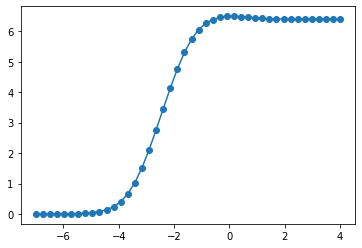

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 38]
down idxs: [28 29 30 31 32 33 34 35]
[1.29415732e-03 2.33153300e-03 4.19921755e-03 7.55902195e-03
 1.35941118e-02 2.44061439e-02 4.36855073e-02 7.77805338e-02
 1.37222101e-01 2.38403692e-01 4.04194010e-01 6.60992448e-01
 1.03019595e+00 1.51708037e+00 2.10570702e+00 2.76411346e+00
 3.45344262e+00 4.13341238e+00 4.76400990e+00 5.30845204e+00
 5.74083149e+00 6.05456667e+00 6.26297824e+00 6.39021130e+00
 6.46040199e+00 6.49196304e+00 6.40286438e+00]
[6.49739675 6.48592738 6.46589824 6.44473836 6.42725591 6.41502234
 6.40751743 6.40355663]


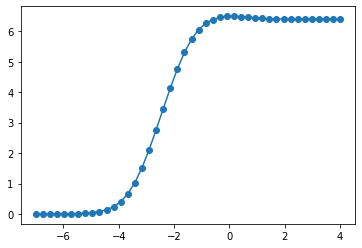

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 29 30]
down idxs: [20 21 22 23 24 25 26 27 28]
[1.10720716e-04 2.00569906e-04 3.63312415e-04 6.58042740e-04
 1.19166571e-03 2.15735547e-03 3.90344707e-03 7.05570053e-03
 1.27305918e-02 2.28955670e-02 4.09403130e-02 7.24690949e-02
 1.26067209e-01 2.13091362e-01 3.44409211e-01 5.22072439e-01
 7.28825891e-01 9.26928333e-01 1.07555970e+00 1.15571473e+00
 1.11273852e+00 1.11277795e+00]
[1.17843416 1.16992671 1.15232183 1.13660399 1.12566783 1.11900214
 1.11534319 1.11357964 1.11289607]


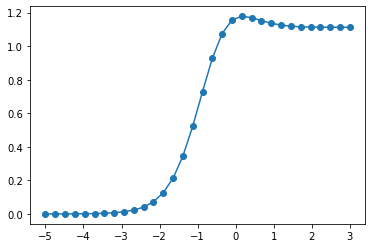

increasing tolerance
up_down


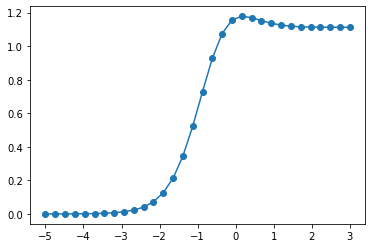

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 34]
down idxs: [21 22 23 24 25 26 27 28 29 30 31 32 33]
[2.57828701e-04 4.66056899e-04 8.42399725e-04 1.52246097e-03
 2.75094192e-03 4.96877536e-03 8.96841519e-03 1.61673797e-02
 2.90798444e-02 5.20975415e-02 9.26852596e-02 1.62929566e-01
 2.80788901e-01 4.69160752e-01 7.49840870e-01 1.13162272e+00
 1.59849727e+00 2.10693544e+00 2.59349500e+00 2.98783619e+00
 3.23064946e+00 2.35997466e+00]
[3.29639015 3.20836671 3.02918833 2.82948534 2.65834809 2.53419337
 2.45397645 2.40653966 2.38075004 2.36807687 2.36261515 2.36062718
 2.36006051]


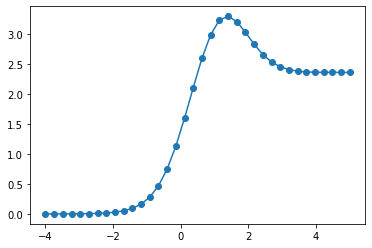

increasing tolerance
up_down


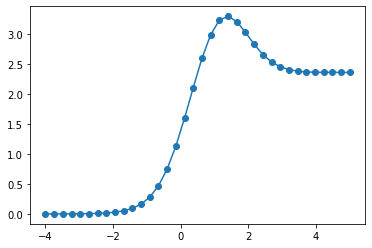

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 32
 33 34 35 36 37 38]
down idxs: [23 24 25 26 27 28 29 30 31]
[1.40198184e-04 2.53008150e-04 4.56574910e-04 8.23878650e-04
 1.48650703e-03 2.68154481e-03 4.83558310e-03 8.71434883e-03
 1.56863654e-02 2.81784857e-02 5.04345818e-02 8.96931041e-02
 1.57766389e-01 2.72492312e-01 4.57394118e-01 7.36757298e-01
 1.12495832e+00 1.61511307e+00 2.17581622e+00 2.75736313e+00
 3.30063848e+00 3.74565572e+00 4.04385646e+00 3.61175289e+00
 3.61310155e+00 3.61552786e+00 3.61764307e+00 3.61911922e+00
 3.62004561e+00 3.62059525e+00]
[4.17530484 4.16068902 4.05439962 3.91881986 3.79833668 3.71100098
 3.65648295 3.62719007 3.61467609]


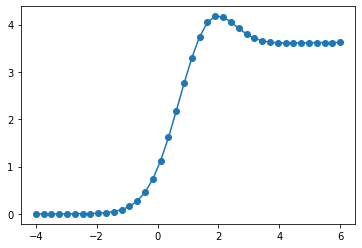

increasing tolerance
multipeak, setting yc=0
up idxs: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 32 33 34 35]
down idxs: [23 24 25 26 27 28 29 30 31]
[1.48650703e-03 2.68154481e-03 4.83558310e-03 8.71434883e-03
 1.56863654e-02 2.81784857e-02 5.04345818e-02 8.96931041e-02
 1.57766389e-01 2.72492312e-01 4.57394118e-01 7.36757298e-01
 1.12495832e+00 1.61511307e+00 2.17581622e+00 2.75736313e+00
 3.30063848e+00 3.74565572e+00 4.04385646e+00 3.61175289e+00
 3.61310155e+00 3.61552786e+00 3.61764307e+00]
[4.17530484 4.16068902 4.05439962 3.91881986 3.79833668 3.71100098
 3.65648295 3.62719007 3.61467609]


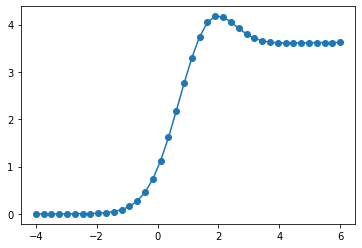

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 35
 36 37 38]
down idxs: [23 24 25 26 27 28 29 30 31 32 33 34]
[3.85533509e-04 6.95703068e-04 1.25529767e-03 2.26464028e-03
 4.08436945e-03 7.36245506e-03 1.32589840e-02 2.38376436e-02
 4.27275917e-02 7.61813230e-02 1.34585944e-01 2.34129808e-01
 3.97396154e-01 6.50353516e-01 1.01360702e+00 1.49080895e+00
 2.06289088e+00 2.69256520e+00 3.33300016e+00 3.93374007e+00
 4.44500809e+00 4.82579593e+00 5.05641527e+00 4.86371108e+00
 4.86380389e+00 4.86414633e+00 4.86455227e+00]
[5.1478912  5.13916046 5.08051971 5.01289525 4.95744139 4.91904486
 4.89489826 4.88054613 4.87231079 4.86772062 4.86527172 4.86409884]


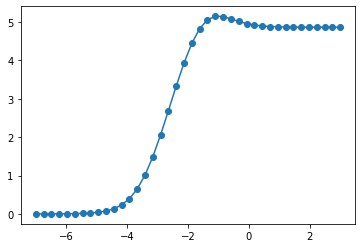

increasing tolerance
up_down


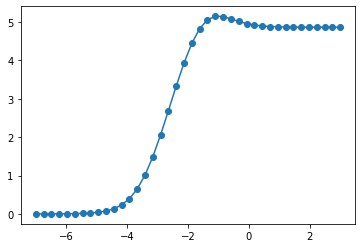

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 37 38 39 40 41 42]
down idxs: [28 29 30 31 32 33 34 35 36]
[1.96807111e-04 3.54674906e-04 6.39146871e-04 1.15169053e-03
 2.07495051e-03 3.73736882e-03 6.72852130e-03 1.21033630e-02
 2.17387763e-02 3.89397930e-02 6.94205069e-02 1.22744081e-01
 2.14028881e-01 3.64931053e-01 6.01627675e-01 9.47370601e-01
 1.41127744e+00 1.98136861e+00 2.62792375e+00 3.31256523e+00
 3.99472433e+00 4.63384166e+00 5.19185865e+00 5.64014541e+00
 5.96826985e+00 6.18601312e+00 6.31522163e+00 6.37860871e+00
 6.11738671e+00 6.11742196e+00 6.11836843e+00 6.11935118e+00
 6.12008662e+00 6.12056490e+00]
[6.39350517 6.37222468 6.32625013 6.26929646 6.21517296 6.17278059
 6.14436855 6.1279095  6.12000686]


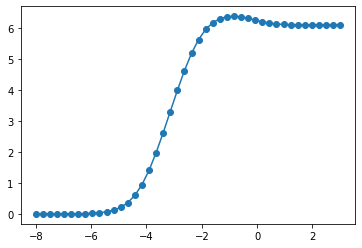

increasing tolerance
up_down


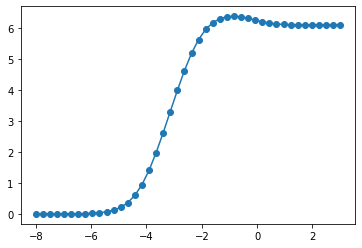

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 28 29 30
 31 32 33 34]
down idxs: [21 22 23 24 25 26 27]
[3.69154595e-05 6.67328118e-05 1.20631606e-04 2.18054823e-04
 3.94129896e-04 7.12290600e-04 1.28698698e-03 2.32438957e-03
 4.19483670e-03 7.56013265e-03 1.35919384e-02 2.43296991e-02
 4.32154541e-02 7.57381031e-02 1.29763792e-01 2.14365916e-01
 3.35298339e-01 4.87013236e-01 6.47299501e-01 7.83944865e-01
 8.71736678e-01 7.99781363e-01 8.01128047e-01 8.02913593e-01
 8.04391516e-01 8.05405486e-01 8.06037012e-01 8.06410085e-01]
[0.90507685 0.89722455 0.86971522 0.84052286 0.81866796 0.80591811
 0.80053873]


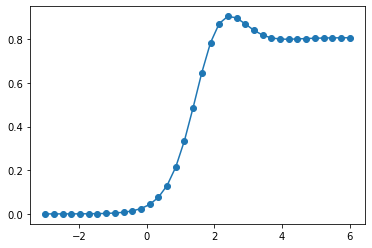

increasing tolerance
multipeak, setting yc=0
up idxs: [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 28 29 30 31]
down idxs: [21 22 23 24 25 26]
[0.00128699 0.00232439 0.00419484 0.00756013 0.01359194 0.0243297
 0.04321545 0.0757381  0.12976379 0.21436592 0.33529834 0.48701324
 0.6472995  0.78394487 0.87173668 0.79978136 0.80112805 0.80291359
 0.80439152]
[0.90507685 0.89722455 0.86971522 0.84052286 0.81866796 0.80591811]


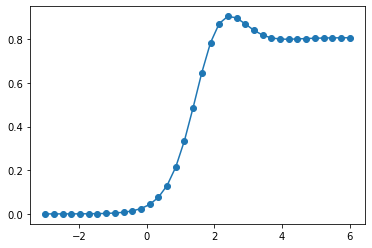

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 25 26 27
 28 29 30 31 32 33 34 35 36 37 38]
down idxs: [21 22 23 24]
[4.34046468e-04 7.83191586e-04 1.41298223e-03 2.54854093e-03
 4.59453470e-03 8.27604052e-03 1.48847507e-02 2.66978946e-02
 4.76554866e-02 8.43476806e-02 1.47144104e-01 2.50635910e-01
 4.11359202e-01 6.40234273e-01 9.30673549e-01 1.25133151e+00
 1.55430937e+00 1.79642036e+00 1.95730615e+00 2.04238621e+00
 2.07338783e+00 2.05019536e+00 2.05072655e+00 2.05345072e+00
 2.05737698e+00 2.06141941e+00 2.06478723e+00 2.06720289e+00
 2.06876806e+00 2.06971858e+00 2.07027366e+00 2.07059048e+00
 2.07076898e+00 2.07086880e+00 2.07092440e+00]
[2.0753722  2.06710987 2.05838912 2.05259838]


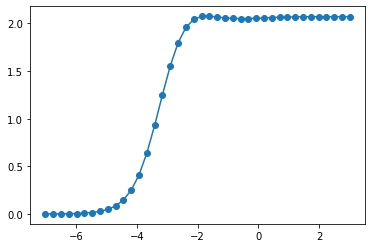

increasing tolerance
multipeak, setting yc=0
up idxs: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 26 27 28 29 30
 31]
down idxs: [21 22 23 24]
[1.41298223e-03 2.54854093e-03 4.59453470e-03 8.27604052e-03
 1.48847507e-02 2.66978946e-02 4.76554866e-02 8.43476806e-02
 1.47144104e-01 2.50635910e-01 4.11359202e-01 6.40234273e-01
 9.30673549e-01 1.25133151e+00 1.55430937e+00 1.79642036e+00
 1.95730615e+00 2.04238621e+00 2.07338783e+00 2.05072655e+00
 2.05345072e+00 2.05737698e+00 2.06141941e+00 2.06478723e+00
 2.06720289e+00]
[2.0753722  2.06710987 2.05838912 2.05259838]


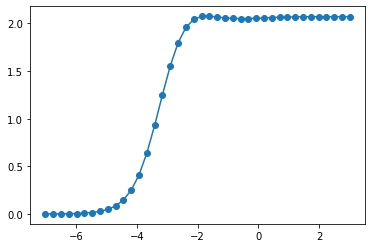

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 33 34
 35 36 37 38]
down idxs: [22 23 24 25 26 27 28 29 30 31 32]
[2.35093622e-04 4.24248791e-04 7.65554040e-04 1.38129629e-03
 2.49182795e-03 4.49371441e-03 8.09904930e-03 1.45813464e-02
 2.62016679e-02 4.69224060e-02 8.35275907e-02 1.47162211e-01
 2.54853468e-01 4.29514881e-01 6.95702031e-01 1.06948084e+00
 1.54658503e+00 2.09769984e+00 2.67355318e+00 3.21346050e+00
 3.65374216e+00 3.94073654e+00 3.30806010e+00 3.30867907e+00
 3.30971994e+00 3.31062587e+00 3.31126043e+00 3.31165998e+00]
[4.05106094 4.00709623 3.86912246 3.70510879 3.56195406 3.45737057
 3.38928145 3.34837491 3.32549133 3.31390263 3.30910856]


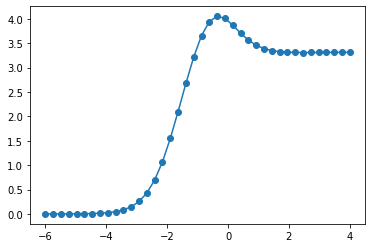

increasing tolerance
multipeak, setting yc=0
up idxs: [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 34]
down idxs: [22 23 24 25 26 27 28 29 30 31 32]
[1.38129629e-03 2.49182795e-03 4.49371441e-03 8.09904930e-03
 1.45813464e-02 2.62016679e-02 4.69224060e-02 8.35275907e-02
 1.47162211e-01 2.54853468e-01 4.29514881e-01 6.95702031e-01
 1.06948084e+00 1.54658503e+00 2.09769984e+00 2.67355318e+00
 3.21346050e+00 3.65374216e+00 3.94073654e+00 3.30867907e+00]
[4.05106094 4.00709623 3.86912246 3.70510879 3.56195406 3.45737057
 3.38928145 3.34837491 3.32549133 3.31390263 3.30910856]


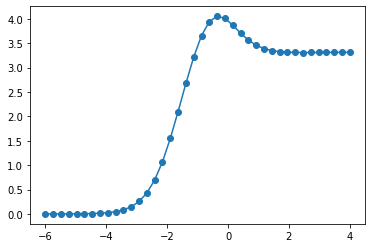

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 35 36
 37 38]
down idxs: [22 23 24 25 26 27 28 29 30 31 32 33 34]
[6.48423748e-04 1.17000439e-03 2.11081611e-03 3.80710577e-03
 6.86319476e-03 1.23615945e-02 2.22298165e-02 3.98632939e-02
 7.11295359e-02 1.25828149e-01 2.19374304e-01 3.73619349e-01
 6.14404157e-01 9.63453664e-01 1.42669355e+00 1.98732026e+00
 2.60920371e+00 3.24555723e+00 3.84546383e+00 4.35844925e+00
 4.74202661e+00 4.97298615e+00 4.55692666e+00 4.55702714e+00
 4.55726392e+00 4.55749379e+00]
[5.05622117 5.0248451  4.92955767 4.81954056 4.72586747 4.65869512
 4.61536551 4.58917465 4.57396785 4.56538822 4.56069986 4.55828868
 4.55722015]


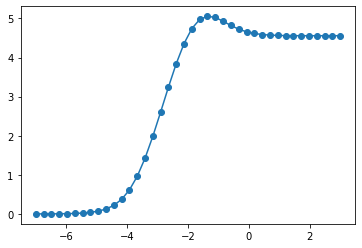

increasing tolerance
up_down


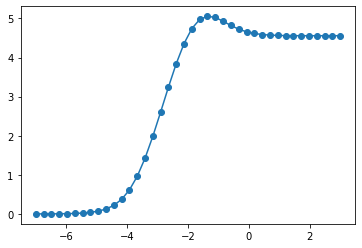

multipeak, setting yc=0
up idxs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 35 36 37 38]
down idxs: [24 25 26 27 28 29 30 31 32 33 34]
[6.75269398e-04 1.21843898e-03 2.19818043e-03 3.96462241e-03
 7.14697625e-03 1.28721478e-02 2.31460902e-02 4.15005214e-02
 7.40327258e-02 1.30909725e-01 2.28082734e-01 3.88074544e-01
 6.37397093e-01 9.98348431e-01 1.47768370e+00 2.06070451e+00
 2.71582197e+00 3.40376250e+00 4.08338628e+00 4.71346843e+00
 5.25540137e+00 5.68047196e+00 5.97811731e+00 6.15662906e+00
 5.80037867e+00 5.80041594e+00 5.80112800e+00 5.80189542e+00]
[6.23492699 6.2343986  6.17777607 6.09127177 6.00136434 5.92648162
 5.87297616 5.83865203 5.81836221 5.80734238 5.80213537]


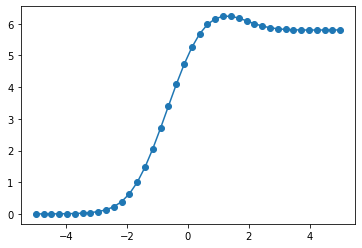

increasing tolerance
up_down


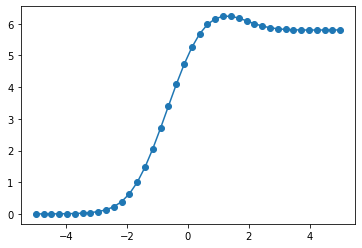

In [17]:
case="model=3_2_t=1f,2r_d=m_m"
model,transitions,direction=mypat.findall(case)[0]
transitions=transitions.split(",")
return_fullpars=partial(return_fullpars_polcycle,model=model,transitions=transitions)
ccode=state3_rev2
ssfunc=ccode.interfacess

df=allouts[case][1]
x=df["col"].values
y=df["row"].values
x_0=np.where((x>(0-0.03))&(x<(0+0.03)))[0]
y_positive=np.where(y>0.03)[0]
idxs_up=np.intersect1d(x_0,y_positive) #vertical up
print(len(idxs_up))

print(len(idxs_up[::50]))

for idx in idxs_up[::50]:
    df_row=df.iloc[idx]
    col=df_row["col"]
    row=df_row["row"]

    parset=df_row["parameters"].copy()
    
    kwargs=dict(tol=1e-5,check_out0=False,out0_tol=0.001,fc_tol=0.070389327891398,verbose=True)#used in the run, adding verbose=True

    score_,f,Amin,Amax,n=score(parset,return_fullpars=return_fullpars, ssfunc=ssfunc,scoref=get_score_up_down_v2,plot=True,n=None,Amin=None,Amax=None,log2out=True,returnout=True,**kwargs)
    
    print("increasing tolerance")
    kwargs=dict(tol=1e-3,check_out0=False,out0_tol=0.001,fc_tol=0.070389327891398,verbose=True)#used in the run, adding verbose=True

    score_,f,Amin,Amax,n=score(parset,return_fullpars=return_fullpars, ssfunc=ssfunc,scoref=get_score_up_down_v2,plot=True,n=None,Amin=None,Amax=None,log2out=True,returnout=True,**kwargs)
    

Now look into detail into the non-monotonics down and up. Use higher precision code:

In [12]:
import bPcycle_1bs_5states_rev1u2u3u4_TFA_prec100 as state5_rev1234_prec100
from scipy.linalg import null_space

In [13]:
case="model=5_1234_t=2f,4f_d=m_p"
model,transitions,direction=mypat.findall(case)[0]
transitions=transitions.split(",")
return_fullpars=partial(return_fullpars_polcycle,model=model,transitions=transitions)
ccode=state5_rev1234_prec100
ssfunc=ccode.interfacess

df=allouts[case][1]
x=df["col"].values
y=df["row"].values

idxs_left=np.where(x<-0.03)[0]
print(len(idxs_left))

6588


\begin{align}
&\mathcal{L}(G)=
\begin{pmatrix}
diag & k_{2,1} & k_{3,1}\\
k_{1,2} & diag & k_{3,2} \\
k_{1,3} & k_{2,3} & diag\\
\end{pmatrix}
\\
\\
&\begin{pmatrix}
diag & k_{2,1} & k_{3,1}\\
k_{1,2} & diag & k_{3,2} \\
k_{1,3} & k_{2,3} & diag\\
\end{pmatrix}
\begin{pmatrix}
u_1\\
u_2\\
u_3
\end{pmatrix}=0
\end{align}

In [34]:
def compute_ss_fromL_model5_1234(fullpars,A):
    
    
    kb,k_1_0,kr_1_0,kb,k_2_0,kr_2_0,kb,k_3_0,kr_3_0,kb,k_4_0,kr_4_0,kb,k_5_0,ku,k_1_1,kr_1_1,ku,k_2_1,kr_2_1,ku,k_3_1,kr_3_1,ku,k_4_1,kr_4_1,ku,k_5_1=fullpars
    b1_1_1=b1_1_2=b1_1_3=b1_1_4=b1_1_5=ku
    a1_0_1=a1_0_2=a1_0_3=a1_0_4=a1_0_5=kb
    
    
    L=np.array([[0,b1_1_1,kr_1_0,0,0,0,0,0,k_5_0,0],
            [a1_0_1*A,0,0,kr_1_1,0,0,0,0,0,k_5_1],
            [k_1_0,0,0,b1_1_2,kr_2_0,0,0,0,0,0],
            [0,k_1_1,a1_0_2*A,0,0,kr_2_1,0,0,0,0],
            [0,0,k_2_0,0,0,b1_1_3,kr_3_0,0,0,0],
            [0,0,0,k_2_1,a1_0_3*A,0,0,kr_3_1,0,0],
            [0,0,0,0,k_3_0,0,0,b1_1_4,kr_4_0,0],
            [0,0,0,0,0,k_3_1,a1_0_4*A,0,0,kr_4_1],
            [0,0,0,0,0,0,k_4_0,0,0,b1_1_5],
            [0,0,0,0,0,0,0,k_4_1,a1_0_5*A,0]])
    L_d=np.diag(np.sum(L,axis=0))
    L=L-L_d
    rhos=null_space(L) #column vector
    if np.all(rhos)<0: #if all are negative, flip to positive
        rhos=rhos*-1 
    doublecheck=L@rhos
    if np.any(np.abs(doublecheck)>1e-8):
        print("wrong null space", doublecheck)
    else:
        print(".",end=",")
    
    rhos=np.transpose(rhos)[0] #1 row
    ss=np.abs(rhos)/np.sum(np.abs(rhos)) #can be - when very close to 0
    P5_0=ss[8]
    P5_A=ss[9]
    output=k_5_0*P5_0 + k_5_1*P5_A
    return output

1.0,1.0,1.0,10000.0,1.0,10000.0,1.0,166.6626462819335,270.9069156176189,719.4033239504237,271.88894705435655,0.01,83.10128952318281
down_up


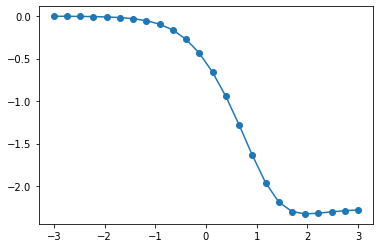

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 166.6626462819335), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 270.9069156176189), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 719.4033239504237), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 166.6626462819335), ('ku', 1.0), ('k_2_1', 100.0), ('kr_2_1', 270.9069156176189), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 719.4033239504237), ('ku', 1.0), ('k_4_1', 831012.8952318281), ('kr_4_1', 271.88894705435655), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [831012.89523183]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

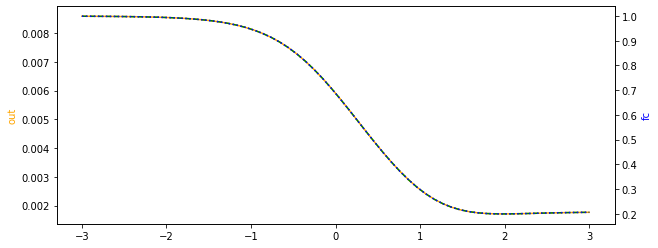

1.0,4.866960042019123,1.0,10000.0,1.0,10000.0,1.0,82.66664443092154,400.50538094753426,836.3904620138569,498.83349170890597,0.01,30.56541462312352
down_up


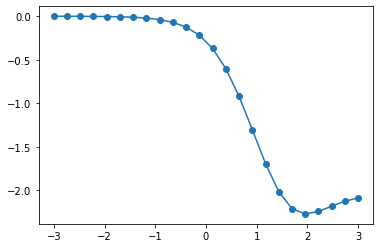

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 82.66664443092154), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 4.866960042019123), ('k_1_1', 1.0), ('kr_1_1', 82.66664443092154), ('ku', 4.866960042019123), ('k_2_1', 100.0), ('kr_2_1', 400.50538094753426), ('ku', 4.866960042019123), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 4.866960042019123), ('k_4_1', 305654.1462312352), ('kr_4_1', 498.83349170890597), ('ku', 4.866960042019123), ('k_5_1', 1.0)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

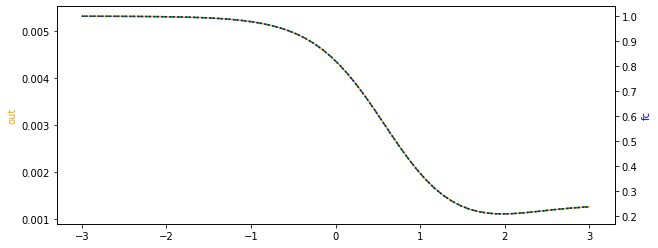

1.0,4.866960042019123,1.0,10000.0,5.338374047241366,10000.0,1.0,63.240209154383024,400.50538094753426,836.3904620138569,498.83349170890597,0.01,30.56541462312352
down_up


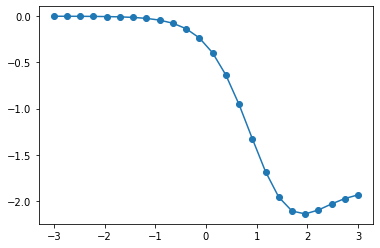

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 63.240209154383024), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.0), ('k_3_0', 5.338374047241366), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 4.866960042019123), ('k_1_1', 1.0), ('kr_1_1', 63.240209154383024), ('ku', 4.866960042019123), ('k_2_1', 100.0), ('kr_2_1', 400.50538094753426), ('ku', 4.866960042019123), ('k_3_1', 5.338374047241366), ('kr_3_1', 836.3904620138569), ('ku', 4.866960042019123), ('k_4_1', 305654.1462312352), ('kr_4_1', 498.83349170890597), ('ku', 4.866960042019123), ('k_5_1', 1.0)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

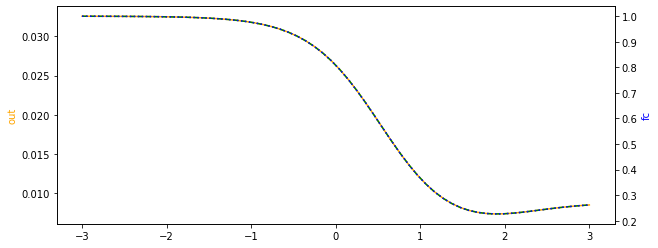

1.229240194799158,16.420094435462307,1.184151962963239,10000.0,2.258810409080046,10000.0,1.0,86.70105118169472,400.50538094753426,836.3904620138569,541.8336362016759,0.01,37.254061239409154
down_up


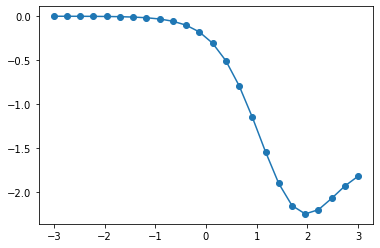

[('kb', 1.229240194799158), ('k_1_0', 1.184151962963239), ('kr_1_0', 86.70105118169472), ('kb', 1.229240194799158), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.229240194799158), ('k_3_0', 2.258810409080046), ('kr_3_0', 836.3904620138569), ('kb', 1.229240194799158), ('k_4_0', 10000.0), ('kr_4_0', 541.8336362016759), ('kb', 1.229240194799158), ('k_5_0', 1.0), ('ku', 16.420094435462307), ('k_1_1', 1.184151962963239), ('kr_1_1', 86.70105118169472), ('ku', 16.420094435462307), ('k_2_1', 100.0), ('kr_2_1', 400.50538094753426), ('ku', 16.420094435462307), ('k_3_1', 2.258810409080046), ('kr_3_1', 836.3904620138569), ('ku', 16.420094435462307), ('k_4_1', 372540.61239409156), ('kr_4_1', 541.8336362016759), ('ku', 16.420094435462307), ('k_5_1', 1.0)]
a parameter is out of bounds! [372540.61239409]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

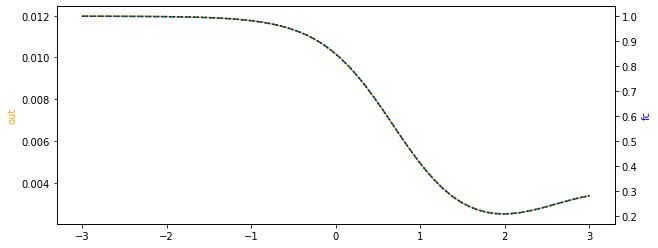

1.0,1.6144100893631326,1.0,10000.0,11.192675948528793,10000.0,1.0,44.65800741837991,400.50538094753426,836.3904620138569,498.83349170890597,0.01,30.56541462312352
down_up


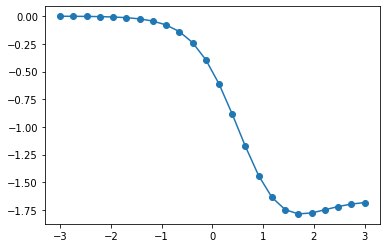

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 44.65800741837991), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.0), ('k_3_0', 11.192675948528793), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.6144100893631326), ('k_1_1', 1.0), ('kr_1_1', 44.65800741837991), ('ku', 1.6144100893631326), ('k_2_1', 100.0), ('kr_2_1', 400.50538094753426), ('ku', 1.6144100893631326), ('k_3_1', 11.192675948528793), ('kr_3_1', 836.3904620138569), ('ku', 1.6144100893631326), ('k_4_1', 305654.1462312352), ('kr_4_1', 498.83349170890597), ('ku', 1.6144100893631326), ('k_5_1', 1.0)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

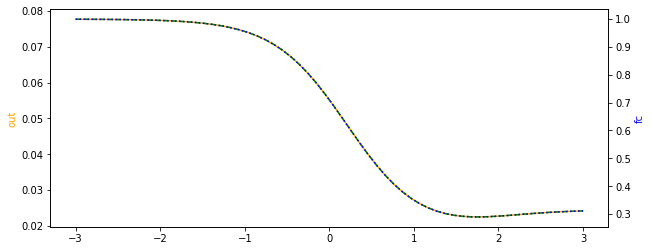

1.266068750961527,1.5878669867651996,1.0,10000.0,1.0,10000.0,2.70132594995934,50.92575256508022,735.0631974098832,836.3904620138569,271.88894705435655,0.035017154592978994,30.56541462312352
down_up


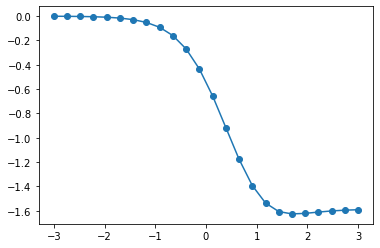

[('kb', 1.266068750961527), ('k_1_0', 1.0), ('kr_1_0', 50.92575256508022), ('kb', 1.266068750961527), ('k_2_0', 10000.0), ('kr_2_0', 735.0631974098832), ('kb', 1.266068750961527), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.266068750961527), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.266068750961527), ('k_5_0', 2.70132594995934), ('ku', 1.5878669867651996), ('k_1_1', 1.0), ('kr_1_1', 50.92575256508022), ('ku', 1.5878669867651996), ('k_2_1', 350.17154592978994), ('kr_2_1', 735.0631974098832), ('ku', 1.5878669867651996), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 1.5878669867651996), ('k_4_1', 305654.1462312352), ('kr_4_1', 271.88894705435655), ('ku', 1.5878669867651996), ('k_5_1', 2.70132594995934)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

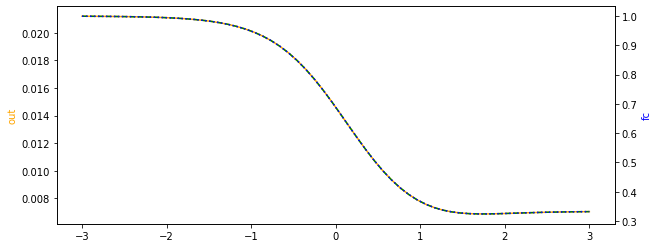

1.0,8.407195152698385,1.0,10000.0,1.0,10000.0,1.0,23.431683833755358,399.8071425513794,836.3904620138569,212.41590070529023,0.015745264023131453,26.275280196458336
down_up


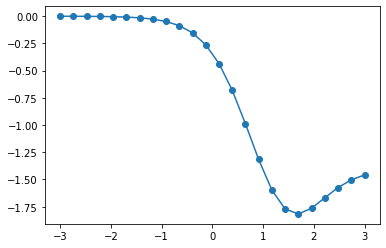

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 23.431683833755358), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 399.8071425513794), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 212.41590070529023), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 8.407195152698385), ('k_1_1', 1.0), ('kr_1_1', 23.431683833755358), ('ku', 8.407195152698385), ('k_2_1', 157.45264023131455), ('kr_2_1', 399.8071425513794), ('ku', 8.407195152698385), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 8.407195152698385), ('k_4_1', 262752.80196458334), ('kr_4_1', 212.41590070529023), ('ku', 8.407195152698385), ('k_5_1', 1.0)]
a parameter is out of bounds! [262752.80196458]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

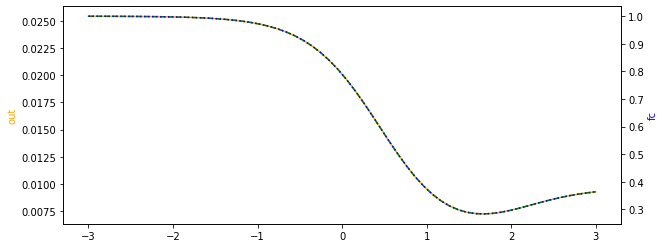

1.0,6.9571798002974115,1.0,10000.0,1.1798270182530977,10000.0,3.353886342700567,19.15659946612238,879.5892928667399,719.4033239504237,298.64156207864903,0.035017154592978994,100.0
down_up


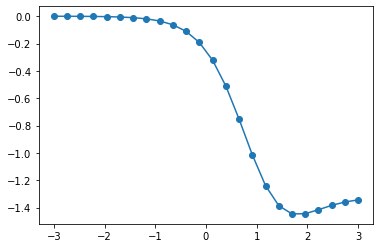

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 19.15659946612238), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 879.5892928667399), ('kb', 1.0), ('k_3_0', 1.1798270182530977), ('kr_3_0', 719.4033239504237), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 298.64156207864903), ('kb', 1.0), ('k_5_0', 3.353886342700567), ('ku', 6.9571798002974115), ('k_1_1', 1.0), ('kr_1_1', 19.15659946612238), ('ku', 6.9571798002974115), ('k_2_1', 350.17154592978994), ('kr_2_1', 879.5892928667399), ('ku', 6.9571798002974115), ('k_3_1', 1.1798270182530977), ('kr_3_1', 719.4033239504237), ('ku', 6.9571798002974115), ('k_4_1', 1000000.0), ('kr_4_1', 298.64156207864903), ('ku', 6.9571798002974115), ('k_5_1', 3.353886342700567)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

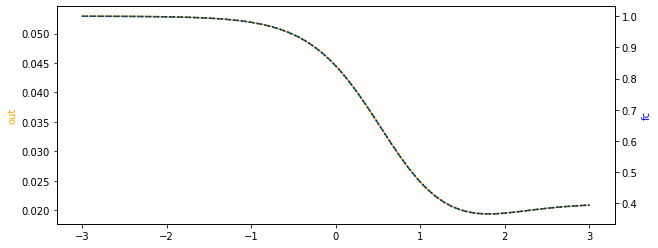

2.2857720720874397,9.746348043056395,1.0,10000.0,1.0,10000.0,1.0,115.102599490156,231.73990795983372,843.3581168248602,545.7073628426951,0.01,85.8278747134661
down_up


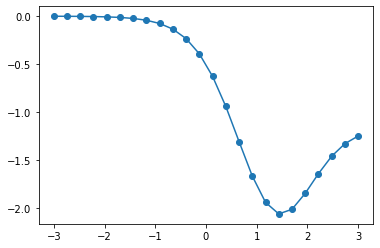

[('kb', 2.2857720720874397), ('k_1_0', 1.0), ('kr_1_0', 115.102599490156), ('kb', 2.2857720720874397), ('k_2_0', 10000.0), ('kr_2_0', 231.73990795983372), ('kb', 2.2857720720874397), ('k_3_0', 1.0), ('kr_3_0', 843.3581168248602), ('kb', 2.2857720720874397), ('k_4_0', 10000.0), ('kr_4_0', 545.7073628426951), ('kb', 2.2857720720874397), ('k_5_0', 1.0), ('ku', 9.746348043056395), ('k_1_1', 1.0), ('kr_1_1', 115.102599490156), ('ku', 9.746348043056395), ('k_2_1', 100.0), ('kr_2_1', 231.73990795983372), ('ku', 9.746348043056395), ('k_3_1', 1.0), ('kr_3_1', 843.3581168248602), ('ku', 9.746348043056395), ('k_4_1', 858278.7471346611), ('kr_4_1', 545.7073628426951), ('ku', 9.746348043056395), ('k_5_1', 1.0)]
a parameter is out of bounds! [858278.74713466]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

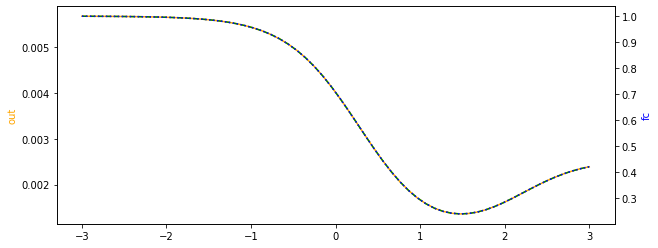

2.2857720720874397,12.419595998894145,1.0929455608597762,10000.0,1.0,9058.894713166392,1.0,66.68789806839214,389.74350786179787,836.3904620138569,538.5864805199749,0.01,85.8278747134661
down_up


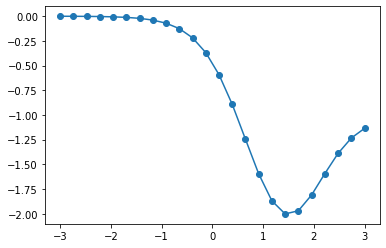

[('kb', 2.2857720720874397), ('k_1_0', 1.0929455608597762), ('kr_1_0', 66.68789806839214), ('kb', 2.2857720720874397), ('k_2_0', 10000.0), ('kr_2_0', 389.74350786179787), ('kb', 2.2857720720874397), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 2.2857720720874397), ('k_4_0', 9058.894713166392), ('kr_4_0', 538.5864805199749), ('kb', 2.2857720720874397), ('k_5_0', 1.0), ('ku', 12.419595998894145), ('k_1_1', 1.0929455608597762), ('kr_1_1', 66.68789806839214), ('ku', 12.419595998894145), ('k_2_1', 100.0), ('kr_2_1', 389.74350786179787), ('ku', 12.419595998894145), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 12.419595998894145), ('k_4_1', 777505.6804841255), ('kr_4_1', 538.5864805199749), ('ku', 12.419595998894145), ('k_5_1', 1.0)]
a parameter is out of bounds! [777505.68048413]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

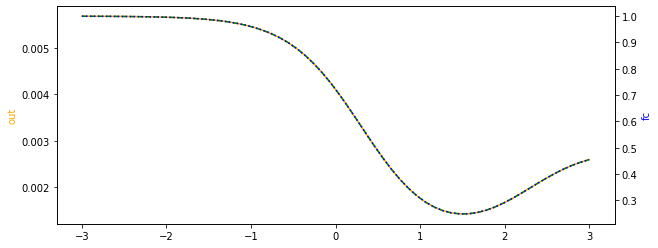

1.0,2.3874909307545815,1.0,10000.0,1.0,10000.0,1.0,17.756024817235964,400.50538094753426,836.3904620138569,70.97807612308421,0.035017154592978994,24.840581690896446
down_up


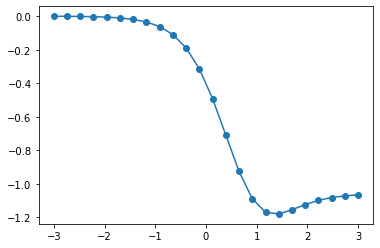

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 17.756024817235964), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 70.97807612308421), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 2.3874909307545815), ('k_1_1', 1.0), ('kr_1_1', 17.756024817235964), ('ku', 2.3874909307545815), ('k_2_1', 350.17154592978994), ('kr_2_1', 400.50538094753426), ('ku', 2.3874909307545815), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 2.3874909307545815), ('k_4_1', 248405.81690896445), ('kr_4_1', 70.97807612308421), ('ku', 2.3874909307545815), ('k_5_1', 1.0)]
a parameter is out of bounds! [248405.81690896]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

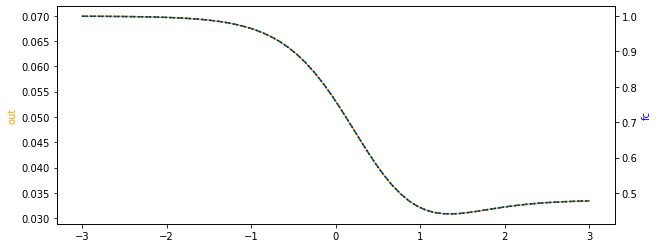

1.0,3.1915775211721242,1.0948955632128845,10000.0,1.0,10000.0,1.0,13.22774015149745,362.9187470079768,836.3904620138569,324.1429912573653,0.01,38.365179648558666
down_up


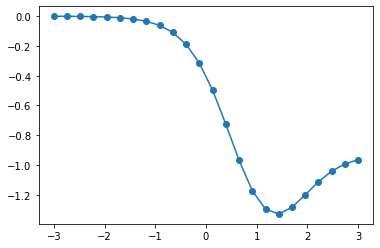

[('kb', 1.0), ('k_1_0', 1.0948955632128845), ('kr_1_0', 13.22774015149745), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 362.9187470079768), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 324.1429912573653), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 3.1915775211721242), ('k_1_1', 1.0948955632128845), ('kr_1_1', 13.22774015149745), ('ku', 3.1915775211721242), ('k_2_1', 100.0), ('kr_2_1', 362.9187470079768), ('ku', 3.1915775211721242), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 3.1915775211721242), ('k_4_1', 383651.7964855867), ('kr_4_1', 324.1429912573653), ('ku', 3.1915775211721242), ('k_5_1', 1.0)]
a parameter is out of bounds! [383651.79648559]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

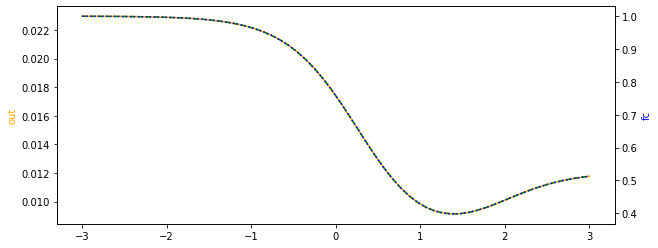

3.545076054488609,12.325682040175748,1.0,10000.0,1.0,10000.0,1.4259835251297395,176.8721256031091,400.50538094753426,461.2772822918651,498.83349170890597,0.035017154592978994,60.51420465829963
down_up


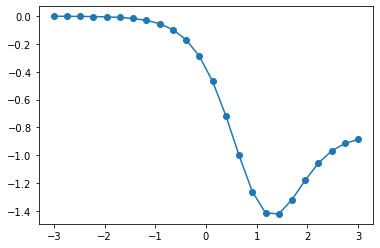

[('kb', 3.545076054488609), ('k_1_0', 1.0), ('kr_1_0', 176.8721256031091), ('kb', 3.545076054488609), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 3.545076054488609), ('k_3_0', 1.0), ('kr_3_0', 461.2772822918651), ('kb', 3.545076054488609), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 3.545076054488609), ('k_5_0', 1.4259835251297395), ('ku', 12.325682040175748), ('k_1_1', 1.0), ('kr_1_1', 176.8721256031091), ('ku', 12.325682040175748), ('k_2_1', 350.17154592978994), ('kr_2_1', 400.50538094753426), ('ku', 12.325682040175748), ('k_3_1', 1.0), ('kr_3_1', 461.2772822918651), ('ku', 12.325682040175748), ('k_4_1', 605142.0465829964), ('kr_4_1', 498.83349170890597), ('ku', 12.325682040175748), ('k_5_1', 1.4259835251297395)]
a parameter is out of bounds! [605142.046583]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

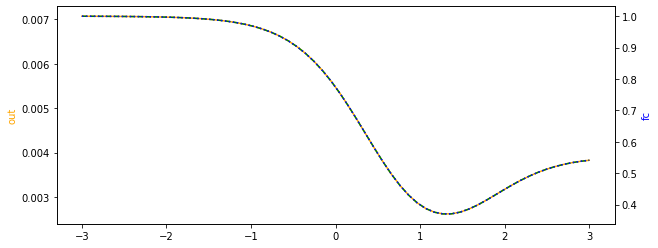

1.0,1.0,1.0,10000.0,1.0,10000.0,1.0,34.1673566847404,95.28116441550918,489.94879928828266,513.3313588122679,0.01,30.56541462312352
down_up


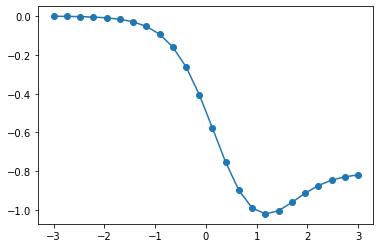

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 34.1673566847404), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 95.28116441550918), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 489.94879928828266), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 513.3313588122679), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 34.1673566847404), ('ku', 1.0), ('k_2_1', 100.0), ('kr_2_1', 95.28116441550918), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 489.94879928828266), ('ku', 1.0), ('k_4_1', 305654.1462312352), ('kr_4_1', 513.3313588122679), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

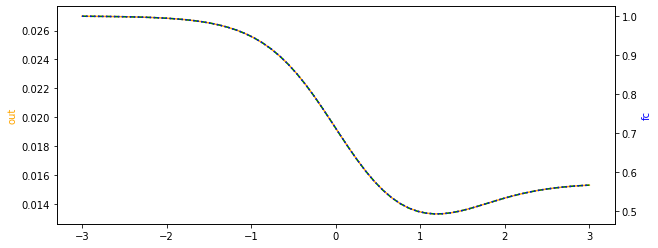

3.545076054488609,69.09584890270423,1.527821759576295,10000.0,2.065971555835172,10000.0,1.4259835251297395,236.25127096143945,237.06626680632843,461.2772822918651,498.83349170890597,0.03604848377769562,54.21233876438792
down_up


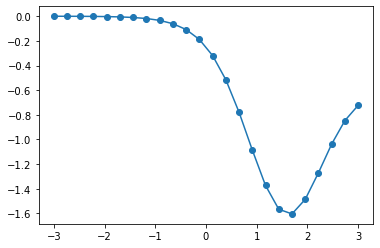

[('kb', 3.545076054488609), ('k_1_0', 1.527821759576295), ('kr_1_0', 236.25127096143945), ('kb', 3.545076054488609), ('k_2_0', 10000.0), ('kr_2_0', 237.06626680632843), ('kb', 3.545076054488609), ('k_3_0', 2.065971555835172), ('kr_3_0', 461.2772822918651), ('kb', 3.545076054488609), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 3.545076054488609), ('k_5_0', 1.4259835251297395), ('ku', 69.09584890270423), ('k_1_1', 1.527821759576295), ('kr_1_1', 236.25127096143945), ('ku', 69.09584890270423), ('k_2_1', 360.4848377769562), ('kr_2_1', 237.06626680632843), ('ku', 69.09584890270423), ('k_3_1', 2.065971555835172), ('kr_3_1', 461.2772822918651), ('ku', 69.09584890270423), ('k_4_1', 542123.3876438793), ('kr_4_1', 498.83349170890597), ('ku', 69.09584890270423), ('k_5_1', 1.4259835251297395)]
a parameter is out of bounds! [542123.38764388]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

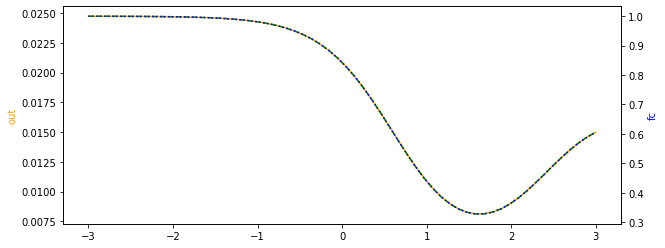

3.545076054488609,79.29009462197907,2.210297855126414,10000.0,1.0,10000.0,1.4259835251297395,176.8721256031091,316.22816196956904,461.2772822918651,498.83349170890597,0.035017154592978994,60.51420465829963
down_up


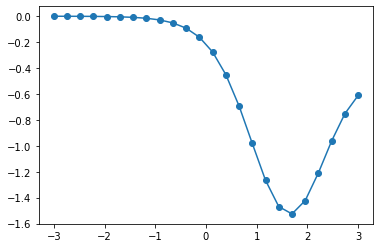

[('kb', 3.545076054488609), ('k_1_0', 2.210297855126414), ('kr_1_0', 176.8721256031091), ('kb', 3.545076054488609), ('k_2_0', 10000.0), ('kr_2_0', 316.22816196956904), ('kb', 3.545076054488609), ('k_3_0', 1.0), ('kr_3_0', 461.2772822918651), ('kb', 3.545076054488609), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 3.545076054488609), ('k_5_0', 1.4259835251297395), ('ku', 79.29009462197907), ('k_1_1', 2.210297855126414), ('kr_1_1', 176.8721256031091), ('ku', 79.29009462197907), ('k_2_1', 350.17154592978994), ('kr_2_1', 316.22816196956904), ('ku', 79.29009462197907), ('k_3_1', 1.0), ('kr_3_1', 461.2772822918651), ('ku', 79.29009462197907), ('k_4_1', 605142.0465829964), ('kr_4_1', 498.83349170890597), ('ku', 79.29009462197907), ('k_5_1', 1.4259835251297395)]
a parameter is out of bounds! [605142.046583]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

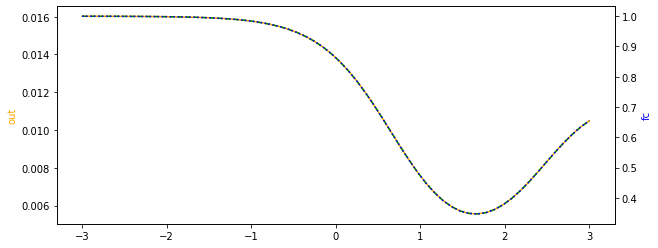

1.0,4.397111465333251,1.5050590808139899,10000.0,3.028882714063036,10000.0,3.353886342700567,13.22774015149745,400.50538094753426,719.4033239504237,271.88894705435655,0.035017154592978994,23.561738690874705
down_up


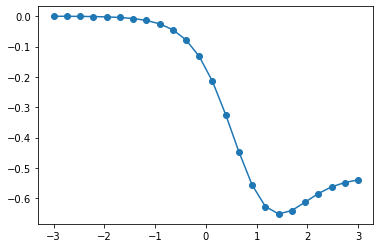

[('kb', 1.0), ('k_1_0', 1.5050590808139899), ('kr_1_0', 13.22774015149745), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 1.0), ('k_3_0', 3.028882714063036), ('kr_3_0', 719.4033239504237), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 3.353886342700567), ('ku', 4.397111465333251), ('k_1_1', 1.5050590808139899), ('kr_1_1', 13.22774015149745), ('ku', 4.397111465333251), ('k_2_1', 350.17154592978994), ('kr_2_1', 400.50538094753426), ('ku', 4.397111465333251), ('k_3_1', 3.028882714063036), ('kr_3_1', 719.4033239504237), ('ku', 4.397111465333251), ('k_4_1', 235617.38690874705), ('kr_4_1', 271.88894705435655), ('ku', 4.397111465333251), ('k_5_1', 3.353886342700567)]
a parameter is out of bounds! [235617.38690875]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

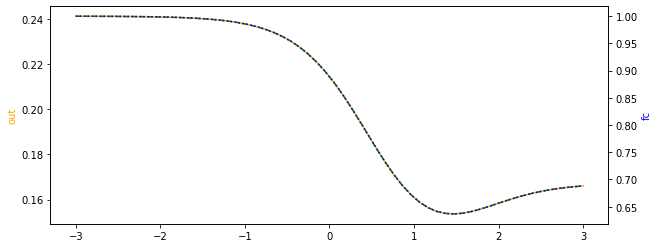

3.9325701017987313,1.4515921316170544,1.0,8739.524880689502,1.0,10000.0,1.0,44.65800741837991,517.5616532495859,598.1519074962997,498.83349170890597,0.035017154592978994,30.56541462312352
down_up


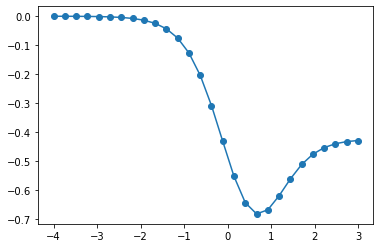

[('kb', 3.9325701017987313), ('k_1_0', 1.0), ('kr_1_0', 44.65800741837991), ('kb', 3.9325701017987313), ('k_2_0', 8739.524880689502), ('kr_2_0', 517.5616532495859), ('kb', 3.9325701017987313), ('k_3_0', 1.0), ('kr_3_0', 598.1519074962997), ('kb', 3.9325701017987313), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 3.9325701017987313), ('k_5_0', 1.0), ('ku', 1.4515921316170544), ('k_1_1', 1.0), ('kr_1_1', 44.65800741837991), ('ku', 1.4515921316170544), ('k_2_1', 306.03329381629055), ('kr_2_1', 517.5616532495859), ('ku', 1.4515921316170544), ('k_3_1', 1.0), ('kr_3_1', 598.1519074962997), ('ku', 1.4515921316170544), ('k_4_1', 305654.1462312352), ('kr_4_1', 498.83349170890597), ('ku', 1.4515921316170544), ('k_5_1', 1.0)]
a parameter is out of bounds! [305654.14623124]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

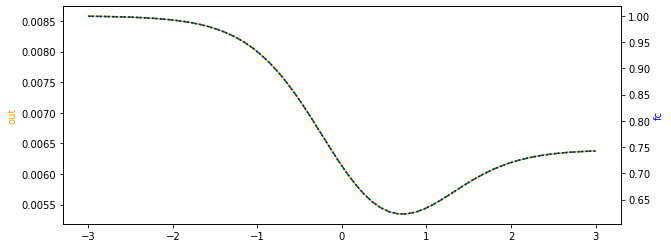

3.545076054488609,1.250453350194855,1.0,10000.0,1.0,10000.0,1.0,44.65800741837991,400.50538094753426,598.1519074962997,498.83349170890597,0.033947972142525755,27.884723872401505
down_up


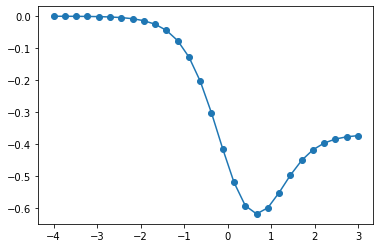

[('kb', 3.545076054488609), ('k_1_0', 1.0), ('kr_1_0', 44.65800741837991), ('kb', 3.545076054488609), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 3.545076054488609), ('k_3_0', 1.0), ('kr_3_0', 598.1519074962997), ('kb', 3.545076054488609), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 3.545076054488609), ('k_5_0', 1.0), ('ku', 1.250453350194855), ('k_1_1', 1.0), ('kr_1_1', 44.65800741837991), ('ku', 1.250453350194855), ('k_2_1', 339.47972142525754), ('kr_2_1', 400.50538094753426), ('ku', 1.250453350194855), ('k_3_1', 1.0), ('kr_3_1', 598.1519074962997), ('ku', 1.250453350194855), ('k_4_1', 278847.2387240151), ('kr_4_1', 498.83349170890597), ('ku', 1.250453350194855), ('k_5_1', 1.0)]
a parameter is out of bounds! [278847.23872402]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

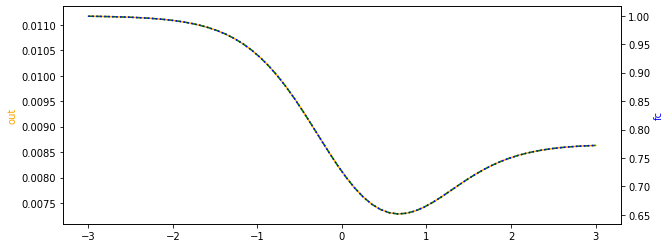

1.0,1.0,1.0,10000.0,5.055039730235113,10000.0,1.0,13.22774015149745,3686.54823012488,836.3904620138569,271.88894705435655,0.035017154592978994,100.0
down_up


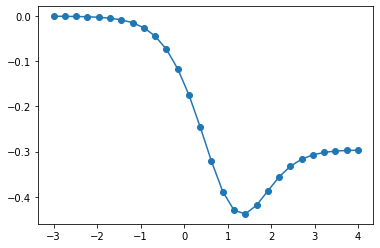

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 13.22774015149745), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 3686.54823012488), ('kb', 1.0), ('k_3_0', 5.055039730235113), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 13.22774015149745), ('ku', 1.0), ('k_2_1', 350.17154592978994), ('kr_2_1', 3686.54823012488), ('ku', 1.0), ('k_3_1', 5.055039730235113), ('kr_3_1', 836.3904620138569), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 271.88894705435655), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

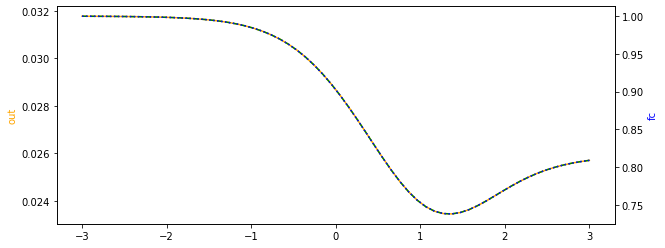

1.0,1.0,1.0,10000.0,1.2041289741713166,10000.0,1.0,61.35323354716292,431.44875167079186,836.3904620138569,275.56204224241304,0.035017154592978994,70.48280540846295
down_up


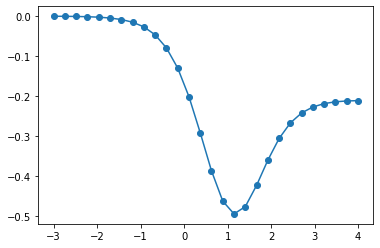

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 61.35323354716292), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 431.44875167079186), ('kb', 1.0), ('k_3_0', 1.2041289741713166), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 275.56204224241304), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 61.35323354716292), ('ku', 1.0), ('k_2_1', 350.17154592978994), ('kr_2_1', 431.44875167079186), ('ku', 1.0), ('k_3_1', 1.2041289741713166), ('kr_3_1', 836.3904620138569), ('ku', 1.0), ('k_4_1', 704828.0540846295), ('kr_4_1', 275.56204224241304), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [704828.05408463]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

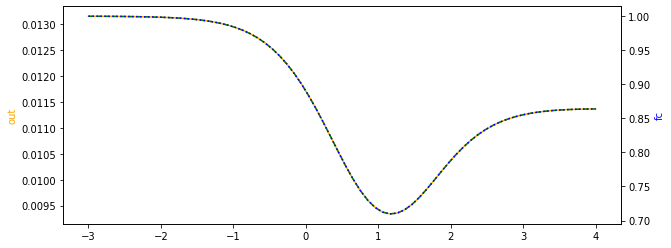

5.536667584526978,2.9713008564095613,1.0,10000.0,1.0,10000.0,1.2288891754310087,44.65800741837991,400.50538094753426,461.2772822918651,532.066012980211,0.035017154592978994,100.0
down_up


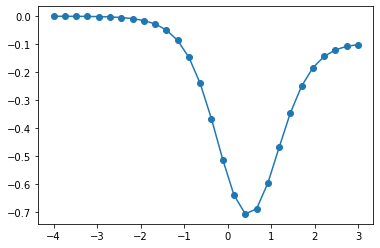

[('kb', 5.536667584526978), ('k_1_0', 1.0), ('kr_1_0', 44.65800741837991), ('kb', 5.536667584526978), ('k_2_0', 10000.0), ('kr_2_0', 400.50538094753426), ('kb', 5.536667584526978), ('k_3_0', 1.0), ('kr_3_0', 461.2772822918651), ('kb', 5.536667584526978), ('k_4_0', 10000.0), ('kr_4_0', 532.066012980211), ('kb', 5.536667584526978), ('k_5_0', 1.2288891754310087), ('ku', 2.9713008564095613), ('k_1_1', 1.0), ('kr_1_1', 44.65800741837991), ('ku', 2.9713008564095613), ('k_2_1', 350.17154592978994), ('kr_2_1', 400.50538094753426), ('ku', 2.9713008564095613), ('k_3_1', 1.0), ('kr_3_1', 461.2772822918651), ('ku', 2.9713008564095613), ('k_4_1', 1000000.0), ('kr_4_1', 532.066012980211), ('ku', 2.9713008564095613), ('k_5_1', 1.2288891754310087)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

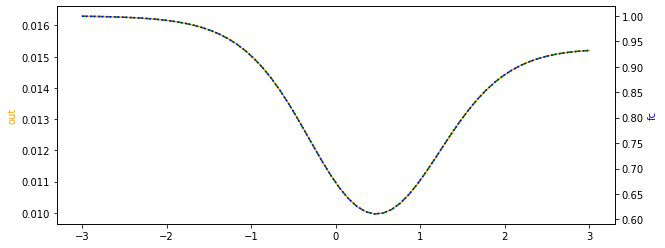

17.261550795570514,2.2853777115680605,1.0,10000.0,1.0,10000.0,1.0,60.65411311053982,517.7206416721251,262.68124275980045,429.354134755886,0.0681037034951775,100.0
down_up


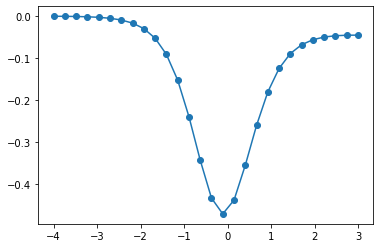

[('kb', 17.261550795570514), ('k_1_0', 1.0), ('kr_1_0', 60.65411311053982), ('kb', 17.261550795570514), ('k_2_0', 10000.0), ('kr_2_0', 517.7206416721251), ('kb', 17.261550795570514), ('k_3_0', 1.0), ('kr_3_0', 262.68124275980045), ('kb', 17.261550795570514), ('k_4_0', 10000.0), ('kr_4_0', 429.354134755886), ('kb', 17.261550795570514), ('k_5_0', 1.0), ('ku', 2.2853777115680605), ('k_1_1', 1.0), ('kr_1_1', 60.65411311053982), ('ku', 2.2853777115680605), ('k_2_1', 681.037034951775), ('kr_2_1', 517.7206416721251), ('ku', 2.2853777115680605), ('k_3_1', 1.0), ('kr_3_1', 262.68124275980045), ('ku', 2.2853777115680605), ('k_4_1', 1000000.0), ('kr_4_1', 429.354134755886), ('ku', 2.2853777115680605), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

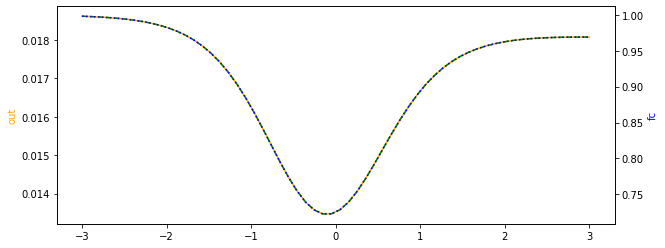

5.536667584526978,37.04495667394019,1.0,10000.0,1.0,10000.0,3.2311067127345754,44.65800741837991,408.43293100136077,1529.393344632695,498.83349170890597,0.035017154592978994,91.85747482429898
down_up


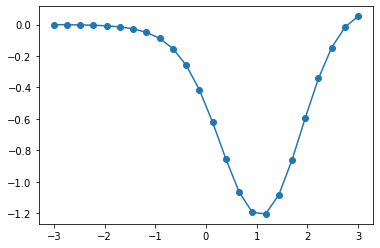

[('kb', 5.536667584526978), ('k_1_0', 1.0), ('kr_1_0', 44.65800741837991), ('kb', 5.536667584526978), ('k_2_0', 10000.0), ('kr_2_0', 408.43293100136077), ('kb', 5.536667584526978), ('k_3_0', 1.0), ('kr_3_0', 1529.393344632695), ('kb', 5.536667584526978), ('k_4_0', 10000.0), ('kr_4_0', 498.83349170890597), ('kb', 5.536667584526978), ('k_5_0', 3.2311067127345754), ('ku', 37.04495667394019), ('k_1_1', 1.0), ('kr_1_1', 44.65800741837991), ('ku', 37.04495667394019), ('k_2_1', 350.17154592978994), ('kr_2_1', 408.43293100136077), ('ku', 37.04495667394019), ('k_3_1', 1.0), ('kr_3_1', 1529.393344632695), ('ku', 37.04495667394019), ('k_4_1', 918574.7482429898), ('kr_4_1', 498.83349170890597), ('ku', 37.04495667394019), ('k_5_1', 3.2311067127345754)]
a parameter is out of bounds! [918574.74824299]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

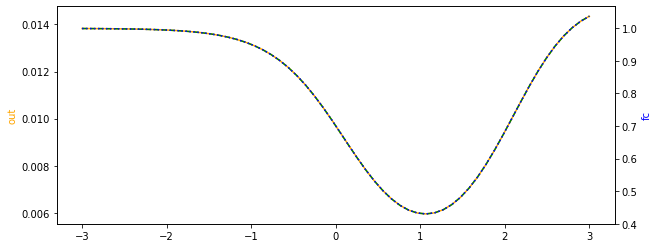

1.0,3.855879934686684,1.0,10000.0,1.0,10000.0,1.0,79.54990764779717,2888.2146997947984,836.3904620138569,182.84245534223788,0.08858618522079766,44.720507842132605
down_up


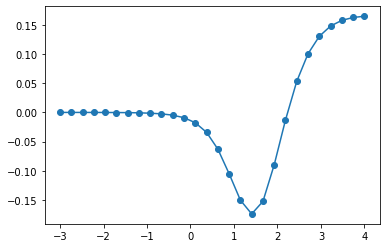

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 79.54990764779717), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 2888.2146997947984), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 3.855879934686684), ('k_1_1', 1.0), ('kr_1_1', 79.54990764779717), ('ku', 3.855879934686684), ('k_2_1', 885.8618522079765), ('kr_2_1', 2888.2146997947984), ('ku', 3.855879934686684), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 3.855879934686684), ('k_4_1', 447205.07842132606), ('kr_4_1', 182.84245534223788), ('ku', 3.855879934686684), ('k_5_1', 1.0)]
a parameter is out of bounds! [447205.07842133]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

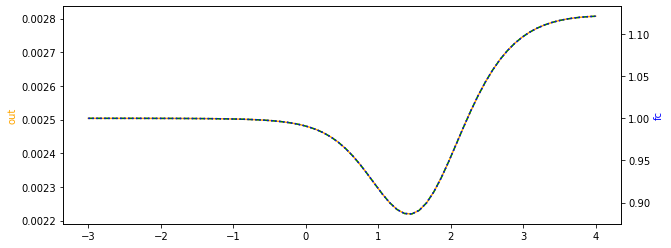

1.0,70.19837272777933,1.0,10000.0,1.0,10000.0,1.0,172.04019065375695,413.96853921915925,754.9155071232096,182.84245534223788,0.08858618522079766,74.73956131152656
down_up


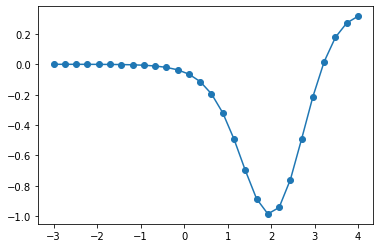

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 172.04019065375695), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 413.96853921915925), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 754.9155071232096), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 70.19837272777933), ('k_1_1', 1.0), ('kr_1_1', 172.04019065375695), ('ku', 70.19837272777933), ('k_2_1', 885.8618522079765), ('kr_2_1', 413.96853921915925), ('ku', 70.19837272777933), ('k_3_1', 1.0), ('kr_3_1', 754.9155071232096), ('ku', 70.19837272777933), ('k_4_1', 747395.6131152656), ('kr_4_1', 182.84245534223788), ('ku', 70.19837272777933), ('k_5_1', 1.0)]
a parameter is out of bounds! [747395.61311527]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

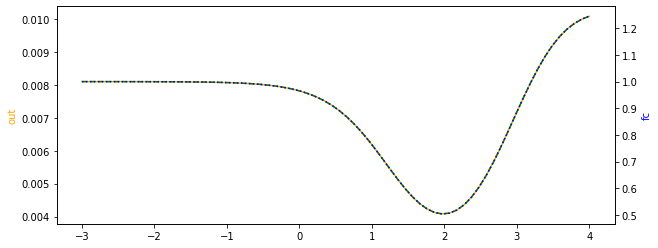

1.0,3.6578489583672837,1.0,10000.0,1.0,10000.0,1.0,93.23588383332412,1071.366811324567,836.3904620138569,182.84245534223788,0.08858618522079766,73.61403953810026
down_up


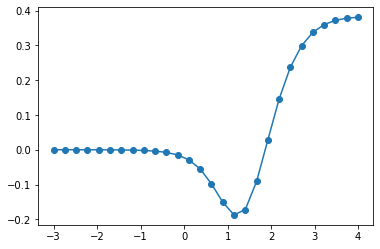

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 93.23588383332412), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 1071.366811324567), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 3.6578489583672837), ('k_1_1', 1.0), ('kr_1_1', 93.23588383332412), ('ku', 3.6578489583672837), ('k_2_1', 885.8618522079765), ('kr_2_1', 1071.366811324567), ('ku', 3.6578489583672837), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 3.6578489583672837), ('k_4_1', 736140.3953810026), ('kr_4_1', 182.84245534223788), ('ku', 3.6578489583672837), ('k_5_1', 1.0)]
a parameter is out of bounds! [736140.395381]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

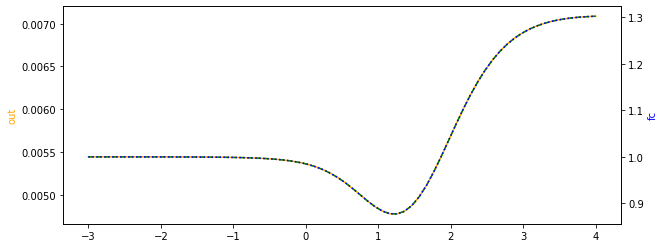

1.0,20.57557076939951,1.0,10000.0,1.0,10000.0,1.0,43.46130473122574,901.1262677098221,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0
down_up


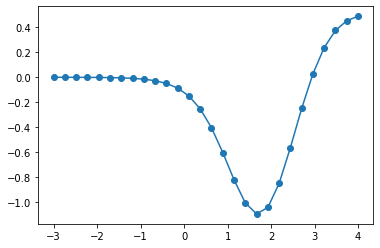

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 43.46130473122574), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 901.1262677098221), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 20.57557076939951), ('k_1_1', 1.0), ('kr_1_1', 43.46130473122574), ('ku', 20.57557076939951), ('k_2_1', 337.66297121248135), ('kr_2_1', 901.1262677098221), ('ku', 20.57557076939951), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 20.57557076939951), ('k_4_1', 1000000.0), ('kr_4_1', 271.88894705435655), ('ku', 20.57557076939951), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

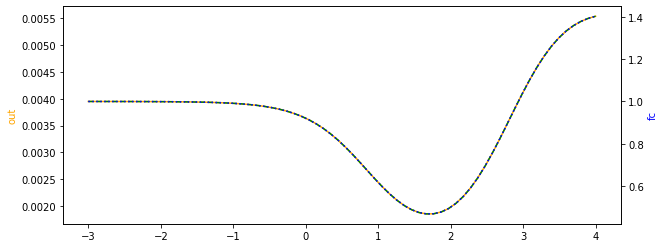

11.296250433584207,4.322912798305444,1.0,8190.589047617143,2.8052808015062225,10000.0,1.0,50.80489734633012,476.5830598897194,836.3904620138569,214.78512911693497,0.08858618522079766,43.45941497012586
down_up


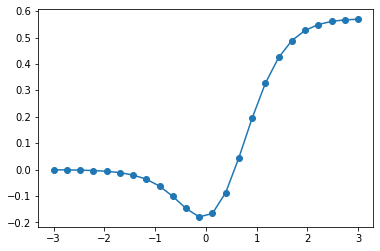

[('kb', 11.296250433584207), ('k_1_0', 1.0), ('kr_1_0', 50.80489734633012), ('kb', 11.296250433584207), ('k_2_0', 8190.589047617143), ('kr_2_0', 476.5830598897194), ('kb', 11.296250433584207), ('k_3_0', 2.8052808015062225), ('kr_3_0', 836.3904620138569), ('kb', 11.296250433584207), ('k_4_0', 10000.0), ('kr_4_0', 214.78512911693497), ('kb', 11.296250433584207), ('k_5_0', 1.0), ('ku', 4.322912798305444), ('k_1_1', 1.0), ('kr_1_1', 50.80489734633012), ('ku', 4.322912798305444), ('k_2_1', 725.5730384396488), ('kr_2_1', 476.5830598897194), ('ku', 4.322912798305444), ('k_3_1', 2.8052808015062225), ('kr_3_1', 836.3904620138569), ('ku', 4.322912798305444), ('k_4_1', 434594.14970125863), ('kr_4_1', 214.78512911693497), ('ku', 4.322912798305444), ('k_5_1', 1.0)]
a parameter is out of bounds! [434594.14970126]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

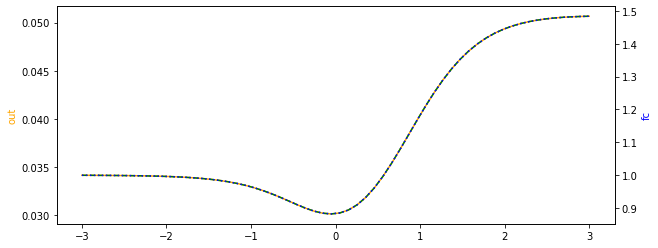

1.0,28.914599638597508,1.0,9715.323320509233,1.0,10000.0,3.7245162583662714,31.399279519854232,1007.3679426117959,3119.456467529142,182.84245534223788,0.08858618522079766,100.0
down_up


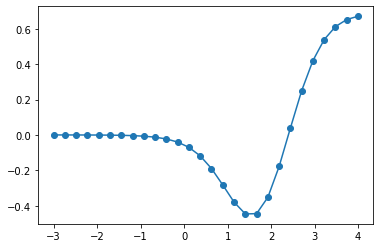

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 31.399279519854232), ('kb', 1.0), ('k_2_0', 9715.323320509233), ('kr_2_0', 1007.3679426117959), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 3119.456467529142), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 3.7245162583662714), ('ku', 28.914599638597508), ('k_1_1', 1.0), ('kr_1_1', 31.399279519854232), ('ku', 28.914599638597508), ('k_2_1', 860.6434311505658), ('kr_2_1', 1007.3679426117959), ('ku', 28.914599638597508), ('k_3_1', 1.0), ('kr_3_1', 3119.456467529142), ('ku', 28.914599638597508), ('k_4_1', 1000000.0), ('kr_4_1', 182.84245534223788), ('ku', 28.914599638597508), ('k_5_1', 3.7245162583662714)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

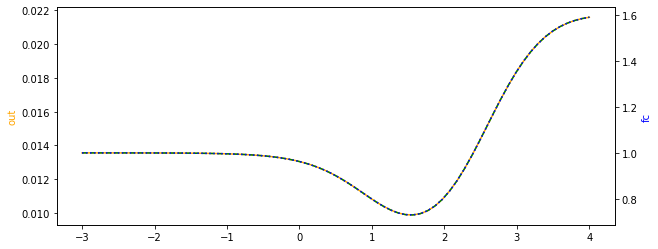

1.0,25.260625067135898,1.0,10000.0,1.0,10000.0,1.0,16.202791342867158,925.5397340517231,754.9155071232096,182.84245534223788,0.08858618522079766,74.73956131152656
down_up


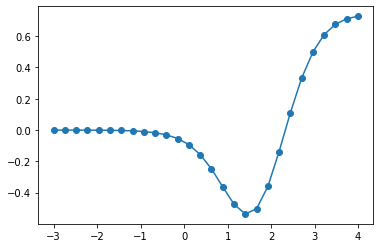

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 16.202791342867158), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 925.5397340517231), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 754.9155071232096), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 25.260625067135898), ('k_1_1', 1.0), ('kr_1_1', 16.202791342867158), ('ku', 25.260625067135898), ('k_2_1', 885.8618522079765), ('kr_2_1', 925.5397340517231), ('ku', 25.260625067135898), ('k_3_1', 1.0), ('kr_3_1', 754.9155071232096), ('ku', 25.260625067135898), ('k_4_1', 747395.6131152656), ('kr_4_1', 182.84245534223788), ('ku', 25.260625067135898), ('k_5_1', 1.0)]
a parameter is out of bounds! [747395.61311527]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

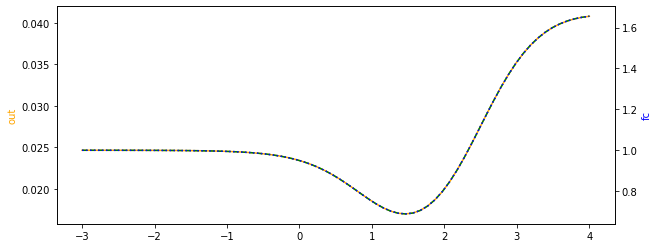

1.0,34.31887769437997,1.0,10000.0,3.595166659250405,10000.0,1.0,50.97556594464973,271.481309364169,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0
down_up


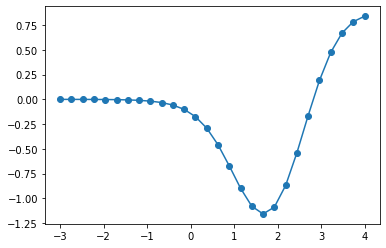

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 50.97556594464973), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 271.481309364169), ('kb', 1.0), ('k_3_0', 3.595166659250405), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 34.31887769437997), ('k_1_1', 1.0), ('kr_1_1', 50.97556594464973), ('ku', 34.31887769437997), ('k_2_1', 337.66297121248135), ('kr_2_1', 271.481309364169), ('ku', 34.31887769437997), ('k_3_1', 3.595166659250405), ('kr_3_1', 1800.9438704650518), ('ku', 34.31887769437997), ('k_4_1', 1000000.0), ('kr_4_1', 271.88894705435655), ('ku', 34.31887769437997), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

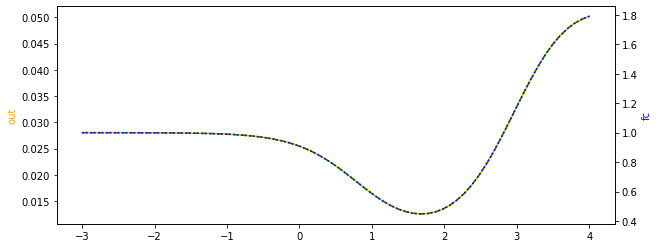

10.951739673014297,8.207060916576433,1.0,10000.0,1.0,10000.0,1.0,50.80489734633012,261.89994584718215,836.3904620138569,182.84245534223788,0.08456764718360914,100.0
down_up


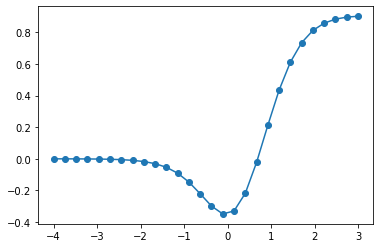

[('kb', 10.951739673014297), ('k_1_0', 1.0), ('kr_1_0', 50.80489734633012), ('kb', 10.951739673014297), ('k_2_0', 10000.0), ('kr_2_0', 261.89994584718215), ('kb', 10.951739673014297), ('k_3_0', 1.0), ('kr_3_0', 836.3904620138569), ('kb', 10.951739673014297), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 10.951739673014297), ('k_5_0', 1.0), ('ku', 8.207060916576433), ('k_1_1', 1.0), ('kr_1_1', 50.80489734633012), ('ku', 8.207060916576433), ('k_2_1', 845.6764718360914), ('kr_2_1', 261.89994584718215), ('ku', 8.207060916576433), ('k_3_1', 1.0), ('kr_3_1', 836.3904620138569), ('ku', 8.207060916576433), ('k_4_1', 1000000.0), ('kr_4_1', 182.84245534223788), ('ku', 8.207060916576433), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

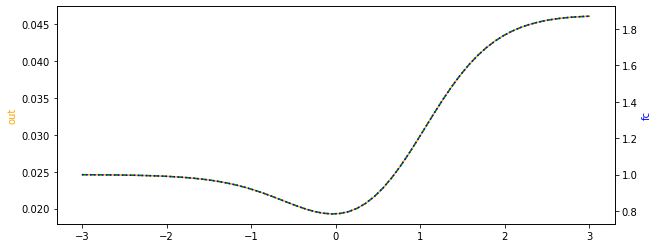

9.951070416335623,57.804682764678034,1.0696319021197915,10000.0,1.0,5265.030478186435,1.0,160.78577041126485,269.16644852276266,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0
down_up


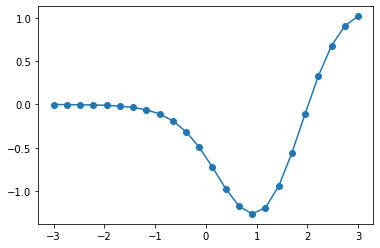

[('kb', 9.951070416335623), ('k_1_0', 1.0696319021197915), ('kr_1_0', 160.78577041126485), ('kb', 9.951070416335623), ('k_2_0', 10000.0), ('kr_2_0', 269.16644852276266), ('kb', 9.951070416335623), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 9.951070416335623), ('k_4_0', 5265.030478186435), ('kr_4_0', 271.88894705435655), ('kb', 9.951070416335623), ('k_5_0', 1.0), ('ku', 57.804682764678034), ('k_1_1', 1.0696319021197915), ('kr_1_1', 160.78577041126485), ('ku', 57.804682764678034), ('k_2_1', 337.66297121248135), ('kr_2_1', 269.16644852276266), ('ku', 57.804682764678034), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 57.804682764678034), ('k_4_1', 526503.0478186435), ('kr_4_1', 271.88894705435655), ('ku', 57.804682764678034), ('k_5_1', 1.0)]
a parameter is out of bounds! [526503.04781864]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

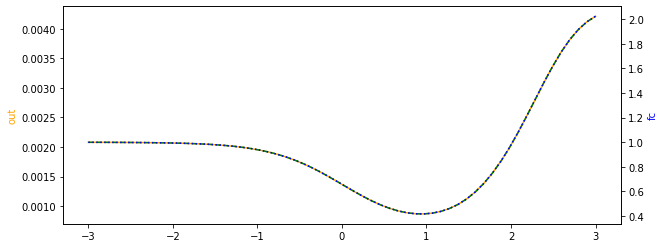

1.0,82.26545271112352,1.0,10000.0,1.0,5873.063033251574,1.0,35.244600218753554,669.0268154411764,1800.9438704650518,275.387715628289,0.03376629712124814,100.0
down_up


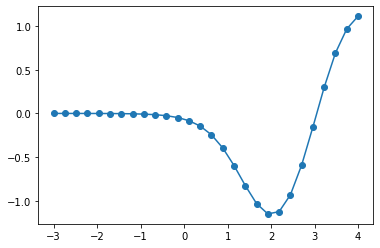

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 35.244600218753554), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 669.0268154411764), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 5873.063033251574), ('kr_4_0', 275.387715628289), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 82.26545271112352), ('k_1_1', 1.0), ('kr_1_1', 35.244600218753554), ('ku', 82.26545271112352), ('k_2_1', 337.66297121248135), ('kr_2_1', 669.0268154411764), ('ku', 82.26545271112352), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 82.26545271112352), ('k_4_1', 587306.3033251574), ('kr_4_1', 275.387715628289), ('ku', 82.26545271112352), ('k_5_1', 1.0)]
a parameter is out of bounds! [587306.30332516]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

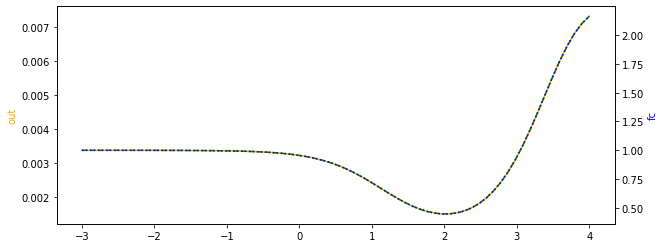

1.0,55.86178120701407,1.0960921453965315,10000.0,1.0,4125.622651286843,1.0,78.26925257488543,717.704252809036,1800.9438704650518,327.73265036982673,0.03376629712124814,100.0
down_up


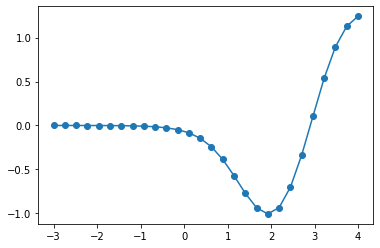

[('kb', 1.0), ('k_1_0', 1.0960921453965315), ('kr_1_0', 78.26925257488543), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 717.704252809036), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 4125.622651286843), ('kr_4_0', 327.73265036982673), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 55.86178120701407), ('k_1_1', 1.0960921453965315), ('kr_1_1', 78.26925257488543), ('ku', 55.86178120701407), ('k_2_1', 337.66297121248135), ('kr_2_1', 717.704252809036), ('ku', 55.86178120701407), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 55.86178120701407), ('k_4_1', 412562.26512868435), ('kr_4_1', 327.73265036982673), ('ku', 55.86178120701407), ('k_5_1', 1.0)]
a parameter is out of bounds! [412562.26512868]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

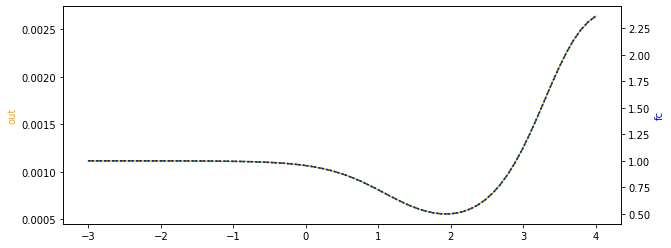

1.0,91.5883836901134,1.0,10000.0,1.0,5265.030478186435,1.0,152.8760175177456,103.54618099194046,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0
down_up


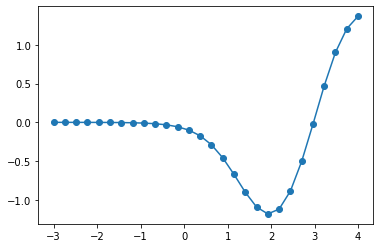

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 152.8760175177456), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 103.54618099194046), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 5265.030478186435), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 91.5883836901134), ('k_1_1', 1.0), ('kr_1_1', 152.8760175177456), ('ku', 91.5883836901134), ('k_2_1', 337.66297121248135), ('kr_2_1', 103.54618099194046), ('ku', 91.5883836901134), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 91.5883836901134), ('k_4_1', 526503.0478186435), ('kr_4_1', 271.88894705435655), ('ku', 91.5883836901134), ('k_5_1', 1.0)]
a parameter is out of bounds! [526503.04781864]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

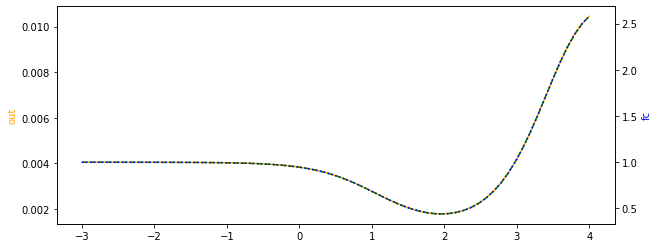

1.0,25.260625067135898,1.0,10000.0,3.517558241467169,10000.0,1.0,34.43107486264802,1071.366811324567,836.3904620138569,182.84245534223788,0.21261754684216316,58.15769871932416
down_up


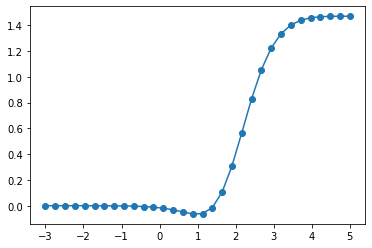

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 34.43107486264802), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 1071.366811324567), ('kb', 1.0), ('k_3_0', 3.517558241467169), ('kr_3_0', 836.3904620138569), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 25.260625067135898), ('k_1_1', 1.0), ('kr_1_1', 34.43107486264802), ('ku', 25.260625067135898), ('k_2_1', 2126.1754684216316), ('kr_2_1', 1071.366811324567), ('ku', 25.260625067135898), ('k_3_1', 3.517558241467169), ('kr_3_1', 836.3904620138569), ('ku', 25.260625067135898), ('k_4_1', 581576.9871932416), ('kr_4_1', 182.84245534223788), ('ku', 25.260625067135898), ('k_5_1', 1.0)]
a parameter is out of bounds! [581576.98719324]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

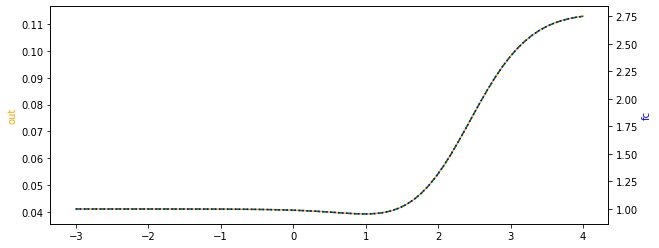

1.0,155.00341517761115,1.5133491598801303,10000.0,1.0,4063.6765609556014,1.0,27.519474823396003,901.1262677098221,1800.9438704650518,327.73265036982673,0.03376629712124814,100.0
down_up


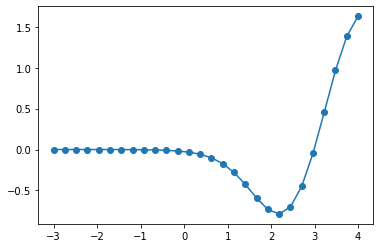

[('kb', 1.0), ('k_1_0', 1.5133491598801303), ('kr_1_0', 27.519474823396003), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 901.1262677098221), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 4063.6765609556014), ('kr_4_0', 327.73265036982673), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 155.00341517761115), ('k_1_1', 1.5133491598801303), ('kr_1_1', 27.519474823396003), ('ku', 155.00341517761115), ('k_2_1', 337.66297121248135), ('kr_2_1', 901.1262677098221), ('ku', 155.00341517761115), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 155.00341517761115), ('k_4_1', 406367.6560955601), ('kr_4_1', 327.73265036982673), ('ku', 155.00341517761115), ('k_5_1', 1.0)]
a parameter is out of bounds! [406367.65609556]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

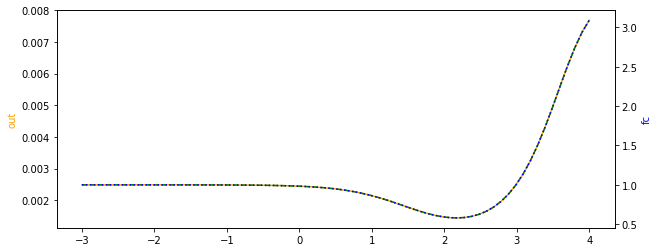

3.5954764971493036,29.746520527393553,2.4301781103737654,10000.0,1.0,10000.0,1.0,93.23588383332412,1071.366811324567,465.05006455984187,630.9079351980838,0.1385657923148441,65.59414528365376
down_up


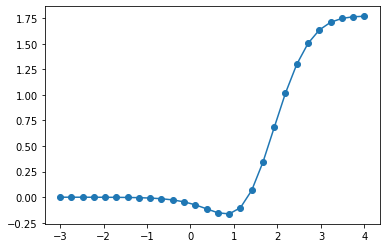

[('kb', 3.5954764971493036), ('k_1_0', 2.4301781103737654), ('kr_1_0', 93.23588383332412), ('kb', 3.5954764971493036), ('k_2_0', 10000.0), ('kr_2_0', 1071.366811324567), ('kb', 3.5954764971493036), ('k_3_0', 1.0), ('kr_3_0', 465.05006455984187), ('kb', 3.5954764971493036), ('k_4_0', 10000.0), ('kr_4_0', 630.9079351980838), ('kb', 3.5954764971493036), ('k_5_0', 1.0), ('ku', 29.746520527393553), ('k_1_1', 2.4301781103737654), ('kr_1_1', 93.23588383332412), ('ku', 29.746520527393553), ('k_2_1', 1385.657923148441), ('kr_2_1', 1071.366811324567), ('ku', 29.746520527393553), ('k_3_1', 1.0), ('kr_3_1', 465.05006455984187), ('ku', 29.746520527393553), ('k_4_1', 655941.4528365376), ('kr_4_1', 630.9079351980838), ('ku', 29.746520527393553), ('k_5_1', 1.0)]
a parameter is out of bounds! [655941.45283654]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

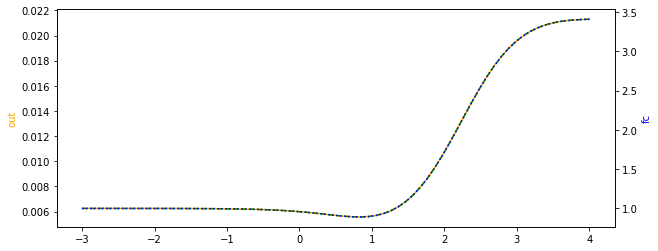

1.0,96.16045863163173,1.0,7287.045628953559,1.0,2178.22995135742,1.2368221720494654,136.29756146164655,300.33282596904013,1075.2683482052555,182.84245534223788,0.08858618522079766,74.73956131152656
down_up


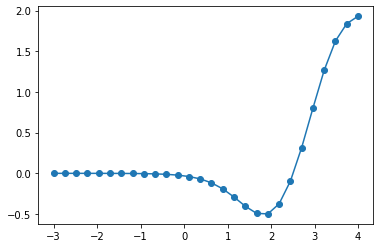

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 136.29756146164655), ('kb', 1.0), ('k_2_0', 7287.045628953559), ('kr_2_0', 300.33282596904013), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1075.2683482052555), ('kb', 1.0), ('k_4_0', 2178.22995135742), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.2368221720494654), ('ku', 96.16045863163173), ('k_1_1', 1.0), ('kr_1_1', 136.29756146164655), ('ku', 96.16045863163173), ('k_2_1', 645.5315737988839), ('kr_2_1', 300.33282596904013), ('ku', 96.16045863163173), ('k_3_1', 1.0), ('kr_3_1', 1075.2683482052555), ('ku', 96.16045863163173), ('k_4_1', 162799.9510000814), ('kr_4_1', 182.84245534223788), ('ku', 96.16045863163173), ('k_5_1', 1.2368221720494654)]
a parameter is out of bounds! [162799.95100008]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

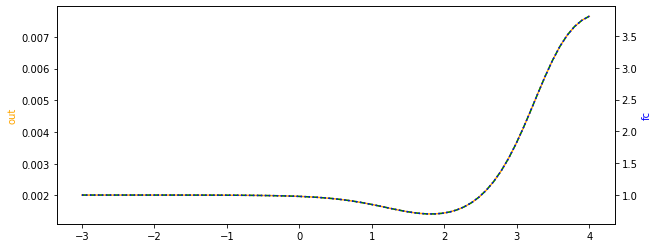

1.0,58.020983733200424,1.3396880840390237,7051.268737506845,1.5914577331033832,2178.22995135742,1.2368221720494654,89.08303002374441,300.33282596904013,1075.2683482052555,182.84245534223788,0.08858618522079766,74.73956131152656
down_up


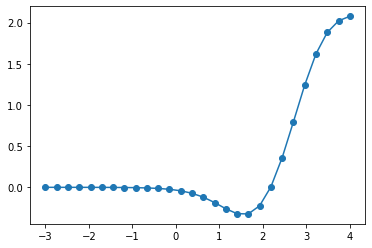

[('kb', 1.0), ('k_1_0', 1.3396880840390237), ('kr_1_0', 89.08303002374441), ('kb', 1.0), ('k_2_0', 7051.268737506845), ('kr_2_0', 300.33282596904013), ('kb', 1.0), ('k_3_0', 1.5914577331033832), ('kr_3_0', 1075.2683482052555), ('kb', 1.0), ('k_4_0', 2178.22995135742), ('kr_4_0', 182.84245534223788), ('kb', 1.0), ('k_5_0', 1.2368221720494654), ('ku', 58.020983733200424), ('k_1_1', 1.3396880840390237), ('kr_1_1', 89.08303002374441), ('ku', 58.020983733200424), ('k_2_1', 624.6449984224015), ('kr_2_1', 300.33282596904013), ('ku', 58.020983733200424), ('k_3_1', 1.5914577331033832), ('kr_3_1', 1075.2683482052555), ('ku', 58.020983733200424), ('k_4_1', 162799.9510000814), ('kr_4_1', 182.84245534223788), ('ku', 58.020983733200424), ('k_5_1', 1.2368221720494654)]
a parameter is out of bounds! [162799.95100008]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

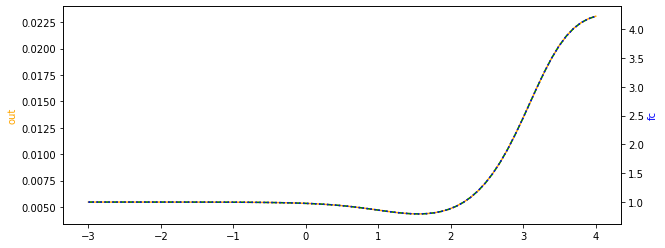

4.071262251114093,61.15519740291327,1.0,10000.0,1.0,8023.377900065395,1.0,19.121855080786858,1071.366811324567,976.4171901895702,182.84245534223788,0.21261754684216316,74.73956131152656
down_up


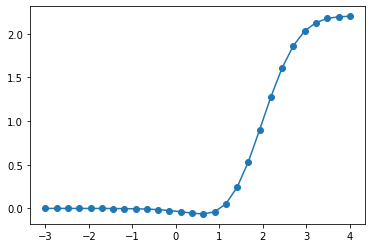

[('kb', 4.071262251114093), ('k_1_0', 1.0), ('kr_1_0', 19.121855080786858), ('kb', 4.071262251114093), ('k_2_0', 10000.0), ('kr_2_0', 1071.366811324567), ('kb', 4.071262251114093), ('k_3_0', 1.0), ('kr_3_0', 976.4171901895702), ('kb', 4.071262251114093), ('k_4_0', 8023.377900065395), ('kr_4_0', 182.84245534223788), ('kb', 4.071262251114093), ('k_5_0', 1.0), ('ku', 61.15519740291327), ('k_1_1', 1.0), ('kr_1_1', 19.121855080786858), ('ku', 61.15519740291327), ('k_2_1', 2126.1754684216316), ('kr_2_1', 1071.366811324567), ('ku', 61.15519740291327), ('k_3_1', 1.0), ('kr_3_1', 976.4171901895702), ('ku', 61.15519740291327), ('k_4_1', 599663.7444874848), ('kr_4_1', 182.84245534223788), ('ku', 61.15519740291327), ('k_5_1', 1.0)]
a parameter is out of bounds! [599663.74448748]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

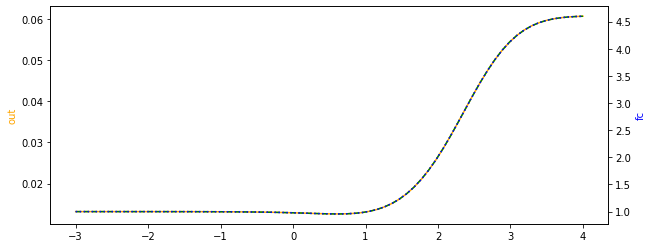

5.406066526948026,284.58782897756646,1.3682305876910157,10000.0,1.69983942585832,10000.0,1.0,123.16425184529004,644.887951060953,836.3904620138569,630.9079351980838,0.13653002133180292,94.96704481622106
down_up


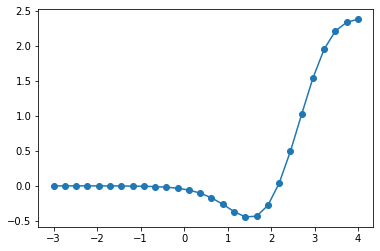

[('kb', 5.406066526948026), ('k_1_0', 1.3682305876910157), ('kr_1_0', 123.16425184529004), ('kb', 5.406066526948026), ('k_2_0', 10000.0), ('kr_2_0', 644.887951060953), ('kb', 5.406066526948026), ('k_3_0', 1.69983942585832), ('kr_3_0', 836.3904620138569), ('kb', 5.406066526948026), ('k_4_0', 10000.0), ('kr_4_0', 630.9079351980838), ('kb', 5.406066526948026), ('k_5_0', 1.0), ('ku', 284.58782897756646), ('k_1_1', 1.3682305876910157), ('kr_1_1', 123.16425184529004), ('ku', 284.58782897756646), ('k_2_1', 1365.3002133180291), ('kr_2_1', 644.887951060953), ('ku', 284.58782897756646), ('k_3_1', 1.69983942585832), ('kr_3_1', 836.3904620138569), ('ku', 284.58782897756646), ('k_4_1', 949670.4481622106), ('kr_4_1', 630.9079351980838), ('ku', 284.58782897756646), ('k_5_1', 1.0)]
a parameter is out of bounds! [949670.44816221]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

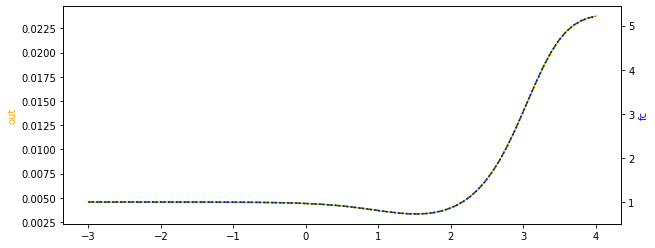

53.88209455590287,240.49920130629633,1.0,10000.0,2.5711927608625507,7958.7851138009255,1.0,255.79475605765063,223.93574143949908,836.3904620138569,630.9079351980838,0.13653002133180292,100.0
down_up


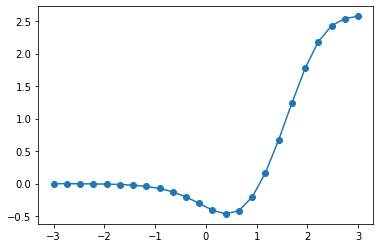

[('kb', 53.88209455590287), ('k_1_0', 1.0), ('kr_1_0', 255.79475605765063), ('kb', 53.88209455590287), ('k_2_0', 10000.0), ('kr_2_0', 223.93574143949908), ('kb', 53.88209455590287), ('k_3_0', 2.5711927608625507), ('kr_3_0', 836.3904620138569), ('kb', 53.88209455590287), ('k_4_0', 7958.7851138009255), ('kr_4_0', 630.9079351980838), ('kb', 53.88209455590287), ('k_5_0', 1.0), ('ku', 240.49920130629633), ('k_1_1', 1.0), ('kr_1_1', 255.79475605765063), ('ku', 240.49920130629633), ('k_2_1', 1365.3002133180291), ('kr_2_1', 223.93574143949908), ('ku', 240.49920130629633), ('k_3_1', 2.5711927608625507), ('kr_3_1', 836.3904620138569), ('ku', 240.49920130629633), ('k_4_1', 795878.5113800926), ('kr_4_1', 630.9079351980838), ('ku', 240.49920130629633), ('k_5_1', 1.0)]
a parameter is out of bounds! [795878.51138009]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

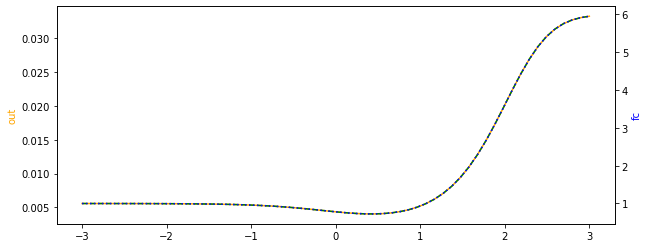

5.273926872654724,213.16400731118716,1.0,10000.0,2.4523290644639735,6561.646032265713,1.0,226.71964697661943,485.4183138900146,836.3904620138569,760.633646915148,0.13653002133180292,92.0643829292923
down_up


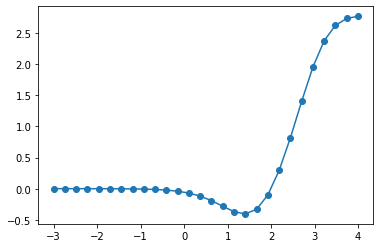

[('kb', 5.273926872654724), ('k_1_0', 1.0), ('kr_1_0', 226.71964697661943), ('kb', 5.273926872654724), ('k_2_0', 10000.0), ('kr_2_0', 485.4183138900146), ('kb', 5.273926872654724), ('k_3_0', 2.4523290644639735), ('kr_3_0', 836.3904620138569), ('kb', 5.273926872654724), ('k_4_0', 6561.646032265713), ('kr_4_0', 760.633646915148), ('kb', 5.273926872654724), ('k_5_0', 1.0), ('ku', 213.16400731118716), ('k_1_1', 1.0), ('kr_1_1', 226.71964697661943), ('ku', 213.16400731118716), ('k_2_1', 1365.3002133180291), ('kr_2_1', 485.4183138900146), ('ku', 213.16400731118716), ('k_3_1', 2.4523290644639735), ('kr_3_1', 836.3904620138569), ('ku', 213.16400731118716), ('k_4_1', 604093.892960982), ('kr_4_1', 760.633646915148), ('ku', 213.16400731118716), ('k_5_1', 1.0)]
a parameter is out of bounds! [604093.89296098]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

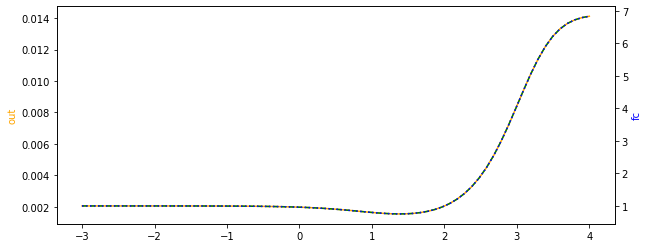

5.991321843154302,213.16400731118716,1.0,7510.990747355476,1.0,6437.479476120005,1.0,169.16976073249887,593.0581824320282,1079.0537458718202,760.633646915148,0.13653002133180292,92.0643829292923
down_up


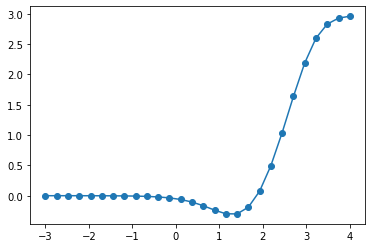

[('kb', 5.991321843154302), ('k_1_0', 1.0), ('kr_1_0', 169.16976073249887), ('kb', 5.991321843154302), ('k_2_0', 7510.990747355476), ('kr_2_0', 593.0581824320282), ('kb', 5.991321843154302), ('k_3_0', 1.0), ('kr_3_0', 1079.0537458718202), ('kb', 5.991321843154302), ('k_4_0', 6437.479476120005), ('kr_4_0', 760.633646915148), ('kb', 5.991321843154302), ('k_5_0', 1.0), ('ku', 213.16400731118716), ('k_1_1', 1.0), ('kr_1_1', 169.16976073249887), ('ku', 213.16400731118716), ('k_2_1', 1025.4757269594174), ('kr_2_1', 593.0581824320282), ('ku', 213.16400731118716), ('k_3_1', 1.0), ('kr_3_1', 1079.0537458718202), ('ku', 213.16400731118716), ('k_4_1', 592662.5755889721), ('kr_4_1', 760.633646915148), ('ku', 213.16400731118716), ('k_5_1', 1.0)]
a parameter is out of bounds! [592662.57558897]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

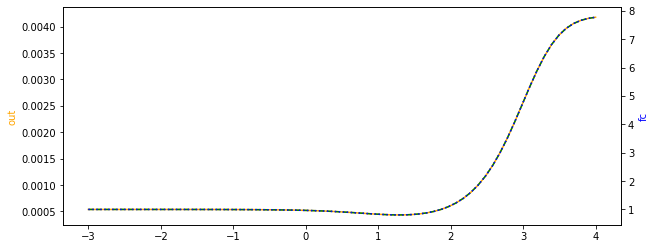

6.5320364957313775,140.7162732305398,1.6332666480351001,8664.189659061196,1.2335791481440843,6437.479476120005,1.0,340.39859199131996,593.0581824320282,973.2035892628744,1036.0300976723488,0.13653002133180292,100.0
down_up


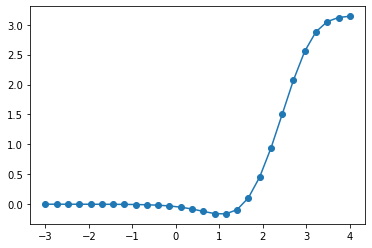

[('kb', 6.5320364957313775), ('k_1_0', 1.6332666480351001), ('kr_1_0', 340.39859199131996), ('kb', 6.5320364957313775), ('k_2_0', 8664.189659061196), ('kr_2_0', 593.0581824320282), ('kb', 6.5320364957313775), ('k_3_0', 1.2335791481440843), ('kr_3_0', 973.2035892628744), ('kb', 6.5320364957313775), ('k_4_0', 6437.479476120005), ('kr_4_0', 1036.0300976723488), ('kb', 6.5320364957313775), ('k_5_0', 1.0), ('ku', 140.7162732305398), ('k_1_1', 1.6332666480351001), ('kr_1_1', 340.39859199131996), ('ku', 140.7162732305398), ('k_2_1', 1182.9219989744113), ('kr_2_1', 593.0581824320282), ('ku', 140.7162732305398), ('k_3_1', 1.2335791481440843), ('kr_3_1', 973.2035892628744), ('ku', 140.7162732305398), ('k_4_1', 643747.9476120005), ('kr_4_1', 1036.0300976723488), ('ku', 140.7162732305398), ('k_5_1', 1.0)]
a parameter is out of bounds! [643747.947612]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

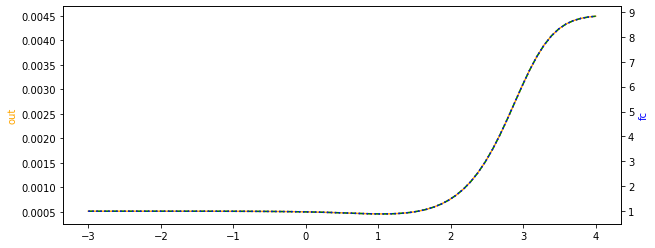

165.1441068680797,410.99934346382315,1.0,9463.840405417597,7.978049150763248,10000.0,1.0,384.8941073137116,456.27999344530224,1197.6945325315685,1102.1154788084523,0.21261754684216316,74.73956131152656
down_up


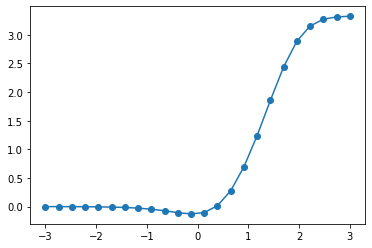

[('kb', 165.1441068680797), ('k_1_0', 1.0), ('kr_1_0', 384.8941073137116), ('kb', 165.1441068680797), ('k_2_0', 9463.840405417597), ('kr_2_0', 456.27999344530224), ('kb', 165.1441068680797), ('k_3_0', 7.978049150763248), ('kr_3_0', 1197.6945325315685), ('kb', 165.1441068680797), ('k_4_0', 10000.0), ('kr_4_0', 1102.1154788084523), ('kb', 165.1441068680797), ('k_5_0', 1.0), ('ku', 410.99934346382315), ('k_1_1', 1.0), ('kr_1_1', 384.8941073137116), ('ku', 410.99934346382315), ('k_2_1', 2012.1785307056323), ('kr_2_1', 456.27999344530224), ('ku', 410.99934346382315), ('k_3_1', 7.978049150763248), ('kr_3_1', 1197.6945325315685), ('ku', 410.99934346382315), ('k_4_1', 747395.6131152656), ('kr_4_1', 1102.1154788084523), ('ku', 410.99934346382315), ('k_5_1', 1.0)]
a parameter is out of bounds! [747395.61311527]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

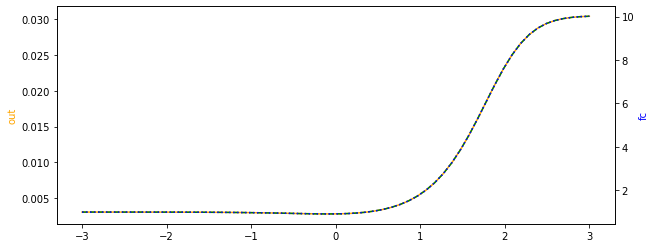

165.1441068680797,410.99934346382315,1.0,10000.0,4.057543963907262,10000.0,1.0,384.8941073137116,456.27999344530224,1197.6945325315685,1102.1154788084523,0.19860815194928724,100.0
down_up


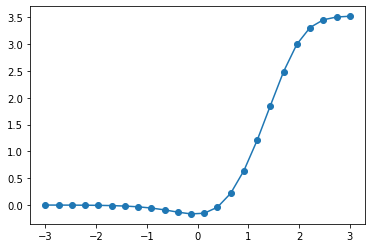

[('kb', 165.1441068680797), ('k_1_0', 1.0), ('kr_1_0', 384.8941073137116), ('kb', 165.1441068680797), ('k_2_0', 10000.0), ('kr_2_0', 456.27999344530224), ('kb', 165.1441068680797), ('k_3_0', 4.057543963907262), ('kr_3_0', 1197.6945325315685), ('kb', 165.1441068680797), ('k_4_0', 10000.0), ('kr_4_0', 1102.1154788084523), ('kb', 165.1441068680797), ('k_5_0', 1.0), ('ku', 410.99934346382315), ('k_1_1', 1.0), ('kr_1_1', 384.8941073137116), ('ku', 410.99934346382315), ('k_2_1', 1986.0815194928725), ('kr_2_1', 456.27999344530224), ('ku', 410.99934346382315), ('k_3_1', 4.057543963907262), ('kr_3_1', 1197.6945325315685), ('ku', 410.99934346382315), ('k_4_1', 1000000.0), ('kr_4_1', 1102.1154788084523), ('ku', 410.99934346382315), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

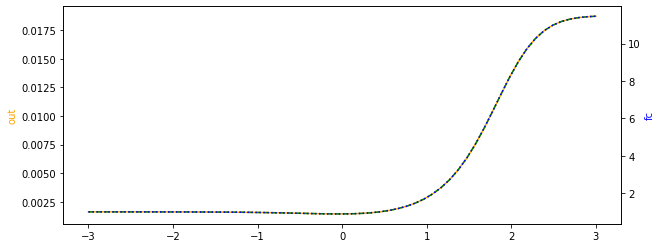

207.26496999183766,661.176637962529,1.0,10000.0,1.517286003292167,10000.0,1.0,430.26766088480025,291.9004517195764,1126.451637493709,1784.5132631857286,0.1988303739007441,100.0
down_up


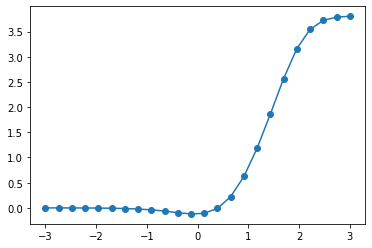

[('kb', 207.26496999183766), ('k_1_0', 1.0), ('kr_1_0', 430.26766088480025), ('kb', 207.26496999183766), ('k_2_0', 10000.0), ('kr_2_0', 291.9004517195764), ('kb', 207.26496999183766), ('k_3_0', 1.517286003292167), ('kr_3_0', 1126.451637493709), ('kb', 207.26496999183766), ('k_4_0', 10000.0), ('kr_4_0', 1784.5132631857286), ('kb', 207.26496999183766), ('k_5_0', 1.0), ('ku', 661.176637962529), ('k_1_1', 1.0), ('kr_1_1', 430.26766088480025), ('ku', 661.176637962529), ('k_2_1', 1988.303739007441), ('kr_2_1', 291.9004517195764), ('ku', 661.176637962529), ('k_3_1', 1.517286003292167), ('kr_3_1', 1126.451637493709), ('ku', 661.176637962529), ('k_4_1', 1000000.0), ('kr_4_1', 1784.5132631857286), ('ku', 661.176637962529), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

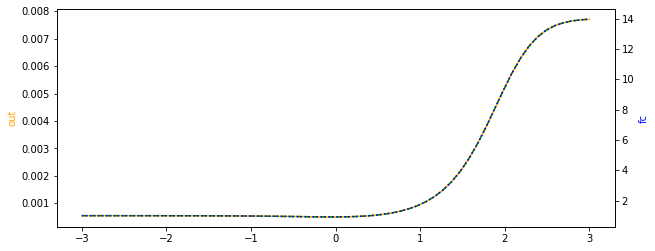

1.0,1.0,1.0,10000.0,1.0,10000.0,1.0,326.0944059034188,149.99855880588584,305.1220897270438,703.0810405112918,0.01,100.0
down_up


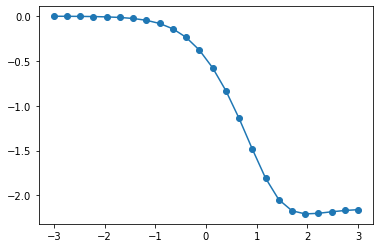

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 326.0944059034188), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 149.99855880588584), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 305.1220897270438), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 703.0810405112918), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 326.0944059034188), ('ku', 1.0), ('k_2_1', 100.0), ('kr_2_1', 149.99855880588584), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 305.1220897270438), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 703.0810405112918), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

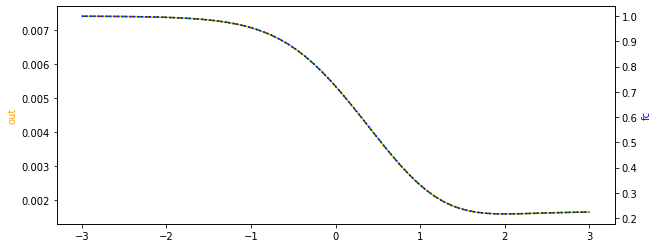

1.0,3.5147296803971466,1.5269176683593626,10000.0,1.8580862455136369,10000.0,1.1328885921828844,301.53512061441836,140.40098977613326,305.1220897270438,414.800942481308,0.016962157087349945,100.0
down_up


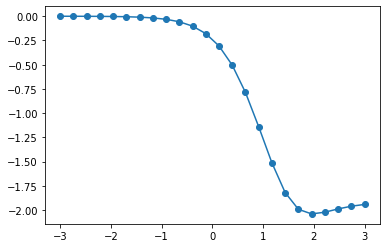

[('kb', 1.0), ('k_1_0', 1.5269176683593626), ('kr_1_0', 301.53512061441836), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 140.40098977613326), ('kb', 1.0), ('k_3_0', 1.8580862455136369), ('kr_3_0', 305.1220897270438), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 414.800942481308), ('kb', 1.0), ('k_5_0', 1.1328885921828844), ('ku', 3.5147296803971466), ('k_1_1', 1.5269176683593626), ('kr_1_1', 301.53512061441836), ('ku', 3.5147296803971466), ('k_2_1', 169.62157087349945), ('kr_2_1', 140.40098977613326), ('ku', 3.5147296803971466), ('k_3_1', 1.8580862455136369), ('kr_3_1', 305.1220897270438), ('ku', 3.5147296803971466), ('k_4_1', 1000000.0), ('kr_4_1', 414.800942481308), ('ku', 3.5147296803971466), ('k_5_1', 1.1328885921828844)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

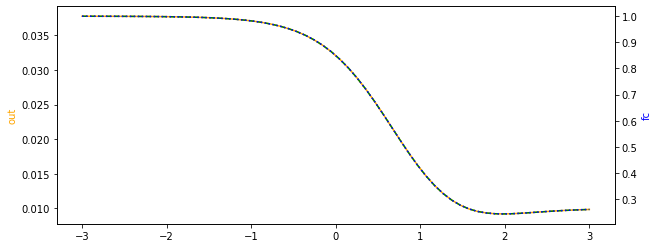

1.0,1.0,1.0,10000.0,1.0,10000.0,1.1328885921828844,301.53512061441836,66.3079239626602,305.1220897270438,414.800942481308,0.04393207029233487,6.66855053137827
down_up


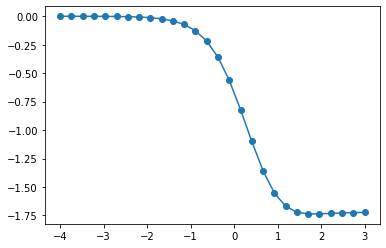

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 301.53512061441836), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 66.3079239626602), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 305.1220897270438), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 414.800942481308), ('kb', 1.0), ('k_5_0', 1.1328885921828844), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 301.53512061441836), ('ku', 1.0), ('k_2_1', 439.3207029233487), ('kr_2_1', 66.3079239626602), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 305.1220897270438), ('ku', 1.0), ('k_4_1', 66685.5053137827), ('kr_4_1', 414.800942481308), ('ku', 1.0), ('k_5_1', 1.1328885921828844)]
a parameter is out of bounds! [66685.50531378]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

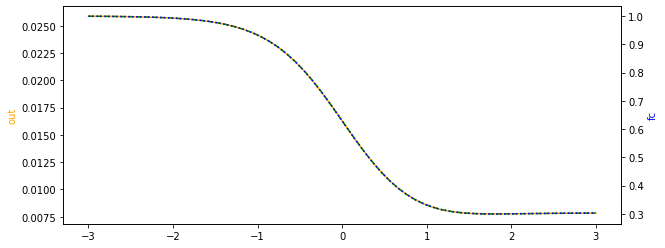

1.0,1.0,1.0,10000.0,1.0,10000.0,23.87291133876968,157.53077213876705,452.17796887461947,4799.605665235511,399.1377158677756,0.034805535644717826,100.0
down_up


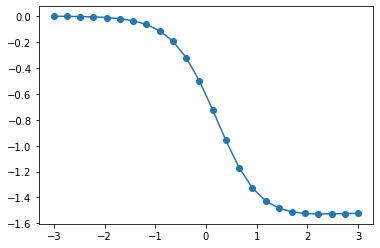

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 157.53077213876705), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 452.17796887461947), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 4799.605665235511), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 399.1377158677756), ('kb', 1.0), ('k_5_0', 23.87291133876968), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 157.53077213876705), ('ku', 1.0), ('k_2_1', 348.05535644717827), ('kr_2_1', 452.17796887461947), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 4799.605665235511), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 399.1377158677756), ('ku', 1.0), ('k_5_1', 23.87291133876968)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

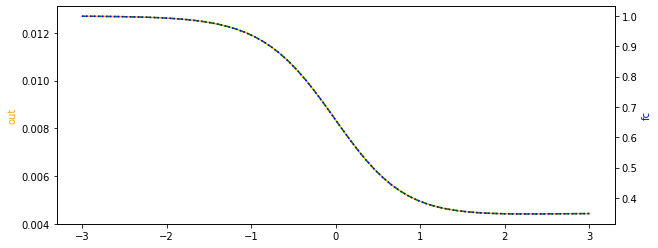

1.0,1.0,1.0,10000.0,1.0,10000.0,23.87291133876968,70.46087928109938,331.087892794426,5365.960656504364,228.50719440401488,0.04393207029233487,83.7431203974911
down_up


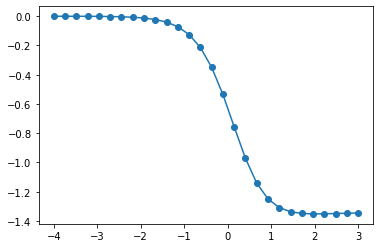

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 70.46087928109938), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 331.087892794426), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 5365.960656504364), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 228.50719440401488), ('kb', 1.0), ('k_5_0', 23.87291133876968), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 70.46087928109938), ('ku', 1.0), ('k_2_1', 439.3207029233487), ('kr_2_1', 331.087892794426), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 5365.960656504364), ('ku', 1.0), ('k_4_1', 837431.203974911), ('kr_4_1', 228.50719440401488), ('ku', 1.0), ('k_5_1', 23.87291133876968)]
a parameter is out of bounds! [837431.20397491]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

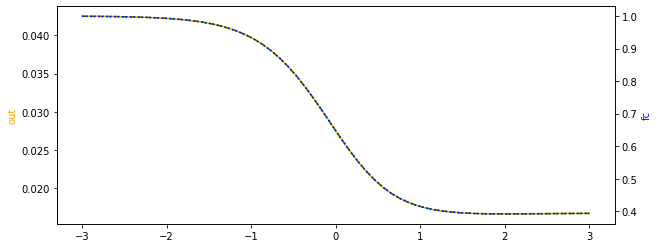

1.0,17.5761105718375,1.0,10000.0,1.0,10000.0,1.0,99.7057773616258,290.04704176338123,10000.0,7.318388511362254,0.04393207029233487,36.80996222979898
down_up


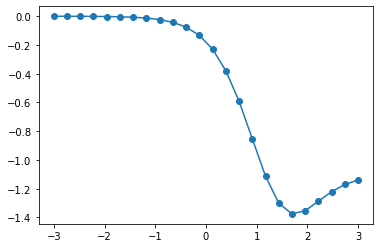

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 99.7057773616258), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 290.04704176338123), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 10000.0), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 7.318388511362254), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 17.5761105718375), ('k_1_1', 1.0), ('kr_1_1', 99.7057773616258), ('ku', 17.5761105718375), ('k_2_1', 439.3207029233487), ('kr_2_1', 290.04704176338123), ('ku', 17.5761105718375), ('k_3_1', 1.0), ('kr_3_1', 10000.0), ('ku', 17.5761105718375), ('k_4_1', 368099.6222979898), ('kr_4_1', 7.318388511362254), ('ku', 17.5761105718375), ('k_5_1', 1.0)]
a parameter is out of bounds! [368099.62229799]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

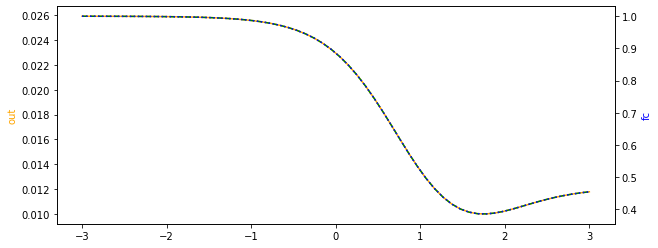

3.117943960250247,3.950316279973446,1.0,10000.0,1.0,10000.0,1.0,232.82211439263924,206.62721075792444,132.5059934421662,703.0810405112918,0.04393207029233487,100.0
down_up


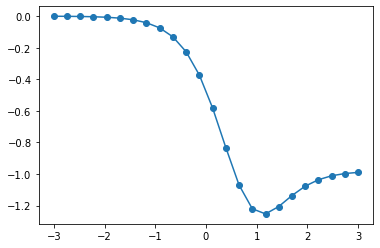

[('kb', 3.117943960250247), ('k_1_0', 1.0), ('kr_1_0', 232.82211439263924), ('kb', 3.117943960250247), ('k_2_0', 10000.0), ('kr_2_0', 206.62721075792444), ('kb', 3.117943960250247), ('k_3_0', 1.0), ('kr_3_0', 132.5059934421662), ('kb', 3.117943960250247), ('k_4_0', 10000.0), ('kr_4_0', 703.0810405112918), ('kb', 3.117943960250247), ('k_5_0', 1.0), ('ku', 3.950316279973446), ('k_1_1', 1.0), ('kr_1_1', 232.82211439263924), ('ku', 3.950316279973446), ('k_2_1', 439.3207029233487), ('kr_2_1', 206.62721075792444), ('ku', 3.950316279973446), ('k_3_1', 1.0), ('kr_3_1', 132.5059934421662), ('ku', 3.950316279973446), ('k_4_1', 1000000.0), ('kr_4_1', 703.0810405112918), ('ku', 3.950316279973446), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

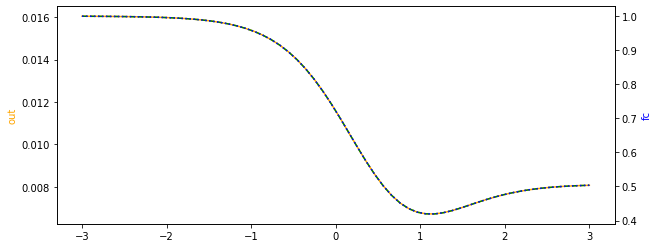

2.3021672017984023,1.0,1.0,10000.0,1.0,10000.0,1.0,165.42744715312074,94.75427217661168,169.39150121532435,703.0810405112918,0.04393207029233487,17.31327325531412
down_up


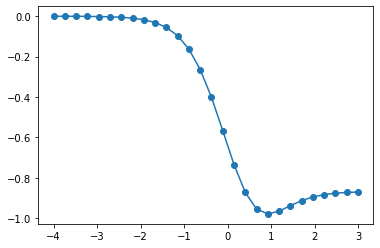

[('kb', 2.3021672017984023), ('k_1_0', 1.0), ('kr_1_0', 165.42744715312074), ('kb', 2.3021672017984023), ('k_2_0', 10000.0), ('kr_2_0', 94.75427217661168), ('kb', 2.3021672017984023), ('k_3_0', 1.0), ('kr_3_0', 169.39150121532435), ('kb', 2.3021672017984023), ('k_4_0', 10000.0), ('kr_4_0', 703.0810405112918), ('kb', 2.3021672017984023), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 165.42744715312074), ('ku', 1.0), ('k_2_1', 439.3207029233487), ('kr_2_1', 94.75427217661168), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 169.39150121532435), ('ku', 1.0), ('k_4_1', 173132.7325531412), ('kr_4_1', 703.0810405112918), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [173132.73255314]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

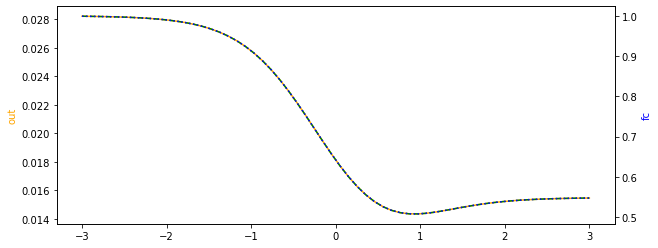

1.0,1.0,1.0,7993.615698771796,39.40457015886714,8782.56426560058,48.75956334966736,99.7057773616258,295.4144560880053,3967.0073381578563,399.1377158677756,0.06930557713495862,37.30580470061384
down_up


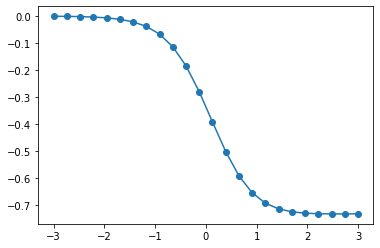

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 99.7057773616258), ('kb', 1.0), ('k_2_0', 7993.615698771796), ('kr_2_0', 295.4144560880053), ('kb', 1.0), ('k_3_0', 39.40457015886714), ('kr_3_0', 3967.0073381578563), ('kb', 1.0), ('k_4_0', 8782.56426560058), ('kr_4_0', 399.1377158677756), ('kb', 1.0), ('k_5_0', 48.75956334966736), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 99.7057773616258), ('ku', 1.0), ('k_2_1', 554.0021493984449), ('kr_2_1', 295.4144560880053), ('ku', 1.0), ('k_3_1', 39.40457015886714), ('kr_3_1', 3967.0073381578563), ('ku', 1.0), ('k_4_1', 327640.6272630853), ('kr_4_1', 399.1377158677756), ('ku', 1.0), ('k_5_1', 48.75956334966736)]
a parameter is out of bounds! [327640.62726309]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

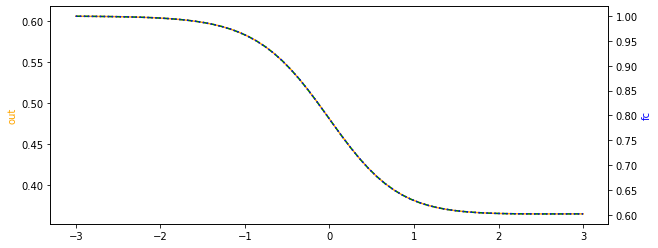

1.0,1.0,1.0,10000.0,1.0,10000.0,1.0,98.72828883942756,260.48246292703516,272.2915249790973,414.800942481308,0.04393207029233487,100.0
down_up


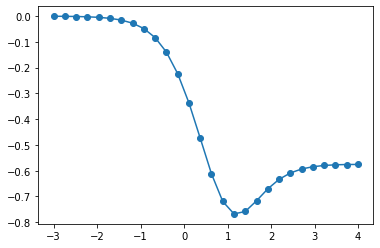

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 98.72828883942756), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 260.48246292703516), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 272.2915249790973), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 414.800942481308), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 98.72828883942756), ('ku', 1.0), ('k_2_1', 439.3207029233487), ('kr_2_1', 260.48246292703516), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 272.2915249790973), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 414.800942481308), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

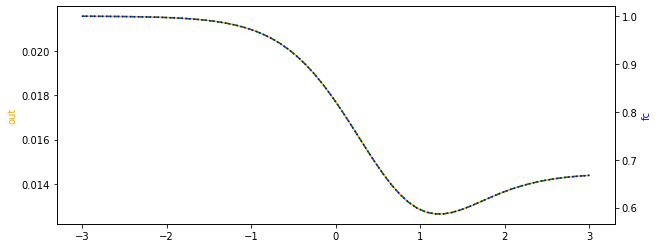

1.0,1.0,1.0,10000.0,7.054833285897133,10000.0,10.73429149385694,180.16915079038853,336.0325457413256,1031.5257972893041,228.50719440401488,0.19971384250361462,27.974238078972874
down_up


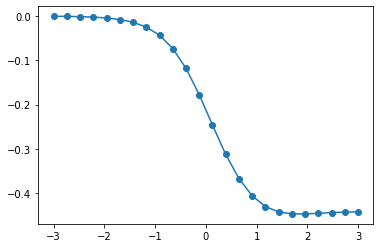

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 180.16915079038853), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 336.0325457413256), ('kb', 1.0), ('k_3_0', 7.054833285897133), ('kr_3_0', 1031.5257972893041), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 228.50719440401488), ('kb', 1.0), ('k_5_0', 10.73429149385694), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 180.16915079038853), ('ku', 1.0), ('k_2_1', 1997.1384250361461), ('kr_2_1', 336.0325457413256), ('ku', 1.0), ('k_3_1', 7.054833285897133), ('kr_3_1', 1031.5257972893041), ('ku', 1.0), ('k_4_1', 279742.3807897287), ('kr_4_1', 228.50719440401488), ('ku', 1.0), ('k_5_1', 10.73429149385694)]
a parameter is out of bounds! [279742.38078973]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

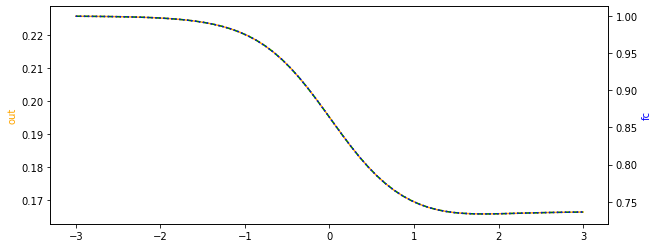

1.0,1.0,1.0,9670.83449554681,64.79735798411255,10000.0,23.87291133876968,99.7057773616258,290.04704176338123,5452.914337522596,703.0810405112918,0.04093961910150392,98.48395386432742
down_up


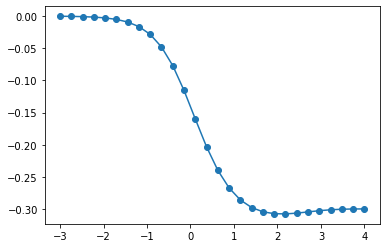

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 99.7057773616258), ('kb', 1.0), ('k_2_0', 9670.83449554681), ('kr_2_0', 290.04704176338123), ('kb', 1.0), ('k_3_0', 64.79735798411255), ('kr_3_0', 5452.914337522596), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 703.0810405112918), ('kb', 1.0), ('k_5_0', 23.87291133876968), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 99.7057773616258), ('ku', 1.0), ('k_2_1', 395.92028064137116), ('kr_2_1', 290.04704176338123), ('ku', 1.0), ('k_3_1', 64.79735798411255), ('kr_3_1', 5452.914337522596), ('ku', 1.0), ('k_4_1', 984839.5386432742), ('kr_4_1', 703.0810405112918), ('ku', 1.0), ('k_5_1', 23.87291133876968)]
a parameter is out of bounds! [984839.53864327]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

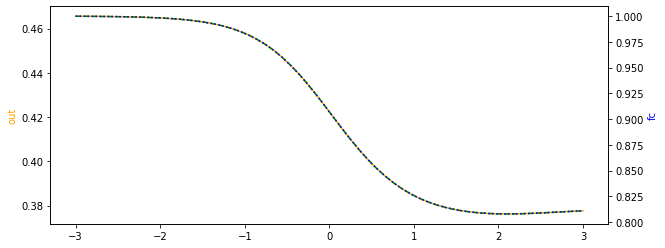

1.0,1.0,1.0,10000.0,2.15481395982941,10000.0,1.5711477898560653,193.19423253788162,206.62721075792444,132.5059934421662,2151.299263862009,0.04639833758269153,100.0
down_up


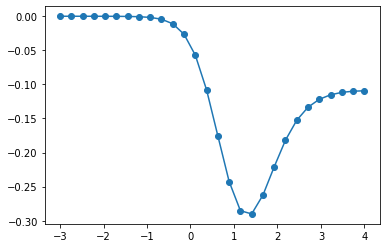

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 193.19423253788162), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 206.62721075792444), ('kb', 1.0), ('k_3_0', 2.15481395982941), ('kr_3_0', 132.5059934421662), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 2151.299263862009), ('kb', 1.0), ('k_5_0', 1.5711477898560653), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 193.19423253788162), ('ku', 1.0), ('k_2_1', 463.98337582691533), ('kr_2_1', 206.62721075792444), ('ku', 1.0), ('k_3_1', 2.15481395982941), ('kr_3_1', 132.5059934421662), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 2151.299263862009), ('ku', 1.0), ('k_5_1', 1.5711477898560653)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

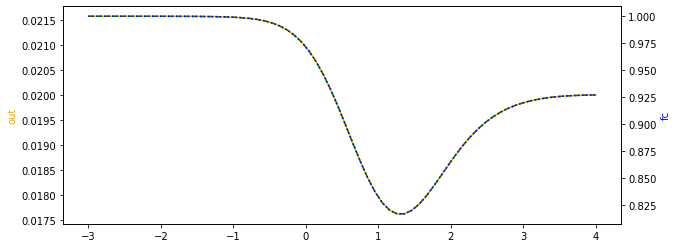

3.117943960250247,4.76529349831424,1.0,10000.0,1.0,10000.0,1.0,26.07412572547861,206.62721075792444,132.5059934421662,703.0810405112918,0.04393207029233487,100.0
down_up


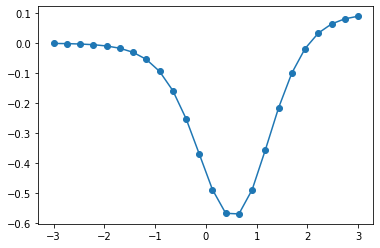

[('kb', 3.117943960250247), ('k_1_0', 1.0), ('kr_1_0', 26.07412572547861), ('kb', 3.117943960250247), ('k_2_0', 10000.0), ('kr_2_0', 206.62721075792444), ('kb', 3.117943960250247), ('k_3_0', 1.0), ('kr_3_0', 132.5059934421662), ('kb', 3.117943960250247), ('k_4_0', 10000.0), ('kr_4_0', 703.0810405112918), ('kb', 3.117943960250247), ('k_5_0', 1.0), ('ku', 4.76529349831424), ('k_1_1', 1.0), ('kr_1_1', 26.07412572547861), ('ku', 4.76529349831424), ('k_2_1', 439.3207029233487), ('kr_2_1', 206.62721075792444), ('ku', 4.76529349831424), ('k_3_1', 1.0), ('kr_3_1', 132.5059934421662), ('ku', 4.76529349831424), ('k_4_1', 1000000.0), ('kr_4_1', 703.0810405112918), ('ku', 4.76529349831424), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

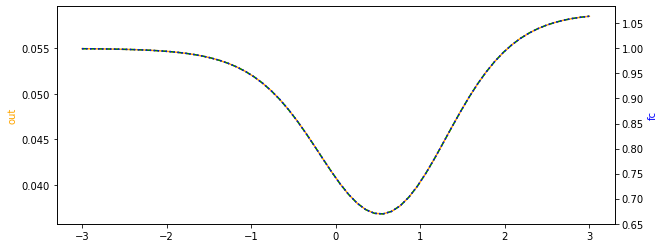

1.0,43.1153584414284,1.0,10000.0,5.449346957217114,10000.0,1.1071281648611804,123.51803330811667,528.2148524742911,661.3021933233858,551.2938322975992,0.04393207029233487,100.0
down_up


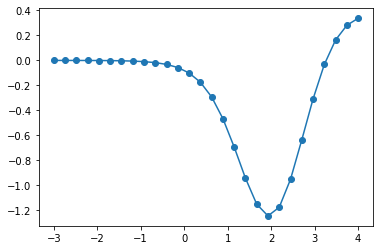

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 123.51803330811667), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 528.2148524742911), ('kb', 1.0), ('k_3_0', 5.449346957217114), ('kr_3_0', 661.3021933233858), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 551.2938322975992), ('kb', 1.0), ('k_5_0', 1.1071281648611804), ('ku', 43.1153584414284), ('k_1_1', 1.0), ('kr_1_1', 123.51803330811667), ('ku', 43.1153584414284), ('k_2_1', 439.3207029233487), ('kr_2_1', 528.2148524742911), ('ku', 43.1153584414284), ('k_3_1', 5.449346957217114), ('kr_3_1', 661.3021933233858), ('ku', 43.1153584414284), ('k_4_1', 1000000.0), ('kr_4_1', 551.2938322975992), ('ku', 43.1153584414284), ('k_5_1', 1.1071281648611804)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

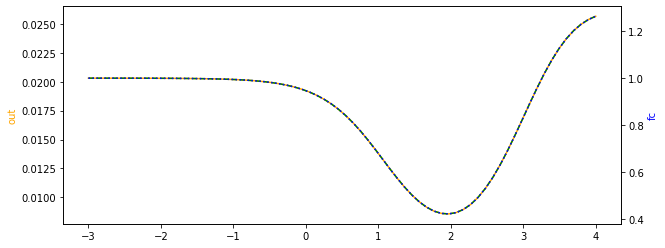

1.0,103.51199671874949,1.0,10000.0,1.521349793750162,10000.0,1.1071281648611804,50.15916043045359,654.5870244480145,661.3021933233858,551.2938322975992,0.04393207029233487,100.0
down_up


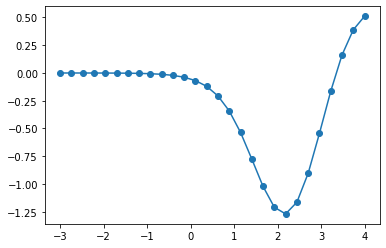

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 50.15916043045359), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 654.5870244480145), ('kb', 1.0), ('k_3_0', 1.521349793750162), ('kr_3_0', 661.3021933233858), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 551.2938322975992), ('kb', 1.0), ('k_5_0', 1.1071281648611804), ('ku', 103.51199671874949), ('k_1_1', 1.0), ('kr_1_1', 50.15916043045359), ('ku', 103.51199671874949), ('k_2_1', 439.3207029233487), ('kr_2_1', 654.5870244480145), ('ku', 103.51199671874949), ('k_3_1', 1.521349793750162), ('kr_3_1', 661.3021933233858), ('ku', 103.51199671874949), ('k_4_1', 1000000.0), ('kr_4_1', 551.2938322975992), ('ku', 103.51199671874949), ('k_5_1', 1.1071281648611804)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

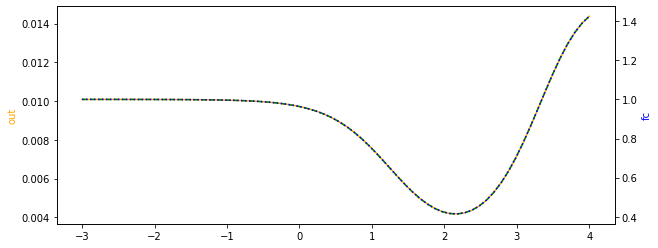

9.635763582124989,112.48288667543407,1.0,10000.0,2.0984448092463888,10000.0,1.0,375.32026968486883,290.04704176338123,10000.0,7.318388511362254,0.20059099725884713,36.80996222979898
down_up


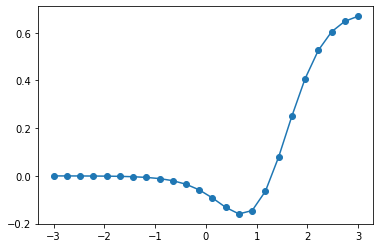

[('kb', 9.635763582124989), ('k_1_0', 1.0), ('kr_1_0', 375.32026968486883), ('kb', 9.635763582124989), ('k_2_0', 10000.0), ('kr_2_0', 290.04704176338123), ('kb', 9.635763582124989), ('k_3_0', 2.0984448092463888), ('kr_3_0', 10000.0), ('kb', 9.635763582124989), ('k_4_0', 10000.0), ('kr_4_0', 7.318388511362254), ('kb', 9.635763582124989), ('k_5_0', 1.0), ('ku', 112.48288667543407), ('k_1_1', 1.0), ('kr_1_1', 375.32026968486883), ('ku', 112.48288667543407), ('k_2_1', 2005.9099725884714), ('kr_2_1', 290.04704176338123), ('ku', 112.48288667543407), ('k_3_1', 2.0984448092463888), ('kr_3_1', 10000.0), ('ku', 112.48288667543407), ('k_4_1', 368099.6222979898), ('kr_4_1', 7.318388511362254), ('ku', 112.48288667543407), ('k_5_1', 1.0)]
a parameter is out of bounds! [368099.62229799]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

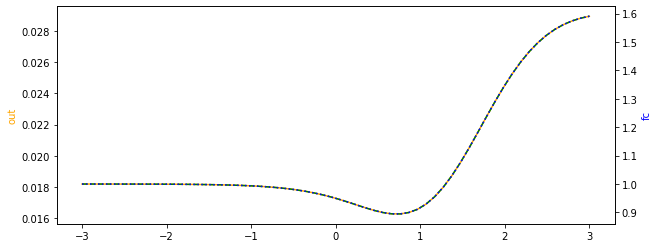

1.0,113.47268017012831,4.4971944565641575,10000.0,1.0,10000.0,1.1071281648611804,78.51549437142766,756.4249626730295,661.3021933233858,551.2938322975992,0.04393207029233487,93.8257521534213
down_up


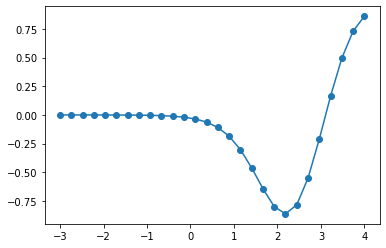

[('kb', 1.0), ('k_1_0', 4.4971944565641575), ('kr_1_0', 78.51549437142766), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 756.4249626730295), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 661.3021933233858), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 551.2938322975992), ('kb', 1.0), ('k_5_0', 1.1071281648611804), ('ku', 113.47268017012831), ('k_1_1', 4.4971944565641575), ('kr_1_1', 78.51549437142766), ('ku', 113.47268017012831), ('k_2_1', 439.3207029233487), ('kr_2_1', 756.4249626730295), ('ku', 113.47268017012831), ('k_3_1', 1.0), ('kr_3_1', 661.3021933233858), ('ku', 113.47268017012831), ('k_4_1', 938257.5215342131), ('kr_4_1', 551.2938322975992), ('ku', 113.47268017012831), ('k_5_1', 1.1071281648611804)]
a parameter is out of bounds! [938257.52153421]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

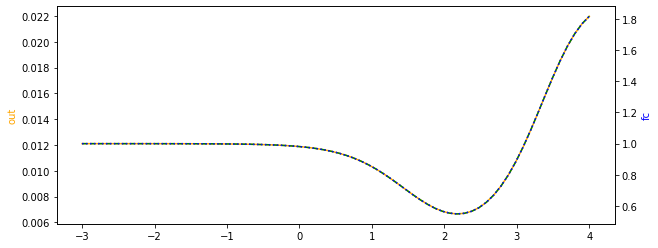

1.0,21.04750069318351,6.6702159687124025,10000.0,1.0,10000.0,1.1071281648611804,78.51549437142766,756.4249626730295,661.3021933233858,551.2938322975992,0.04393207029233487,93.8257521534213
down_up


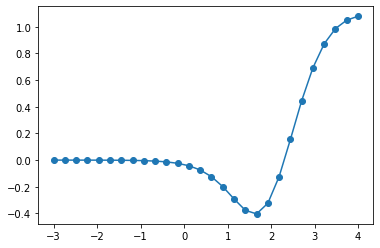

[('kb', 1.0), ('k_1_0', 6.6702159687124025), ('kr_1_0', 78.51549437142766), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 756.4249626730295), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 661.3021933233858), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 551.2938322975992), ('kb', 1.0), ('k_5_0', 1.1071281648611804), ('ku', 21.04750069318351), ('k_1_1', 6.6702159687124025), ('kr_1_1', 78.51549437142766), ('ku', 21.04750069318351), ('k_2_1', 439.3207029233487), ('kr_2_1', 756.4249626730295), ('ku', 21.04750069318351), ('k_3_1', 1.0), ('kr_3_1', 661.3021933233858), ('ku', 21.04750069318351), ('k_4_1', 938257.5215342131), ('kr_4_1', 551.2938322975992), ('ku', 21.04750069318351), ('k_5_1', 1.1071281648611804)]
a parameter is out of bounds! [938257.52153421]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

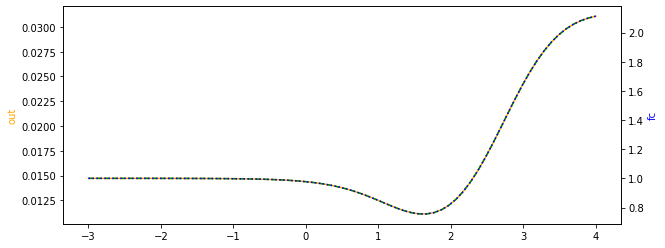

1.995216804047733,26.060059450820894,1.0,10000.0,1.0,10000.0,1.0,72.18776432319578,756.4249626730295,661.3021933233858,1427.9936631763921,0.04393207029233487,100.0
down_up


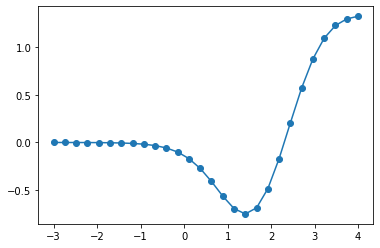

[('kb', 1.995216804047733), ('k_1_0', 1.0), ('kr_1_0', 72.18776432319578), ('kb', 1.995216804047733), ('k_2_0', 10000.0), ('kr_2_0', 756.4249626730295), ('kb', 1.995216804047733), ('k_3_0', 1.0), ('kr_3_0', 661.3021933233858), ('kb', 1.995216804047733), ('k_4_0', 10000.0), ('kr_4_0', 1427.9936631763921), ('kb', 1.995216804047733), ('k_5_0', 1.0), ('ku', 26.060059450820894), ('k_1_1', 1.0), ('kr_1_1', 72.18776432319578), ('ku', 26.060059450820894), ('k_2_1', 439.3207029233487), ('kr_2_1', 756.4249626730295), ('ku', 26.060059450820894), ('k_3_1', 1.0), ('kr_3_1', 661.3021933233858), ('ku', 26.060059450820894), ('k_4_1', 1000000.0), ('kr_4_1', 1427.9936631763921), ('ku', 26.060059450820894), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

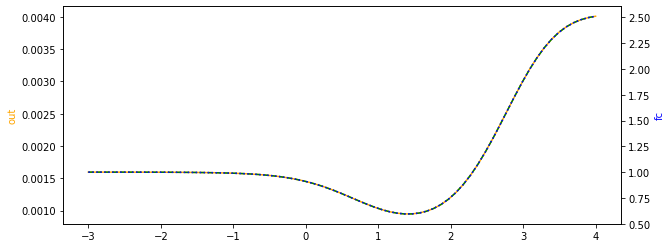

2.017516903778222,32.28628962635844,1.6575165496704147,10000.0,7.193019194272473,10000.0,1.0,42.29303773276018,756.4249626730295,661.3021933233858,1427.9936631763921,0.04393207029233487,100.0
down_up


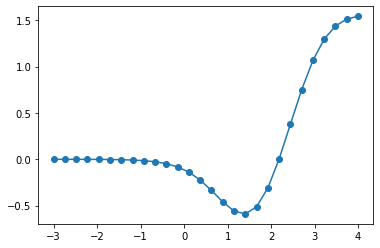

[('kb', 2.017516903778222), ('k_1_0', 1.6575165496704147), ('kr_1_0', 42.29303773276018), ('kb', 2.017516903778222), ('k_2_0', 10000.0), ('kr_2_0', 756.4249626730295), ('kb', 2.017516903778222), ('k_3_0', 7.193019194272473), ('kr_3_0', 661.3021933233858), ('kb', 2.017516903778222), ('k_4_0', 10000.0), ('kr_4_0', 1427.9936631763921), ('kb', 2.017516903778222), ('k_5_0', 1.0), ('ku', 32.28628962635844), ('k_1_1', 1.6575165496704147), ('kr_1_1', 42.29303773276018), ('ku', 32.28628962635844), ('k_2_1', 439.3207029233487), ('kr_2_1', 756.4249626730295), ('ku', 32.28628962635844), ('k_3_1', 7.193019194272473), ('kr_3_1', 661.3021933233858), ('ku', 32.28628962635844), ('k_4_1', 1000000.0), ('kr_4_1', 1427.9936631763921), ('ku', 32.28628962635844), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

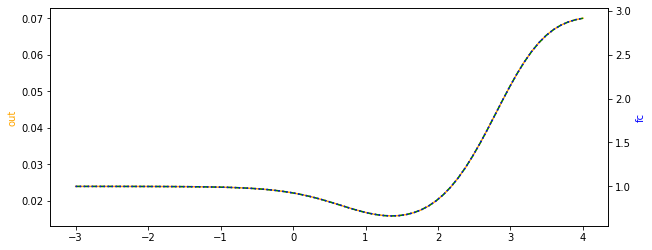

1.995216804047733,78.5375687161678,6.6702159687124025,10000.0,1.0,10000.0,1.1071281648611804,50.58056065164261,1337.7577750890168,661.3021933233858,1427.9936631763921,0.04393207029233487,100.0
down_up


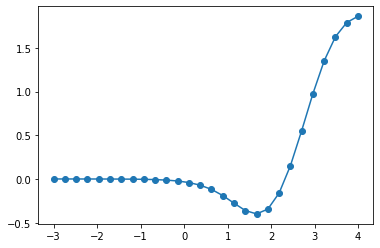

[('kb', 1.995216804047733), ('k_1_0', 6.6702159687124025), ('kr_1_0', 50.58056065164261), ('kb', 1.995216804047733), ('k_2_0', 10000.0), ('kr_2_0', 1337.7577750890168), ('kb', 1.995216804047733), ('k_3_0', 1.0), ('kr_3_0', 661.3021933233858), ('kb', 1.995216804047733), ('k_4_0', 10000.0), ('kr_4_0', 1427.9936631763921), ('kb', 1.995216804047733), ('k_5_0', 1.1071281648611804), ('ku', 78.5375687161678), ('k_1_1', 6.6702159687124025), ('kr_1_1', 50.58056065164261), ('ku', 78.5375687161678), ('k_2_1', 439.3207029233487), ('kr_2_1', 1337.7577750890168), ('ku', 78.5375687161678), ('k_3_1', 1.0), ('kr_3_1', 661.3021933233858), ('ku', 78.5375687161678), ('k_4_1', 1000000.0), ('kr_4_1', 1427.9936631763921), ('ku', 78.5375687161678), ('k_5_1', 1.1071281648611804)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

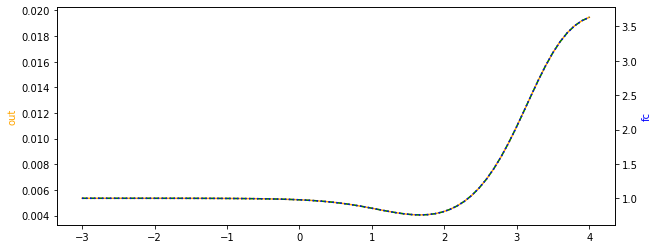

45.01581941376455,90.30322768575608,1.0,10000.0,1.0,10000.0,1.0,79.21199813195727,731.1317021378845,901.8936262310484,551.2938322975992,0.11930862892152247,93.8257521534213
down_up


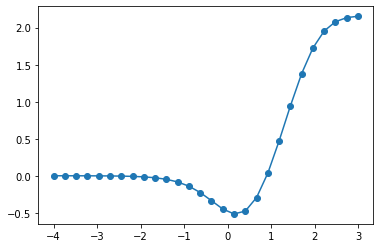

[('kb', 45.01581941376455), ('k_1_0', 1.0), ('kr_1_0', 79.21199813195727), ('kb', 45.01581941376455), ('k_2_0', 10000.0), ('kr_2_0', 731.1317021378845), ('kb', 45.01581941376455), ('k_3_0', 1.0), ('kr_3_0', 901.8936262310484), ('kb', 45.01581941376455), ('k_4_0', 10000.0), ('kr_4_0', 551.2938322975992), ('kb', 45.01581941376455), ('k_5_0', 1.0), ('ku', 90.30322768575608), ('k_1_1', 1.0), ('kr_1_1', 79.21199813195727), ('ku', 90.30322768575608), ('k_2_1', 1193.0862892152247), ('kr_2_1', 731.1317021378845), ('ku', 90.30322768575608), ('k_3_1', 1.0), ('kr_3_1', 901.8936262310484), ('ku', 90.30322768575608), ('k_4_1', 938257.5215342131), ('kr_4_1', 551.2938322975992), ('ku', 90.30322768575608), ('k_5_1', 1.0)]
a parameter is out of bounds! [938257.52153421]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

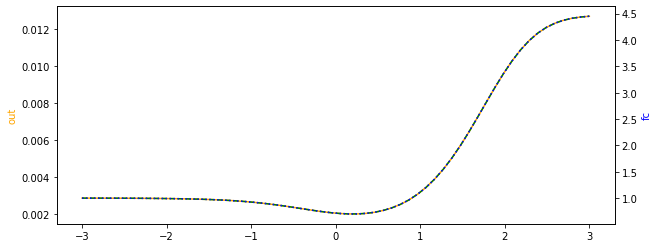

4.4270378383334235,129.6111244607655,1.0,10000.0,1.0,8945.30023825015,1.0,13.656305808834375,1153.7794614788904,661.3021933233858,652.3224615442887,0.11930862892152247,100.0
down_up


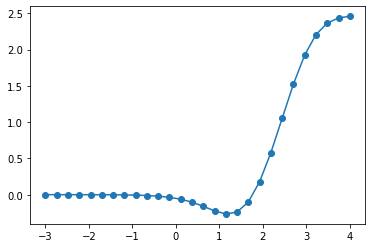

[('kb', 4.4270378383334235), ('k_1_0', 1.0), ('kr_1_0', 13.656305808834375), ('kb', 4.4270378383334235), ('k_2_0', 10000.0), ('kr_2_0', 1153.7794614788904), ('kb', 4.4270378383334235), ('k_3_0', 1.0), ('kr_3_0', 661.3021933233858), ('kb', 4.4270378383334235), ('k_4_0', 8945.30023825015), ('kr_4_0', 652.3224615442887), ('kb', 4.4270378383334235), ('k_5_0', 1.0), ('ku', 129.6111244607655), ('k_1_1', 1.0), ('kr_1_1', 13.656305808834375), ('ku', 129.6111244607655), ('k_2_1', 1193.0862892152247), ('kr_2_1', 1153.7794614788904), ('ku', 129.6111244607655), ('k_3_1', 1.0), ('kr_3_1', 661.3021933233858), ('ku', 129.6111244607655), ('k_4_1', 894530.023825015), ('kr_4_1', 652.3224615442887), ('ku', 129.6111244607655), ('k_5_1', 1.0)]
a parameter is out of bounds! [894530.02382502]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

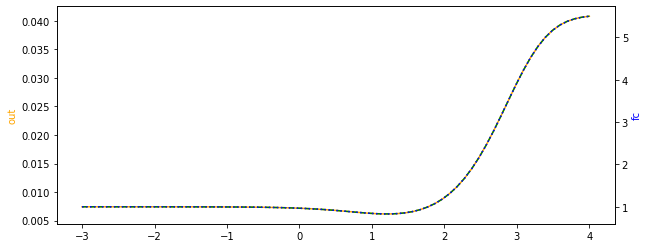

1.0,85.43390906935674,1.0027520969663097,10000.0,1.0,10000.0,1.0,753.4245882283913,48.46790894825868,652.6745086329065,519.8766641406719,0.2258221027328446,100.0
down_up


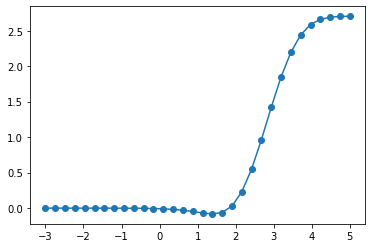

[('kb', 1.0), ('k_1_0', 1.0027520969663097), ('kr_1_0', 753.4245882283913), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 48.46790894825868), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 652.6745086329065), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 519.8766641406719), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 85.43390906935674), ('k_1_1', 1.0027520969663097), ('kr_1_1', 753.4245882283913), ('ku', 85.43390906935674), ('k_2_1', 2258.221027328446), ('kr_2_1', 48.46790894825868), ('ku', 85.43390906935674), ('k_3_1', 1.0), ('kr_3_1', 652.6745086329065), ('ku', 85.43390906935674), ('k_4_1', 1000000.0), ('kr_4_1', 519.8766641406719), ('ku', 85.43390906935674), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

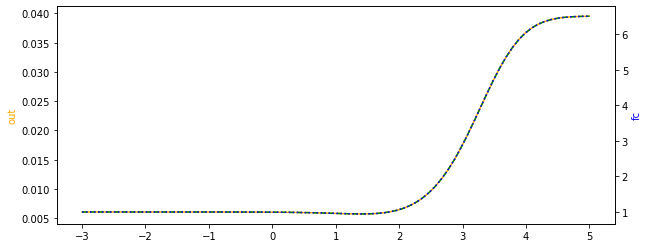

1.0,292.90017739664466,1.5025412379627763,10000.0,1.0,10000.0,1.0,43.15613184050349,867.3452020368402,652.6745086329065,672.8247811203026,0.2258221027328446,100.0
down_up


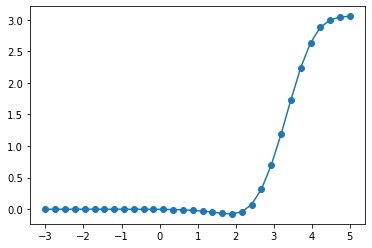

[('kb', 1.0), ('k_1_0', 1.5025412379627763), ('kr_1_0', 43.15613184050349), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 867.3452020368402), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 652.6745086329065), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 672.8247811203026), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 292.90017739664466), ('k_1_1', 1.5025412379627763), ('kr_1_1', 43.15613184050349), ('ku', 292.90017739664466), ('k_2_1', 2258.221027328446), ('kr_2_1', 867.3452020368402), ('ku', 292.90017739664466), ('k_3_1', 1.0), ('kr_3_1', 652.6745086329065), ('ku', 292.90017739664466), ('k_4_1', 1000000.0), ('kr_4_1', 672.8247811203026), ('ku', 292.90017739664466), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

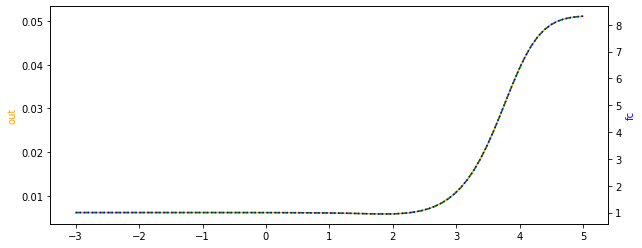

1.4486385133379875,1.0,1.18938307782607,10000.0,1.0,10000.0,1.0,157.21464474354667,566.1619937992647,21.2741629070652,1008.5455571689834,0.09354482137526626,100.0
down_up


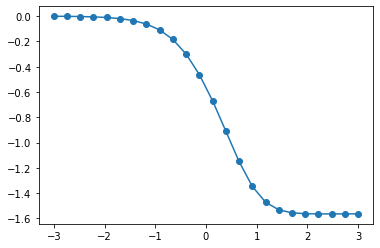

[('kb', 1.4486385133379875), ('k_1_0', 1.18938307782607), ('kr_1_0', 157.21464474354667), ('kb', 1.4486385133379875), ('k_2_0', 10000.0), ('kr_2_0', 566.1619937992647), ('kb', 1.4486385133379875), ('k_3_0', 1.0), ('kr_3_0', 21.2741629070652), ('kb', 1.4486385133379875), ('k_4_0', 10000.0), ('kr_4_0', 1008.5455571689834), ('kb', 1.4486385133379875), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.18938307782607), ('kr_1_1', 157.21464474354667), ('ku', 1.0), ('k_2_1', 935.4482137526626), ('kr_2_1', 566.1619937992647), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 21.2741629070652), ('ku', 1.0), ('k_4_1', 1000000.0), ('kr_4_1', 1008.5455571689834), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

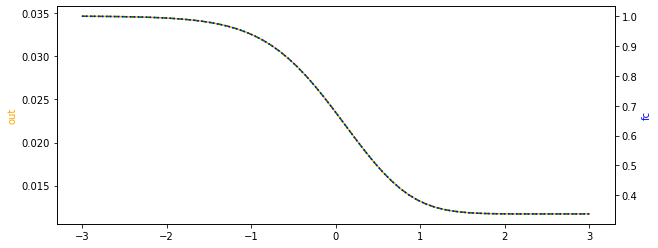

1.613985366397641,1.4828950001037915,1.0,10000.0,1.6996596384981884,10000.0,1.0,815.1967411338165,26.199502267334047,38.15826952844317,1347.7840906494378,0.05906390225431786,66.56759072544787
down_up


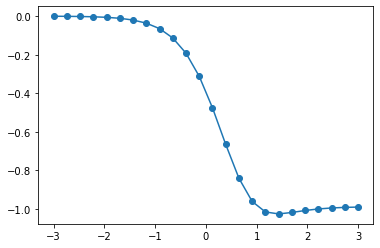

[('kb', 1.613985366397641), ('k_1_0', 1.0), ('kr_1_0', 815.1967411338165), ('kb', 1.613985366397641), ('k_2_0', 10000.0), ('kr_2_0', 26.199502267334047), ('kb', 1.613985366397641), ('k_3_0', 1.6996596384981884), ('kr_3_0', 38.15826952844317), ('kb', 1.613985366397641), ('k_4_0', 10000.0), ('kr_4_0', 1347.7840906494378), ('kb', 1.613985366397641), ('k_5_0', 1.0), ('ku', 1.4828950001037915), ('k_1_1', 1.0), ('kr_1_1', 815.1967411338165), ('ku', 1.4828950001037915), ('k_2_1', 590.6390225431786), ('kr_2_1', 26.199502267334047), ('ku', 1.4828950001037915), ('k_3_1', 1.6996596384981884), ('kr_3_1', 38.15826952844317), ('ku', 1.4828950001037915), ('k_4_1', 665675.9072544787), ('kr_4_1', 1347.7840906494378), ('ku', 1.4828950001037915), ('k_5_1', 1.0)]
a parameter is out of bounds! [665675.90725448]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

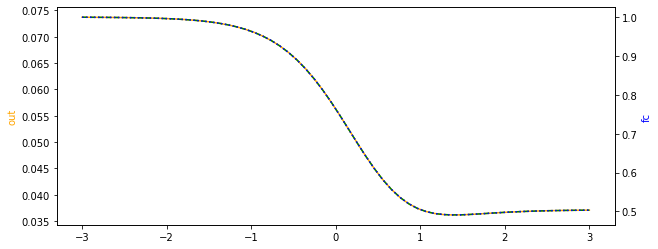

2.774707100214457,7.189200263343211,1.0,10000.0,1.0,10000.0,1.4330599633170191,384.0979858030109,635.5071370333641,2682.7479502562096,58.71915440728958,0.16142060091730703,5.001302220012773
down_up


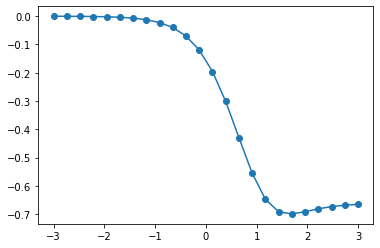

[('kb', 2.774707100214457), ('k_1_0', 1.0), ('kr_1_0', 384.0979858030109), ('kb', 2.774707100214457), ('k_2_0', 10000.0), ('kr_2_0', 635.5071370333641), ('kb', 2.774707100214457), ('k_3_0', 1.0), ('kr_3_0', 2682.7479502562096), ('kb', 2.774707100214457), ('k_4_0', 10000.0), ('kr_4_0', 58.71915440728958), ('kb', 2.774707100214457), ('k_5_0', 1.4330599633170191), ('ku', 7.189200263343211), ('k_1_1', 1.0), ('kr_1_1', 384.0979858030109), ('ku', 7.189200263343211), ('k_2_1', 1614.2060091730702), ('kr_2_1', 635.5071370333641), ('ku', 7.189200263343211), ('k_3_1', 1.0), ('kr_3_1', 2682.7479502562096), ('ku', 7.189200263343211), ('k_4_1', 50013.02220012773), ('kr_4_1', 58.71915440728958), ('ku', 7.189200263343211), ('k_5_1', 1.4330599633170191)]
a parameter is out of bounds! [50013.02220013]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

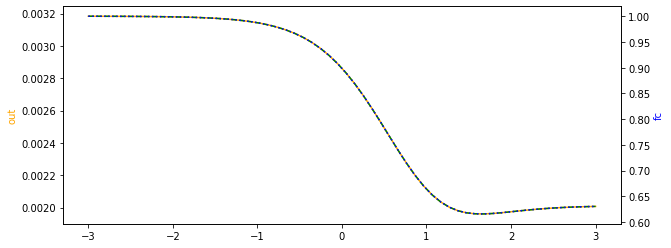

1.0,1.0,2.9561672729984894,10000.0,2.9077447450710494,489.74582972041424,1.0,130.300443660174,707.6419786306607,111.24271256936856,28.582658789903885,0.08098421795352669,100.0
down_up


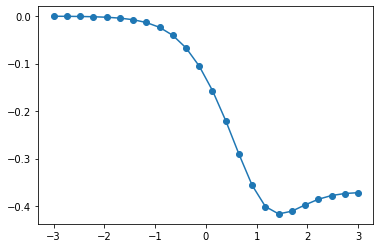

[('kb', 1.0), ('k_1_0', 2.9561672729984894), ('kr_1_0', 130.300443660174), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 707.6419786306607), ('kb', 1.0), ('k_3_0', 2.9077447450710494), ('kr_3_0', 111.24271256936856), ('kb', 1.0), ('k_4_0', 489.74582972041424), ('kr_4_0', 28.582658789903885), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 2.9561672729984894), ('kr_1_1', 130.300443660174), ('ku', 1.0), ('k_2_1', 809.8421795352668), ('kr_2_1', 707.6419786306607), ('ku', 1.0), ('k_3_1', 2.9077447450710494), ('kr_3_1', 111.24271256936856), ('ku', 1.0), ('k_4_1', 48974.582972041426), ('kr_4_1', 28.582658789903885), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [48974.58297204]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

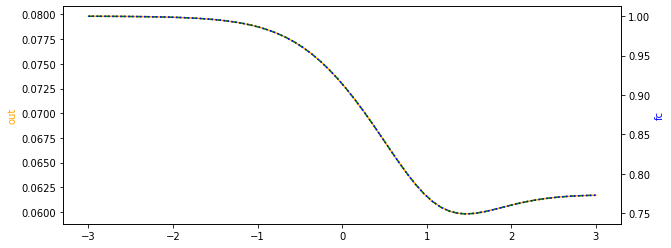

2.774707100214457,1.0,1.0,10000.0,1.0,10000.0,1.0,2.8003650193172502,10000.0,2682.7479502562096,155.18455307691804,0.16142060091730703,5.001302220012773
down_up


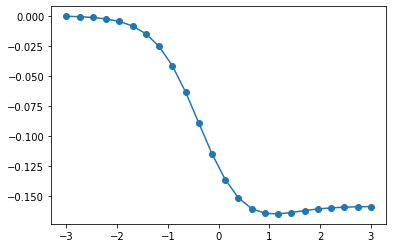

[('kb', 2.774707100214457), ('k_1_0', 1.0), ('kr_1_0', 2.8003650193172502), ('kb', 2.774707100214457), ('k_2_0', 10000.0), ('kr_2_0', 10000.0), ('kb', 2.774707100214457), ('k_3_0', 1.0), ('kr_3_0', 2682.7479502562096), ('kb', 2.774707100214457), ('k_4_0', 10000.0), ('kr_4_0', 155.18455307691804), ('kb', 2.774707100214457), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 2.8003650193172502), ('ku', 1.0), ('k_2_1', 1614.2060091730702), ('kr_2_1', 10000.0), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 2682.7479502562096), ('ku', 1.0), ('k_4_1', 50013.02220012773), ('kr_4_1', 155.18455307691804), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [50013.02220013]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

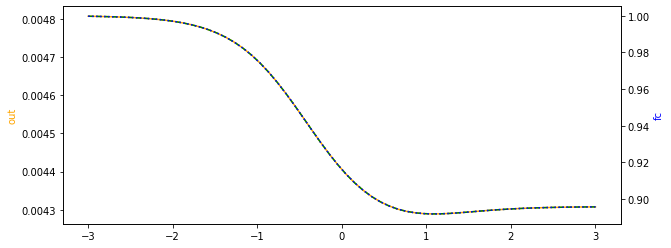

1.4829564330496692,7.62945432267206,1.0,10000.0,2.921058539005922,8398.535529693392,1.0,343.8222360457438,1156.5363606578264,1627.9187038845675,48.17639712059035,0.25775007472359635,6.289103575272733
down_up


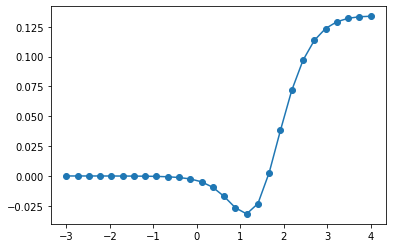

[('kb', 1.4829564330496692), ('k_1_0', 1.0), ('kr_1_0', 343.8222360457438), ('kb', 1.4829564330496692), ('k_2_0', 10000.0), ('kr_2_0', 1156.5363606578264), ('kb', 1.4829564330496692), ('k_3_0', 2.921058539005922), ('kr_3_0', 1627.9187038845675), ('kb', 1.4829564330496692), ('k_4_0', 8398.535529693392), ('kr_4_0', 48.17639712059035), ('kb', 1.4829564330496692), ('k_5_0', 1.0), ('ku', 7.62945432267206), ('k_1_1', 1.0), ('kr_1_1', 343.8222360457438), ('ku', 7.62945432267206), ('k_2_1', 2577.5007472359634), ('kr_2_1', 1156.5363606578264), ('ku', 7.62945432267206), ('k_3_1', 2.921058539005922), ('kr_3_1', 1627.9187038845675), ('ku', 7.62945432267206), ('k_4_1', 52819.25982684979), ('kr_4_1', 48.17639712059035), ('ku', 7.62945432267206), ('k_5_1', 1.0)]
a parameter is out of bounds! [52819.25982685]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

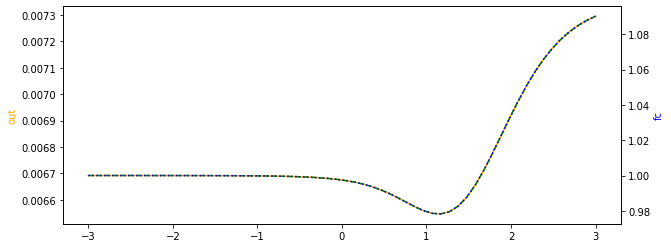

4.399276338292527,30.059964802741124,1.0,5214.404643878154,25.050794355467243,10000.0,1.0,27.757669749036296,525.8216875084153,2618.4399346407736,154.6151449232369,0.11432990155038439,100.0
down_up


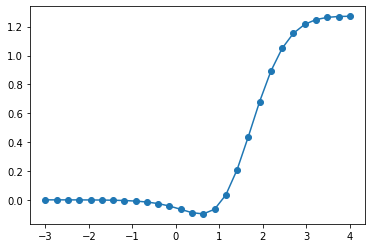

[('kb', 4.399276338292527), ('k_1_0', 1.0), ('kr_1_0', 27.757669749036296), ('kb', 4.399276338292527), ('k_2_0', 5214.404643878154), ('kr_2_0', 525.8216875084153), ('kb', 4.399276338292527), ('k_3_0', 25.050794355467243), ('kr_3_0', 2618.4399346407736), ('kb', 4.399276338292527), ('k_4_0', 10000.0), ('kr_4_0', 154.6151449232369), ('kb', 4.399276338292527), ('k_5_0', 1.0), ('ku', 30.059964802741124), ('k_1_1', 1.0), ('kr_1_1', 27.757669749036296), ('ku', 30.059964802741124), ('k_2_1', 596.1623695784565), ('kr_2_1', 525.8216875084153), ('ku', 30.059964802741124), ('k_3_1', 25.050794355467243), ('kr_3_1', 2618.4399346407736), ('ku', 30.059964802741124), ('k_4_1', 1000000.0), ('kr_4_1', 154.6151449232369), ('ku', 30.059964802741124), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

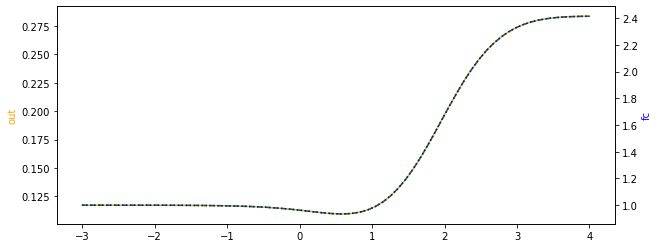

1.0,1.0,1.0,10000.0,37.35724985546571,10000.0,1.0,665.8396027642319,225.47853959504388,1763.823668380557,49.72875107573138,0.12561460219341697,4.107494141355906
down_up


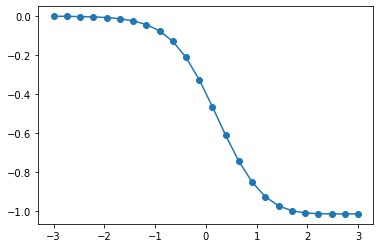

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 665.8396027642319), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 225.47853959504388), ('kb', 1.0), ('k_3_0', 37.35724985546571), ('kr_3_0', 1763.823668380557), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 49.72875107573138), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 665.8396027642319), ('ku', 1.0), ('k_2_1', 1256.1460219341698), ('kr_2_1', 225.47853959504388), ('ku', 1.0), ('k_3_1', 37.35724985546571), ('kr_3_1', 1763.823668380557), ('ku', 1.0), ('k_4_1', 41074.941413559056), ('kr_4_1', 49.72875107573138), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [41074.94141356]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

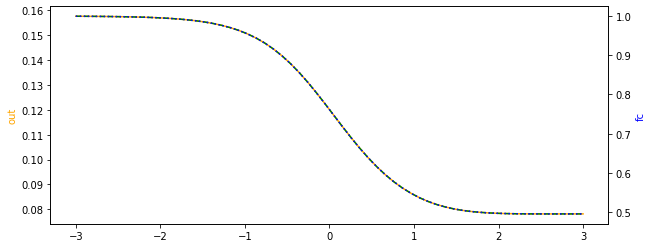

1.0,1.0,1.0,10000.0,79.78722885332634,10000.0,1.0,162.12233576848428,225.47853959504388,10000.0,49.72875107573138,0.12561460219341697,4.107494141355906
down_up


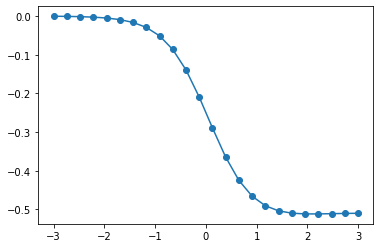

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 162.12233576848428), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 225.47853959504388), ('kb', 1.0), ('k_3_0', 79.78722885332634), ('kr_3_0', 10000.0), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 49.72875107573138), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 162.12233576848428), ('ku', 1.0), ('k_2_1', 1256.1460219341698), ('kr_2_1', 225.47853959504388), ('ku', 1.0), ('k_3_1', 79.78722885332634), ('kr_3_1', 10000.0), ('ku', 1.0), ('k_4_1', 41074.941413559056), ('kr_4_1', 49.72875107573138), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [41074.94141356]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

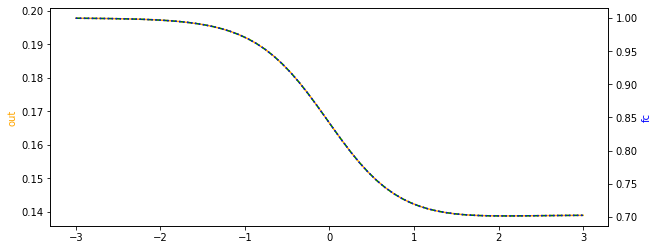

2.8047448991229365,1.0,1.0,10000.0,1.0,4173.962885713395,1.0,680.645679583782,724.0507693039979,289.49331328126135,115.42463756441501,0.3323553215493949,3.385165748894962
down_up


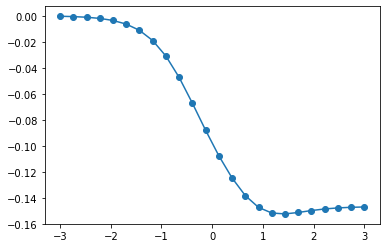

[('kb', 2.8047448991229365), ('k_1_0', 1.0), ('kr_1_0', 680.645679583782), ('kb', 2.8047448991229365), ('k_2_0', 10000.0), ('kr_2_0', 724.0507693039979), ('kb', 2.8047448991229365), ('k_3_0', 1.0), ('kr_3_0', 289.49331328126135), ('kb', 2.8047448991229365), ('k_4_0', 4173.962885713395), ('kr_4_0', 115.42463756441501), ('kb', 2.8047448991229365), ('k_5_0', 1.0), ('ku', 1.0), ('k_1_1', 1.0), ('kr_1_1', 680.645679583782), ('ku', 1.0), ('k_2_1', 3323.553215493949), ('kr_2_1', 724.0507693039979), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 289.49331328126135), ('ku', 1.0), ('k_4_1', 14129.55619787576), ('kr_4_1', 115.42463756441501), ('ku', 1.0), ('k_5_1', 1.0)]
a parameter is out of bounds! [14129.55619788]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

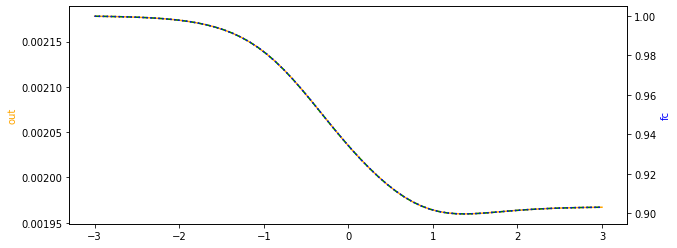

1.0,10.778404363072541,1.0,10000.0,1.6405310229683499,10000.0,1.0,366.548093187048,130.3268631457764,502.71334436752477,462.9798895070662,0.01,71.17951169453413
down_up


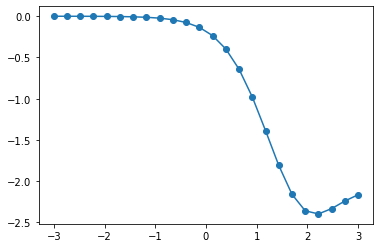

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 366.548093187048), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 130.3268631457764), ('kb', 1.0), ('k_3_0', 1.6405310229683499), ('kr_3_0', 502.71334436752477), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 10.778404363072541), ('k_1_1', 1.0), ('kr_1_1', 366.548093187048), ('ku', 10.778404363072541), ('k_2_1', 100.0), ('kr_2_1', 130.3268631457764), ('ku', 10.778404363072541), ('k_3_1', 1.6405310229683499), ('kr_3_1', 502.71334436752477), ('ku', 10.778404363072541), ('k_4_1', 711795.1169453412), ('kr_4_1', 462.9798895070662), ('ku', 10.778404363072541), ('k_5_1', 1.0)]
a parameter is out of bounds! [711795.11694534]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

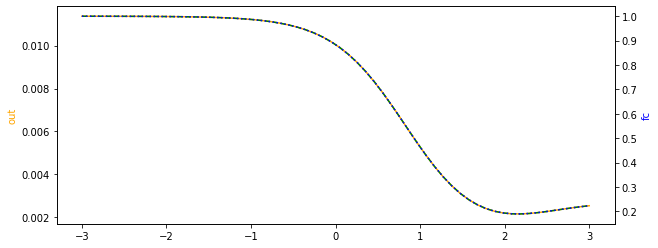

1.0,9.543682293439062,1.0,10000.0,1.0,9944.506854213052,1.0,592.8975489709665,68.81232273270268,502.71334436752477,462.9798895070662,0.01,100.0
down_up


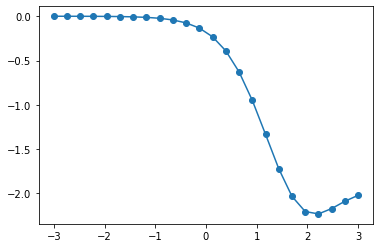

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 592.8975489709665), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 68.81232273270268), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 502.71334436752477), ('kb', 1.0), ('k_4_0', 9944.506854213052), ('kr_4_0', 462.9798895070662), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 9.543682293439062), ('k_1_1', 1.0), ('kr_1_1', 592.8975489709665), ('ku', 9.543682293439062), ('k_2_1', 100.0), ('kr_2_1', 68.81232273270268), ('ku', 9.543682293439062), ('k_3_1', 1.0), ('kr_3_1', 502.71334436752477), ('ku', 9.543682293439062), ('k_4_1', 994450.6854213052), ('kr_4_1', 462.9798895070662), ('ku', 9.543682293439062), ('k_5_1', 1.0)]
a parameter is out of bounds! [994450.68542131]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

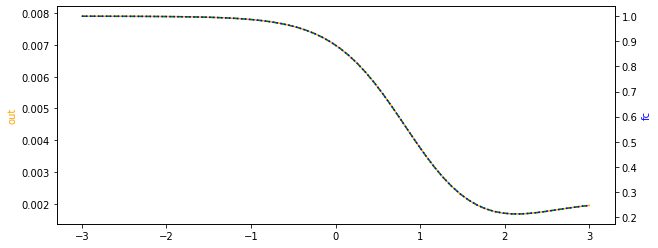

1.0,2.806865751128975,1.0,10000.0,1.0,10000.0,1.0,592.8975489709665,39.31096868098474,502.71334436752477,462.9798895070662,0.01,100.0
down_up


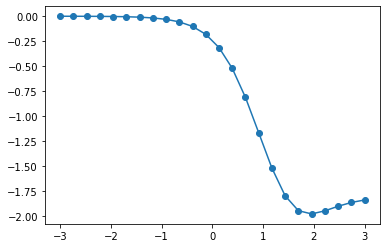

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 592.8975489709665), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 39.31096868098474), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 502.71334436752477), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 2.806865751128975), ('k_1_1', 1.0), ('kr_1_1', 592.8975489709665), ('ku', 2.806865751128975), ('k_2_1', 100.0), ('kr_2_1', 39.31096868098474), ('ku', 2.806865751128975), ('k_3_1', 1.0), ('kr_3_1', 502.71334436752477), ('ku', 2.806865751128975), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 2.806865751128975), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

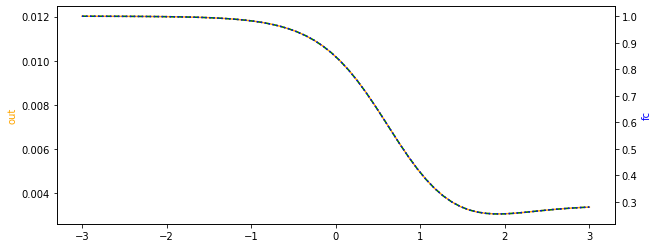

1.0,1.0,1.0047852385553981,9559.901030197889,1.0,10000.0,2.6515181169860673,678.8560530478755,62.16174613304959,279.75348857446255,462.9798895070662,0.05115651066418867,22.815634851649406
down_up


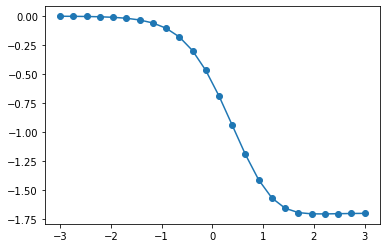

[('kb', 1.0), ('k_1_0', 1.0047852385553981), ('kr_1_0', 678.8560530478755), ('kb', 1.0), ('k_2_0', 9559.901030197889), ('kr_2_0', 62.16174613304959), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 1.0), ('k_5_0', 2.6515181169860673), ('ku', 1.0), ('k_1_1', 1.0047852385553981), ('kr_1_1', 678.8560530478755), ('ku', 1.0), ('k_2_1', 489.05117899990654), ('kr_2_1', 62.16174613304959), ('ku', 1.0), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 1.0), ('k_4_1', 228156.34851649406), ('kr_4_1', 462.9798895070662), ('ku', 1.0), ('k_5_1', 2.6515181169860673)]
a parameter is out of bounds! [228156.34851649]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

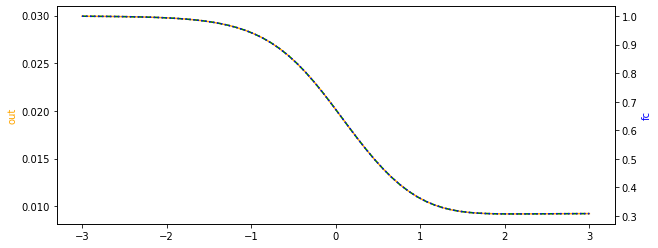

1.0,15.912673568406534,1.0,10000.0,1.0,10000.0,2.6515181169860673,131.8044652061549,1090.643366444928,279.75348857446255,482.75086687110075,0.05901376150347387,45.336506367698064
down_up


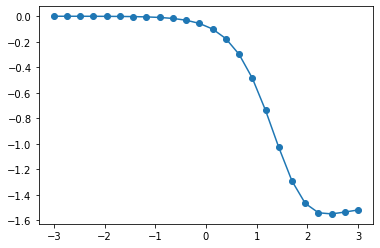

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 1090.643366444928), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 482.75086687110075), ('kb', 1.0), ('k_5_0', 2.6515181169860673), ('ku', 15.912673568406534), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 15.912673568406534), ('k_2_1', 590.1376150347387), ('kr_2_1', 1090.643366444928), ('ku', 15.912673568406534), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 15.912673568406534), ('k_4_1', 453365.0636769806), ('kr_4_1', 482.75086687110075), ('ku', 15.912673568406534), ('k_5_1', 2.6515181169860673)]
a parameter is out of bounds! [453365.06367698]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

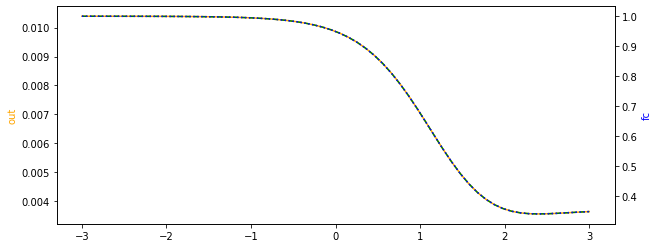

1.439373681023086,47.13033296385808,1.0,10000.0,4.060947840685079,10000.0,1.0,567.0320382252237,215.54622511620573,113.32421144598385,464.12655052840535,0.06570479162567316,29.021205391931822
down_up


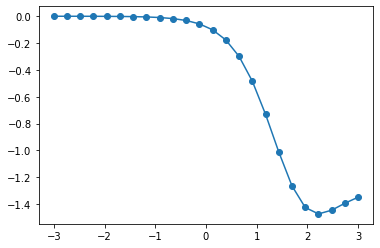

[('kb', 1.439373681023086), ('k_1_0', 1.0), ('kr_1_0', 567.0320382252237), ('kb', 1.439373681023086), ('k_2_0', 10000.0), ('kr_2_0', 215.54622511620573), ('kb', 1.439373681023086), ('k_3_0', 4.060947840685079), ('kr_3_0', 113.32421144598385), ('kb', 1.439373681023086), ('k_4_0', 10000.0), ('kr_4_0', 464.12655052840535), ('kb', 1.439373681023086), ('k_5_0', 1.0), ('ku', 47.13033296385808), ('k_1_1', 1.0), ('kr_1_1', 567.0320382252237), ('ku', 47.13033296385808), ('k_2_1', 657.0479162567317), ('kr_2_1', 215.54622511620573), ('ku', 47.13033296385808), ('k_3_1', 4.060947840685079), ('kr_3_1', 113.32421144598385), ('ku', 47.13033296385808), ('k_4_1', 290212.05391931825), ('kr_4_1', 464.12655052840535), ('ku', 47.13033296385808), ('k_5_1', 1.0)]
a parameter is out of bounds! [290212.05391932]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

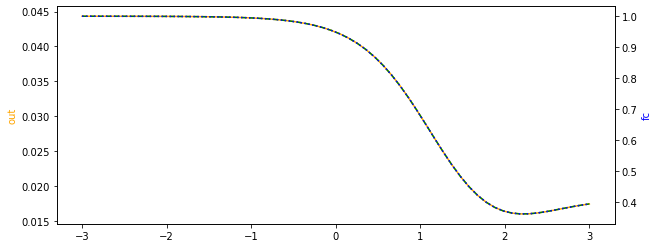

2.2168031272780886,18.510922999896046,1.0,10000.0,1.0,10000.0,1.0,284.75240860226904,113.35306688097114,279.75348857446255,452.13197863642654,0.034844683481701985,28.87967511421627
down_up


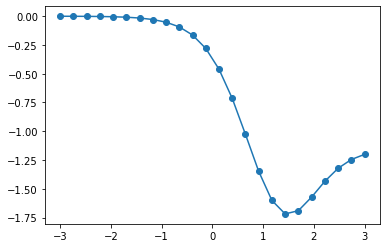

[('kb', 2.2168031272780886), ('k_1_0', 1.0), ('kr_1_0', 284.75240860226904), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 113.35306688097114), ('kb', 2.2168031272780886), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 452.13197863642654), ('kb', 2.2168031272780886), ('k_5_0', 1.0), ('ku', 18.510922999896046), ('k_1_1', 1.0), ('kr_1_1', 284.75240860226904), ('ku', 18.510922999896046), ('k_2_1', 348.44683481701986), ('kr_2_1', 113.35306688097114), ('ku', 18.510922999896046), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 18.510922999896046), ('k_4_1', 288796.7511421627), ('kr_4_1', 452.13197863642654), ('ku', 18.510922999896046), ('k_5_1', 1.0)]
a parameter is out of bounds! [288796.75114216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

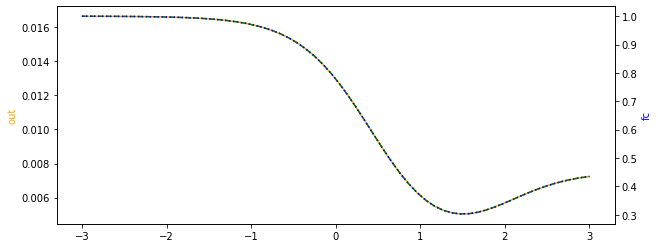

2.2168031272780886,9.000322338995408,1.0,10000.0,2.2067381494198646,10000.0,1.0,284.75240860226904,86.65458644397381,279.75348857446255,452.13197863642654,0.034844683481701985,28.87967511421627
down_up


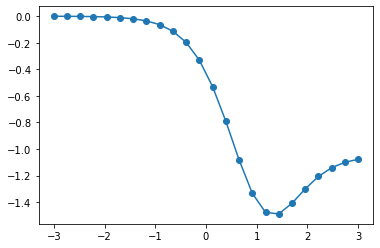

[('kb', 2.2168031272780886), ('k_1_0', 1.0), ('kr_1_0', 284.75240860226904), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 86.65458644397381), ('kb', 2.2168031272780886), ('k_3_0', 2.2067381494198646), ('kr_3_0', 279.75348857446255), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 452.13197863642654), ('kb', 2.2168031272780886), ('k_5_0', 1.0), ('ku', 9.000322338995408), ('k_1_1', 1.0), ('kr_1_1', 284.75240860226904), ('ku', 9.000322338995408), ('k_2_1', 348.44683481701986), ('kr_2_1', 86.65458644397381), ('ku', 9.000322338995408), ('k_3_1', 2.2067381494198646), ('kr_3_1', 279.75348857446255), ('ku', 9.000322338995408), ('k_4_1', 288796.7511421627), ('kr_4_1', 452.13197863642654), ('ku', 9.000322338995408), ('k_5_1', 1.0)]
a parameter is out of bounds! [288796.75114216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

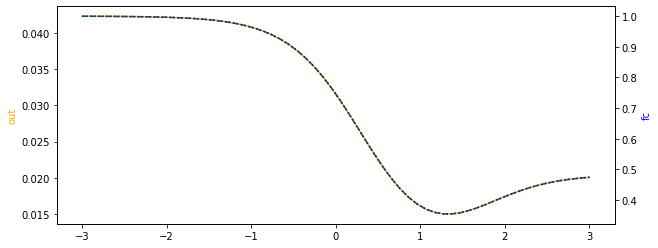

2.2168031272780886,49.94103817515391,1.4055536389047472,10000.0,1.0,10000.0,1.0,276.21726653215745,95.34188216447552,279.75348857446255,452.13197863642654,0.034844683481701985,28.87967511421627
down_up


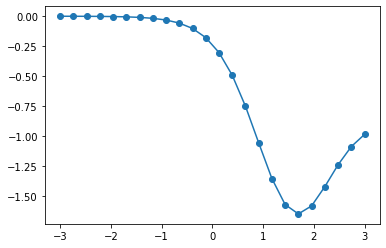

[('kb', 2.2168031272780886), ('k_1_0', 1.4055536389047472), ('kr_1_0', 276.21726653215745), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 95.34188216447552), ('kb', 2.2168031272780886), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 452.13197863642654), ('kb', 2.2168031272780886), ('k_5_0', 1.0), ('ku', 49.94103817515391), ('k_1_1', 1.4055536389047472), ('kr_1_1', 276.21726653215745), ('ku', 49.94103817515391), ('k_2_1', 348.44683481701986), ('kr_2_1', 95.34188216447552), ('ku', 49.94103817515391), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 49.94103817515391), ('k_4_1', 288796.7511421627), ('kr_4_1', 452.13197863642654), ('ku', 49.94103817515391), ('k_5_1', 1.0)]
a parameter is out of bounds! [288796.75114216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

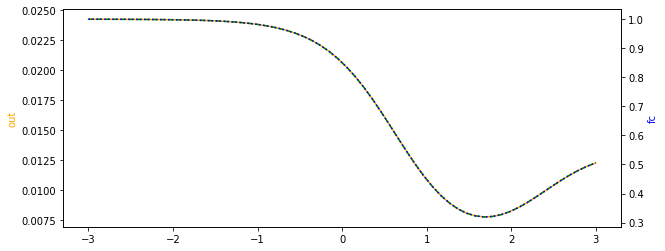

2.2168031272780886,49.94103817515391,1.4055536389047472,10000.0,2.2067381494198646,10000.0,1.0,284.75240860226904,79.89392079560416,279.75348857446255,452.13197863642654,0.034844683481701985,28.87967511421627
down_up


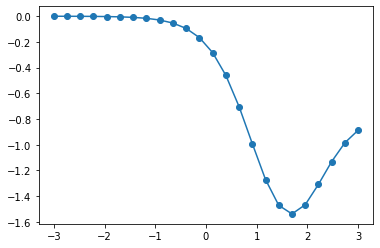

[('kb', 2.2168031272780886), ('k_1_0', 1.4055536389047472), ('kr_1_0', 284.75240860226904), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 79.89392079560416), ('kb', 2.2168031272780886), ('k_3_0', 2.2067381494198646), ('kr_3_0', 279.75348857446255), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 452.13197863642654), ('kb', 2.2168031272780886), ('k_5_0', 1.0), ('ku', 49.94103817515391), ('k_1_1', 1.4055536389047472), ('kr_1_1', 284.75240860226904), ('ku', 49.94103817515391), ('k_2_1', 348.44683481701986), ('kr_2_1', 79.89392079560416), ('ku', 49.94103817515391), ('k_3_1', 2.2067381494198646), ('kr_3_1', 279.75348857446255), ('ku', 49.94103817515391), ('k_4_1', 288796.7511421627), ('kr_4_1', 452.13197863642654), ('ku', 49.94103817515391), ('k_5_1', 1.0)]
a parameter is out of bounds! [288796.75114216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

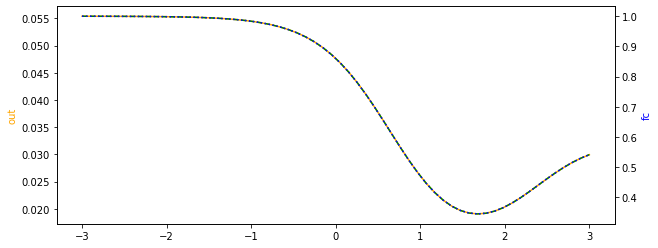

2.2168031272780886,1.4479874917975615,1.0,10000.0,1.7071821041133792,10000.0,1.0,131.8044652061549,210.36831252258744,103.55653686684788,462.9798895070662,0.07295822636327273,100.0
down_up


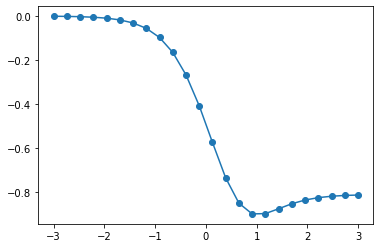

[('kb', 2.2168031272780886), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 210.36831252258744), ('kb', 2.2168031272780886), ('k_3_0', 1.7071821041133792), ('kr_3_0', 103.55653686684788), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 2.2168031272780886), ('k_5_0', 1.0), ('ku', 1.4479874917975615), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 1.4479874917975615), ('k_2_1', 729.5822636327273), ('kr_2_1', 210.36831252258744), ('ku', 1.4479874917975615), ('k_3_1', 1.7071821041133792), ('kr_3_1', 103.55653686684788), ('ku', 1.4479874917975615), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 1.4479874917975615), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

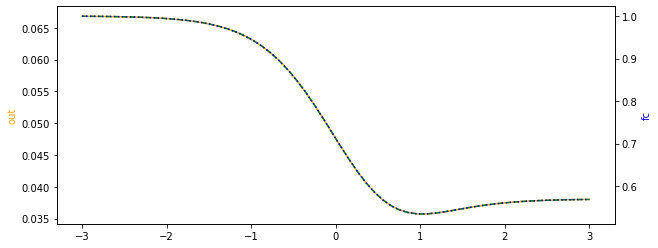

2.1331396557717617,17.35206124794631,1.8869868673995955,10000.0,1.0,10000.0,2.752289726682386,61.11341099560404,386.06659930182144,279.75348857446255,462.9798895070662,0.06498455953802103,100.0
down_up


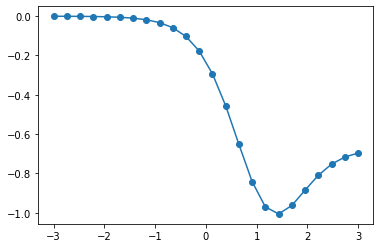

[('kb', 2.1331396557717617), ('k_1_0', 1.8869868673995955), ('kr_1_0', 61.11341099560404), ('kb', 2.1331396557717617), ('k_2_0', 10000.0), ('kr_2_0', 386.06659930182144), ('kb', 2.1331396557717617), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 2.1331396557717617), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 2.1331396557717617), ('k_5_0', 2.752289726682386), ('ku', 17.35206124794631), ('k_1_1', 1.8869868673995955), ('kr_1_1', 61.11341099560404), ('ku', 17.35206124794631), ('k_2_1', 649.8455953802103), ('kr_2_1', 386.06659930182144), ('ku', 17.35206124794631), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 17.35206124794631), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 17.35206124794631), ('k_5_1', 2.752289726682386)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

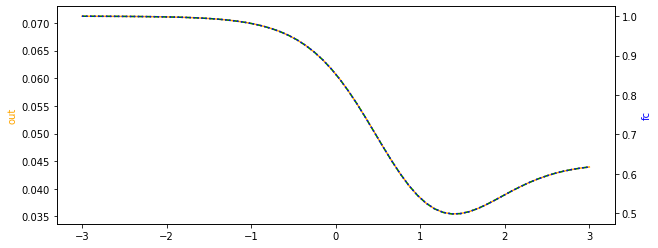

2.2168031272780886,22.43481027239326,1.0,10000.0,1.0,10000.0,2.6515181169860673,284.75240860226904,40.40733221180753,279.75348857446255,462.9798895070662,0.07295822636327273,28.87967511421627
down_up


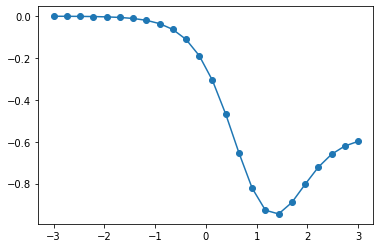

[('kb', 2.2168031272780886), ('k_1_0', 1.0), ('kr_1_0', 284.75240860226904), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 40.40733221180753), ('kb', 2.2168031272780886), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 2.2168031272780886), ('k_5_0', 2.6515181169860673), ('ku', 22.43481027239326), ('k_1_1', 1.0), ('kr_1_1', 284.75240860226904), ('ku', 22.43481027239326), ('k_2_1', 729.5822636327273), ('kr_2_1', 40.40733221180753), ('ku', 22.43481027239326), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 22.43481027239326), ('k_4_1', 288796.7511421627), ('kr_4_1', 462.9798895070662), ('ku', 22.43481027239326), ('k_5_1', 2.6515181169860673)]
a parameter is out of bounds! [288796.75114216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

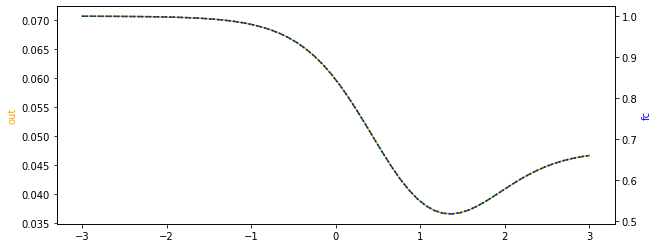

4.488591186436719,90.77098542384857,1.0,10000.0,1.0,10000.0,1.0,131.8044652061549,304.02146210522307,279.75348857446255,447.03041489587804,0.0482187323866335,100.0
down_up


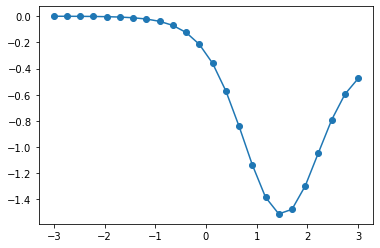

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 304.02146210522307), ('kb', 4.488591186436719), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 10000.0), ('kr_4_0', 447.03041489587804), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 90.77098542384857), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 90.77098542384857), ('k_2_1', 482.187323866335), ('kr_2_1', 304.02146210522307), ('ku', 90.77098542384857), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 90.77098542384857), ('k_4_1', 1000000.0), ('kr_4_1', 447.03041489587804), ('ku', 90.77098542384857), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

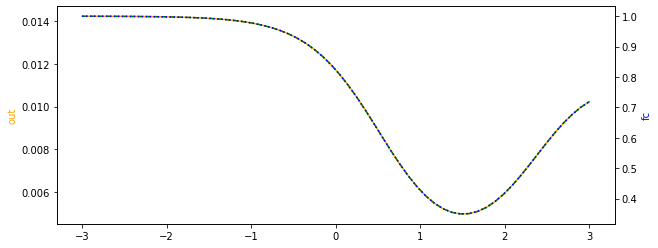

4.488591186436719,7.2366324726048665,1.0,10000.0,3.314076386489131,10000.0,1.0,131.8044652061549,250.34173008845198,279.75348857446255,447.03041489587804,0.0482187323866335,100.0
down_up


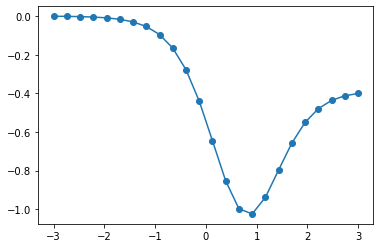

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 250.34173008845198), ('kb', 4.488591186436719), ('k_3_0', 3.314076386489131), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 10000.0), ('kr_4_0', 447.03041489587804), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 7.2366324726048665), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 7.2366324726048665), ('k_2_1', 482.187323866335), ('kr_2_1', 250.34173008845198), ('ku', 7.2366324726048665), ('k_3_1', 3.314076386489131), ('kr_3_1', 279.75348857446255), ('ku', 7.2366324726048665), ('k_4_1', 1000000.0), ('kr_4_1', 447.03041489587804), ('ku', 7.2366324726048665), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

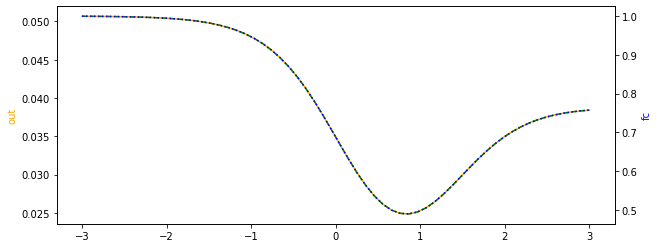

4.488591186436719,3.861364554497922,1.0,10000.0,1.0,6472.631339502809,1.0,131.8044652061549,259.13416093799117,279.75348857446255,274.52515024549916,0.05901376150347387,54.335222496187384
down_up


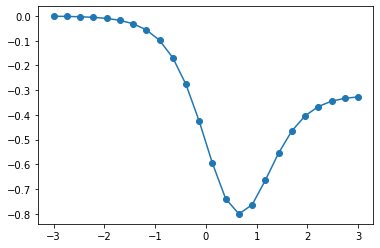

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 259.13416093799117), ('kb', 4.488591186436719), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 6472.631339502809), ('kr_4_0', 274.52515024549916), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 3.861364554497922), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 3.861364554497922), ('k_2_1', 590.1376150347387), ('kr_2_1', 259.13416093799117), ('ku', 3.861364554497922), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 3.861364554497922), ('k_4_1', 351691.86396768055), ('kr_4_1', 274.52515024549916), ('ku', 3.861364554497922), ('k_5_1', 1.0)]
a parameter is out of bounds! [351691.86396768]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

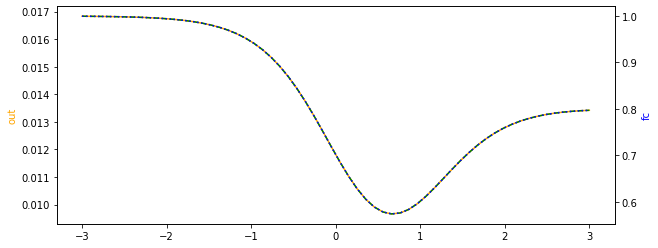

2.1331396557717617,2.214589375020302,1.1164991114935494,10000.0,1.0,10000.0,1.0,62.53376017526749,117.47769575255094,279.75348857446255,168.0970368598216,0.06498455953802103,100.0
down_up


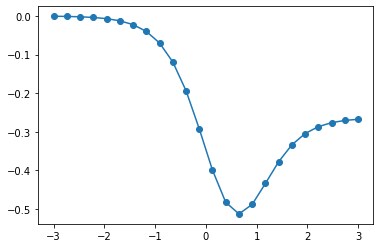

[('kb', 2.1331396557717617), ('k_1_0', 1.1164991114935494), ('kr_1_0', 62.53376017526749), ('kb', 2.1331396557717617), ('k_2_0', 10000.0), ('kr_2_0', 117.47769575255094), ('kb', 2.1331396557717617), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 2.1331396557717617), ('k_4_0', 10000.0), ('kr_4_0', 168.0970368598216), ('kb', 2.1331396557717617), ('k_5_0', 1.0), ('ku', 2.214589375020302), ('k_1_1', 1.1164991114935494), ('kr_1_1', 62.53376017526749), ('ku', 2.214589375020302), ('k_2_1', 649.8455953802103), ('kr_2_1', 117.47769575255094), ('ku', 2.214589375020302), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 2.214589375020302), ('k_4_1', 1000000.0), ('kr_4_1', 168.0970368598216), ('ku', 2.214589375020302), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

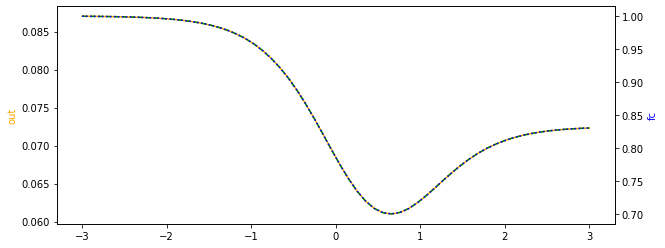

4.488591186436719,12.603508118699443,1.0,10000.0,2.0718402037241557,6472.631339502809,1.0,131.8044652061549,176.7931834160558,279.75348857446255,255.26136128916397,0.05901376150347387,100.0
down_up


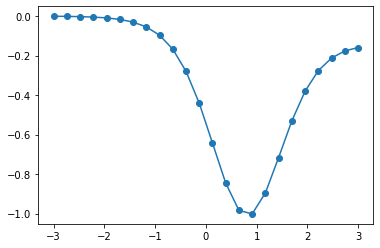

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 176.7931834160558), ('kb', 4.488591186436719), ('k_3_0', 2.0718402037241557), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 6472.631339502809), ('kr_4_0', 255.26136128916397), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 12.603508118699443), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 12.603508118699443), ('k_2_1', 590.1376150347387), ('kr_2_1', 176.7931834160558), ('ku', 12.603508118699443), ('k_3_1', 2.0718402037241557), ('kr_3_1', 279.75348857446255), ('ku', 12.603508118699443), ('k_4_1', 647263.133950281), ('kr_4_1', 255.26136128916397), ('ku', 12.603508118699443), ('k_5_1', 1.0)]
a parameter is out of bounds! [647263.13395028]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

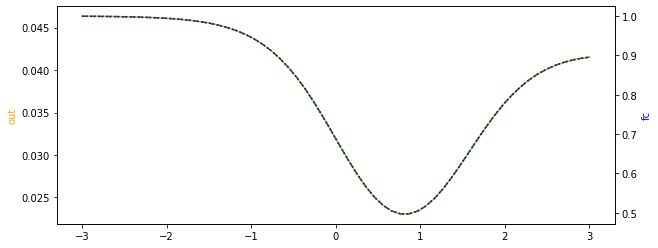

2.2168031272780886,1.1051136842082396,1.0,10000.0,1.0,10000.0,2.6515181169860673,39.86920995186314,132.62718944590821,326.0613746862302,462.9798895070662,0.05901376150347387,66.68229271700866
down_up


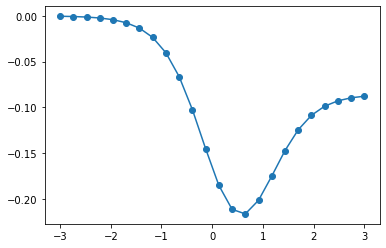

[('kb', 2.2168031272780886), ('k_1_0', 1.0), ('kr_1_0', 39.86920995186314), ('kb', 2.2168031272780886), ('k_2_0', 10000.0), ('kr_2_0', 132.62718944590821), ('kb', 2.2168031272780886), ('k_3_0', 1.0), ('kr_3_0', 326.0613746862302), ('kb', 2.2168031272780886), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 2.2168031272780886), ('k_5_0', 2.6515181169860673), ('ku', 1.1051136842082396), ('k_1_1', 1.0), ('kr_1_1', 39.86920995186314), ('ku', 1.1051136842082396), ('k_2_1', 590.1376150347387), ('kr_2_1', 132.62718944590821), ('ku', 1.1051136842082396), ('k_3_1', 1.0), ('kr_3_1', 326.0613746862302), ('ku', 1.1051136842082396), ('k_4_1', 666822.9271700867), ('kr_4_1', 462.9798895070662), ('ku', 1.1051136842082396), ('k_5_1', 2.6515181169860673)]
a parameter is out of bounds! [666822.92717009]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

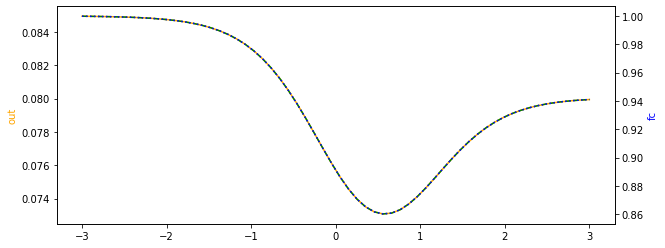

4.488591186436719,46.233813025065224,1.0,10000.0,1.4882549089188326,6472.631339502809,1.0,93.52568461388904,169.4918998860702,279.75348857446255,255.26136128916397,0.05901376150347387,100.0
down_up


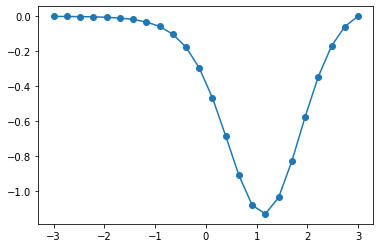

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 93.52568461388904), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 169.4918998860702), ('kb', 4.488591186436719), ('k_3_0', 1.4882549089188326), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 6472.631339502809), ('kr_4_0', 255.26136128916397), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 46.233813025065224), ('k_1_1', 1.0), ('kr_1_1', 93.52568461388904), ('ku', 46.233813025065224), ('k_2_1', 590.1376150347387), ('kr_2_1', 169.4918998860702), ('ku', 46.233813025065224), ('k_3_1', 1.4882549089188326), ('kr_3_1', 279.75348857446255), ('ku', 46.233813025065224), ('k_4_1', 647263.133950281), ('kr_4_1', 255.26136128916397), ('ku', 46.233813025065224), ('k_5_1', 1.0)]
a parameter is out of bounds! [647263.13395028]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

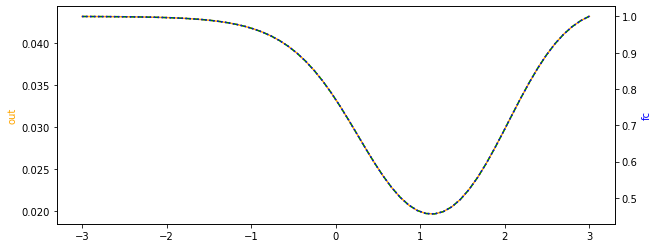

4.488591186436719,54.30986326448929,1.0,10000.0,1.0,5767.3603379216,1.0,48.678512111203,288.0514632434048,279.75348857446255,255.26136128916397,0.05618359536638528,100.0
down_up


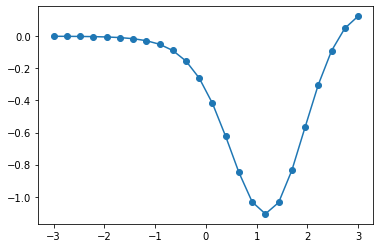

[('kb', 4.488591186436719), ('k_1_0', 1.0), ('kr_1_0', 48.678512111203), ('kb', 4.488591186436719), ('k_2_0', 10000.0), ('kr_2_0', 288.0514632434048), ('kb', 4.488591186436719), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 4.488591186436719), ('k_4_0', 5767.3603379216), ('kr_4_0', 255.26136128916397), ('kb', 4.488591186436719), ('k_5_0', 1.0), ('ku', 54.30986326448929), ('k_1_1', 1.0), ('kr_1_1', 48.678512111203), ('ku', 54.30986326448929), ('k_2_1', 561.8359536638528), ('kr_2_1', 288.0514632434048), ('ku', 54.30986326448929), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 54.30986326448929), ('k_4_1', 576736.03379216), ('kr_4_1', 255.26136128916397), ('ku', 54.30986326448929), ('k_5_1', 1.0)]
a parameter is out of bounds! [576736.03379216]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

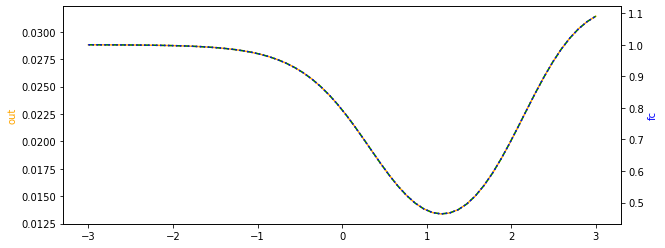

5.159108425452584,13.671076141973328,1.0,10000.0,2.0718402037241557,3453.003837503731,1.0,900.2009706509682,70.90655587722031,279.75348857446255,255.26136128916397,0.05901376150347387,100.0
down_up


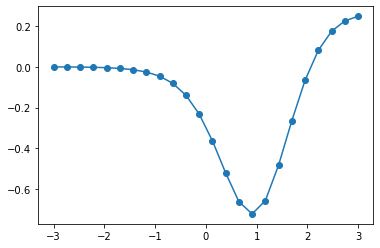

[('kb', 5.159108425452584), ('k_1_0', 1.0), ('kr_1_0', 900.2009706509682), ('kb', 5.159108425452584), ('k_2_0', 10000.0), ('kr_2_0', 70.90655587722031), ('kb', 5.159108425452584), ('k_3_0', 2.0718402037241557), ('kr_3_0', 279.75348857446255), ('kb', 5.159108425452584), ('k_4_0', 3453.003837503731), ('kr_4_0', 255.26136128916397), ('kb', 5.159108425452584), ('k_5_0', 1.0), ('ku', 13.671076141973328), ('k_1_1', 1.0), ('kr_1_1', 900.2009706509682), ('ku', 13.671076141973328), ('k_2_1', 590.1376150347387), ('kr_2_1', 70.90655587722031), ('ku', 13.671076141973328), ('k_3_1', 2.0718402037241557), ('kr_3_1', 279.75348857446255), ('ku', 13.671076141973328), ('k_4_1', 345300.3837503731), ('kr_4_1', 255.26136128916397), ('ku', 13.671076141973328), ('k_5_1', 1.0)]
a parameter is out of bounds! [345300.38375037]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

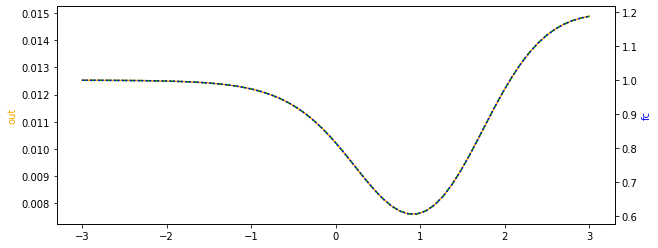

5.159108425452584,13.671076141973328,1.6886123438785496,10000.0,1.6543537195645661,3453.003837503731,1.0,235.2073770694018,337.2852686930686,279.75348857446255,255.26136128916397,0.05901376150347387,100.0
down_up


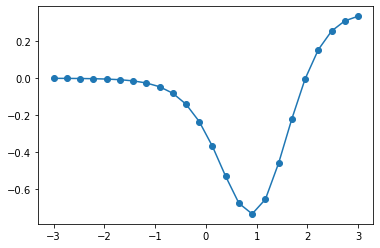

[('kb', 5.159108425452584), ('k_1_0', 1.6886123438785496), ('kr_1_0', 235.2073770694018), ('kb', 5.159108425452584), ('k_2_0', 10000.0), ('kr_2_0', 337.2852686930686), ('kb', 5.159108425452584), ('k_3_0', 1.6543537195645661), ('kr_3_0', 279.75348857446255), ('kb', 5.159108425452584), ('k_4_0', 3453.003837503731), ('kr_4_0', 255.26136128916397), ('kb', 5.159108425452584), ('k_5_0', 1.0), ('ku', 13.671076141973328), ('k_1_1', 1.6886123438785496), ('kr_1_1', 235.2073770694018), ('ku', 13.671076141973328), ('k_2_1', 590.1376150347387), ('kr_2_1', 337.2852686930686), ('ku', 13.671076141973328), ('k_3_1', 1.6543537195645661), ('kr_3_1', 279.75348857446255), ('ku', 13.671076141973328), ('k_4_1', 345300.3837503731), ('kr_4_1', 255.26136128916397), ('ku', 13.671076141973328), ('k_5_1', 1.0)]
a parameter is out of bounds! [345300.38375037]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

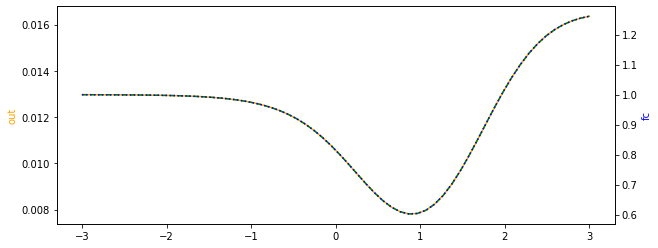

5.159108425452584,77.8548514663989,1.2686890979607266,10000.0,1.0,3453.003837503731,1.0,554.3011947677259,70.90655587722031,279.75348857446255,255.26136128916397,0.05901376150347387,100.0
down_up


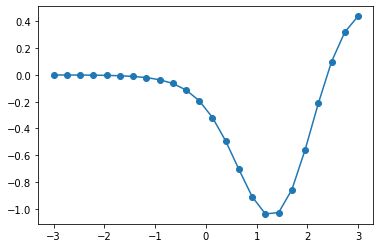

[('kb', 5.159108425452584), ('k_1_0', 1.2686890979607266), ('kr_1_0', 554.3011947677259), ('kb', 5.159108425452584), ('k_2_0', 10000.0), ('kr_2_0', 70.90655587722031), ('kb', 5.159108425452584), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 5.159108425452584), ('k_4_0', 3453.003837503731), ('kr_4_0', 255.26136128916397), ('kb', 5.159108425452584), ('k_5_0', 1.0), ('ku', 77.8548514663989), ('k_1_1', 1.2686890979607266), ('kr_1_1', 554.3011947677259), ('ku', 77.8548514663989), ('k_2_1', 590.1376150347387), ('kr_2_1', 70.90655587722031), ('ku', 77.8548514663989), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 77.8548514663989), ('k_4_1', 345300.3837503731), ('kr_4_1', 255.26136128916397), ('ku', 77.8548514663989), ('k_5_1', 1.0)]
a parameter is out of bounds! [345300.38375037]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

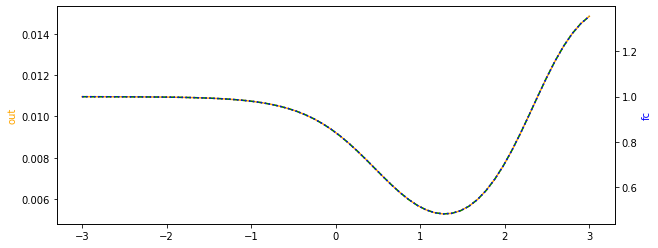

1.0,18.57929376241577,1.0,10000.0,1.0,10000.0,1.0,1378.0820260815117,16.773032128288516,188.38094066705278,388.74632921349354,0.164317754915015,41.219284234525034
down_up


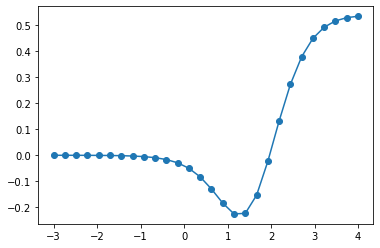

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 1378.0820260815117), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 16.773032128288516), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 188.38094066705278), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 388.74632921349354), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 18.57929376241577), ('k_1_1', 1.0), ('kr_1_1', 1378.0820260815117), ('ku', 18.57929376241577), ('k_2_1', 1643.1775491501498), ('kr_2_1', 16.773032128288516), ('ku', 18.57929376241577), ('k_3_1', 1.0), ('kr_3_1', 188.38094066705278), ('ku', 18.57929376241577), ('k_4_1', 412192.84234525036), ('kr_4_1', 388.74632921349354), ('ku', 18.57929376241577), ('k_5_1', 1.0)]
a parameter is out of bounds! [412192.84234525]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

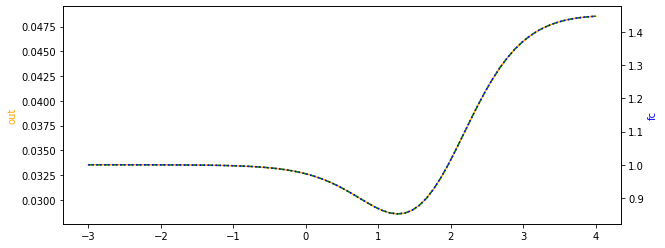

14.768179547278768,42.37693137449626,1.0,10000.0,1.0,10000.0,1.0,186.95073130023056,59.203353057255065,83.922442802458,464.12655052840535,0.2620963958783393,40.20991804809579
down_up


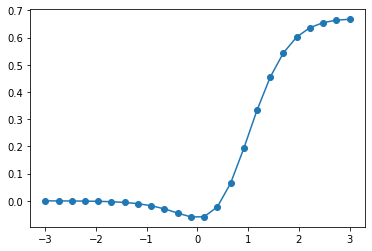

[('kb', 14.768179547278768), ('k_1_0', 1.0), ('kr_1_0', 186.95073130023056), ('kb', 14.768179547278768), ('k_2_0', 10000.0), ('kr_2_0', 59.203353057255065), ('kb', 14.768179547278768), ('k_3_0', 1.0), ('kr_3_0', 83.922442802458), ('kb', 14.768179547278768), ('k_4_0', 10000.0), ('kr_4_0', 464.12655052840535), ('kb', 14.768179547278768), ('k_5_0', 1.0), ('ku', 42.37693137449626), ('k_1_1', 1.0), ('kr_1_1', 186.95073130023056), ('ku', 42.37693137449626), ('k_2_1', 2620.963958783393), ('kr_2_1', 59.203353057255065), ('ku', 42.37693137449626), ('k_3_1', 1.0), ('kr_3_1', 83.922442802458), ('ku', 42.37693137449626), ('k_4_1', 402099.18048095785), ('kr_4_1', 464.12655052840535), ('ku', 42.37693137449626), ('k_5_1', 1.0)]
a parameter is out of bounds! [402099.18048096]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

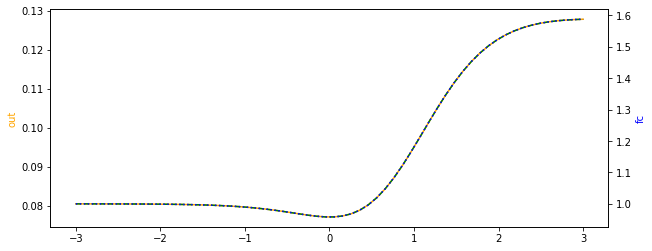

13.426186348490155,40.135768967456485,1.0,7364.526786291998,1.0,10000.0,1.0,380.05214307768364,191.6492955846135,1392.8489535516023,255.26136128916397,0.05901376150347387,100.0
down_up


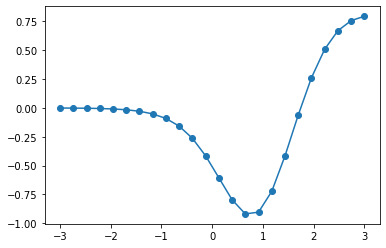

[('kb', 13.426186348490155), ('k_1_0', 1.0), ('kr_1_0', 380.05214307768364), ('kb', 13.426186348490155), ('k_2_0', 7364.526786291998), ('kr_2_0', 191.6492955846135), ('kb', 13.426186348490155), ('k_3_0', 1.0), ('kr_3_0', 1392.8489535516023), ('kb', 13.426186348490155), ('k_4_0', 10000.0), ('kr_4_0', 255.26136128916397), ('kb', 13.426186348490155), ('k_5_0', 1.0), ('ku', 40.135768967456485), ('k_1_1', 1.0), ('kr_1_1', 380.05214307768364), ('ku', 40.135768967456485), ('k_2_1', 434.60842735218085), ('kr_2_1', 191.6492955846135), ('ku', 40.135768967456485), ('k_3_1', 1.0), ('kr_3_1', 1392.8489535516023), ('ku', 40.135768967456485), ('k_4_1', 1000000.0), ('kr_4_1', 255.26136128916397), ('ku', 40.135768967456485), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

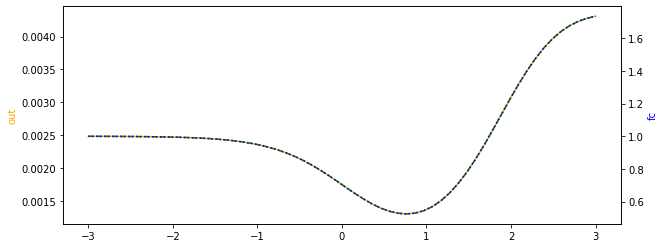

13.426186348490155,26.82132872048592,1.166327499771303,7364.526786291998,3.8206291744419048,10000.0,1.0,262.6704110374247,114.24157594566873,1392.8489535516023,255.26136128916397,0.05901376150347387,100.0
down_up


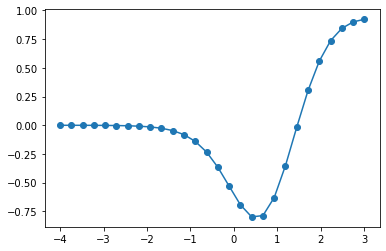

[('kb', 13.426186348490155), ('k_1_0', 1.166327499771303), ('kr_1_0', 262.6704110374247), ('kb', 13.426186348490155), ('k_2_0', 7364.526786291998), ('kr_2_0', 114.24157594566873), ('kb', 13.426186348490155), ('k_3_0', 3.8206291744419048), ('kr_3_0', 1392.8489535516023), ('kb', 13.426186348490155), ('k_4_0', 10000.0), ('kr_4_0', 255.26136128916397), ('kb', 13.426186348490155), ('k_5_0', 1.0), ('ku', 26.82132872048592), ('k_1_1', 1.166327499771303), ('kr_1_1', 262.6704110374247), ('ku', 26.82132872048592), ('k_2_1', 434.60842735218085), ('kr_2_1', 114.24157594566873), ('ku', 26.82132872048592), ('k_3_1', 3.8206291744419048), ('kr_3_1', 1392.8489535516023), ('ku', 26.82132872048592), ('k_4_1', 1000000.0), ('kr_4_1', 255.26136128916397), ('ku', 26.82132872048592), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

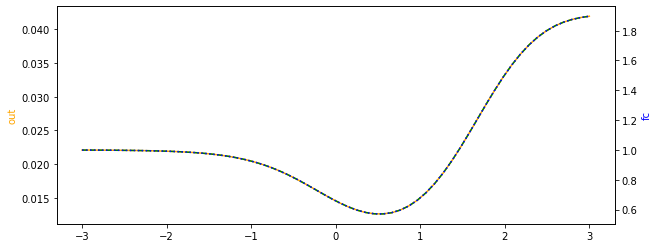

13.426186348490155,113.18845984266984,1.0,7364.526786291998,1.8168835153700074,10000.0,1.0,131.8044652061549,191.6492955846135,1940.3017168551373,255.26136128916397,0.048627500591234454,100.0
down_up


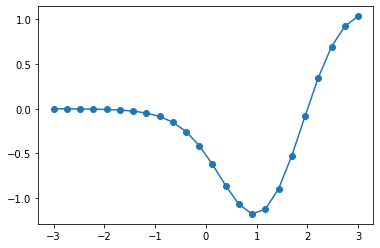

[('kb', 13.426186348490155), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 13.426186348490155), ('k_2_0', 7364.526786291998), ('kr_2_0', 191.6492955846135), ('kb', 13.426186348490155), ('k_3_0', 1.8168835153700074), ('kr_3_0', 1940.3017168551373), ('kb', 13.426186348490155), ('k_4_0', 10000.0), ('kr_4_0', 255.26136128916397), ('kb', 13.426186348490155), ('k_5_0', 1.0), ('ku', 113.18845984266984), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 113.18845984266984), ('k_2_1', 358.1185306545761), ('kr_2_1', 191.6492955846135), ('ku', 113.18845984266984), ('k_3_1', 1.8168835153700074), ('kr_3_1', 1940.3017168551373), ('ku', 113.18845984266984), ('k_4_1', 1000000.0), ('kr_4_1', 255.26136128916397), ('ku', 113.18845984266984), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

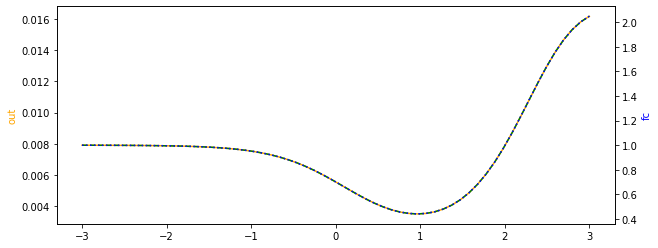

20.654087277229063,50.36247741531847,1.0,10000.0,1.0,10000.0,1.0,1280.9301660716255,58.16905864579232,202.50160348004604,1003.9535156685032,0.1146459273558269,100.0
down_up


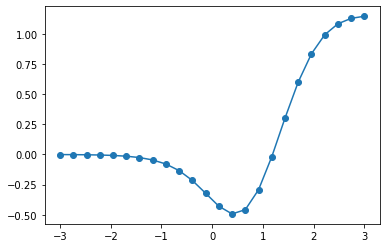

[('kb', 20.654087277229063), ('k_1_0', 1.0), ('kr_1_0', 1280.9301660716255), ('kb', 20.654087277229063), ('k_2_0', 10000.0), ('kr_2_0', 58.16905864579232), ('kb', 20.654087277229063), ('k_3_0', 1.0), ('kr_3_0', 202.50160348004604), ('kb', 20.654087277229063), ('k_4_0', 10000.0), ('kr_4_0', 1003.9535156685032), ('kb', 20.654087277229063), ('k_5_0', 1.0), ('ku', 50.36247741531847), ('k_1_1', 1.0), ('kr_1_1', 1280.9301660716255), ('ku', 50.36247741531847), ('k_2_1', 1146.459273558269), ('kr_2_1', 58.16905864579232), ('ku', 50.36247741531847), ('k_3_1', 1.0), ('kr_3_1', 202.50160348004604), ('ku', 50.36247741531847), ('k_4_1', 1000000.0), ('kr_4_1', 1003.9535156685032), ('ku', 50.36247741531847), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

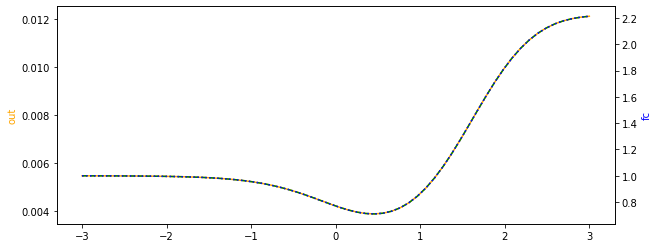

1.747107512972116,97.4476864064211,1.5044400750045068,6562.783495799976,3.4184228794441753,10000.0,1.0,131.8044652061549,53.03917013302048,279.75348857446255,462.9798895070662,0.14441259054795663,100.0
down_up


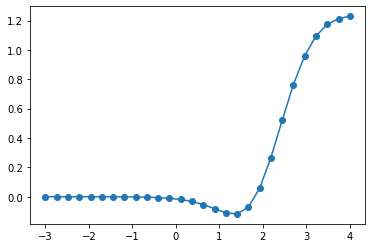

[('kb', 1.747107512972116), ('k_1_0', 1.5044400750045068), ('kr_1_0', 131.8044652061549), ('kb', 1.747107512972116), ('k_2_0', 6562.783495799976), ('kr_2_0', 53.03917013302048), ('kb', 1.747107512972116), ('k_3_0', 3.4184228794441753), ('kr_3_0', 279.75348857446255), ('kb', 1.747107512972116), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 1.747107512972116), ('k_5_0', 1.0), ('ku', 97.4476864064211), ('k_1_1', 1.5044400750045068), ('kr_1_1', 131.8044652061549), ('ku', 97.4476864064211), ('k_2_1', 947.7485658338494), ('kr_2_1', 53.03917013302048), ('ku', 97.4476864064211), ('k_3_1', 3.4184228794441753), ('kr_3_1', 279.75348857446255), ('ku', 97.4476864064211), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 97.4476864064211), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

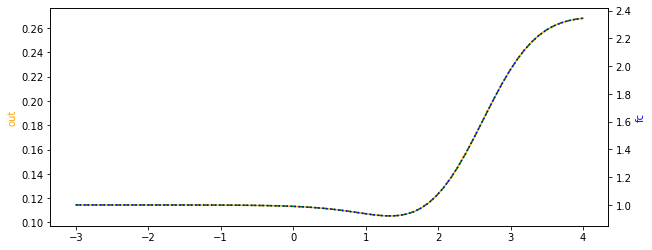

13.426186348490155,134.74568135583814,1.2146891891479399,7364.526786291998,1.0,5814.753255482942,1.0,256.9902051832794,230.0392426276187,1392.8489535516023,255.26136128916397,0.05901376150347387,100.0
down_up


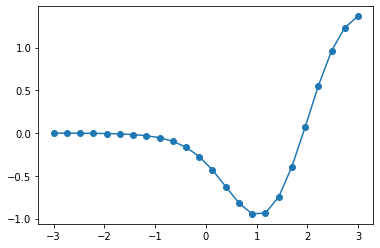

[('kb', 13.426186348490155), ('k_1_0', 1.2146891891479399), ('kr_1_0', 256.9902051832794), ('kb', 13.426186348490155), ('k_2_0', 7364.526786291998), ('kr_2_0', 230.0392426276187), ('kb', 13.426186348490155), ('k_3_0', 1.0), ('kr_3_0', 1392.8489535516023), ('kb', 13.426186348490155), ('k_4_0', 5814.753255482942), ('kr_4_0', 255.26136128916397), ('kb', 13.426186348490155), ('k_5_0', 1.0), ('ku', 134.74568135583814), ('k_1_1', 1.2146891891479399), ('kr_1_1', 256.9902051832794), ('ku', 134.74568135583814), ('k_2_1', 434.60842735218085), ('kr_2_1', 230.0392426276187), ('ku', 134.74568135583814), ('k_3_1', 1.0), ('kr_3_1', 1392.8489535516023), ('ku', 134.74568135583814), ('k_4_1', 581475.3255482942), ('kr_4_1', 255.26136128916397), ('ku', 134.74568135583814), ('k_5_1', 1.0)]
a parameter is out of bounds! [581475.32554829]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

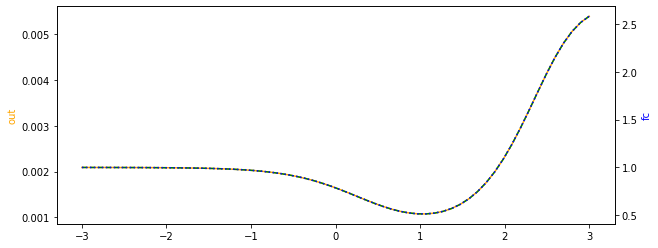

1.0,26.118195798454234,1.0,10000.0,1.0,2908.45741099407,1.0,68.09172182610973,579.7747413499775,292.1938225619569,627.5742760772225,0.05901376150347387,100.0
down_up


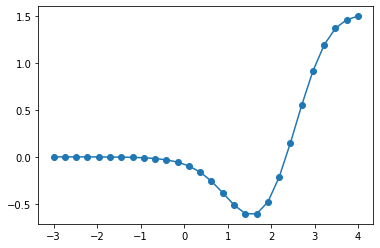

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 68.09172182610973), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 579.7747413499775), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 292.1938225619569), ('kb', 1.0), ('k_4_0', 2908.45741099407), ('kr_4_0', 627.5742760772225), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 26.118195798454234), ('k_1_1', 1.0), ('kr_1_1', 68.09172182610973), ('ku', 26.118195798454234), ('k_2_1', 590.1376150347387), ('kr_2_1', 579.7747413499775), ('ku', 26.118195798454234), ('k_3_1', 1.0), ('kr_3_1', 292.1938225619569), ('ku', 26.118195798454234), ('k_4_1', 290845.741099407), ('kr_4_1', 627.5742760772225), ('ku', 26.118195798454234), ('k_5_1', 1.0)]
a parameter is out of bounds! [290845.74109941]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

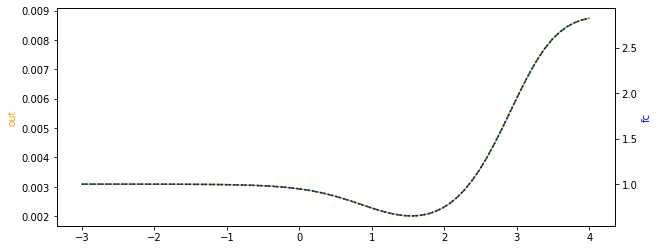

2.1331396557717617,97.4476864064211,1.0,10000.0,11.492647090139956,10000.0,2.6515181169860673,131.8044652061549,117.47769575255094,279.75348857446255,5653.360130208546,0.06498455953802103,100.0
down_up


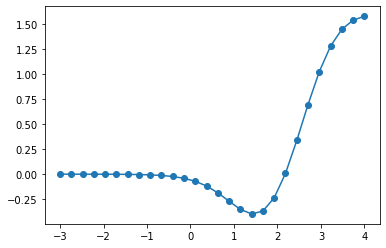

[('kb', 2.1331396557717617), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 2.1331396557717617), ('k_2_0', 10000.0), ('kr_2_0', 117.47769575255094), ('kb', 2.1331396557717617), ('k_3_0', 11.492647090139956), ('kr_3_0', 279.75348857446255), ('kb', 2.1331396557717617), ('k_4_0', 10000.0), ('kr_4_0', 5653.360130208546), ('kb', 2.1331396557717617), ('k_5_0', 2.6515181169860673), ('ku', 97.4476864064211), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 97.4476864064211), ('k_2_1', 649.8455953802103), ('kr_2_1', 117.47769575255094), ('ku', 97.4476864064211), ('k_3_1', 11.492647090139956), ('kr_3_1', 279.75348857446255), ('ku', 97.4476864064211), ('k_4_1', 1000000.0), ('kr_4_1', 5653.360130208546), ('ku', 97.4476864064211), ('k_5_1', 2.6515181169860673)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

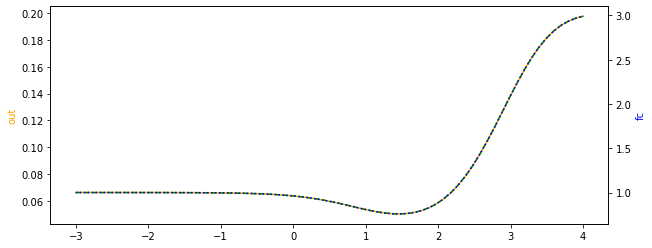

20.654087277229063,40.78697540682892,1.0,10000.0,2.1268340069648235,5932.42904456737,1.0,946.4943721725598,58.16905864579232,202.50160348004604,1003.9535156685032,0.1146459273558269,100.0
down_up


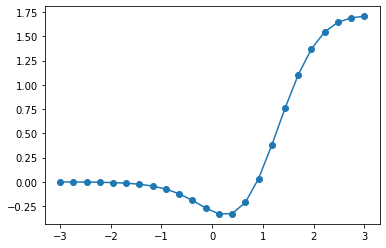

[('kb', 20.654087277229063), ('k_1_0', 1.0), ('kr_1_0', 946.4943721725598), ('kb', 20.654087277229063), ('k_2_0', 10000.0), ('kr_2_0', 58.16905864579232), ('kb', 20.654087277229063), ('k_3_0', 2.1268340069648235), ('kr_3_0', 202.50160348004604), ('kb', 20.654087277229063), ('k_4_0', 5932.42904456737), ('kr_4_0', 1003.9535156685032), ('kb', 20.654087277229063), ('k_5_0', 1.0), ('ku', 40.78697540682892), ('k_1_1', 1.0), ('kr_1_1', 946.4943721725598), ('ku', 40.78697540682892), ('k_2_1', 1146.459273558269), ('kr_2_1', 58.16905864579232), ('ku', 40.78697540682892), ('k_3_1', 2.1268340069648235), ('kr_3_1', 202.50160348004604), ('ku', 40.78697540682892), ('k_4_1', 593242.904456737), ('kr_4_1', 1003.9535156685032), ('ku', 40.78697540682892), ('k_5_1', 1.0)]
a parameter is out of bounds! [593242.90445674]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

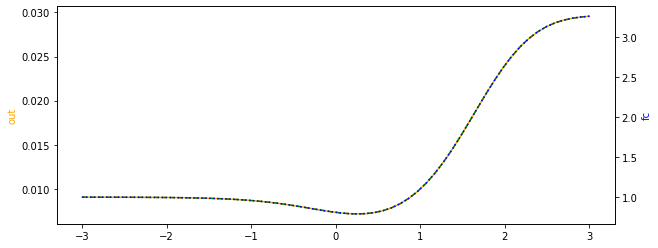

20.654087277229063,108.12521691302946,1.0,10000.0,1.0,5400.329604280797,1.0,897.0330510548174,58.16905864579232,202.50160348004604,1003.9535156685032,0.1146459273558269,96.31674355728654
down_up


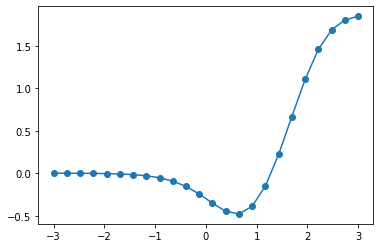

[('kb', 20.654087277229063), ('k_1_0', 1.0), ('kr_1_0', 897.0330510548174), ('kb', 20.654087277229063), ('k_2_0', 10000.0), ('kr_2_0', 58.16905864579232), ('kb', 20.654087277229063), ('k_3_0', 1.0), ('kr_3_0', 202.50160348004604), ('kb', 20.654087277229063), ('k_4_0', 5400.329604280797), ('kr_4_0', 1003.9535156685032), ('kb', 20.654087277229063), ('k_5_0', 1.0), ('ku', 108.12521691302946), ('k_1_1', 1.0), ('kr_1_1', 897.0330510548174), ('ku', 108.12521691302946), ('k_2_1', 1146.459273558269), ('kr_2_1', 58.16905864579232), ('ku', 108.12521691302946), ('k_3_1', 1.0), ('kr_3_1', 202.50160348004604), ('ku', 108.12521691302946), ('k_4_1', 520142.16162033624), ('kr_4_1', 1003.9535156685032), ('ku', 108.12521691302946), ('k_5_1', 1.0)]
a parameter is out of bounds! [520142.16162034]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

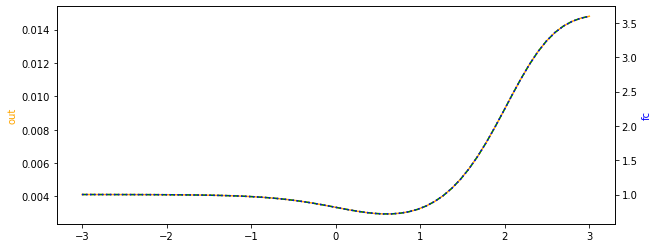

22.662189803140084,70.8295541407339,1.0,4202.4528521634975,2.0196547632434996,9093.309927709395,1.0,113.84314226398266,95.41354528379003,305.4517756960521,3053.38268654946,0.05901376150347387,100.0
down_up


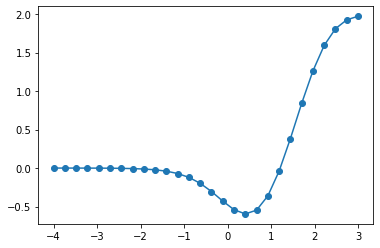

[('kb', 22.662189803140084), ('k_1_0', 1.0), ('kr_1_0', 113.84314226398266), ('kb', 22.662189803140084), ('k_2_0', 4202.4528521634975), ('kr_2_0', 95.41354528379003), ('kb', 22.662189803140084), ('k_3_0', 2.0196547632434996), ('kr_3_0', 305.4517756960521), ('kb', 22.662189803140084), ('k_4_0', 9093.309927709395), ('kr_4_0', 3053.38268654946), ('kb', 22.662189803140084), ('k_5_0', 1.0), ('ku', 70.8295541407339), ('k_1_1', 1.0), ('kr_1_1', 113.84314226398266), ('ku', 70.8295541407339), ('k_2_1', 248.00255034717017), ('kr_2_1', 95.41354528379003), ('ku', 70.8295541407339), ('k_3_1', 2.0196547632434996), ('kr_3_1', 305.4517756960521), ('ku', 70.8295541407339), ('k_4_1', 909330.9927709395), ('kr_4_1', 3053.38268654946), ('ku', 70.8295541407339), ('k_5_1', 1.0)]
a parameter is out of bounds! [909330.99277094]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

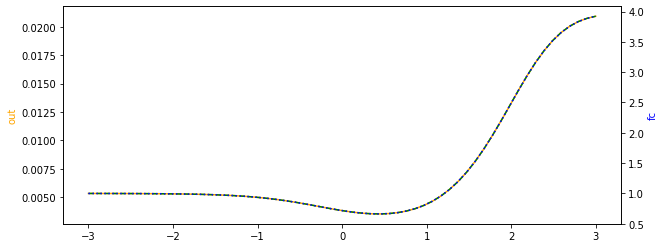

22.662189803140084,76.66488360977202,1.0,4256.550040838436,1.0,9093.309927709395,1.0,80.50897716890462,95.41354528379003,305.4517756960521,3053.38268654946,0.05901376150347387,100.0
down_up


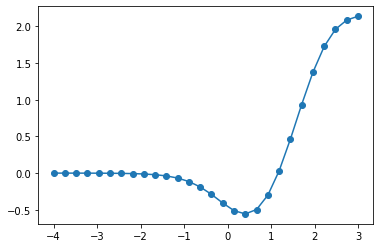

[('kb', 22.662189803140084), ('k_1_0', 1.0), ('kr_1_0', 80.50897716890462), ('kb', 22.662189803140084), ('k_2_0', 4256.550040838436), ('kr_2_0', 95.41354528379003), ('kb', 22.662189803140084), ('k_3_0', 1.0), ('kr_3_0', 305.4517756960521), ('kb', 22.662189803140084), ('k_4_0', 9093.309927709395), ('kr_4_0', 3053.38268654946), ('kb', 22.662189803140084), ('k_5_0', 1.0), ('ku', 76.66488360977202), ('k_1_1', 1.0), ('kr_1_1', 80.50897716890462), ('ku', 76.66488360977202), ('k_2_1', 251.19502893764144), ('kr_2_1', 95.41354528379003), ('ku', 76.66488360977202), ('k_3_1', 1.0), ('kr_3_1', 305.4517756960521), ('ku', 76.66488360977202), ('k_4_1', 909330.9927709395), ('kr_4_1', 3053.38268654946), ('ku', 76.66488360977202), ('k_5_1', 1.0)]
a parameter is out of bounds! [909330.99277094]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

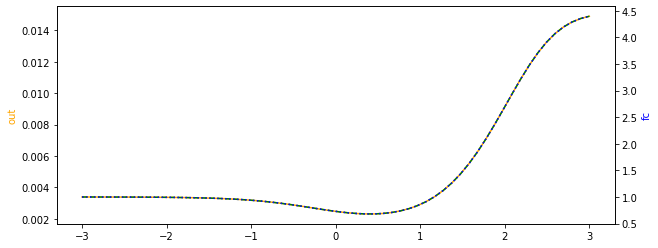

39.69605927734697,97.4476864064211,1.0,10000.0,1.0,10000.0,1.0,131.8044652061549,74.02541579067663,341.27390320769547,802.0341166746355,0.14441259054795663,100.0
down_up


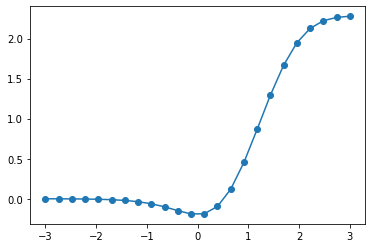

[('kb', 39.69605927734697), ('k_1_0', 1.0), ('kr_1_0', 131.8044652061549), ('kb', 39.69605927734697), ('k_2_0', 10000.0), ('kr_2_0', 74.02541579067663), ('kb', 39.69605927734697), ('k_3_0', 1.0), ('kr_3_0', 341.27390320769547), ('kb', 39.69605927734697), ('k_4_0', 10000.0), ('kr_4_0', 802.0341166746355), ('kb', 39.69605927734697), ('k_5_0', 1.0), ('ku', 97.4476864064211), ('k_1_1', 1.0), ('kr_1_1', 131.8044652061549), ('ku', 97.4476864064211), ('k_2_1', 1444.1259054795664), ('kr_2_1', 74.02541579067663), ('ku', 97.4476864064211), ('k_3_1', 1.0), ('kr_3_1', 341.27390320769547), ('ku', 97.4476864064211), ('k_4_1', 1000000.0), ('kr_4_1', 802.0341166746355), ('ku', 97.4476864064211), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

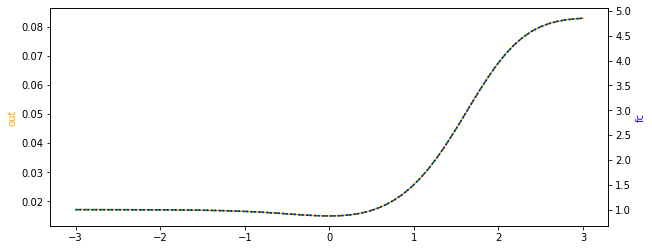

51.9094817887127,170.95600607234985,1.4994603587079562,10000.0,1.0,10000.0,1.0,66.9385507353347,778.3493629442985,279.75348857446255,2021.0207263474592,0.12429482936830852,100.0
down_up


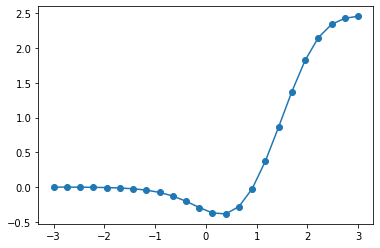

[('kb', 51.9094817887127), ('k_1_0', 1.4994603587079562), ('kr_1_0', 66.9385507353347), ('kb', 51.9094817887127), ('k_2_0', 10000.0), ('kr_2_0', 778.3493629442985), ('kb', 51.9094817887127), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 51.9094817887127), ('k_4_0', 10000.0), ('kr_4_0', 2021.0207263474592), ('kb', 51.9094817887127), ('k_5_0', 1.0), ('ku', 170.95600607234985), ('k_1_1', 1.4994603587079562), ('kr_1_1', 66.9385507353347), ('ku', 170.95600607234985), ('k_2_1', 1242.9482936830852), ('kr_2_1', 778.3493629442985), ('ku', 170.95600607234985), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 170.95600607234985), ('k_4_1', 1000000.0), ('kr_4_1', 2021.0207263474592), ('ku', 170.95600607234985), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

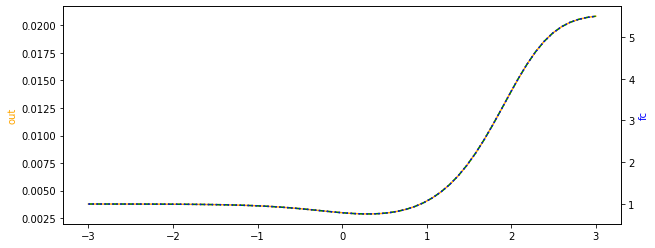

4.511849465673863,189.6683096457999,1.0,10000.0,1.0902344947416645,6166.639929593331,1.1247437134330875,173.95384222362702,493.0198154137913,804.2314738137209,559.8890150381894,0.14441259054795663,100.0
down_up


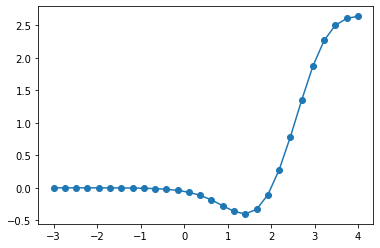

[('kb', 4.511849465673863), ('k_1_0', 1.0), ('kr_1_0', 173.95384222362702), ('kb', 4.511849465673863), ('k_2_0', 10000.0), ('kr_2_0', 493.0198154137913), ('kb', 4.511849465673863), ('k_3_0', 1.0902344947416645), ('kr_3_0', 804.2314738137209), ('kb', 4.511849465673863), ('k_4_0', 6166.639929593331), ('kr_4_0', 559.8890150381894), ('kb', 4.511849465673863), ('k_5_0', 1.1247437134330875), ('ku', 189.6683096457999), ('k_1_1', 1.0), ('kr_1_1', 173.95384222362702), ('ku', 189.6683096457999), ('k_2_1', 1444.1259054795664), ('kr_2_1', 493.0198154137913), ('ku', 189.6683096457999), ('k_3_1', 1.0902344947416645), ('kr_3_1', 804.2314738137209), ('ku', 189.6683096457999), ('k_4_1', 616663.9929593331), ('kr_4_1', 559.8890150381894), ('ku', 189.6683096457999), ('k_5_1', 1.1247437134330875)]
a parameter is out of bounds! [616663.99295933]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

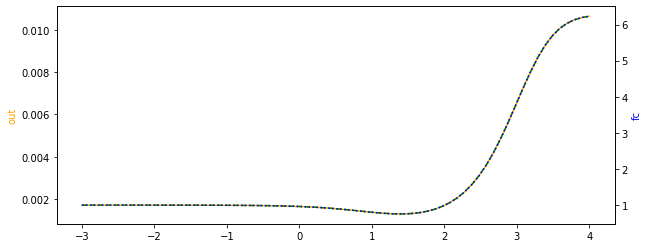

66.07982534214098,112.06914882217605,1.502876807397591,10000.0,1.0,10000.0,1.0,66.9385507353347,470.6747063822624,279.75348857446255,2553.9284344765683,0.12527584767416644,100.0
down_up


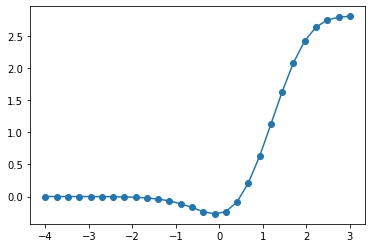

[('kb', 66.07982534214098), ('k_1_0', 1.502876807397591), ('kr_1_0', 66.9385507353347), ('kb', 66.07982534214098), ('k_2_0', 10000.0), ('kr_2_0', 470.6747063822624), ('kb', 66.07982534214098), ('k_3_0', 1.0), ('kr_3_0', 279.75348857446255), ('kb', 66.07982534214098), ('k_4_0', 10000.0), ('kr_4_0', 2553.9284344765683), ('kb', 66.07982534214098), ('k_5_0', 1.0), ('ku', 112.06914882217605), ('k_1_1', 1.502876807397591), ('kr_1_1', 66.9385507353347), ('ku', 112.06914882217605), ('k_2_1', 1252.7584767416645), ('kr_2_1', 470.6747063822624), ('ku', 112.06914882217605), ('k_3_1', 1.0), ('kr_3_1', 279.75348857446255), ('ku', 112.06914882217605), ('k_4_1', 1000000.0), ('kr_4_1', 2553.9284344765683), ('ku', 112.06914882217605), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

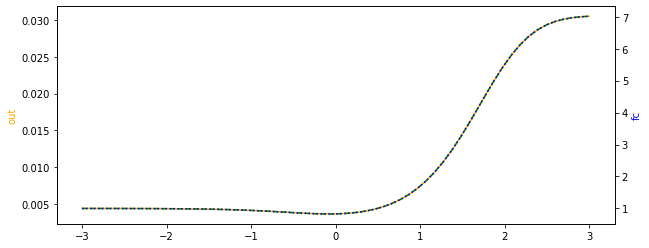

1.0,274.987320884883,1.0,10000.0,1.0,10000.0,1.0,271.4250043952206,433.5437432951486,2303.994631311177,462.9798895070662,0.1490288191290283,100.0
down_up


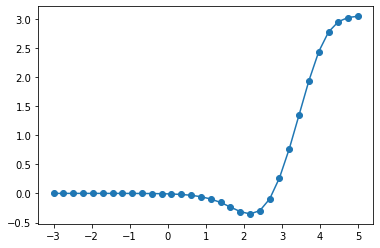

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 271.4250043952206), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 433.5437432951486), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 2303.994631311177), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 274.987320884883), ('k_1_1', 1.0), ('kr_1_1', 271.4250043952206), ('ku', 274.987320884883), ('k_2_1', 1490.2881912902828), ('kr_2_1', 433.5437432951486), ('ku', 274.987320884883), ('k_3_1', 1.0), ('kr_3_1', 2303.994631311177), ('ku', 274.987320884883), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 274.987320884883), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

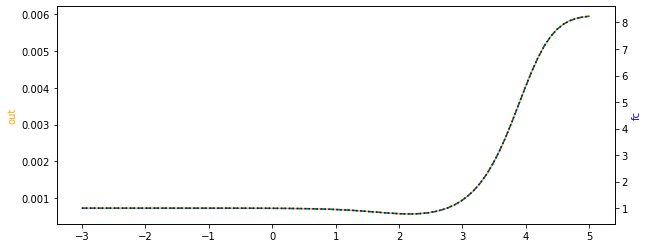

1.0,172.31167751793174,1.0,10000.0,1.4050218446608003,10000.0,1.0,83.9417719439,646.6851897140036,1060.3926751968331,2123.121704418326,0.12429482936830852,100.0
down_up


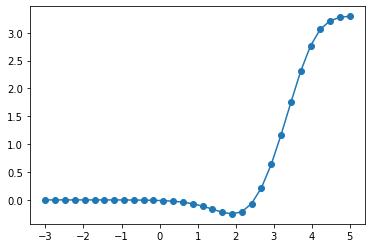

[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 83.9417719439), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 646.6851897140036), ('kb', 1.0), ('k_3_0', 1.4050218446608003), ('kr_3_0', 1060.3926751968331), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 2123.121704418326), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 172.31167751793174), ('k_1_1', 1.0), ('kr_1_1', 83.9417719439), ('ku', 172.31167751793174), ('k_2_1', 1242.9482936830852), ('kr_2_1', 646.6851897140036), ('ku', 172.31167751793174), ('k_3_1', 1.4050218446608003), ('kr_3_1', 1060.3926751968331), ('ku', 172.31167751793174), ('k_4_1', 1000000.0), ('kr_4_1', 2123.121704418326), ('ku', 172.31167751793174), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

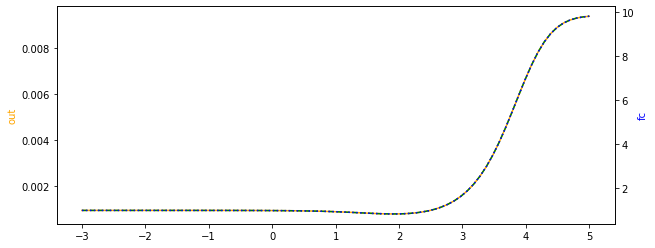

126.26739549872198,387.5308711364214,1.0,10000.0,1.0,10000.0,1.0,151.80276757152185,257.1931978177812,4360.38028404186,462.9798895070662,0.1490288191290283,100.0
down_up


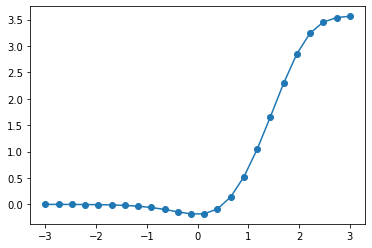

[('kb', 126.26739549872198), ('k_1_0', 1.0), ('kr_1_0', 151.80276757152185), ('kb', 126.26739549872198), ('k_2_0', 10000.0), ('kr_2_0', 257.1931978177812), ('kb', 126.26739549872198), ('k_3_0', 1.0), ('kr_3_0', 4360.38028404186), ('kb', 126.26739549872198), ('k_4_0', 10000.0), ('kr_4_0', 462.9798895070662), ('kb', 126.26739549872198), ('k_5_0', 1.0), ('ku', 387.5308711364214), ('k_1_1', 1.0), ('kr_1_1', 151.80276757152185), ('ku', 387.5308711364214), ('k_2_1', 1490.2881912902828), ('kr_2_1', 257.1931978177812), ('ku', 387.5308711364214), ('k_3_1', 1.0), ('kr_3_1', 4360.38028404186), ('ku', 387.5308711364214), ('k_4_1', 1000000.0), ('kr_4_1', 462.9798895070662), ('ku', 387.5308711364214), ('k_5_1', 1.0)]
a parameter is out of bounds! [1000000.]
.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,

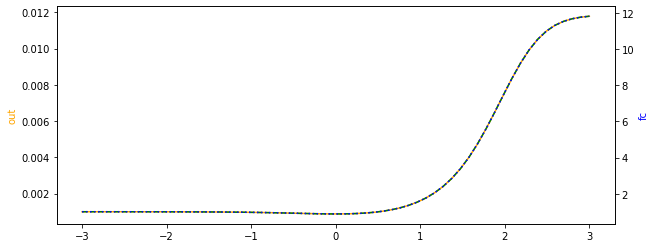

In [36]:
for idx in idxs_left[::50]:
    df_row=df.iloc[idx]
    col=df_row["col"]
    row=df_row["row"]

    parset=df_row["parameters"].copy()
    print(",".join(map(str,parset)))
    
    kwargs=dict(tol=1e-5,check_out0=False,out0_tol=0.001,fc_tol=0.070389327891398,verbose=True)#used in the run, adding verbose=True

    score_,f,Amin,Amax,n=score(parset,return_fullpars=return_fullpars, ssfunc=ssfunc,scoref=get_score_up_down_v2,plot=True,n=None,Amin=None,Amax=None,log2out=True,returnout=True,**kwargs)

    
    fullpars=return_fullpars_polcycle(parset,model=model,transitions=transitions,verbose=True)
    if np.any(fullpars>10**4):
        print("a parameter is out of bounds!",fullpars[fullpars>10**4])
    out0=ssfunc(fullpars,np.array([0])) #basal expression, in the absence of TF
    score_l=[]
    n_per_om=10
    n=None
    Amin=None
    Amax=None
    tol_A=0.01
    if not Amin:
        Amin=1e-3
        #first find Amin and Amax such that function starts at 0 and is saturated
        Amin_found=False
        i=0
        while ((Amin_found is False) and (i<20)):
            outA0=ssfunc(fullpars,np.array([Amin]))
            if np.abs(np.log2(outA0/out0))<tol_A:
                Amin_found=True
                #print("when Amin is found", np.log2(outA0/out0))
            else:
                Amin=Amin/10
                i+=1
        if not Amin_found:
            #print("failed to get Amin",out0, outA0)
            score_l=[np.NaN,np.NaN]
    if not Amax:
        #print("searching Amax")
        Amax=1e3
        Amax_found=False
        outinf25=ssfunc(fullpars,np.array([1e25])) #very saturated expression
        outinf30=ssfunc(fullpars,np.array([1e30])) 
        if np.abs(np.log2(outinf30/outinf25))>tol_A:
            #print("not saturated at 30:", outinf25, outinf30)
            score_l=[np.NaN,np.NaN]

        if len(score_l)==0:
            i=0
            while ((Amax_found is False) and (i<20)):
                outAm=ssfunc(fullpars,np.array([Amax]))
                if np.abs(np.log2(outAm/outinf30))<tol_A:
                    Amax_found=True
                else:
                    Amax=Amax*10
                    i+=1
            if not Amax_found:
                #print("failed to get Amax", outinf30, outAm)
                score_l=[np.NaN,np.NaN]
    if len(score_l)==0 or plot:
        if not n:
            log10Amin=np.log10(Amin)
            log10Amax=np.log10(Amax)
            orders_m=log10Amax-log10Amin
            n=int(n_per_om*np.ceil(orders_m))
        Avals=np.logspace(log10Amin,log10Amax,n)

        #print(len(Avals))
        out=np.zeros(len(Avals))
        for a in range(n):
            A=Avals[a]
            out[a]=ssfunc(fullpars,np.array([A]))
        fig,ax=plt.subplots(1,1,figsize=(10,4))
        ax.plot(np.log10(Avals),out,linestyle="-",color="orange")
        ax.set_ylabel("out",color="orange")
        ax2=ax.twinx()
        ax2.plot(np.log10(Avals),out/out0,linestyle=":",color="b")
        ax2.set_ylabel("fc", color="b")
        
        newss=np.zeros(n)
        for a in range(n):
            A=Avals[a]
            newss[a]=compute_ss_fromL_model5_1234(fullpars,A)
        ax.plot(np.log10(Avals),newss,linestyle="--",color="green")
        plt.show()
            
            
            
    

Now doublecheck a few:

In [8]:
case="model=5_1234_t=2f,4f_d=m_p"
model,transitions,direction=mypat.findall(case)[0]
transitions=transitions.split(",")
ccode=state5_rev1234_prec100
ssfunc=ccode.interfacess


Note that k_4_1 is going out of bounds for these three, but still look at it:

In [19]:
parset=np.array([1.0,55.86178120701407,1.0960921453965315,10000.0,1.0,4125.622651286843,1.0,78.26925257488543,717.704252809036,1800.9438704650518,327.73265036982673,0.03376629712124814,100.0])
fullpars=return_fullpars_polcycle(parset,model=model,transitions=transitions,verbose=True)


[('kb', 1.0), ('k_1_0', 1.0960921453965315), ('kr_1_0', 78.26925257488543), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 717.704252809036), ('kb', 1.0), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 4125.622651286843), ('kr_4_0', 327.73265036982673), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 55.86178120701407), ('k_1_1', 1.0960921453965315), ('kr_1_1', 78.26925257488543), ('ku', 55.86178120701407), ('k_2_1', 337.66297121248135), ('kr_2_1', 717.704252809036), ('ku', 55.86178120701407), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 55.86178120701407), ('k_4_1', 412562.26512868435), ('kr_4_1', 327.73265036982673), ('ku', 55.86178120701407), ('k_5_1', 1.0)]


In [20]:
parset=np.array([9.951070416335623,57.804682764678034,1.0696319021197915,10000.0,1.0,5265.030478186435,1.0,160.78577041126485,269.16644852276266,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0])
fullpars=return_fullpars_polcycle(parset,model=model,transitions=transitions,verbose=True)


[('kb', 9.951070416335623), ('k_1_0', 1.0696319021197915), ('kr_1_0', 160.78577041126485), ('kb', 9.951070416335623), ('k_2_0', 10000.0), ('kr_2_0', 269.16644852276266), ('kb', 9.951070416335623), ('k_3_0', 1.0), ('kr_3_0', 1800.9438704650518), ('kb', 9.951070416335623), ('k_4_0', 5265.030478186435), ('kr_4_0', 271.88894705435655), ('kb', 9.951070416335623), ('k_5_0', 1.0), ('ku', 57.804682764678034), ('k_1_1', 1.0696319021197915), ('kr_1_1', 160.78577041126485), ('ku', 57.804682764678034), ('k_2_1', 337.66297121248135), ('kr_2_1', 269.16644852276266), ('ku', 57.804682764678034), ('k_3_1', 1.0), ('kr_3_1', 1800.9438704650518), ('ku', 57.804682764678034), ('k_4_1', 526503.0478186435), ('kr_4_1', 271.88894705435655), ('ku', 57.804682764678034), ('k_5_1', 1.0)]


In [21]:
parset=np.array([1.0,34.31887769437997,1.0,10000.0,3.595166659250405,10000.0,1.0,50.97556594464973,271.481309364169,1800.9438704650518,271.88894705435655,0.03376629712124814,100.0])
fullpars=return_fullpars_polcycle(parset,model=model,transitions=transitions,verbose=True)


[('kb', 1.0), ('k_1_0', 1.0), ('kr_1_0', 50.97556594464973), ('kb', 1.0), ('k_2_0', 10000.0), ('kr_2_0', 271.481309364169), ('kb', 1.0), ('k_3_0', 3.595166659250405), ('kr_3_0', 1800.9438704650518), ('kb', 1.0), ('k_4_0', 10000.0), ('kr_4_0', 271.88894705435655), ('kb', 1.0), ('k_5_0', 1.0), ('ku', 34.31887769437997), ('k_1_1', 1.0), ('kr_1_1', 50.97556594464973), ('ku', 34.31887769437997), ('k_2_1', 337.66297121248135), ('kr_2_1', 271.481309364169), ('ku', 34.31887769437997), ('k_3_1', 3.595166659250405), ('kr_3_1', 1800.9438704650518), ('ku', 34.31887769437997), ('k_4_1', 1000000.0), ('kr_4_1', 271.88894705435655), ('ku', 34.31887769437997), ('k_5_1', 1.0)]
